In [6]:
!pip install mistralai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.5/301.5 kB 10.8 MB/s eta 0:00:00


In [7]:
import os
from pathlib import Path
from mistralai import Mistral
from IPython.core.display import display, Markdown
from google.colab import userdata

In [8]:
api_key = userdata.get('Mistral_OCR')
client = Mistral(api_key=api_key)

In [9]:
pdf_path="/content/المغرب.pdf"
uploaded_pdf = client.files.upload(
    file={
        "file_name": pdf_path,
        "content": open(pdf_path, "rb"),
    },
    purpose="ocr"
)

In [10]:
client.files.retrieve(file_id=uploaded_pdf.id)

RetrieveFileOut(id='3a26ae88-b5be-49a0-ba1f-dcff96a1b862', object='file', size_bytes=5437448, created_at=1746102408, filename='المغرب.pdf', purpose='ocr', sample_type='ocr_input', source='upload', deleted=False, num_lines=1)

In [11]:
signed_url = client.files.get_signed_url(file_id=uploaded_pdf.id)

In [12]:
ocr_response = client.ocr.process(
    model="mistral-ocr-latest",
    document={
        "type": "document_url",
        "document_url": signed_url.url,
    },
    include_image_base64=True
)

OCRResponse(pages=[OCRPageObject(index=0, markdown='# (ا) $\\cdot$ $\\cdot$ \n\n![img-0.jpeg](img-0.jpeg)', images=[OCRImageObject(id='img-0.jpeg', top_left_x=137, top_left_y=454, bottom_right_x=1506, bottom_right_y=2185, image_base64='')], dimensions=OCRPageDimensions(dpi=200, height=2342, width=1656)), OCRPageObject(index=1, markdown='| نسبة المياه (%) | 0,056 (250 كم^{2})^{[4]} |\n| عاصمة | الرباط |\n| اللغة الرسمية | اللغة العربية، اللغة الأمازيغية^{[5]} |\n| المجموعات العرقية (2021) | عرب وأمازيغ 99%، آخرون 1%^{[4]} |\n| تسمية السكان | مغاربة |\n| التعداد السكاني (2024) | 36,828,33 ^{[6]} نسمة (39) |\n| الذكور | 18281786 (2019)^{[7]} |\n|  | 18474956 (2020)^{[7]} |\n|  | 18665663 (2021)^{[7]} |\n|  | 18852368 (2022)^{[7]} |\n| الإناث | 18022621 (2019)^{[7]} |\n|  | 18213816 (2020)^{[7]} |\n|  | 18410922 (2021)^{[7]} |\n|  | 18605603 (2022)^{[7]} |\n| عدد الأسر | 9275038 (2024)^{[8]} |\n| عدد سكان الحضر | 22869599 (2019)^{[7]} |\n|  | 23309111 (2020)^{[7]} |\n|  | 23753114 (2021)^{
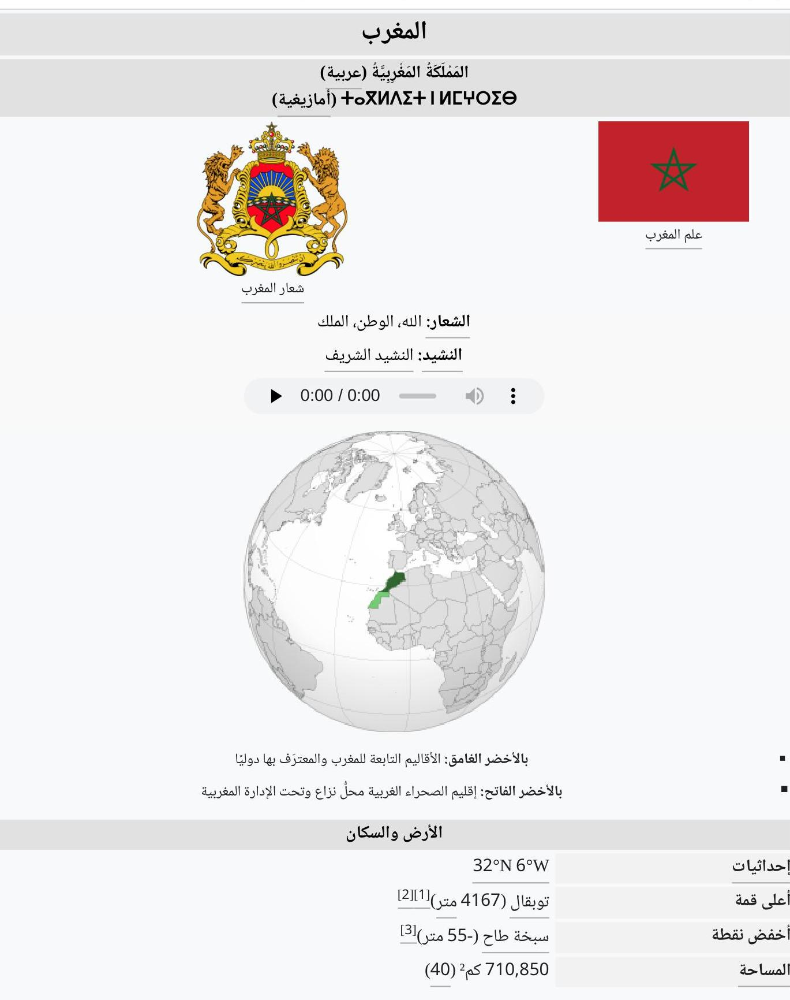
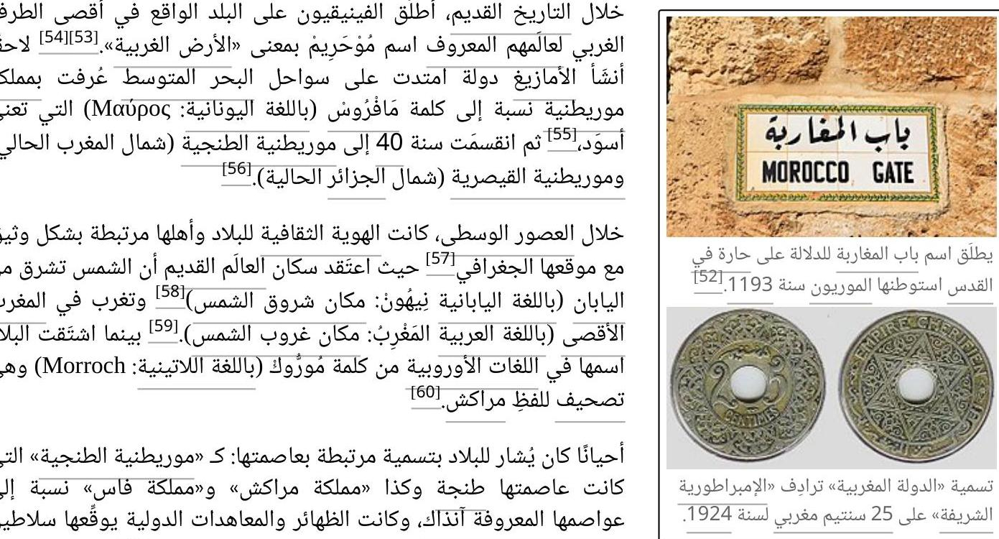
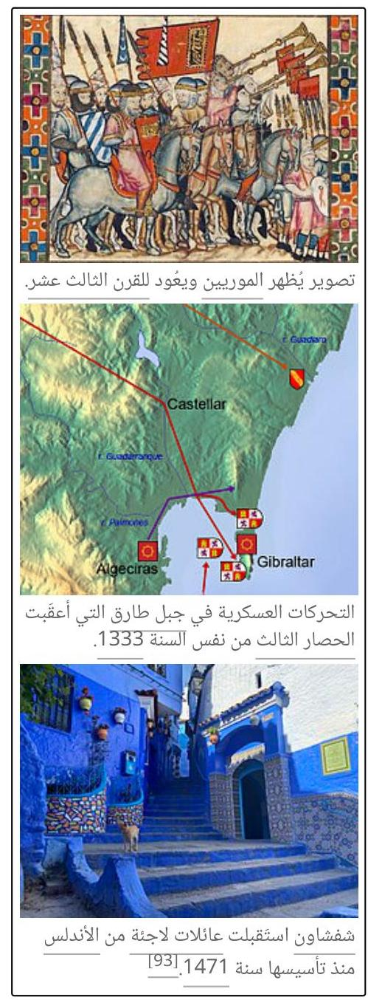
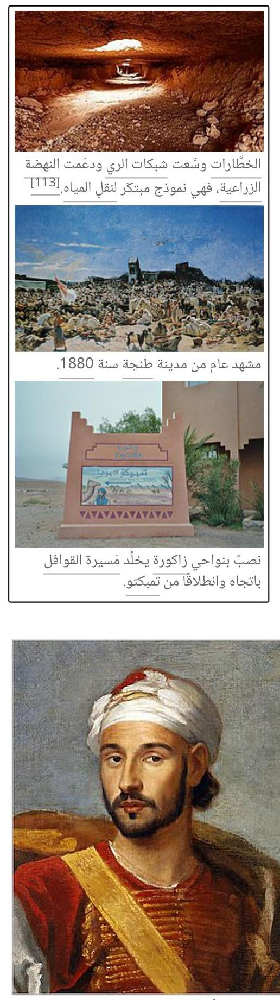
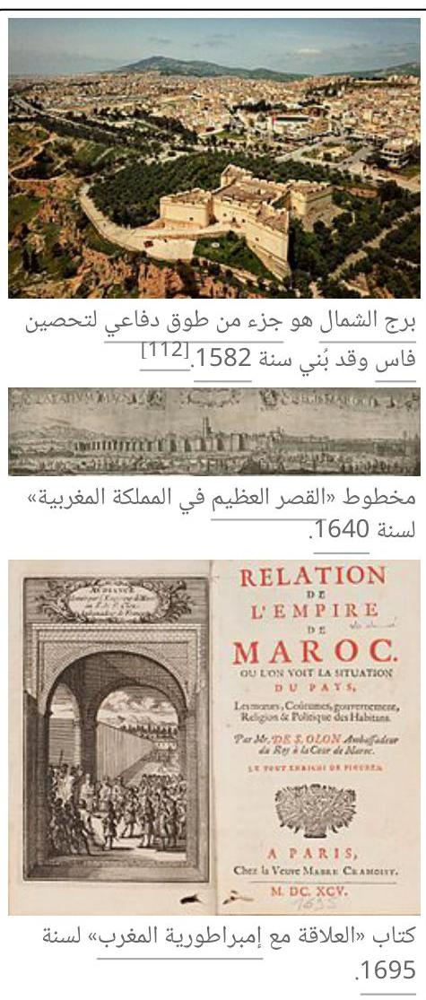
...
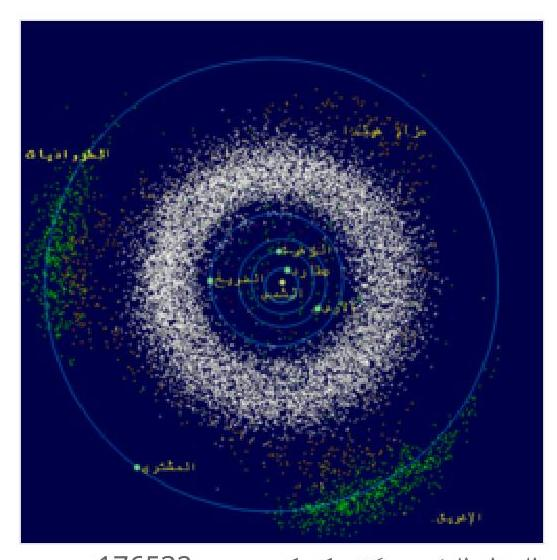
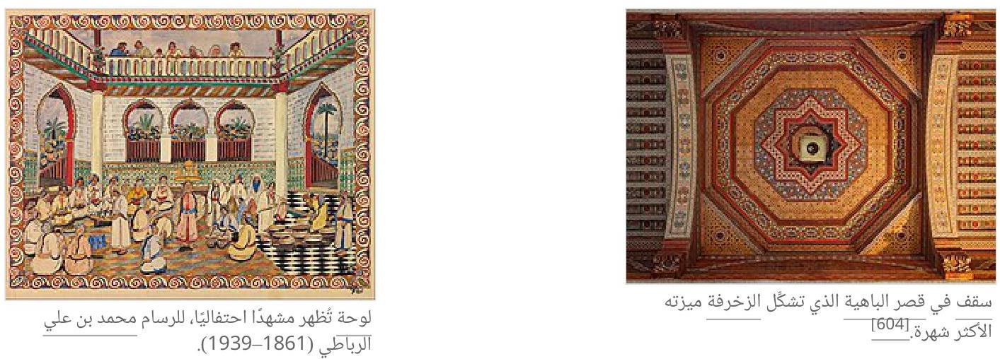
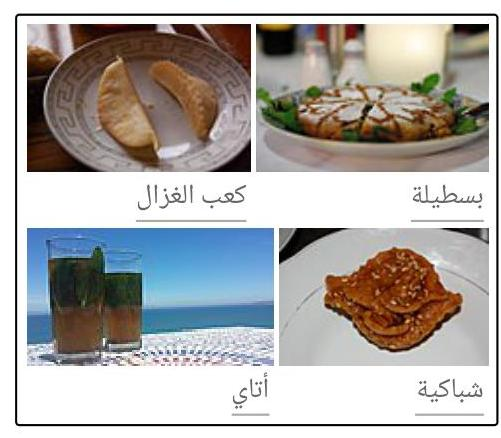
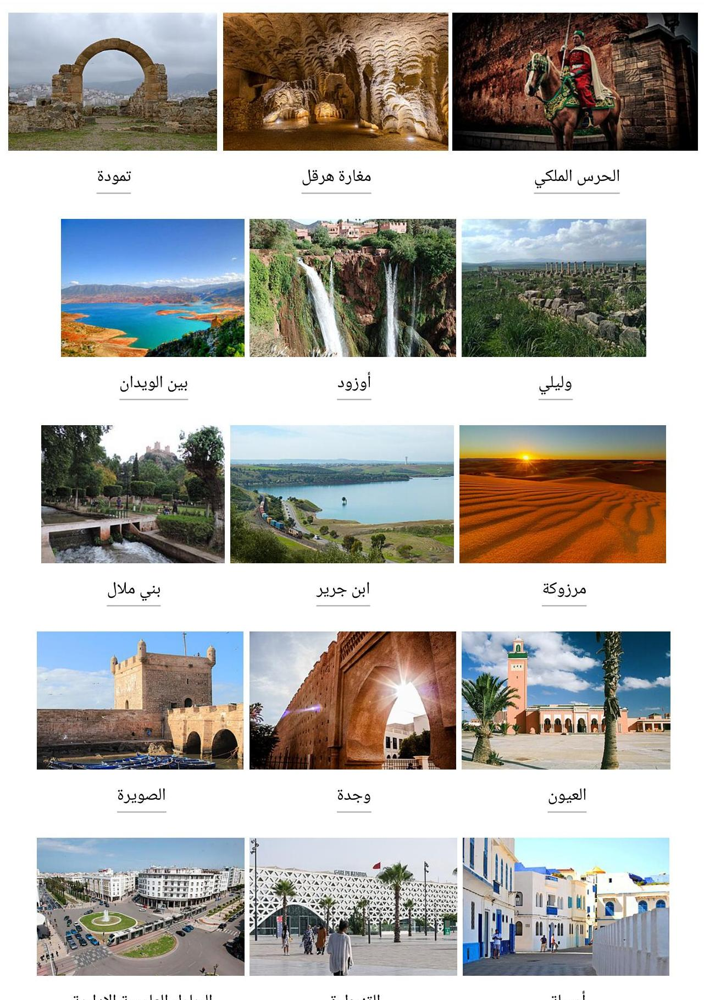
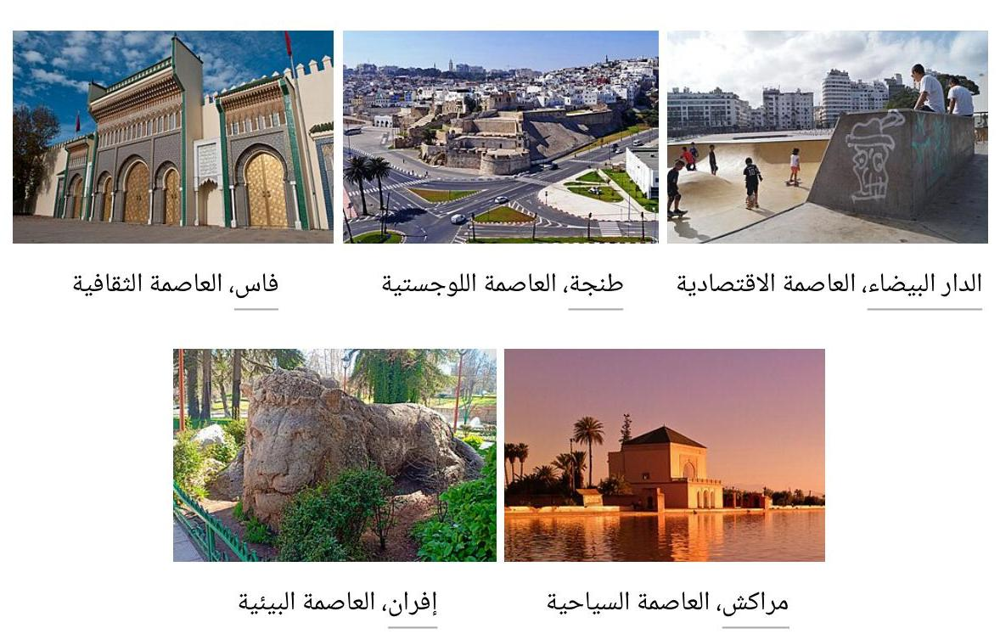

In [13]:
ocr_response

In [14]:
ocr_response.model

'mistral-ocr-2503-completion'

In [15]:
ocr_response.usage_info

OCRUsageInfo(pages_processed=44, doc_size_bytes=5437448)

[OCRPageObject(index=0, markdown='# (ا) $\\cdot$ $\\cdot$ \n\n![img-0.jpeg](img-0.jpeg)', images=[OCRImageObject(id='img-0.jpeg', top_left_x=137, top_left_y=454, bottom_right_x=1506, bottom_right_y=2185, image_base64='')], dimensions=OCRPageDimensions(dpi=200, height=2342, width=1656)),
 OCRPageObject(index=1, markdown='| نسبة المياه (%) | 0,056 (250 كم^{2})^{[4]} |\n| عاصمة | الرباط |\n| اللغة الرسمية | اللغة العربية، اللغة الأمازيغية^{[5]} |\n| المجموعات العرقية (2021) | عرب وأمازيغ 99%، آخرون 1%^{[4]} |\n| تسمية السكان | مغاربة |\n| التعداد السكاني (2024) | 36,828,33 ^{[6]} نسمة (39) |\n| الذكور | 18281786 (2019)^{[7]} |\n|  | 18474956 (2020)^{[7]} |\n|  | 18665663 (2021)^{[7]} |\n|  | 18852368 (2022)^{[7]} |\n| الإناث | 18022621 (2019)^{[7]} |\n|  | 18213816 (2020)^{[7]} |\n|  | 18410922 (2021)^{[7]} |\n|  | 18605603 (2022)^{[7]} |\n| عدد الأسر | 9275038 (2024)^{[8]} |\n| عدد سكان الحضر | 22869599 (2019)^{[7]} |\n|  | 23309111 (2020)^{[7]} |\n|  | 23753114 (2021)^{[7]} |\n|  | 2419
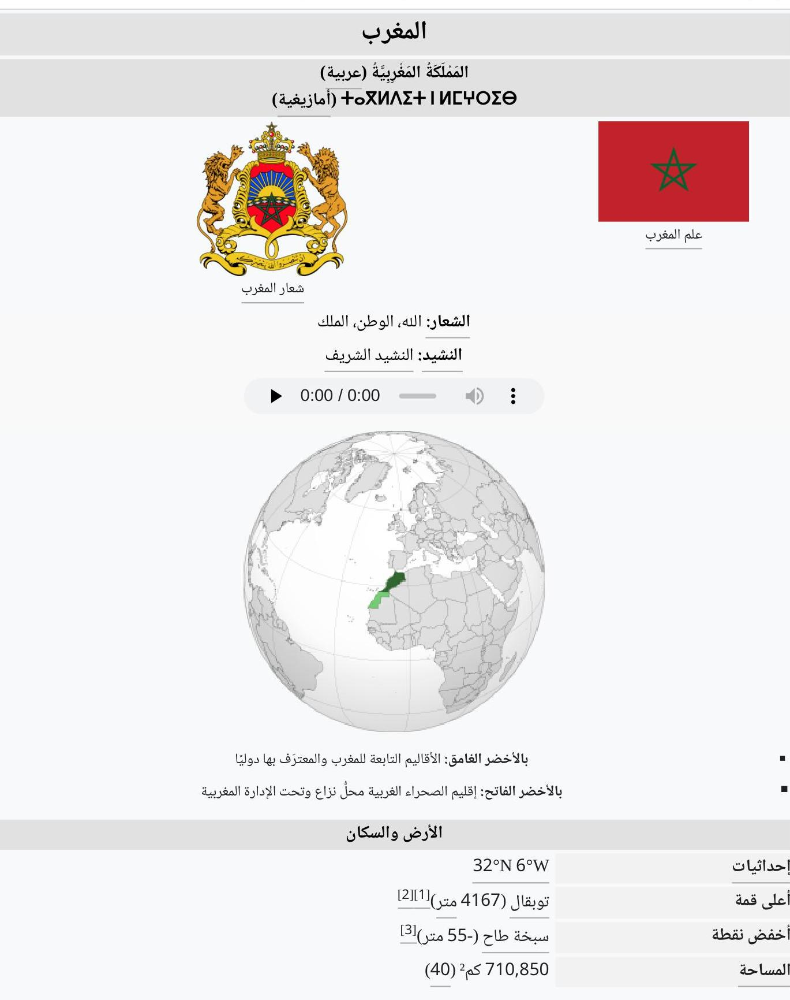
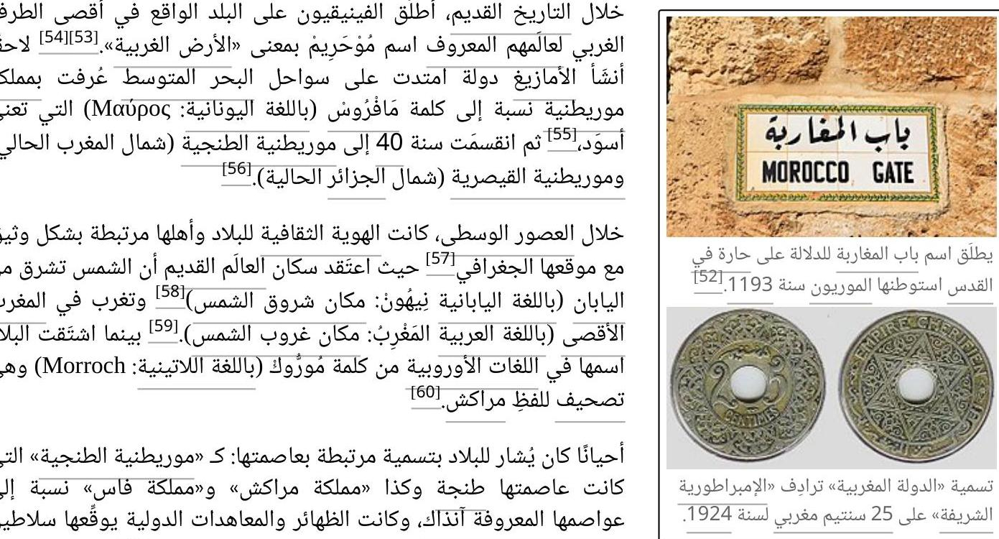
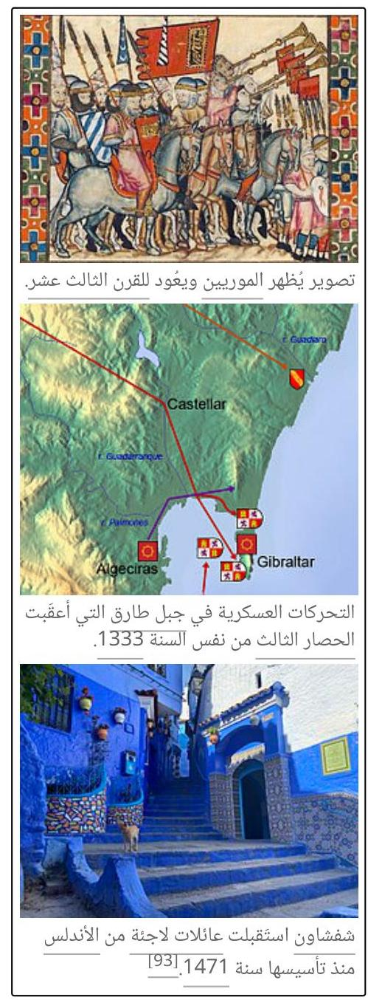
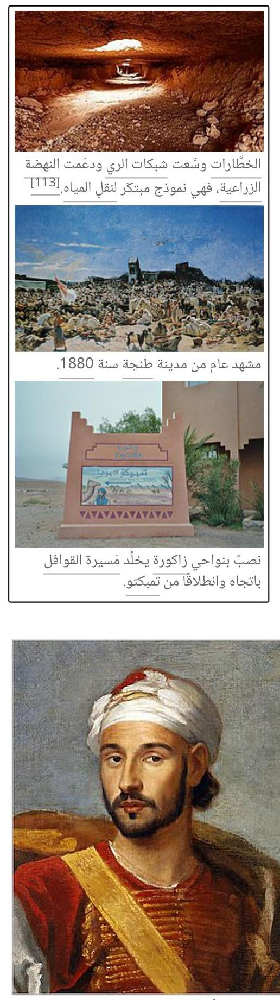
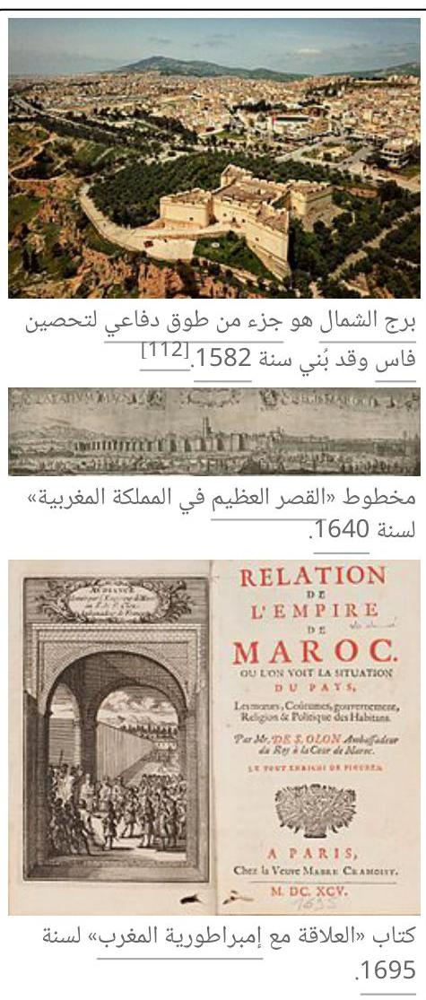
...
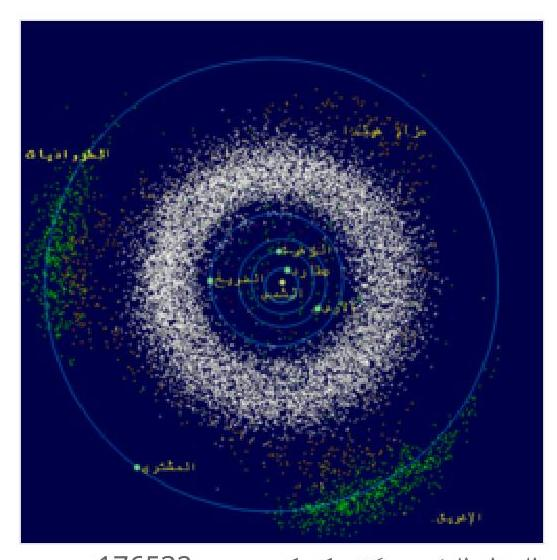
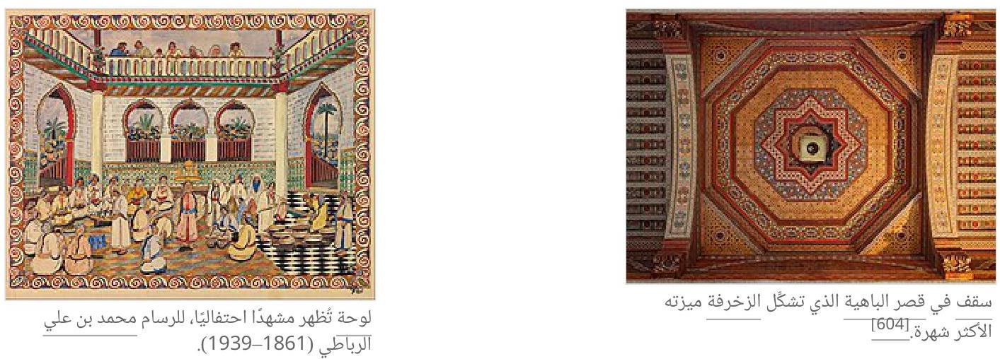
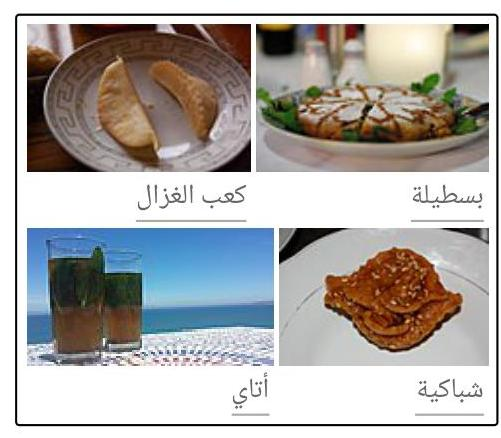
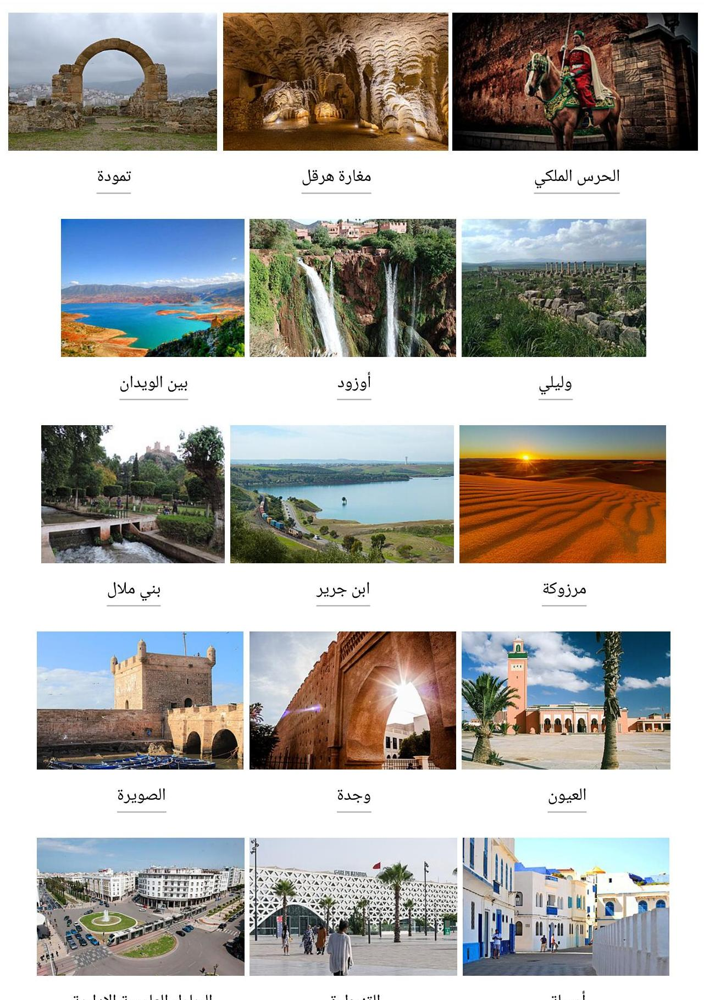
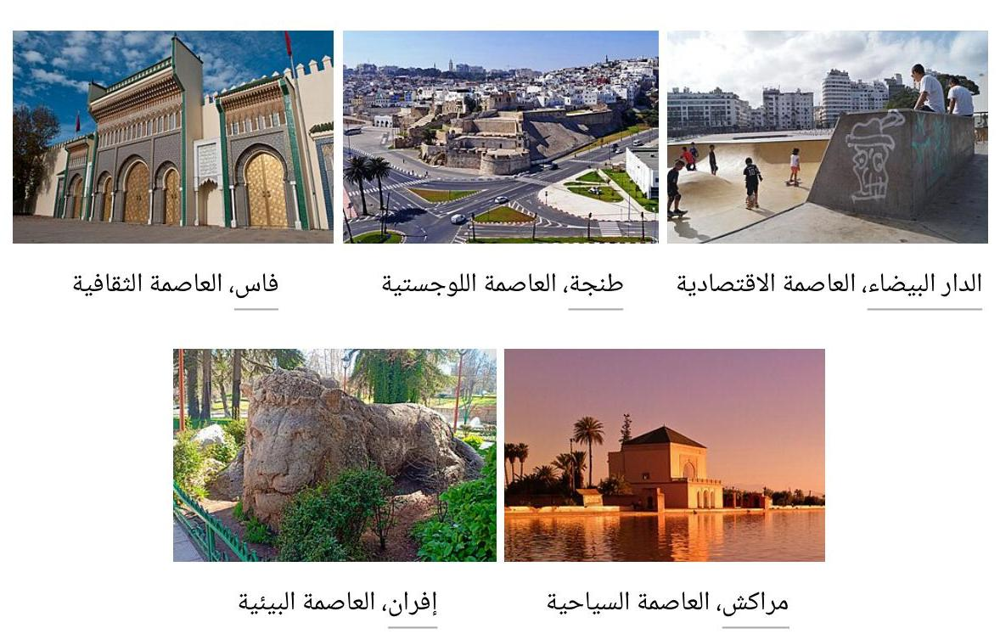

In [16]:
ocr_response.pages

OCRPageObject(index=0, markdown='# (ا) $\\cdot$ $\\cdot$ \n\n![img-0.jpeg](img-0.jpeg)', images=[OCRImageObject(id='img-0.jpeg', top_left_x=137, top_left_y=454, bottom_right_x=1506, bottom_right_y=2185, image_base64='')], dimensions=OCRPageDimensions(dpi=200, height=2342, width=1656))
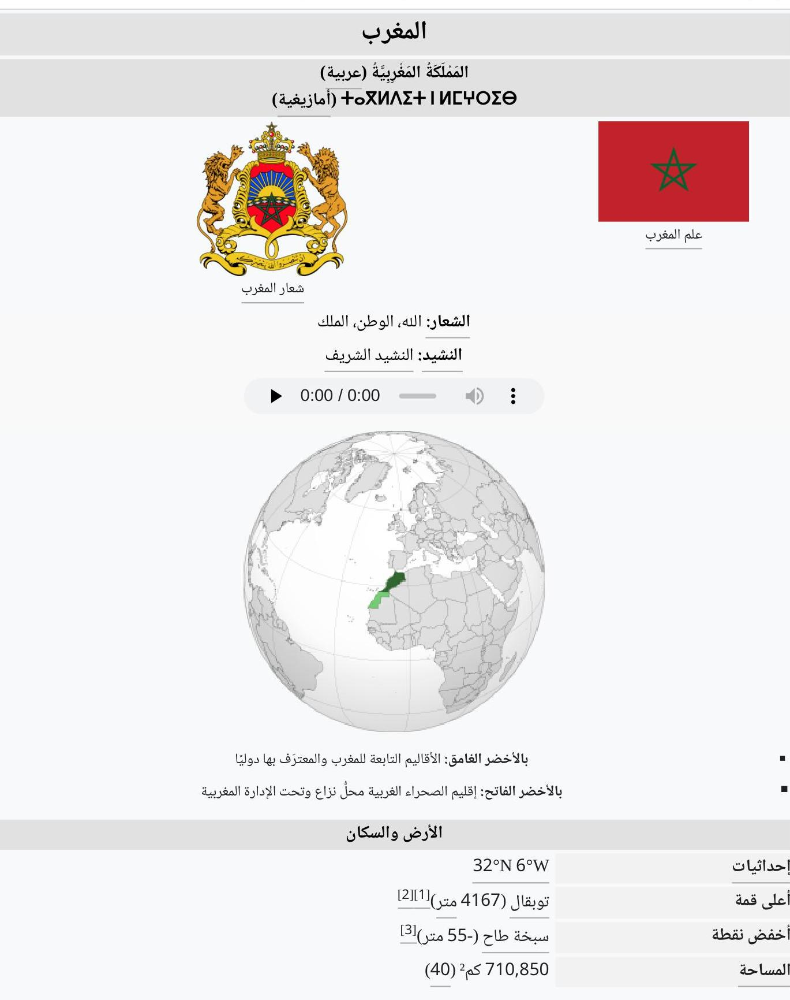

In [17]:
ocr_response.pages[0]

In [18]:
ocr_response.pages[0].markdown

'# (ا) $\\cdot$ $\\cdot$ \n\n![img-0.jpeg](img-0.jpeg)'

[OCRImageObject(id='img-0.jpeg', top_left_x=137, top_left_y=454, bottom_right_x=1506, bottom_right_y=2185, image_base64='')]
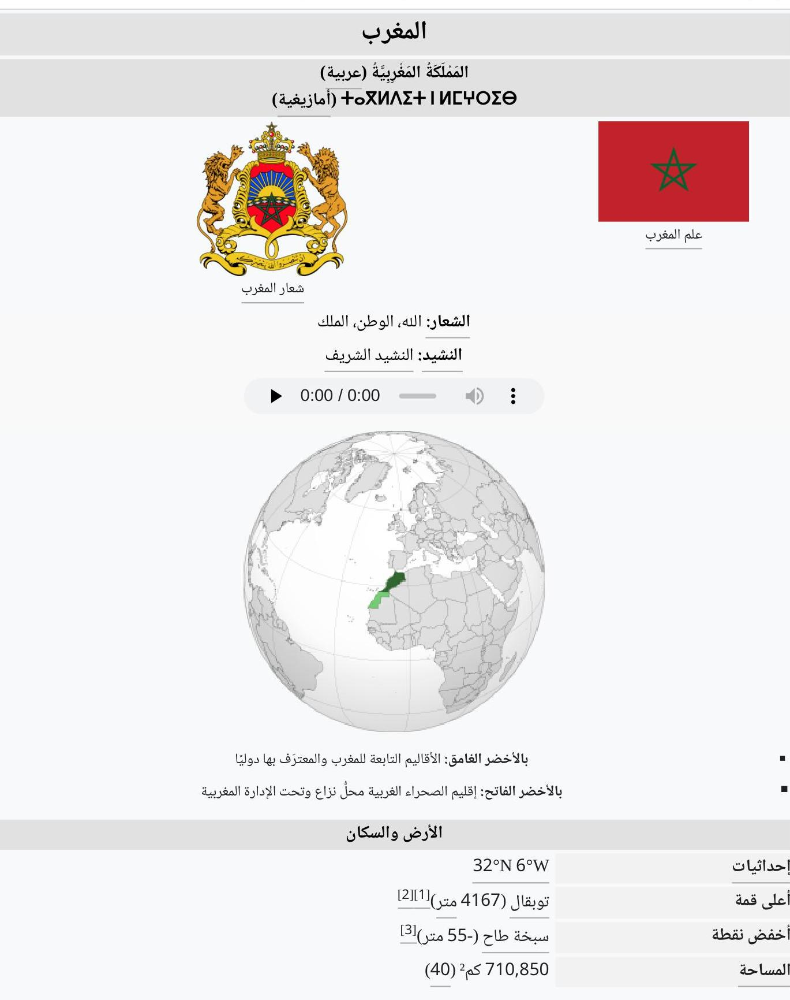

In [19]:
ocr_response.pages[0].images

In [20]:
import base64

# Initialize an empty dictionary to store the image ID and its base64 value
image_base64_dict = {}

# Loop through each page in the OCR response
for i in range(len(ocr_response.pages)):
    for image_obj in ocr_response.pages[i].images:
        image_id = image_obj.id  # Get the image ID (e.g., 'img-0.jpeg')

        # Extract base64 string (remove the 'data:image/...;base64,' prefix)
        base64_data = image_obj.image_base64.split(",")[-1]

        # Add the image ID and base64 string to the dictionary
        image_base64_dict[image_id] = f'b-{base64_data}'

        # Decode the base64 string
        image_bytes = base64.b64decode(base64_data)

        # Save the image with its ID as the filename
        with open(image_id, "wb") as image_file:
            image_file.write(image_bytes)

        print(f"Saved: {image_id}")

Saved: img-0.jpeg
Saved: img-1.jpeg
Saved: img-2.jpeg
Saved: img-3.jpeg
Saved: img-4.jpeg
Saved: img-5.jpeg
Saved: img-6.jpeg
Saved: img-7.jpeg
Saved: img-8.jpeg
Saved: img-9.jpeg
Saved: img-10.jpeg
Saved: img-11.jpeg
Saved: img-12.jpeg
Saved: img-13.jpeg
Saved: img-14.jpeg
Saved: img-15.jpeg
Saved: img-16.jpeg
Saved: img-17.jpeg
Saved: img-18.jpeg
Saved: img-19.jpeg
Saved: img-20.jpeg
Saved: img-21.jpeg
Saved: img-22.jpeg
Saved: img-23.jpeg
Saved: img-24.jpeg
Saved: img-25.jpeg
Saved: img-26.jpeg
Saved: img-27.jpeg
Saved: img-28.jpeg


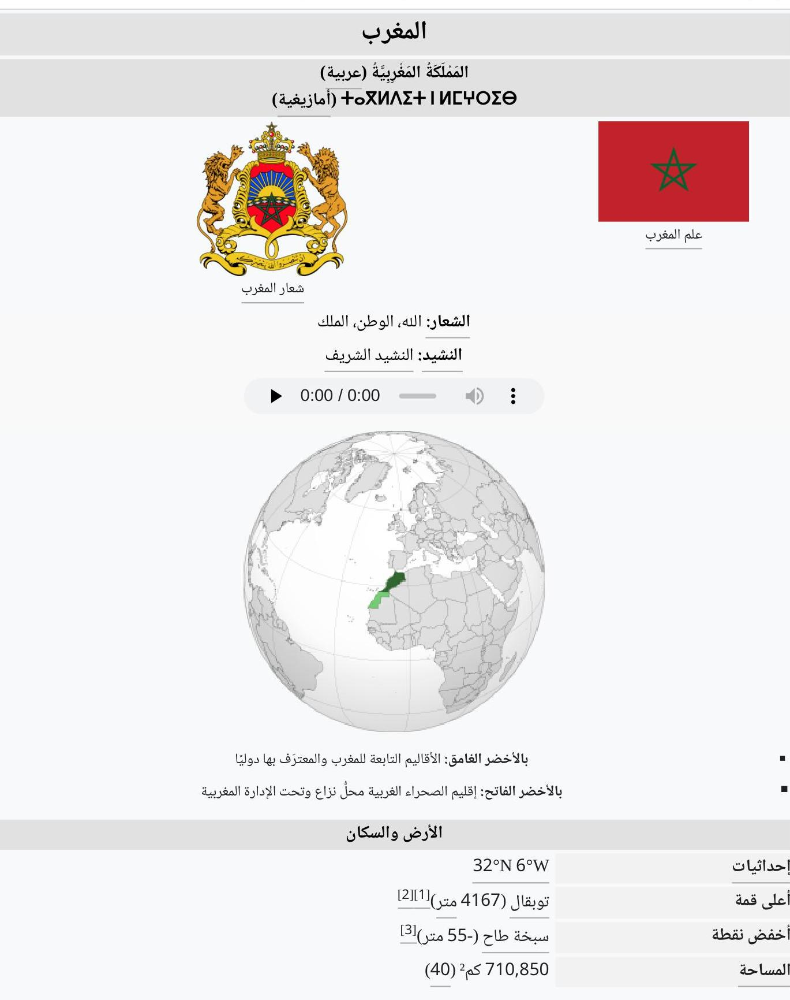

In [21]:
from IPython.display import Image
Image('/content/img-0.jpeg')

In [26]:
import re
import base64
from IPython.display import display, Markdown

def detect_image_format(base64_data):
    """Détecte le format d'une image à partir de ses données Base64."""
    try:
        img_data = base64.b64decode(base64_data)
        if img_data.startswith(b'\x89PNG'):
            return 'png'
        elif img_data.startswith(b'\xff\xd8'):
            return 'jpeg'
        elif img_data.startswith(b'GIF89a') or img_data.startswith(b'GIF87a'):
            return 'gif'
        return 'png'  # Valeur par défaut si inconnu
    except:
        return None

def replace_images_in_markdown_for_all_pages(ocr_response):
    # Vérifier que ocr_response et pages existent
    if not hasattr(ocr_response, 'pages') or not ocr_response.pages:
        print("Erreur : ocr_response.pages est vide ou non défini.")
        return

    for i, page in enumerate(ocr_response.pages):
        # Vérifier que markdown et images existent
        if not hasattr(page, 'markdown') or not hasattr(page, 'images'):
            print(f"Erreur : page {i} n'a pas de markdown ou d'images.")
            continue

        markdown = page.markdown
        images = page.images

        # Créer un dictionnaire id -> (base64, format) pour les images
        image_base64_dict = {}
        for image in images:
            if not hasattr(image, 'id') or not hasattr(image, 'image_base64'):
                print(f"Image invalide dans la page {i}, ID: {getattr(image, 'id', 'inconnu')}")
                continue
            img_format = detect_image_format(image.image_base64)
            if img_format:
                image_base64_dict[image.id] = (image.image_base64, img_format)
            else:
                print(f"Format d'image non détecté pour l'image {image.id} dans la page {i}")

        # Fonction pour remplacer les références aux images
        def replace_image_reference(match):
            img_id = match.group(2)  # Récupérer l'ID de l'image
            if img_id in image_base64_dict:
                base64_data, img_format = image_base64_dict[img_id]
                return f'![{match.group(1)}](data:image/{img_format};base64,{base64_data})'
            print(f"Image {img_id} non trouvée dans la page {i}")
            return match.group(0)

        # Remplacer les références aux images
        updated_markdown = re.sub(r'!\[(.*?)\]\(([^)]+)\)', replace_image_reference, markdown)

        # Afficher le Markdown mis à jour
        try:
            print(f"Affichage de la page {i}")
            display(Markdown(updated_markdown))
        except Exception as e:
            print(f"Erreur lors de l'affichage du Markdown pour la page {i} : {e}")

# Exemple d'utilisation :
# replace_images_in_markdown_for_all_pages(ocr_response)

Affichage de la page 0


# (ا) $\cdot$ $\cdot$ 

![img-0.jpeg](data:image/png;base64,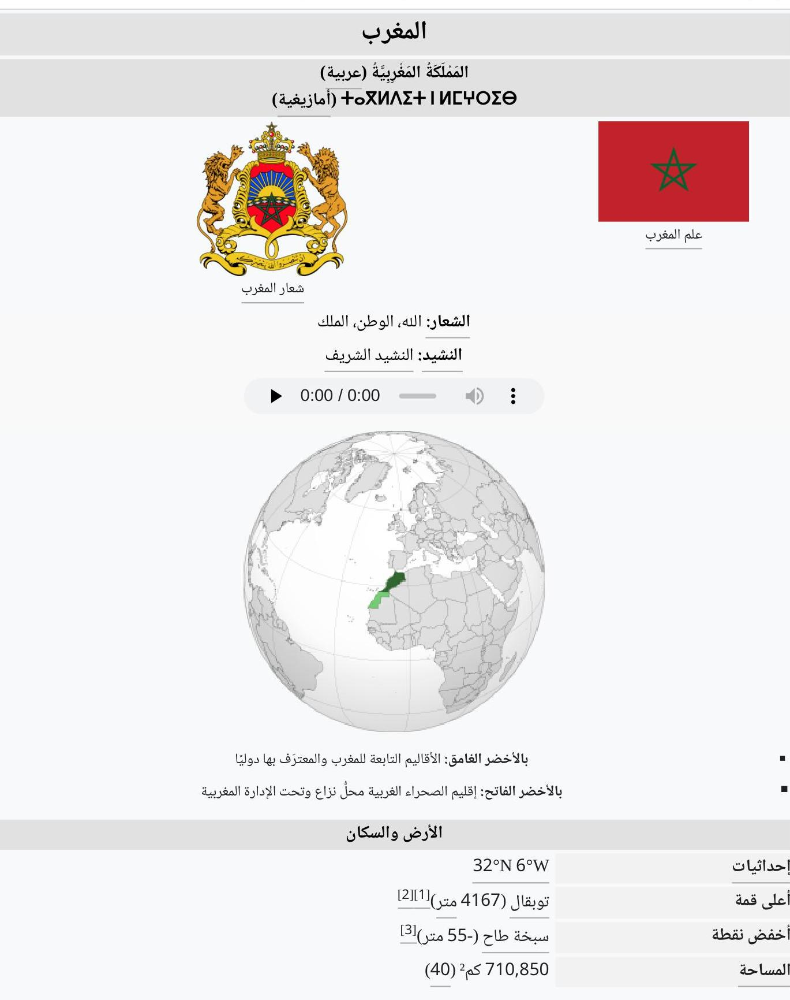)

Affichage de la page 1


| نسبة المياه (%) | 0,056 (250 كم^{2})^{[4]} |
| عاصمة | الرباط |
| اللغة الرسمية | اللغة العربية، اللغة الأمازيغية^{[5]} |
| المجموعات العرقية (2021) | عرب وأمازيغ 99%، آخرون 1%^{[4]} |
| تسمية السكان | مغاربة |
| التعداد السكاني (2024) | 36,828,33 ^{[6]} نسمة (39) |
| الذكور | 18281786 (2019)^{[7]} |
|  | 18474956 (2020)^{[7]} |
|  | 18665663 (2021)^{[7]} |
|  | 18852368 (2022)^{[7]} |
| الإناث | 18022621 (2019)^{[7]} |
|  | 18213816 (2020)^{[7]} |
|  | 18410922 (2021)^{[7]} |
|  | 18605603 (2022)^{[7]} |
| عدد الأسر | 9275038 (2024)^{[8]} |
| عدد سكان الحضر | 22869599 (2019)^{[7]} |
|  | 23309111 (2020)^{[7]} |
|  | 23753114 (2021)^{[7]} |
|  | 24196351 (2022)^{[7]} |
| عدد سكان الريف | 13434809 (2019)^{[7]} |
|  | 13379661 (2020)^{[7]} |
|  | 13323470 (2021)^{[7]} |
|  | 13261620 (2022)^{[7]} |
| متوسط العمر | 76.218 سنة (2017) ^{[9]} |
| الحكم |
| نظام الحكم | ملكية دستورية^{[10]} |
| الملك | محمد السادس |
| رئيس الحكومة | عزيز أخنوش |
| ولي العهد | الحسن بن محمد السادس |
| السلطة التشريعية | برلمان المغرب |
| السلطة القضائية | محكمة النقض |
| السلطة التنفيذية | حكومة المغرب |
| التأسيس والسيادة |
| التأسيس | سيادة |
| تاريخ التأسيس | 1789^{[11]} |
| السلالة الحاكمة | 1631 |
| إعلان الحماية | 30 مارس 1912 |

Affichage de la page 2


| إلغاء الحماية | 2 مارس 1956 |
| الناتج المحلي الإجمالي |
| سنة التقدير | 2022 |
| ← الإجمالي | 314.241 مليار$▲ (55) |
| ← الإجمالي عند تعادل القوة الشرائية | 298,504,406,107 دولار جيزي-خميس (2017)12) |
| ← للفرد | 59,808 (122) |
| الناتج المحلي الإجمالي الاسمي |
| سنة التقدير | 2022 |
| ← الإجمالي | 5142.874 مليار▲^{13)} (63) |
| ← للفرد | 53,896▲ |
| معدل نمو الناتج المحلي الإجمالي الحقيقي | 2.2 نسبة مئوية (2019)14) |
| إجمالي الاحتياطي | 26,413,000,000 دولار (2019)15) |
| معامل جيني |
| الرقم | 39.5 (2013)16) |
| مؤشر التنمية البشرية |
| السنة | 2019 |
| المؤشر | 17] 0.676 |
| التصنيف | متوسط (121) |
| معدل البطالة | 9% (2019)18) |
| اقتصاد |
| معدل الضريبة القيمة المضافة | 20 نسبة مئوية |
| سن التقاعد | 65 سنة |
| بيانات أخرى |
| العملة | درهم مغربي MAD |
| البنك المركزي | بنك المغرب |
| معدل التضخم | 0.3- نسبة مئوية (2019)19) |
| رقم هاتف
الطوارئ | 15 (خدمات طبية طارئة و الحماية العدنية)20)
19 (شرطة)21)
112 (شرطة)21)
177 (الدرك الملكي)21] |
| المنطقة الزمنية | ت ع م+01:00 (توقيت قياسي)
أفريقيا/الدار البيضاء122
ت ع م±00:00 (رمضان) |
| جهة السير | يعين |

Affichage de la page 3


| **اتجاه حركة القطار** | يسار |
| **رمز الإنترنت** | .ma |
| **أرقام التعريف البحرية** | 242 |
| **الموقع الرسمي** | الموقع الرسمي (العربية) |
| **أيزو 3166-1 حرفي-2** | MA |
| **رمز الهاتف الدولي** | +212 |
| تعديل مصدري - تعديل |  |

**المَغْرِبْ** (بالأمازيغية: **ИГ\ЧОIΘ**, لمغربيب) رسميًا **المَمْلَكَةْ المَغْرِبِيَةْ** (بالأمازيغية: **١ ИГ\ЧОIΘ**, تآكلديت ن لمغربيب)^{[}^{23}^{]} هي دولة ذات سيادة^{[}^{5}^{]} عاصمتها الرباط وأكبر مدنها الدار البيضاء،^{[}^{4}^{]} مَوقعها في أقصى غرب شمال إفريقيا فهي مُطلة على البحر المتوسط شمالًا والمحيط الأطلسي غربًا،^{[}^{4}^{]} تحدها الجزائر شرقًا^{[}^{24}^{]} وموريتانيا جنوبًا،^{[}^{25}^{]}^{[}^{4}^{]} يَعْصَلها مضيق جبل طارق عن إسبانيا وبَمَحادَاته مَكتنَفَات متنازَع عليها بين البلدين^{[}^{26}^{]}^{[}^{4}^{]} عدد سكانها يَبلغ حوالي 37 مليون نسمة، لَعْنَاهَا الرَسميتان هما العَربية والأمازيغية كما تَتَدَاول الدارجة المغربية على نطاق واسع؛ دستورها يَنص على أن الدين الرسمي هو الإسلامَ وأن البلادَ مَتَعددَة الثقافات: «المَمْلَكَة المَرْيَةَ دولة إسلامية ذات سيادة كاملة، مَلَكْتُهُ برِحْدَتها الوطنية والتربية، وبِصيَانة تَلَاحُّمٍ دمُرماتِ هَرِيبَّا الوَطَنَة، المُرَحَّدة بانصهار كل مَكْوِّنَاتِها، العَربيَة الإسلامية، والأَمَازِيمَية، والصحراوية الحسانية، والعُبَة بِرِوَافدِها الأفريقية والأندلسية والعبرية والمتوسطية».^{[}^{27}^{]}^{[}^{4}^{]}

استوطَن الإنسان بلاد المغرب الأقصى ابتداءًا من العصر الحجري القديم منذ أكثر من 300 ألف عام،^{[}^{28}^{]}^{[}^{29}^{]} تأسسَت الدولة المغربية الإسلامية الأولى سنة 788 في عهدِ السلالة الإدريسية؛ ثم وصلَت إلى ذروتها كقوة إقليمية في القرنين الحادي عشر والثاني عشر، حين سَيطرت على مَعظُم الأراضي الإيبيرية والمغاربية في عهدِ السلالتين المرابطية والموحدية.^{[}^{30}^{]} واجَهَ المَغْرَب تَهْدَيدَات خارجية لسيادته مع استيلاء البرتغال على أراضَ شَمَالًا وزحفِ الدولة العثمانيةَ شَرَقًا في القرنَين الخامس عشر والسادس عشر، ليقاوِم ويَصدُ الهيمنة الأجنبية في عهدِ السلالتين المرينية والسعدية.^{[}^{31}^{]} توسَّع المغرب في عَلَاقَاتَه الدَبلومَاسية والتجارية مع العالَم الغربي في القرنين الثامن عشر والتاسع عشر. في سياق تحولات مهمة كان قد شهدها في العهدِ الحالي للسلالة العلوية.^{[}^{32}^{]} قَسمَت البلاد إلى منطقة حماية فرنسية وأخرى إسبانية سنة 1912، مع حجزٍ لمنطقة طنجة الدولية؛ بعد أعمال مقاوَمة وثورات متقطعة استعاد المغرب استقلاله سنة 1956.^{[}^{33}^{]}^{[}^{34}^{]}

يَمتلك المغرب خامس أكبر اقتصاد بإفريقيا ويُعَد قوة وسطى في الشؤون العالمية،^{[}^{35}^{]} كما يَحمل عضوية جامعة الدول العربية والاتحاد الإفريقي.^{[}^{36}^{]} تجمّع البلاد شراكة استراتيجية مع مجلس التعاون الخَليجي،^{[}^{37}^{]} شراكة اقتصادية مع الاتحاد الأوروبي،^{[}^{38}^{]} شَراكة عسكرية مع حلف شمال الأطلسي،^{[}^{39}^{]} كما يوجَد لديها توجهات استثمارية نحو البلدان الإفريقية.^{[}^{40}^{]}^{[}^{41}^{]} يَتربع الملِك محمد السادس على رأس الدولة في مَلَكية دستورية مع نظام برلماني يَضَمِن التعددية الحزبية،^{[}^{42}^{]} وهو يَتمتع بسلطات تنفيذية وتشريعية واسعة في الشؤون الدينية والعسكرية والخَارجية. يمكِنه إصدار مراسيم لها قوة القانون تسمى الظهير. ويمكِنه أيضًا حلّ البرلمان بعد التشاور مع رئيس الحكومة ورئيس المحكمة الدستورية.^{[}^{43}^{]}

طالَب المغرب بالسيادة على منطقة الصحراء الغربية، التي يُشار إليها في الخطاب الرسمي المغربي بالأقاليم الجنوبية. وتُعَد إقليمًا غير متمتع بالحكم الذاتي منذ 1963.^{[}^{44}^{]} كانَت إسبانيا قد وافقَت على إنهاء استعمار الإقليم والتنازُل عن سَيطرتها للمَغرب وموريتانيا. قبل أن تَندلَع حرب الصحراء الغربية بين تلك القوى وبعض المتمردين المحليين سنة 1975.^{[}^{45}^{]} تخلت موريتانيا عن مَطالبها في المنطقة سنة 1979،^{[}^{46}^{]} ثم استمرت الحرب كنزاعٍ منخفض الحدة إلى غاية إبرام اتفاق لوقف إطلاق النار سنة 1991.^{[}^{47}^{]} حاليًا يَسيطِر المغرب على معظَم أراضي الإقليم لكن قضية السيادة ظلت دون إجماعٍ دولي. فيما لَاتزال الجهود الأممية لَحلّ النزاع عاجزة عن كسرِ حالة الجمود السياسي،^{[}^{48}^{]}

يَرأس الحكومة المغربية الحالية عزيز أخنوش عن حزب التجمع الوطني للأحرار بعدما تَصدُر الانتخابات لسنة 2021 بحصوله على 102 من أصل 395 مقعد برلماني. مع نسبة مشارَكة انتخابية بَلَغَت 50،18% على مستوى البلاد.^{[}^{49}^{]}^{[}^{49}^{]}^{[}^{50}^{]} أنجَزَ المغرب مشاريع بارزة خاصة على مستوى تحسين ظروف عيش الساكنة وتسهيل الولوج إلى الخدمات الأساسية وكذا

Affichage de la page 4


تطوير البنى التحتية؛ مع وجود لُجنة تتبُّع ومواكبة لأهداف التنمية المستدامة «أفْق 2030» التي تضم 19 مخططًا قطاعيًا.^{(}^{50}^{)} تتوفر البلاد على عوامل رئيسية تُطمح من خلالها إلى تنمية مستدامة؛ فالقطاعات المولَّدة لِسُروة في ازدياد، كما أن التحرير التدريجي لنظام الصرف ولأسواق الرأسمال يرافِق هذه الْمَخْطُطاتَ الْجَوهرية.^{(}^{51}^{)}

## التسمية

طالع أيضًا: المغرب الأقصى
![img-1.jpeg](data:image/png;base64,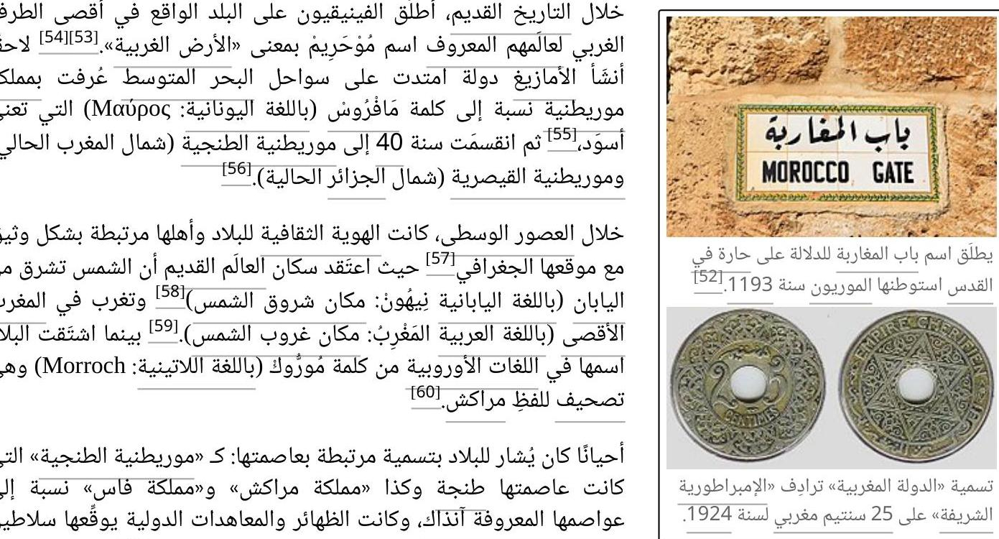)

بالموازاة مع ذلك وللإشارة إلى المنطقة المغاربية بشكل عام، كان العرب في العصور الوسطى يَستخدمون لفظ «بلاد المغرب»^{(}^{52}^{)} بينما الأوروبيون يَستخدمون لفظ «الْسَاحل البربري»^{(}^{53}^{)}^{64} للدلالة على ثلاثة أقاليم: الْمَغرب الأدنى (إفريقية أو تَوَنَس الحالية)، المِعْرَب الأَوْسَط (الجزائر الحالية)، الْمَعْرَب الأقْصَى (المملكة المغربية الحالية).

## التاريخ

المقالة الرئيسة: تاريخ المغرب

### ما قبل التاريخ

المقالة الرئيسة: ما قبل التاريخ بالمغرب

عَرف المغرب خلال عصر ما قبل التاريخ (الحقبة التي تَسبق اختراع الكتابة) تعاقُب عدة حضارات وهي كالتالي: الحضارة الأشولية (منذ 700.000 سنة قبل الميلاد)، الحضارة الموستيرية (منذ 120.000 سنة قبل الميلاد)، الحضارة العاتيرية (منذ 40.000 سنة قبل الميلاد)، الحضارة الإيبروموَريسية (منذ 21.000 سنة قبل الميلاد).^{(}^{^{57}}^{)}

خلال عصر ما قبل التاريخ، ضَم المغرب العديد من المواقع ^{(}^{الإنجلزية)} التي شهدت بدايات التاريخ الإنساني^{(}^{^{58}}^{)} عَبْر على العديد من البقايا البشرية في جبل إيغود سنة 1991، وبعد تأريخها باستخدام التقنيات الحديثة سنة 2017 وُجِد أن عمرها يعود لـ300.000 سنة على الأقل، مما يجعلها أقدم الآثار المكتشَفة للإنسان العاقل في العالَم.^{(}^{^{59}}^{)}^{[}^{^{60}}^{]}

Affichage de la page 5


|  | خلال العصر الحجري كانت جغرافيا المغرب تشبه السافانا أكثر مما تشبه الطبيعة القاحلة الحالية؛[^{69]}^{ }غيَّرت الرياح الموسمية الغرب إفريقية المشهد الطبيعي منذ 15.000 سنة قبل الحاضر وبدأت حقبة الصحراء الخضراء؛ حينها زاد هطول الأمطار خلال موسم الصيف مما أدى إلى نمو الظروف الرطبة (مثل البحيرات، الأراضي الرطبة) والسافانا (مثل الأراضي العشبية، الشجيرات) في شمال إفريقيا.[^{70]} |
|  | ```في حين لا يُعرف الكثير عن المستوطنات في المغرب خلال العصر الحجري الوسيط، فإن الحفريات في أماكن أخرى من المنطقة المغاربية تَشِيرَ إلى وَفرة من الغابات، مناسبة للصيادين وجامعي الثمار، مثل الثقافة القيصية.[^{71]}``` |
|  | تشترك المناطق الساحلية للمغرب خلال العصر الحجري الحديث في صناعة الفخار والتي كانت شائعة بجميع أنحاء البحر المتوسط في ذلك الوقت؛ تُشير الحفريات الأثرية إلى أن تدجين الأبقار والزراعة وكذلك الحصاد بدأ خلال هذه الحقبة.[^{72]}^{[73]}^{ }انتهت حقبة الصحراء الخضراء ما بين 5500 سنة قبل الحاضر و4000 سنة قبل الحاضر.[^{74}] |
|  | **التاريخ القديم** |
|  | ***المقالة الرئيسة: العصر الكلاسيكي بالمغرب***
***طالع أيضًا: مملكة موريطنية وموريطنية الطنجية*** |
|  | عُرف المغرب خلال حقبة التاريخ القديم (ابتداءً من الألفية الرابعة قبل الميلاد) تعاقُب حضارات العصر الكلاسيكي وهي على التوالي: الحضارة الفينيقية (منذ القرن الثاني عشر قبل الميلاد)، الحضارة البونيقية (منذ القرن الخامس قبل الميلاد)، الحضارة الموريطنية (منذ القرن الثاني قبل الميلاد)، الحضارة الرومانية (منذ القرن الأول بعد الميلاد).[^{75}] |
|  | خلال التاريخ القديم، فُتح المغرب أبوابه بشكل أوسع للدول المحيطة بالبحر المتوسط، حين ازدهرَت تجارة الفينيقيين وأقاموا مستعمَرات لهم في مختلف المناطق المتوسطية.[^{76]}^{ }ثَعَد كل من شالة، وليكسوس، والصويرة من أهم وأول المستعمَرات الفينيقية التي أُنشِئت في المغرب،[^{77]}^{ }وقد بقيَت الأخيرة مستعمَرة فينيقية حتى القرن السادس قبل الميلاد.[^{78]}^{ } |
|  | كانت قرطاج مستعمَرة فينيقية بالأساس، ثم تطورت بعد انحلال فينيقيا لتصير بونيقية سَيطرت على أجزاء كبيرة من جنوب غرب المتوسط خلال الألفية الأولى قبل الميلاد.[^{79]}^{ }أقامت قرطاج علاقات تجارية مع قبائل الأمازيغ بالمناطق الداخَلية، ودَفعَت لهم مَبالغ سنوية لضَمانِ تعاونهم في استغلال المواد الخام.[^{80]}^{ } |
|  | كانت موريطنية مملكة قِبَلية، أسَّسها السكان المحليون الذين عُرفوا بإسم الموريطنيين؛[^{81]}^{ }بعد وفاة بطليموس الموريطني سنة 40، ضَمَت الإمبراطورية الرومانية المملكة وقسَّمتها إلى مقاطعتين اثنتَين: موريطنية القيصرية في الشرق، وموريطنية الطنجية التي تتطابق تقريبًا مع الجزء الشمالي من المغرب الحالي.[^{82]}^{ } |
|  | كانت الديانة الأمازيغية التقليدية تهيمِن عليها آلهة الشمس والقمر، والتي تُشبه إلى حد بعيد تلك التي كان يعبدها المصريون.[^{83]}^{ }تَوَاجَدَت المسيحية في موريطنية الطَنجية منذ القرن الثالث،[^{84]}^{ }وانتشرَت بسرعة على الرغم من ظهورها الْمتأخر نسبيًا في المنطقة.[^{85]}^{ }كانت المدن الرئيسية هي بناصا، سبتيم، روسادير، ليكسوس، تمودة، بالإضافة إلى العاصمة طنجيس.[^{86]}^{ } |
|  | خلال أزمة القرن الثالث، انهار الحُكم الروماني في معظم أنحاء موريطنية الطنجية سنة 285 باستثناء الشريط الساحلي ما بين ليكسوس وطنجيس وسبتيم؛[^{87]}^{ }وعند سقوط الإمبراطورية الرومانية خضعت أجزاء من المغرب الحالي للفندال وهم من القبائل الجرمانية الشرقية، ثم إلى القوط الغربيين، فالروم البيزنطيين.[^{88]}^{[}^{89]}^{ } |

Affichage de la page 6


#### * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

Affichage de la page 7


![img-2.jpeg](data:image/png;base64,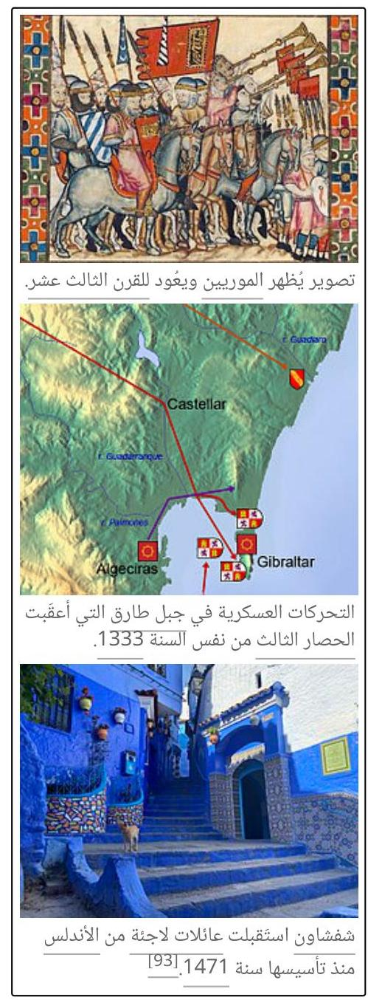)

صواريخها في جبايا مشروع غير مكتمل لبناء أطول مئذنة بالعالم، وقد توقف سنة 1991.192

طالع أيضًا: السلطنة الشريفة خلال التاريخ الحديث، شهد المغرب تحولات مهمة وضعت الأساس للدولة القومية الحديثة وذلك ما بين سنوات 1510 و1822.193 استُحدث في عهدِ السلطان أحمد المنصور الذهبي (الفترة 1578–1603) نظام حكومي أطلق عليه اسم المخزن،(^{114)} بلغ التقسيم الإداري في عهده 9 ولايات هي سوس، فاس، تافيلالت، مراكش، تادلة، درعة، الفحص، توات-تيكورارين، وبلاد السودان،(^{115}) وقدر إجمالي عدد السكان سنة 1600 (14) يحوالي 13 مليون نسمة.194)117)118) كما عرف المغرب خلال هذه الفترة تشييد المزيد من القصبات التي بُنيت في إطار استراتيجية أمنية خارجية وداخلية.118)

من الناحية التشريعية، رغم أن نظام البيعة يتضمن عادة تطبيق قوانين دينية إلا أنه كان يتم في الواقع الاتفاق على قوانين وضعية تُنظم العلاقات الاجتماعية والاقتصادية والقضائية والأمنية في المناطق التي تمتعت بقدر كبير من الحكم الذاتي،(^{119)}120) هذه الاتفاقيات يتم تدوينها في المدارس وتختلف نسبيًا من منطقة مغربية لأخرى.121) هذا التنظيم لعب دورًا هامًا في ضبط التوازنات العامة من داخل المجتمع، خصوصًا خلال ضُعف السلطة المركزية أو انعدامها في حال حدوث صراع على السلطة.122)

عُرفت البلاد وجود مؤسسات تنفيذية وقضائية متقدمة إلى حد ما، حسب ما وَرد في كتاب تاريخ الشعوب العربية للمؤرخ البريطاني من أصل لبناني ألبرت حوراني (1915–1993) والذي قضى سنوات طويلة أستاذًا في جامعة أوكسفورد: «في أُمَمى عَرب المغرب العربي وفيما وراء حدود الإمبراطورية العثمانية تقع دولة من نوع مختلف تمامًا ترجُّد مَلَذ زمنٍ طويل: إنها الإمبراطورية المغربية»، مضيفًا أن هذه الدولة تتوفر على جميع مقومات الدولة الحديثة: المحاكِم والوزارات والجيش، حتى وإن كانت قد عُرفت فترات من الفوضى وسوء التنظيم.123)

حاولت السلطة المركزية خلال القرن التاسع عشر القيام بالعديد من الإصلاحات: في المجالات العسكرية، أرسَلت الدولة المغربية بعثات طلابية إلى دول أوروبا الغربية لمتابعة التكوين العسكري وعَملت على شراء الأسلحة الحديثة وتشييد مَصنع للأسلحة في فاس،(^{124)} في المجالات الإدارية، أسَّست دار النيابة التي ضَمت السفراء والقناصلَ بطَنجة، وحَددت منصب الصدر الأعظم في الشؤون الداخلية، كما أحدثت وزارات الدفاع والعدل والمالية والشؤون الخارجية،(^{124)} في المجالات الجبائية، عَينت الدولة أمناء في المَراسي وفُرضت عليهم مراقبة شديدة لمحاربة الرشوة والاختلاس، كما أحدثت تغييرات في

Affichage de la page 8


![img-3.jpeg](data:image/png;base64,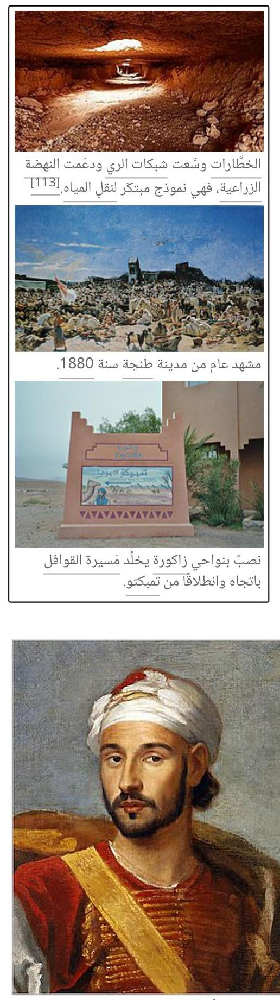)

محمد بن حدو أعطار، سفير المغرب لدى بريطانيا العظمى سنة 1682.[125][126]

النظام الضريبي،[124] في المجالات المالية، أنشأت دار السكة وحاولت ضبط العملة الوطنية بالرفع من قيمتها ومنع تزويرها وتهريبها إلى الخارج؛[124] في المجالات التعليمية، أسَّست الدولة المغربية بسلا مدرسة عصرية لتلقي العَلمِ الحديثة وخُصصت منحًا ومكافآت للطلبة المتفوقين، وأرسَلت بعثات طلابية إلى أوروبا.[124]

## المجالات السياسية

المقالة الرئيسة: المخزن (المغرب)

استمرت سلالة السعديين في الحكم حتى سنة 1659؛[127] صعُدت بعدها سلالة العَلَوَيين والتي كانت تَحكم منطقة تافيلالت منذ 1631 لتتولى السلطةَ المركزية في البلاد سنة 1666؛[128][129] نجح السلطان الرشيد بن الشريف في إعادة
![img-4.jpeg](data:image/png;base64,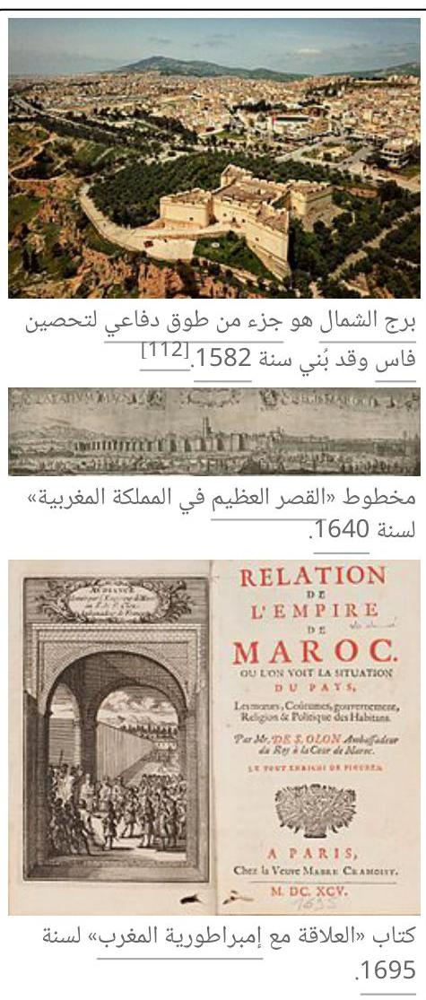)

1695

توحيد البلاد في
![img-5.jpeg](data:image/png;base64,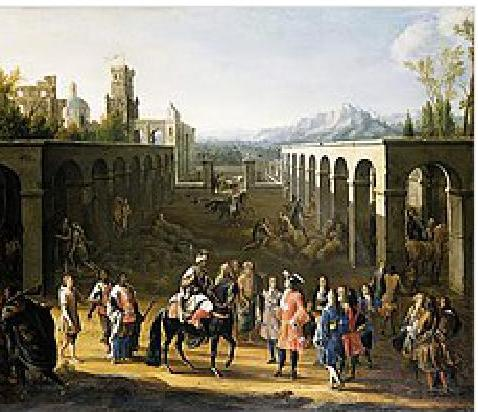)

السلطان إسماعيل بن الشريف يَستقبل فرانسوا بيدو سفير لويس الرابع عشر، سنة 1693.[127]

|  | 1727 | تثبيت |
| :--: | :--: | :--: |
|  | سَلَطْتَه على إمارة |  |
|  | توات ونَظْم حِملة |  |
|  | عَسكَرية سَيطر فيها |  |
|  | على إمارة الترارزة |  |
|  | وإمارة البَرَاكَنَة لتصلَ |  |
|  | حَدود الدولة | حتى |

نهر السنغال؛[130] بعد نزاعات عسكرية عديدة مع الدولة العثمانية ثم إعادة إحلال السلام بعدما وافق العثمانيون على الاعتراف بالحدود الشرقية للمغرب بالقرب من وجدة.[131][130]

عند بداية الثورة الأمريكية، كانت السفن التجارية التابعة للولايات المتحدة كثيرًا ما تتعرض لهجمات القراصنة البربر في المحيط الأطلسي، فأعلنَ السلطان محمد الثالث أن جميع السفن التجارية الأمريكية تحظَى بحماية السلطنة وأنها ستحظى بالحماية عند إبحارها

Affichage de la page 9


بالمياه الإقليمية المغربية؛ تُعَد معاهدة الصداقة المغربية الأمريكية التي أبرمت سنة 1777 من أقدم معاهدات الصداقة المستمرة التي أبرمتها الولايات المتحدة [132]^{[}^{133}^{]} ونتيجة لها صار المغرب من أول الدول التي اعتُرفت بالولايات المتحدة كدولة مستقلة. [134] كانت طنجة ابتداءً من القرن الثامن عشر هي العاصمة الدبلوماسية للمغرب. [136]

من الناحية الدبلوماسية، كتب الجنرال هوبير ليوطي الذي شُغِل مَنصب المقيم العام الفرنسي بالمغرب (الفترة 1912–1925): «لقد وُجِدنا أنفسنا في المَعْرب أمام إمبراطورية عريقة تاريخيًّا ومستقلة، متمسكة إلى أقصى حد باستقلالنا وشرسة في مواجهة أي محاولة لإخضاعها، وهي تظهر حتى هذه السنوات الأخيرة كدولة قائمة الذات بترتيبها الإداري الوظيفي وتحليلها في الخارج» [123].

#### المجالات العسكرية

المقالة الرئيسة: تاريخ المغرب العسكري

باتجاه الشرق، بدأت أولى الاتصالات مع الدولة العثمانية في القرن السادس عشر، حيث أصبح العثمانيون أقوياء جدًا بعد سقوط تلمسان (1517) وسقوط الجزائر (1516) ثم الاستيلاء عليها مرة أخرى بصفة نهائية سنة 1529، مقتربين تدريجيًّا من المغرب الأقصى. بعد سقوط تلمسان سنة 1517، هرب سلطان تلمسان^{[}^{138}^{]} إلى فاس في المغرب لطلب اللجوء؛^{[}^{139}^{]} وقد كان العثمانيون يقاتلون في شمال إفريقيا بصفتهم أعداء إسبانيا الكاثوليكية، وفي الوقت نفسه كانت سلالة السعديين قد أحرزت انتصارات مهمة على البرتغاليين الذين اضطروا إلى الانسحاب من الجنوب المغربي خاصة في أكادير سنة 1541، لتنجح سلالة السعديين فيما بعد بالإطاحة بسلالة الوطنييين شمال البلاد وإعادة توحيد المغرب تحت سلطة واحدة. [140]

باتجاه الجنوب وتحديدًا في غرب إفريقيا، كانت معركة تونبيدي سنة 1591 المواجهة الحاسمة خلال غزو المغرب لإمبراطورية السونغاي في القرن السادس عشر (الحرب المغربية السونغية)، [141] [142] حين استطاعت القوات المغربية تحت قيادة جودر باشا هزيمة حاكم إمبراطورية سونغاي مما أدى إلى انهيارها؛ تم تأسيس باشوية تمبكتو (1591–1833) في بلاد السودان حيث استمرَّت كإحدى ولايات الإمبراطورية المغربية خلال فترة حكم السعديين ومن بعدهم العلويين. [144]^{[}^{145}^{]} قبل أن يستولي عليها الطوارق سنة 1787. [146] باتجاه الشمال، شهدت البلاد العديد من النزاعات العسكرية ضد البرتغال، وإسبانيا، وفرنسا، وإنجلترا، [147] كما شاركت بحربٍ ضد الولايات المتحدة والسويد وصقلية. [150]

#### المجالات الاقتصادية

المقالة الرئيسة: تاريخ المغرب الاقتصادي

عَرفت البلاد في بداية القرن السابع عشر أزمة اقتصادية لأسباب منها قلة الأمطار، وانتشار الوباء، وتقلُّص الإنتاج المحلي من السكر، وتدهوُّر تجارة الذهب مع بلاد السودان. [151] كانت للمغرب بعض الخصائص التي ميَّزته عن باقي المنطقة المغاربية وأعطته الأولوية في التجارة مع أوروبا؛ فالمغرب من الناحية الجغرافية هو الأقرب لأوروبا حيث لا يَفصل بَينَهما سوى مضيق جبل طارق الذي لا يتعدى عرضه في أضيق نقطة 15 كيلومتر. [153] ومن الناحية السكانية فالمغرب يَضم أقلية يهودية كانت تشكِّل حوالي 7% من إجمالي السكان خلال القرن التاسع عشر وكانت تعمل في التجارة ولها علاقة قوية مع التجار اليهود الأوروبيين مما أدى إلى ارتفاع التعاملات التجارية بين أوروبا والمغرب. [154]

Affichage de la page 10


خلال القرن الثامن عشر أخذت المصالح الأوروبية تنمو يومًا بعد آخر في البحر المتوسط، وأصبحت تلك المصالح تُحتم على الدول الأوروبية تأمين تجارتها في محاولة للحد من حركة القرصنة البحرية التي كانت تقوم بها الأساطيل المغربية في تلك الفترة، ونتيجة لذلك شرعت الكثير من الدول في عقد أو تجديد معاهداتها مع المغرب، ففي عهدِ السلطان محمد الثالث (الفترة 1757–1790) على سبيل المثال، عُقدت حوالي سبع دول أوروبية معاهدات صداقة ^{[الإنجليزية]} وتجارة ^{[الإنجليزية]} مع المغرب اشتُعِلَت على تأمين تجارتها في البحر المتوسط وإعطاء امتيازات لقناصلها وتجارها ومواطنيها، ومن خلال بنود تلك المعاهدات يلاحَظ أن هناك تركيزًا على سلامة السفن وتقديم الخدمات لها في الموانئ المغربية وأن هناك تشابهًا بين بنود تلك المعاهدات. [155]

### التاريخ المعاصر

المقالة الرئيسة: تاريخ المغرب المعاصر
طالع أيضًا: معاهدة فاس وحماية فرنسا (المغرب) وحماية إسبانيا (المغرب) وحماية دولية (المغرب) ووثيقة الاستقلال المغربية

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

Affichage de la page 11


رغم احتفاظ المغرب برموز السيادة كالعملة والعلم الوطني،^{[}^{163}^{]} إلا أن معاهدة الحماية سَمحت لبلدان أوروبية بالمشاركة في تسيير البلاد عبر سنِّ قوانين كان سلاطين المغرب يَرفضون المصادقة عليها في بعض الأحيان.^{[}^{164}^{]} قام أفراد الحركة الوطنية بتنسيق مع الملِك محمد الخامس بصَياغة وثيقة المطالبة بالاستقلال بتاريخ 11 يناير 1944،^{[}^{165}^{]} ألغيت الحماية الفرنسية والحماية الإسبانية في 7 أبريل 1956،^{[}^{166}^{]} كما عادت مدينة طنجة التي تم تدويلها إلى المغرب في 29 أكتوبر 1956.^{[}^{167}^{]} استعاد المغرب سيادته على رأس جوبي ومعظم مقاطعة إفني الخاضعة للحُكم الإسباني خلال حرب إفني والمعاهدة التي أعقبتها سنة 1958.^{[}^{168}^{]}^{[169]}

تربَّع الحسن الثاني على العرش كملك للمغرب في 3 مارس 1961، ظل المغرب غير منحاز رسميًا خلال الحرب الباردة ومع ذلك فقد أظهَر تعاطفًا مؤيدًا للغرب.^{[}^{170}^{]} صَودِق بواسطة الاستغناء على تحويل نظام الحُكم في المغرب إلى مَلَكية دستورية سنة 1962، وفي هذا الصدد رسَّخ الدستور الحق في المِلكية الفردية وأعلن صراحة أن نظام الحزب الواحد غير شرعي.^{[}^{171}^{]} أرفق المغرب مقاطعة إفني الإسبانية بالكامل سنة 1969،^{[}^{172}^{]}^{[173]} ثم أرفق إقليم الصحراء الغربية سنة 1975.^{[}^{174}^{]} يَعقد المغرب وإسبانيًا دراسَات تهدف إلى بِناء الربط القاري عبر مضيق جبل طارق منذ 1979، يحظَى المشروع المَقترَح باهتمام دولي لكنه يواجِه تحديات جيولوجية بالأساس.^{[}^{175}^{]}

المجتمع

التركيبة السكانية

*المقالة الرئيسة: التركيبة السكانية في المغرب*

*طالع أيضًا: الدراسات الوراثية على المغاربة والمغاربة المقيمون في الخارج*

يُبلغ عدد سكان البلاد 37،645،500 نسمة بتاريخ 1 مايو 2025 حسب التقدير الاستقرائي للبيانات الرسمية،^{[}^{177}^{]} مع نمو سكاني بَلَغ 1،26% سنويًا ما بين 2015 و2020،^{[}^{178}^{]} بينما معدل الخصوبة الكلي بَلَغ 2،29 طفل لكل امرأة سنة 2021.^{[}^{179}^{]} معظم السكان هم مغاربة مواطنون،^{[}^{4}^{]} وهم مسلمون على المذهب المالكي.^{[}^{180}^{]} هناك أقليات من العرق الأسوَد يُعرفون بِأسمِ الحراطين والغَناوة.^{[}^{181}^{]}^{[}^{182}^{]} المندوبية السامية للتخطيط هي مؤسسة الإحصاء الحكومية مهمتها تتبُّع المؤشرات الاقتصادية والاجتماعية.^{[}^{183}^{]}

أظهَرت الدراسات الوراثية على المغاربة أن العرب والأمازيغ (الذي يتم التمييز بينهما على أساس لغوي) لا يَختلفون كثيرًا من حيث تركيبتهم الوراثية، ولخَّصتَ هَذه الأبحاث إلى أن التعريب في المغرب تم بالأساس عبر عملية استيعاب ثقافي.^{[}^{184}^{]} تُنص النشرة الأوروبية للوراثة البشرية ^{[الإنجليزية]} على أن المغاربة في غرب شمال إفريقيا كانوا أقرب جينيًّا إلى سكان أيبيريا منهم إلى شعوب البانتو القاطنين جنوب الصحراء الكبرى.^{[}^{185}^{]}

الإسلام هو الدين الرسمي والأكثر انتشارًا في البلاد، مع وجود أقليات من اليهود والمسيحيين ومن المغاربة اللادينيين.^{[}^{186}^{]} أظهَر استطلاع على المغاربة بأن نسبة 67،8% يَعتبرون أنفسهم متدينين، نسبة 29،1% متدينين إلى حد ما، ونسبة 3،1% غير متدينين، حسب نتائج نشرها الباروميتر العربي سنة 2021.^{[}^{187}^{]} كان عدد اليهود في المغرب يصل إلى 265 ألف نسمة سنة 1948، إلا أنه انخفض إلى حوالي 2500 نسمة سنة 2018 بسبب هجرة الكثير منهم إلى إسرائيل وأوروبا.^{[}^{188}^{]} تشكَّل المسيحية في المغرب حوالي 1،1% أي ما يقارب 380 ألف نسمة وذلك طبقًا لتقديرات سنة 2009.^{[}^{189}^{]}

Affichage de la page 12


![img-6.jpeg](data:image/png;base64,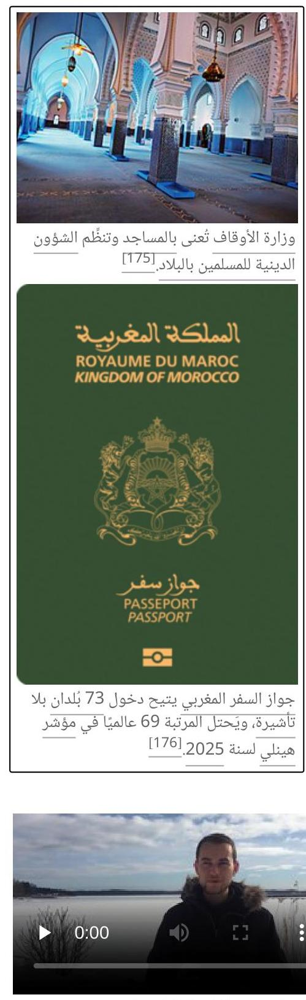)

شخص يُتحدث بالدارجة المغربية.

يُعَد المغرب وجهة مفصّلة للعديد من الأجانب الذين يختارون الإقامة فيه لأسباب مختلفة منها العمل. الدراسة، أو التقاعد؛ يُشمل هؤلاء الأجانب جنسيات متنوعة من أوروبا، أفريقيا جنوب الصحراء، آسيا، وأمريكا الشمالية، وهم موزعون على مختلف المدن المغربية الكبرى مثل الدار البيضاء، مراكش، والرباط. ^{[189]} يساهم هؤلاء الأجانب المقيمون في الاقتصاد المحلي بعدة طرق حيث يعمل العديد منهم في قطاعات مثل التعليم، السياحة، التجارة، والصناعة؛ كما أن وجود جاليات أجنبية كبيرة يعزّز من التنوع الثقافي والاجتماعي ويُخلق فرصًا للتبادل الثقافي. ^{[190]}

هناك تعداد كبير للمغاربة خارج وطنهم الأم حيث يقال أن في فرنسا أكثر من مليون ونصف مغربي،^{[191]} تليها إسبانيا بحوالي 870 ألف نسمة،^{[192]} وبلجيكا بحوالي 700 ألف،^{[193]} وهولندا بحوالي 600 ألف،^{[194]} بالإضافة إلى جماعات مغربية كبيرة في كل من إيطاليا، وكندا، والولايات المتحدة، وإسرائيل التي يشكّل فيها اليهود المغاربة ثاني أكبر الجاليات هناك. ^{[195]}^{[}^{196]} يتم الحصول على الجنسية المغربية عادة بموجب حق الدم، أي بالولادة في المغرب أو في الخارج لوالدين يُحمل أحدهما الجنسية المغربية. ^{[197]}

**اللغات واللهجات**

*المقالة الرئيسة: لغات المغرب*

*طالع أيضًا: لهجة مغربية ولغة عربية ولغة أمازيغية*

الدارجة المغربية هي إحدى لهجات العربية، وتُصنَّف ضمن اللسان المغاربي (وهو لسان المغاربة، الجزائريين، والتونسيين)، يستعملها أغلب المغاربة كلغة التواصل كما أنها اللهجة الأم لـ 50% من المغاربة، ومحكية في بعض المناطق الناطقة باللغة الأمازيغية كلسان ثانوي. ^{[198]} تنتشر اللهجة المغربية في البلدان الأوروبية كفرنسا، وإسبانيا، وبلجيكا، وإيطاليا، وهولندا؛ كما أن للهجتين المغربية والجزائرية تأثير واضح على لهجة الشارع الفرنسية. ^{[199]}

اللغة العربية واللغة الأمازيغية هما اللغتان الرسميتان في المغرب. ^{[5]} يُتحدث قرآنة 13,5 مليون شخص من أصل 32 مليون أي حوالي 45% من السكان؛^{[200]}^{(}^{[201]} (لا توجَد إحصاءات رسمية) باللغة الأمازيغية بلهجاتها الثلاث: التاريفيت، والتاشلحيت، والأطلسية؛ يُقطن معظم هؤلاء في المناطق الريفية وتُعَد هذه اللغة بالنسبة لهم إما لغتهم الأولى أو يتكلمونها إلى جانب الدارجة المغربية. ^{[202]}

الفرنسية تُستخدم على نطاق واسع في مجالات العلوم والتكنولوجيا وَالطُبَ والأعمال التجارية والإدارة العامة والقانون فهي ضرورية للاندماج في المجتمع المهني؛^{[203]} أما الإنجليزية فيوجَد توجُّه متزايد نحو تعزيزها في النظام التعليمي والاقتصادي حيث يُنظر إليها على أنها لغة المستقبل والابتكار مع تزايد الطلب عليها في سوق العمل المغربي والدولي. ^{[204]} يُنص دستور البلاد على أن الدولة تعمل على «حماية اللهجات والتعبيرات الثقافية المستعمَلة في المغرب، وتُدير على انسجام السياسة اللغوية والثقافية الوطنية، وعلى تعلُّم وإتقان اللغات الأجنبية الأكثر تداولًا في العالم». ^{[5]}

**التعليم العمومي**

*المقالة الرئيسة: التعليم في المغرب*

Affichage de la page 13


*طالع أيضًا: الأمية في المغرب والتعليم العالي في المغرب*
![img-7.jpeg](data:image/png;base64,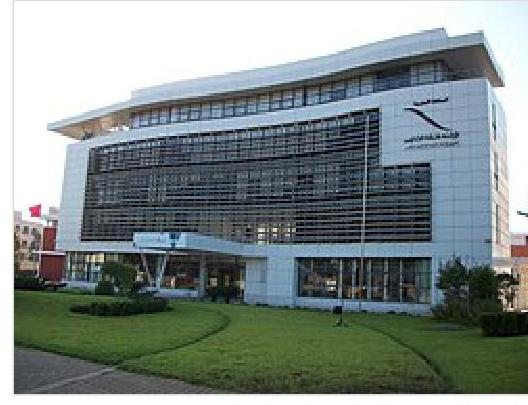)
مؤسسة محمد السادس تهدف إلى توفير دعم اجتماعي للعاملين في مجال التعليم.[205]
شهد التعليم في المغرب تحسنًا على مدار العقود الماضية إلا أن النظام التعليمي لا يزال يواجه عدة تحديات، من أبرزها التفاوت في جودة الْتعليم بين المناطق الحضرية والريفية أين تعاني المدارس في المناطق النائية من نقصٍ في الموارد والمعلمين المؤهلين، كما يواجه التعليم العالي تحديات تتعلق بتحديث المناهج الدراسية لتتوافق مع سوق العمل المتغيرة مما أدى إلى زيادة نسبة البطالة بين الخريجين.[206] بَلَغت نسبة استكمال الدراسة في السلك الابتدائي 91,4%، وفي السلك الإعدادي 61,4%، وفي السلك الثانوي 39%، حسب إحصائيات وزارة التعليم لموسم 2019-2020.[207]

التعليم في المغرب هو إلزامي ومجاني في المرحلتين الابتدائية والإعدادية، أي حتى سن 15 سنة؛[208] وهو اختياري مع دفع رسوم الْتسجيل في المرحلتين الثانوية والجامعية.[208] يُتميز التعليم العالي في المغرب بالتنوع في العرض إذ يُتوزع على مجموعة من الجامعات والمعاهد والمدارس والمؤسسات العليا والكليات ومؤسسات التكوين المهني والعسكري وشبه العسكري، ويغطي تقريبًا جل الميادين والمجالات الحيوية كالهندسة والطب والصناعة وإدارة الأعمال والفلاحة والتكنولوجيا والمعلومات.[209]

حسب نتائج البرنامج الدولي لتقييم الطلبة لسنة 2018 فإن تلاميذ المدارس المغربية يحتلون المرتبة 75 في الرياضيات، والمرتبة 75 في العلوم، والمرتبة 74 في القراءة.[210] أطلَقت الحكومة المغربية «الرؤية الاستراتيجية 2015-2030» التي تهدف إلى جعل التعليم أداة لتحقيق العدالة الاجتماعية وكذا التنمية المستدامة؛ تهدف هذه الاستراتيجية إلى تطوير النظام التعليمي بشكل شامل بدءًا من التعليم الابتدائي وصولًا إلى التعليم العالي والبحث العلمي.[211]

الرعاية الصحية

المقالة الرئيسة: الصحة في المغرب
![img-8.jpeg](data:image/png;base64,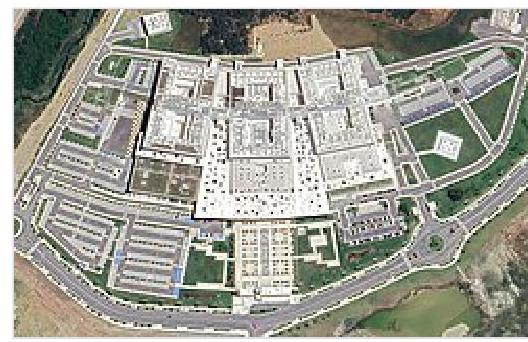)
![img-9.jpeg](data:image/png;base64,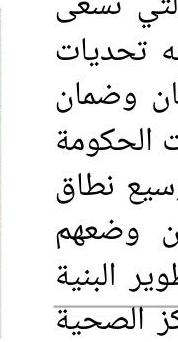)

المركز الاستشفائي الجامعي بطبجة أنتج مواد طبية لمكافحة جائحة كورونا بالبلاد.[212]
شكل الإنفاق على الرعاية الصحية نسبة 5,9% من الناتج المحلي الإجمالي للبلاد سنة 2014.[213] بينما بلغ متوسط الإنفاق الصحي على الْفَرد 70جُمل(6) قيمة 435,29 دولار أمريكي سنة 2015.[214] يَصل متوسط العمر المتوقَّع عند الولادة إلى 74,3 عامًا، أو 73,3 عامًا للرجال و75,4 عامًا للنساء، مع وجود 6,3 طبيب و8,9 ممرض وقابلة لكل 10 ألف نسمة، حسب بيانات سنة 2016.[217]

حسب إحصائيات وزارة الصحة المغربية فيما يخص القطاع الصحي العمومي لسنة 2019، فإن المراكز الصحية الأولية يَبلغ عددها 2112 مركزًا (موزعة بين المجال الحضري والمجال القروي بـ 838 و1274 مركزًا على التوالي)؛ المؤسسات الاستشفائية الكبرى منتشرة بالبلاد ويَبلغ عددها 149 مَركزًا؛ مراكز الطب النفسي محصورة فقط في المدن الكبرى ويَبلغ

Affichage de la page 14


عددها 10 مراكز؛ مراكز تصفية الدم وأمراض الكلي يَبلغ عددها 113 مركزًا.^{(}^{218}^{)} يَحتل المغرب المرتبة 108 في مؤشر الأمن الصحي العالمي لسنة 2021.^{(}^{219)}

## السياسة

المقالة الرئيسة: سياسة المغرب

طالع أيضًا: حكومة المغرب وبرلمان المغرب والقضاء في المغرب

تأسَّس النظام السياسي على أساس البيعة منذ سنة 788 باعتبارها عَقَدًا مبرّمًا بين الحاكم والرعية، يَتعهد فيه الحاكم بأن يَتولى شؤون الأمة ويَرمى مصالحها بينما تتعهد فيه الأمة بالسمع والطاعة؛ يُعتبر عقد البيعة مَصدر شرعية للحُكم وكان دائمًا بصيغة مكتوبة عَرفت تطورًا مع الزمن ولَازَالَت مستمرة حتى اليوم.^{(}^{220}^{)} يَنص الدستور المغربي على أن المَلِك هو «أمير المؤمنين والممثِل الأسمى للأمة ورمز وحدتها وضامن دوام الدولة واستمرارها، وهو حامي حى الدين والساهر على احترام الدستور، وله صيانة حقوق وحريات المواطنين وإجماعات وأهيئات وهو الضامن لاستقلال البلاد وحرزة المملكة في دائرة حدودها الحقة».^{(}^{5}^{)}

نظام الحُكم في المغرب هو مَلكي دستوري ذو طابع ديمقراطي اجتماعي،^{(}^{5}^{)} وفي هذا الصدد يَتمتع المَلِك ببعض الصلاحيات المحدودة،^{(}^{221}^{)} في نظام متعدد الأحزاب مع وجود أحزاب سياسية معارِضة.^{(}^{5}^{)} يعيّن المَلِك رئيس الحكومة من الحزب السياسي الذي تَصدُر انتخابات أعضاء مجلس النواب وعلى أساس نتائجها، ويعيّن أعضاء الحكومة باقتراح من رئيسها.^{(}^{222}^{)} يَمنح الدستور الحق للمَلِك في أن يُعفي الوزراء من مهامهم وحلّ مجلسَي البرلمان أو أحدهما بعد استشارة رئيس كل منهما ورئيس المَجلَس الدستوري وتوجيه خطاب للأمة،^{(}^{5}^{)} لكن هذا لم يَحصل إلا مرة واحدة سنة 1965.^{(}^{223)}

السلطة التنفيذية تمارسها الحكومة برئاسة رئيس الحكومة وتَضم 24 وزيرًا.^{(}^{223)}^{[}^{5}^{]} السلطة التشريعية يمارسها البرلمان من خلال مجلس النواب ومجلس المستشارين.^{(}^{224}^{)} تقع السلطة القضائية على عاتق المحكمة الدستورية التي يجوز لها مراجعة صحة القوانين والانتخابات والاستفتاءات.^{(}^{225}^{)} يَنص الدستور المغربي على استقلالية القضاء بمواجهة السلطتين التنفيذية والتشريعية.^{(}^{5}^{)} يَحتل المغرب المرتبة 90 في مؤشر الدول الهشة لسنة 2023.^{(}^{226}^{)}

يتكون البرلمان المغربي من مجلسين هما مجلس النواب ومجلس المستشارين؛^{(}^{224}^{)} يُنتخب أعضاء مجلس النواب لمدة 5 سنوات بالاقتراع العام المباشر، ليَتألف هذا المجلس من 395 عضوًا،^{(}^{224}^{)} بينما يَنتخب أعضاء مجلس المستشارين لمدة 6 سنوات باقتراع غير مباشر من طرف ممثّلي الجماعات المحلية، والمنتخَبين في الغرف المهنية، ومَمثّلي المأجورين، ليَتألف هذا المجلس من 120 عضوًا.^{(}^{5}^{)} يَحتل المغرب المرتبة 97 في مؤشر مدركات الفساد لسنة 2023.^{(}^{227)}

**الحقوق والحريات**

*المقالة الرئيسة: حقوق الإنسان في المغرب*

*طالع أيضًا: الجمعية المغربية لحقوق الإنسان*

خلال التاريخ الحديث، تَعَد «رسائل المولى إسماعيل» التي بعثها إلى المقامات الإدارية والقضائية خلال فترة حكمه (1672–1727)، وثائق تَنظُم العلاقة بين الحاكم والرعية بالمغرب، أسهَمت في بناء نظام حُكم يَعتمد على العدالة والمساواة.^{(}^{229}^{)} ركّز السلطان في رسائله على ضمان حقوق وحريات الرعايا الذين أمكنهم تقديم الشكاوى ضد التجاوزات التي قد يرتكبها

Affichage de la page 15


المسؤولون، مما يعكس التزامًا بحماية حقوق الأفراد ومحاسَبة كل من ينتهكها؛ كما أولى في الرسائل اهتمامًا خاصًّا بتفعيل الرقابة والمساءلة على الأداء الإداري والقضائي لضمان تطبيق القوانين بشكل عادل وشفاف. [229]

خلال التاريخ المعاصر، كانت توجَد فترات من التوتر السياسي بين المَلَكية وأحزاب المعارَضة في بداية عهد الحسن الثاني، تلك السنوات وصفتها المعارَضة بسنوات الرصاص، [230] إلا أنه خلال العقد الأخير من حُكم الملِك الحسن الثاني، وخاصّة في ظل عهد محمد السادس، سعى المغرب للتحقيق في التجاوزات التي ارتُكبت باسم الدولة عبرَ إطلاق هيئة الإنصاف والمصالحة التي تهدف لإعادة تأهيل الضحايا ودفع تعويضات عن انتهاكات الدولة في حقهم. [231] كما تأسسَت الجمعية المغربية لحقوق الإنسان كمنظمة مستقلة وغير حكومية تهدف للدفاع عن حقوق الإنسان والحريات الفردية. [232]

أجرى مَركز الدراسات الاستراتيجية والدولية دراسة نُشرت بعنوان «الإصلاحات العربية والمساعدات الخارجية: دروس من المغرب» سنة 2007، تُبرز أن المغرب يقدِّم درسًا قيمًا في الإصلاح السياسي والاقتصادي مشيرة إلى إمكانية الاعتماد على النموذج المغربي في دول أخرى من العالَم العربي، كما تؤكِّد الدراسة إمكانية تكييف الإصلاحات لكل بلد على حَدة. [233] رغم ذلك مازالت المنظمات المغربية والدولية توجِّه انتقادات لما تتعرض له حقوق الإنسان بالبلاد، لاسيما اعتقال الإسلاميين خلال عامي 2004 و2005 المشَتَبة بهم في تفجيرات الدار البيضاء أو الداعين للاستقلال في الصحراء الغربية. [234]

كانت الاحتجاجات المغربية لسنة 2011 حملة احتجاجات شعبية متأثرة بموجة الاحتجاجات في المنطقة، [235] تم على إثرها صياغة مقترحات لتعديل الدستور تضمَنَت مجموعة من الإصلاحات السياسية [236] التي تم قبولها بواسطة الاستفتاء [237] يُحتل المغرب المرتبة الأولى عربيًا والمرتبة 91 عالميًا في مؤشر الديمقراطية لسنة 2024، [238] كما تَحتل آليَلاد تصنيف «حرة جزئيًا» حسب تقرير الحرية في العالَم لسنة 2024. [239]

### التنمية البشرية

المقالة الرئيسة: المبادرة الوطنية للتنمية البشرية
طالع أيضًا: قائمة جهات المغرب حسب مؤشر التنمية البشرية وقائمة جهات المغرب حسب الدخل الفردي
تُعتبر السياسة الاجتماعية أحد الركائز الأساسية التي تعتمدها الدولة لتحقيق التنمية الشاملة وتحسين ظروف العيش للمواطنين، [241] أطلقت الحكومة برنامج «المبادرة الوطنية للتنمية البشرية» الذي يقوم على ثلاث محاور أساسية: التصدي للعجز الاجتماعي بالأحياء الحضرية الفقيرة والجماعات القروية الآشَد حَصَاصًا، تشجيع الأنشطة الخالقة لفرص الشغل والمتيحة للدخل القار، بالإضافة إلى الاستجابة للحاجيات الضرورية للأشخاص في وضعية صعبة. [242] يحتل المغرب المرتبة 121 عالميًا مع تصنيف «تنمية بشرية متوسطة» حسب تقرير الأمم المتحدة لسنة 2020. [243]

أم رفقة طفل في المنطقة الجبلية للأطلس، وهي من بين المناطق الأكثر فقرًا بالبلاد. [240]

Affichage de la page 16


شهدَت معدلات الفَقر انخفاضًا تدريجيًا منذ بداية الألفية الثالثة. ^{[244]} تتسم المناطق الريفية باعتماد جزء كبير من السكان على الزراعة التي تعاني من تأثيرات التغيرات المناخية مثل الجفاف مما يؤثر سلبًا على دخل الأسر ويزيد من حدة الفقر، أما في المناطق الحضرية تتفاقم مشكلة الفَقر بسبب البطالة وضعفِ القطاع غير الرسمي الذي لا يوفِّر الحماية الاجتماعية للعاملين فيه.ا^{[245]} يَبلغ متوسط الأجر الصافي الشهري 4107 درهم مغربي (459 دولار أمريكي) ويقع بذلك في المرتبة 72 دوليًا حسب مسح البيانات التي أجرته نامييو المنشور بتاريخ 2021.ا^{[246]}

يَحتل المغرب المرتبة 91 في مؤشر الازدهار لسنة 2021.ا^{[247]} تم الإعلان خلال جائحة فيروس كورونا عن حزمة اقتراحات تهدف لمعالجة آثارها الاقتصادية، من بينها تحويل مَبلغ 400 درهم مغربي (44 دولار أمريكي) شهريًا لفائدة من تفوق أعمارهم 65 سنة، على أن يصل هذا المَبلغ إلى 1000 درهم مغربي (110 دولار أمريكي) سنة 2026، مما قد يَجعل المغرب من بين دول العالم ٢٠١٧^{)}^{[248]}^{(} التي تَمنح شكلًا من أشكال الدخل الأساسي لمواطنيها.ا^{[249]}^{(}^{[249]}^{)} يَحتل المغرب المرتبة 100 عالميًا في تقرير السعادة العالمي لسنة 2023.ا^{[250]}

### النزاعات الحدودية

المقالة الرئيسة: حدود المغرب
طالع أيضًا: المغرب الكبير (مصطلح) والصحراء الغربية وسبتة ومليلية وبلاتاس دي سوبيرانيا
حسب الحكومة المغربية والجهات المساندة لها فإن إسبانيا تَحتل مدينتي سبتة ومَليلية بالإضافة إلى بعض الجُزر،ا^{[251]}^{(}^{[252]}^{)} ويسبِّب هذا النزاع أزمة في العلاقات بين البلدين من حين لآخر.ا^{[253]} كما كان المغرب قد طالَب بمنطقة تَندوف بعد استقلال الجزائر ودخل في مناوشات حدودية عُرفت بحرب الزمال سنة 1963 لاسترداد هذا الإقليم الذي بقي تحت السيطرة الجزائرية؛ هناك اتفاقية مَنعلقة برسم الحدود بين البلدين تم توقيعها بين الطرفين في 15 يونيو 1972.ا^{[254]}^{(}^{[254]}^{)} وصادَق عليها البرلمان المغربي سنة 1992.ا^{[24]}^{)}

تراوحت السيادة المغربية على منطقة الصحراء الغربية خلال القرن الثامن عشر ما بين الاستقرار والتراجع،ا^{[255]} وقد كانَت القبائل الصحراوية تَعترف بسلاطين المغرب كحكامٍ عليهم في نهايات القرن التاسع عشر،ا^{[256]} هذه الروابط السيادية أكدَتها محكمة العدل الدولية في رأيها الاستشاري،ا^{[257]}^{(}^{[258]}^{)} تُعَد المنطقة اليوم ضِمن قائمة الأمم المتحدة للأقاليم غير المحكومة ذاتيًا بعدما قدَّم المغرب طلبًا بَهْدًا الحُصوص سنة 1963،ا^{[43]} كما نظَّم المغرب المسيرة الخضراء بهدفِ الضغط على إسبانيا التي انسحبَت على إثرها من الإقليم سنة 1975.ا^{[259]} تمَردَت «البوليَساريو» على السيادة المغربية ودخلَت في حربَ لغرضِ إقامة «الجمهورية العربية الصحراوية الديمقراطية» وهي دولة أعلَنت نفسها في وقت لاحق من سنة 1976.ا^{[260]}

يَلتزم المغرب بالعملية السياسية الأممية لحلّ النزاع، وفي هذا الصدد كان قد وافَق على مقترحٍ لإجراء استفتاء لم يَتحقق بسبب الخلافات حول تحديدِ هوية الناخبين المؤهَّلين للمشاركة بالتصويت.ا^{[261]} يَقترح المغرب مَتح المنطقة حُكمًا ذاتيًا تحت سيادته لِكسَرِ حالة الجمود السياسي،ا^{[262]} بدوره يدعو مجلس الأمن الأطراف المعنية إلى استئنافِ المفاوضات بهدفِ التوصل إلى «حلٍّ سياسٍ وافٍي وعليٍّ ودائم ومُمِول للطرفين على أساس من أترافق» حسب قرار مجلس الأمن رقم 2602 الصادر سنة 2021.ا^{[48]}

صادَق المغرب على اتفاقية الأمم المتحدة لقانون البحار،ا^{[263]} كما صادَق مجلس النواب المغربي على مشروعي قانون ترسيم الحدود البحرية للبلاد سنة 2020، والذي حَدد المنطقة الاقتصادية الخالصة على مسافة 200 ميل بحري من السواحل الَمغربية، لَيَتضمن الترسيم جبلَ تروبيك على عمق 1000 متر تحت مستوى سطح البحر.ا^{[264]}^{(}^{[265]}

Affichage de la page 17


#### العلاقات الخارجية

المقالة الرئيسة: علاقات المغرب الخارجية
طالع أيضًا: قائمة البعثات الدبلوماسية المغربية

المغرب فعال على المستوى المغاربي، في العالَم العربي، وفي الشؤون الإفريقية.ا^{)}^{268}^{(} هناك قدر كبير من العلاقات المميِّزة مع بلدان غرب إفريقيا وفي هذا الصدد تقدمت المملكة المغربية بطلب الانضمام إلى المجموعة الاقتصادية لدول غرب إفريقيا سنة 2017.ا^{)}^{269}^{(} كما أن للمملكة المغربية أيضًا روابط وثيقة وطويلة الأمد مع الولايات المتحدة، إذ تُعَد المملكة أول دولة بالعالَم اعتُرفت باستقلال الولايات المتحدة،ا^{)}^{270}^{(}^{271}^{)} وتُعتبر المفوضية الأميركية في طنجة أول الممتلكات الأجنبية التي اشتُريت من قِبل حكومة الولايات المتحدة،ا^{)}^{272}^{(} كما تُعَد معاهدة الصداقة المغربية الأمريكية التي أبرمت في ديسمبر من سنة 1777 من أقدم المعاهدات المستمرة حتى اليوم.ا^{)}^{273}^{(}^{133}^{)}

المغرب عضو في الأمم المتحدة (منذ 1956)، وجامعة الدول العربية (منذ 1958)، واللجنة الدولية الأولمبية (منذ 1959)، ومنظمة التعاون الإسلامي (منذ 1969)، والمنظمة الدولية الفرانكوفونية (منذ 1981)، وهو عضو مؤسس في اتحاد المغرب العربي (منذ 1989)، ومنظمة التجارة العالمية (منذ 1995)، ومجموعة الحوار المتوسطي (منذ 1995)، ومجموعة سبعة وسبعون (منذ 2003)، ومنظمة حلف شمال الأطلسي كحليف رئيس خارجه (منذ 2004)، ثم الاتحاد من أجل المتوسط (منذ 2008)؛ وهو عضو في الاتحاد الإفريقي (منذ 2017) كما يستفيد من الخدمات التي يتيحها بنك التنمية الإفريقي.ا^{)}^{274}^{(}

مُنح الاتحاد الأوروبي للمغرب الوضع المتقدم في اتفاقيات الشراكة والجوار سنة 2008 والذي يمكِّن المغرب من المشاركة في بعض الوكالات الأوروبية،ا^{)}^{275}^{(} كما تلقى المغرب دعوة للانضمام تدريجيًا إلى مجلس التعاون الخليجي سنة 2011 قبل أن يتم استبدالها بشراكة استراتيجية بين المغرب والتكتل الخليجي.ا^{)}^{276}^{(}^{275}^{)}^{277}^{(} يَدفع المغرب باتجاه تأسيس التحالف الأفروأطلسي لعدة عوامل، يَطمح من خلال تلبيتها إلى تحقيق أهدافه الجيوسياسية.ا^{)}^{276}^{(}

تُولى المغرب رئاسة مجلس حقوق الإنسان التابع للأمم المتحدة، تقديرًا على احترام البلاد لاتفاقيات حقوق الإنسان، بعد تصويت للمجلس بهذا الخصوص سنة 2024.ا^{)}^{277}^{(} كما تُولى رئاسة مجلس السلام والأمن الإفريقي التابع للاتحاد الإفريقي للمرة الثالثة ولمدة ثلاث سنوات، في إطار تعزيز السلم والأمن والاستقرار الإقليمي في إفريقيا، سنة 2024.ا^{)}^{278}^{(}

## الاقتصاد

المقالة الرئيسة: اقتصاد المغرب
طالع أيضًا: الاستثمار في المغرب وبورصة الدار البيضاء

المغرب دولة نامية تنتمي إلى الأسواق الناشئة مع اقتصاد متنوع (أ)^{[284]} قائم على التحرير الاقتصادي.ا^{)}^{285}^{(}^{286}^{(} اتُّبعت الحكومة المغربية سياسة خصخصة لبعض القطاعات العامة منذ سنة 1993 لتزيد من فعاليتها وتزيل قسمًا من العيئ الذي تحمِله.ا^{)}^{286}^{(}

أبرَم المغرب اتفاقية مراكش سنة 1994 والتي تأسسَت بموجبها منظمة التجارة العالمية سنة 1995.ا^{)}^{285}^{(} يَحتل الاقتصاد المغربي المرتبة الثالثة إفريقيًا والمرتبة 75 عالميًا في تقرير التنافسية العالمي لسنة 2019.ا^{)}^{287}^{(}

تُجمع المغرب معاهدات ضريبية (أ)^{[288]} مع العديد من الدول.ا^{)}^{288}^{(} يَحتل المغرب المرتبة 54 عالميًا (أ)^{[289]} في القيمة التراكمية للاستثمار المباشر الوافد، بينما يَحتل المرتبة 73 عالميًا (أ)^{[290]} في القيمة التراكمية للاستثمار المباشر بالخارج، حسب تقرير كتاب حقائق العالَم لسنة 2017.ا^{)}^{290}^{(}^{291}^{(}^{292}^{)}

Affichage de la page 18


![img-10.jpeg](data:image/png;base64,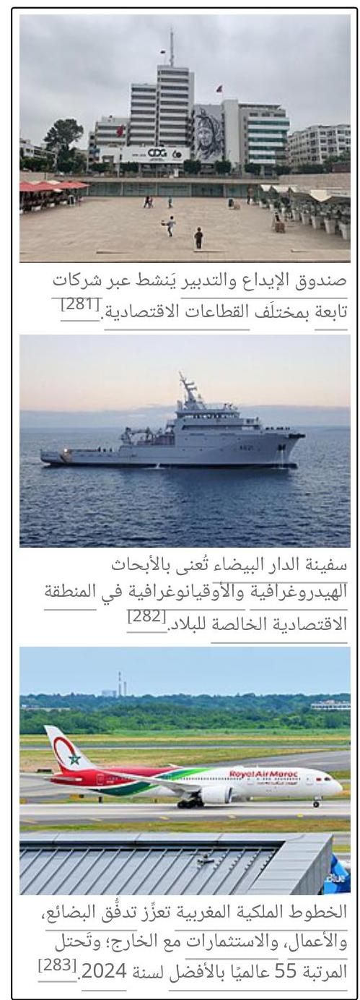)
![img-11.jpeg](data:image/png;base64,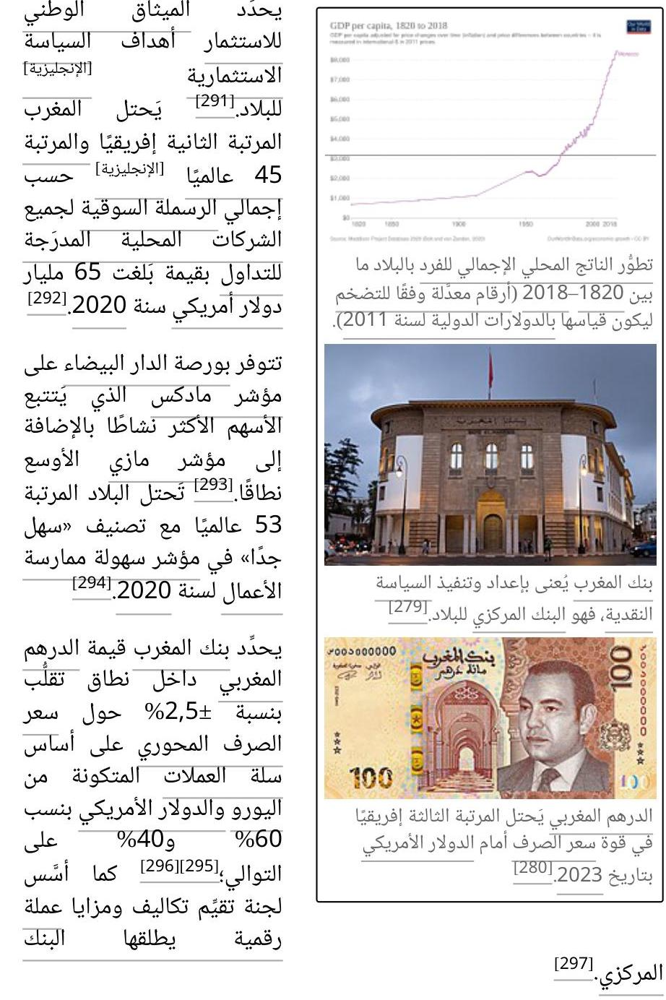)

تتكلمُ دار السكة بإصدار احتياجات البلاد من النقد الإلزامي كما تُطبع الأوراق البنكية لُعَدَد من البلدان الأجنبية. [298] تُعَد السندات الحكومية [299] المقربية من الدرجة غير الاستثمارية حسب تصنيف ستاندرد أند بورز لسنة 2023. [299]

مشاركة القطاعات الاقتصادية في الناتج المحلي الإجمالي للبلاد سنة 2017 هي كالتالي: الخدمات 56,5% والصناعة 29,5% والفلاحة 14%. [300] بَلغَ الناتج المحلي الإجمالي للبلاد قيمة 138,78 مليار دولار أمريكي حسب تقديرات صندوق النقد الدولي لسنة 2023. [301] بمتوسّط 3,750 دولار أمريكي للفرد. [301]

يُهدف مشروع فاس سمارت فاكتوري بإشرافٍ من الجامعة الأورومتوسطية إلى تحسين الإنتاجية من خلال تفعيل مفاهيم الثورة الصناعية الرابعة بالبلاد. [302] يُحتَل المغرب المرتبة 107 في إنتاجية القوى العاملة حسب تقرير منظمة العمل الدولية لسنة 2023. [303]

### قطاع الخدمات

طالع أيضًا: المالية في المغرب والسياحة في المغرب

Affichage de la page 19


|  | يُشتغل في قطاع الخدمات ما يقارب 44,9% من السكان النشطين خلال 2019؛[306] موزَّعين بشكل رئيسي على فرع التجارة 34,1%, فرع الخدمة العمومية 12,7%, فرع النقل والتخزين والاتصال 11,6%؛[306] أطلقت البلاد علامة «موروكو تيك» التي تهدف إلى تعزيز إنتاج الخدمات الرقمية داخل البلاد بالإضافة إلى توطين الأفشورينغ، والتسويق الإلكتروني، والتجارة الإلكترونية، والبرمجيات، والألعاب، والنقود المشفرة؛[307] يَحتل المغرب المرتبة الثانية إفريقيًا والمرتبة 43 عالميًا [الإنكليزية] في صادرات الخدمات سنة 2022.[308] |
|  | سوق الأحد في أكادير يَضم 6 آلاف متجر، عبر 1,2 بوابة تُقود كل منها لصنف سلع معيَّن.[304] |
|  | المركز المالي للدار البيضاء يَحتل المرتبة 57 في مؤشر المراكز المالية العالمية لسنة 2023.[305] |

يُشتغل في قطاع الخدمات ما يقارب 44,9% من السكان النشطين خلال 2019؛[306] موزَّعين بشكل رئيسي على فرع التجارة 34,1%, فرع الخدمة العمومية 12,7%, فرع النقل والتخزين والاتصال 11,6%؛[306] أطلقت البلاد علامة «موروكو تيك» التي تهدف إلى تعزيز إنتاج الخدمات الرقمية داخل البلاد بالإضافة إلى توطين الأفشورينغ، والتسويق الإلكتروني، والتجارة الإلكترونية، والبرمجيات، والألعاب، والنقود المشفرة؛[307] يَحتل المغرب المرتبة الثانية إفريقيًا والمرتبة 43 عالميًا [الإنكليزية] في صادرات الخدمات سنة 2022.[308]

تنشط بالبلاد العديد من المؤسسات البنكية، ويَصل الشمول المالي بين السكان إلى نسبة 44% ممن لديهم حسابات بنكية [الإنجليزية] بينما يَستخدم 30% المدفوعات الرقمية حسب تقرير البنك الدولي لسنة 2023.[309] يَهدف القطب المالي للدار البيضاء إلى تعزيز الخدمات المالية في البلاد ويَتمحور حول مؤسسات الخدمات المالية، الخدمات المهنية، وأنشطة المَقر العام الإقليمية والدولية؛[41] مع توسيع تواجدها في مناطق شمال إفريقيا وغربها ووسطها خصوصًا؛[310][311] توجد خُطط لتنظيم وربما تقنين العملات الرقمية بما في ذلك البينكوين.[311]

حسب إحصائيات منظمة السياحة العالمية فقد احتلت البلاد المرتبة الثانية إفريقيًا والمرتبة 35 عالميًا خلال 2019 في عدد السياح الدوليين الوافدين [الإنجليزية] بـ 12,9 مليون سائح، بينما بلغت العائدات 8,17 مليار دولار أمريكي؛[312] المدن الأكثر جذبًا للسياح هي مراكش 30%، وأكادير 16%، والدار البيضاء 8%، وطنجة 5%، وفاس 4%؛[313] يَحتل المغرب المرتبة 47 عالميًا في جودة الحياة حسب تقرير يَوإس نيوز أند وورد ريبورت لسنة 2021.[314]

المغرب عضو بالمجلس التنفيذي للمنظمة العالمية للسياحة، وفي هذا الصدد تم ترشيح المغرب كطرف في لجنة الإحصائيات للحساب الفرعي للسياحة التابع للمجلس التنفيذي نظرًا لحُبرته في ميدان الدراسات والأبحاث المتعلقة بمساهمة السياحة في الناتج الداخلي الخام.[315] يهيمِن فرع السياحة الثقافية على الفروع السياحية الأخرى حيث يمثِّل 69% من إجمالي الطاقة الإيوائية [الإنجليزية] ويستهلكها 84% من السياح الدوليين الوافدين [الإنجليزية] على البلاد، مع وجود خُطط لتطوير السياحة البيئية.[316] يَحتل المغرب المرتبة 71 عالميًا في مؤشر تنمية السفر والسياحة [الإنجليزية] لسنة 2021.[317]

تهدف الاستراتيجية اللوجستية للبلاد إلى تقليص التكاليف اللوجستية مما سيؤدي إلى الرفع من نمو الناتج المحلي الإجمالي من خلال الزيادة في القيمة المضافة، فضلًا عن المسَاهَمة في التنمية المستدامة بالحد من انبعاثات غازات الاحتباس الحراري وتجنُّب اكتظاظ الطرقات والمدن.[318] توجد خُطط لتوفير مخزون إستراتيجي [الإنجليزية] من المواد الأساسية خاصة من الأغذية وكذا من المواد الطاقية.[319] يَحتل المغرب المرتبة 20 بين الأسواق الناشئة في الخدمات اللوجستية حسب مؤشر أجيليتي للأسواق الناشئة لسنة 2023.[320]

قطاع التصنيع

المقالة الرئيسة: التصنيع في المغرب

طالع أيضًا: صناعة السيارات في المغرب

تَحتل صناعة النسيج مكانة مهمة في قطاع التصنيع، حيث تساهِم بـ 27% من مناصب الشغل و7% من القيمة المضافة في القطاع الصناعي للبلاد،[322] يصل حجم المعاملات الموجَّهة نحو التصدير 39 مليار درهم مغربي (نحو 4 مليارات دولار أمريكي) بتاريخ 2019.[323] يَحتل المغرب المرتبة الثانية إفريقيًا والمرتبة 31 دوليًا في صادرات النسيج بتاريخ 2022.[324]

Affichage de la page 20


يوجَد حضور قوي لصناعة السيارات في البلاد، مسجَّلة رقم معاملات يصل إلى 64,3 مليار درهم مَعْربي (6,4 مليار دولار أمريكي) خلال 2023، بمعدل نمو 22% على أساس سنوي. [325] يَحتل المَغرب المرتبة الأولى إفريقيًا والمرتبة 25 دوليًا من حيث إنتاج المَركبات الذي بَلَغ 535,825 سيارة ومَركبة خلال 2023. [326]

تتشكل صناعة الطيران في البلاد من صناعة وتركيب أجزاء الطائرات، مسجَّلة رقم معاملات يصل إلى 21 مليار درهم مَعْربي (2,1 مليار دولار أمريكي) خلال 2022، بمعدل نمو 40% على أساس سنوي. [327] يَحتل المَغرب المرتبة الأولى إفريقيًا والمرتبة 15 دوليًا من حيث الاستثمارات في صناعة الطيران بتاريخ 2021. [328]

تشهد صناعة الطاقة الكهربائية في البلاد نشاطًا متزايدًا، حيث كان للبرامج الرامية إلى مَعالَجة العَجز في السكن أثر إيجابي على هذه الصناعة بعدما تمكنت المقاولات المَعْربية من تكييف منتجاتها لتَساير احتياجات شرائح اجتماعية مختلفة؛ كما تَفتح الاستراتيجية الوطنية في مجال الطاقات المتجددة آفاقًا جديدة لنموها من خلال الطاقة الشمسية، والطاقة الريحية، والكفاءة الكهربائية. [329]

الصناعة الإلكترونية في البلاد أصبحت تلعب دورًا هامًا كمزوِّد ضروري لكل من صَنَاعة السيارات، والطيران، والسكك الحديدية، والطاقات المتجددة، وصناعة الدفاع؛ [330] كما تستفيد من فرص نَقل جزء منها من أوروبا الغربية إلى المَغرب مَعًا بِعزْز تطوير منتجات ذات قيمة مضافة عالية وظهور مناولين أكثر اندماجًا. [331] توجَد خُطط لإنتاج البَطَّاريات وكذا الرقائق الإلكترونية محليًا. [332]

تَضم صناعة الصيدلة في البلاد ^{[الفرنسية]} منشآت صناعية للصيدلة بَلَغ عددها 51 ويَحتل المَغرب من خلالها المرتبة الثانية إفريقيًا، تَعْطي منتجات الأدوية المحلية غالبية الطلب الداخلي ويتم تصدير 17% من الإنتاج بتاريخ 2019. [333][334] كما تسعى البلاد إلى الريادة في مجال التكنولوجيا الحيوية عبر الشروع في إنتاج لقاح كوفيد-19 سنة 2021. [335]

يحدِّد مخطط التسريع الصناعي أهداف السياسة الصناعية ^{[الإنجليزية]} للبلاد. [336] وقَّعت البلاد اتفاقية «خطة التنفيذ المشترك لمبادرة الْحَزَام والطريق» تشجِّع الصين بموجبها شركاتها الكبرى ^{[الإنجليزية]} على الاستثمار بالمغرب خاصة في صناعة السيارات، وصناعة الطيران، والتكنولوجيا الفائقة، والتجارة الإلكترونية، والصناعة الزراعية، وصناعة النسيج. [337] يَحتل المَغرب المرتبة الثانية في مؤشر التصنيع في أفريقيا لسنة 2022. [338]

### قطاع الفلاحة

المقالة الرئيسة: الفلاحة في المغرب

طالع أيضًا: الزيتون في المغرب والتمور في المغرب والقنب الهندي في المغرب

تُقدر المساحة الصالحة للزراعة في المغرب بـ 12% فقط من المساحة الإجمالية للبلاد (71 مليون هكتار)، وتشهد ضغطًا متزايدًا بسبب التوسع العمراني. [340] المحاصيل الرئيسية للبلاد هي البطاطس والطماطم والبصل والبطيخ والدلاح والجزر واللفت، بالإضافة إلى الفلفل والنعناع والقرعة والجليانة؛ [341] ويُعَد المَغرب الثالث عالميًا في إنتاج التين؛ [342] والثالث عالميًا في إنتاج الزيتون خلال 2019. [343] تَستهدِف البلاد زيادة إنتاج الحبوب ومواجهة قلة الأمطار من خلال اعتماد تقنية الزرع المباشر؛ [344][345] بَلَغ إنتاج المَغرب من القمح حوالي 7,2 مليون طن خلال 2021. [346]

Affichage de la page 21


تم تمرير قرار في اجتماع لجنة الأمم المتحدة للمخدرات يوم 5 ديسمبر 2020 والذي صوَّت فيه المغرب لصالح قبول استعمال القنب الهندي في المَجالَ الطبي، مما سيَفتح آفاقًا كبيرة للتنمية الاقتصادية من خلال تَصديره بشكل قانوني خاصة وأن البلاد تنتِج حوالي 70% من سوق القنب الأوروبي.ا^{)}^{346}^{(} كما تتوفر البلاد على خبرة متراكمة من تجارب سابقة لإنتاج القنب الصناعي ^{(}^{الإنجليزية}^{)} في أكادير، صفرو، سيدي علال التازي، وبني ملال.ا^{)}^{347}^{(}

يحدِّد مخطط المغرب الأخضر أهداف السياسة الزراعية للبلاد.^{)}^{348}^{(} يُمنع قانونًا الاستهلاك البَشري للأغذية المعدَلة وَرائيًا وذلك كإجراء احترازي إلى حين معرفة تأثيرها على الصحة العامة،ا^{)}^{349}^{(} في المقابل تركِّز البلاد على تهجين سلالات البذور ^{(}^{الإنجليزية}^{)}^{350}^{(} ثم النقاء الأصناف الأكثر مقاومة للجفاف.ا^{)}^{351}^{(} يتشكل قطاع تربية المواشي بالبلاد من حوالي 21,6 مليون رأس من الأغنام، و6 ملايين رأس من الماعز، و3,3 مليون رأس من الأبقار، و192 ألفَ رأس من الإبل بتاريخ 2021.ا^{)}^{351}^{(} يَحتل المغرب المرتبة 57 في مؤشر الأمن الغذائي العالمي لسنة 2021.ا^{)}^{352}^{(}

## قطاع الأسماك

المقالة الرئيسة: قطاع الأسماك في المغرب

يساهِم قطاع الصيد البحري بشكل مهم في الاقتصاد المحلي، حيث بَلَغت صادرات المنتوجات البحرية 22 مليار درهم مغربي (حوالي 2,46 مليار دولار أمريكي) سنة 2017. يَتوفر المغرب على منطقة بحرية تمتد على حوالي 1,12 مليون كلَم مَربع، وتُعَد من أغنى المناطقَ عالميًا فيما يتعلق بالثروة السمكية.ا^{)}^{353}^{(}^{354}^{(} يَحتل المغرب المرتبة الأولى عالميًا في تصدير سَمَك السردين المعلَّب، بكمية تصل إلى 116 ألف و850 طنًا سنة 2020.ا^{)}^{355}^{(}

يَتوفر المغرب على 21 مزرعة لتربية الأحياء المائية بتاريخ 2016، بينما بَلَغ إنتاجها 537 طن خلال 2017،ا^{)}^{356}^{(}^{357}^{(} وفي هذا الصدد تم تأسيس «الوكالة الوطنية لتنمية تربية الأحياء البحرية» والتي مهمتها تنمية الأنشطة المرتبطة بالقطاع سواء في مجال التصدير أو استهلاك السوق الداخلي، وكذلك مساعدة المستثمرين من خلال تزويدهم بمساعدة تقنية ^{(}^{الإنجليزية}^{)} متطورة.ا^{)}^{358}^{(}^{359}^{(}^{360}^{(}^{361}^{)} يَهدف الشعاب الاصطناعي في مرتين إلى تحسين كميات الأسماك المصطادة، بالإنفاقة إلى حماية الموائل البحرية وحفظ التَنوَع البَيولوجي.ا^{)}^{361}^{(}

تَحتل صناعة صيد الأسماك مكانة متميزة في اقتصاد المغرب، حيث تشهد معالجة ما يقارب 70% من إفراغات الصيد الساحلي وتَصدير ما يناهز 85% من إنتاجها، كما تتميز بتنوع تخصصاتها. تتوفر البلاد على 397 وحدة صناعية خَاصَةَ بأالصيد البحري بتاريخ 2013، ويُعَد التجميد النشاط الأبرز يليه تصبير السمك ثم توضيب السمك الطري ^{(}^{الإنجليزية}^{)}.ا^{)}^{362}^{(}^{363}^{(}^{364}^{)} يَهدف مشروع ميناء الداخلة الأطلسي إلى دعم الصناعة السمكية بالبلاد من خلال إنشاء رصيف مخصص للتجارة، رصيف مخصص للصيد البحري، وأرصفة مخصصة لإصلاح السفن.ا^{)}^{365}^{(}

## قطاع التعدين

المقالة الرئيسة: التعدين في المغرب

طالع أيضًا: الفوسفاط في المغرب

Affichage de la page 22


يُلعب قطاع التعدين في المغرب دورًا أساسيًا في الاقتصاد نظرًا لمساهمته بنسبة 10% من الناتج المحلي الإجمالي و20% في قيمة الصادرات، فضلًا عن توفيره نحو 40 ألف فرصة عمل مباشرة وغير مباشرة ^{[الانحليقة]} حسب دراسات لسنة 2023. ^{[365]} تَحتل البلاد المرتبة الأولى إفريقيًا والثانية عالميًا في إنتاج الفوسفاط،^{[366]} والذي يُعد عنصرًا أساسيًا لاستقرار الأمن الغذائي نظرًا لأهميته في صناعة الأسمدة،^{[365]} مع احتياطيات تَبلغ 50 مليار طن. ^{[366]}

عُثِر على الفوسفاط، الرصاص، الفلور، والأنتيمون في ساحل المحيط الأطلسي على امتداد 60-120 كيلومتر، وكذلك في وسط المغرب. ^{[367]} يحتوي الأطلس الصغير على احتياطيات من النحاس، المنغنيز، الذهب، الفضة، الكوبالت، القصدير، التيتانيوم، والتنجستن. ^{[367]} يحتوي الأطلس الكبير على احتياطيات من الرصاص، الزنك، النحاس، المنغنيز، الحديد، والباريت؛ بينما يتم الحصول من الريف على الزنك، الأنتيمون، المعادن الاستراتيجية ^{[الانحليقة]}، وطين السميكتايت. ^{[367]} تشتهر جهة الشرق بالرصاص، الزنك، والفحم. ^{[367]}

المعادن الأخرى المستخرجة مع معدل إنتاج متسارع هي الباريت، الطين، الكوبالت، النحاس، الفلورسيار، خام الحديد، الرصاص، الملح، الفضة، التالك، والزنك؛ إنتاج الفضة والرصاص في المغرب هو الأعلى في إفريقيا. ^{[367]} تتوفر البلاد على المواد الأولية وبراءة ابتكار تؤهلها لإنتاج كاتود الكوبالت عالي النقاوة، تغطي من خلاله الطلب المتصاعد في صناعة البطاريات. ^{[368]}

### التجارة الخارجية

المقالة الرئيسة: التجارة في المغرب

وقّع المغرب 54 اتفاقية تبادل حر تتيح لمنتَجات البلاد الوصول إلى حوالي مليار مستهلِك حول العالَم. ^{[369]} من بينها اتفاقية تجارة حرة مع أيسلندا وليختنشتاين والنرويج وسويسرا،^{[370]} اتفاقية تجارة حرة مع الاتحاد الأوروبي،^{[371]} اتفاقية تجارة حرة مع مصر والأردن وتونس،^{[372]} اتفاقية تجارة حرة مع الإمارات،^{[373]} اتفاقية تجارة حرة مع تركيا،^{[374]} اتفاقية تجارة حرة مع الولايات المتحدة،^{[375]} اتفاقية تجارة حرة مع المملكة المتحدة؛^{[376]} كما وقّع على اتفاقية إنشاء منطقة التجارة الحرة القارية الإفريقية. ^{[376]}

تتكون صادرات البلاد سنة 2017 من السلع التالية: الملابس والمنسوجات، والسيارات، والمكونات الكهربائية، والمواد الكيميائية غير العضوية، والترانزستورات، والمعادن الخام، والأسمدة (بما في ذلك الفوسفاط)، والمنتجات البترولية، والحمضيات، والخضروات، والأسماك. ^{[}^{378}^{]} البلدان الرئيسية التي يتم التصدير إليها هي: إسبانيا 23,2%، وفرنسا 22,6%، وإيطاليا 4,5%، والولايات المتحدة 4,2%. ^{[379]}

تتكون واردات البلاد سنة 2017 من السلع التالية: البترول الخام، والنسيج، ومعدات الاتصالات، والقمح، والغاز والكهرباء، والترانزستورات، والبلاستيك. ^{[380]} البلدان الرئيسية التي يتم الاستيراد منها هي: إسبانيا 16,7%، وفرنسا 12,2%، والصين 9,2%، والولايات المتحدة 6,9%، وألمانيا 6%، وإيطاليا 5,9%، وتركيا 4,5%. ^{[380]}

بُلغت قيمة صادرات البلاد 24,5 مليار دولار أمريكي بينما بُلغت قيمة الواردات 44,13 مليار دولار أمريكي سنة 2017،^{[381]} يتم تخفيف العجز التجاري الهيكلي عن طريق عائدات السياحة، والتدفقات الكبيرة لتحويلات المغتربين، وتدفقات الاستثمار الأجنبي المباشر. ^{[382]} بُلغت التجارة الخارجية نسبة 74,9% إلى الناتج المحلي الإجمالي ^{[الانحليقة]} سنة 2021. ^{[379]}^{[383]}

Affichage de la page 23


# البنية التحتية 

النقل والمواصلات
المقالة الرئيسة: النقل في المغرب
طالع أيضًا: الطرق الوطنية في المغرب والطرق السيارة في المغرب والنقل السلكي في المغرب وقائمة مطارات
المغرب وقائمة موانئ المغرب
![img-12.jpeg](data:image/png;base64,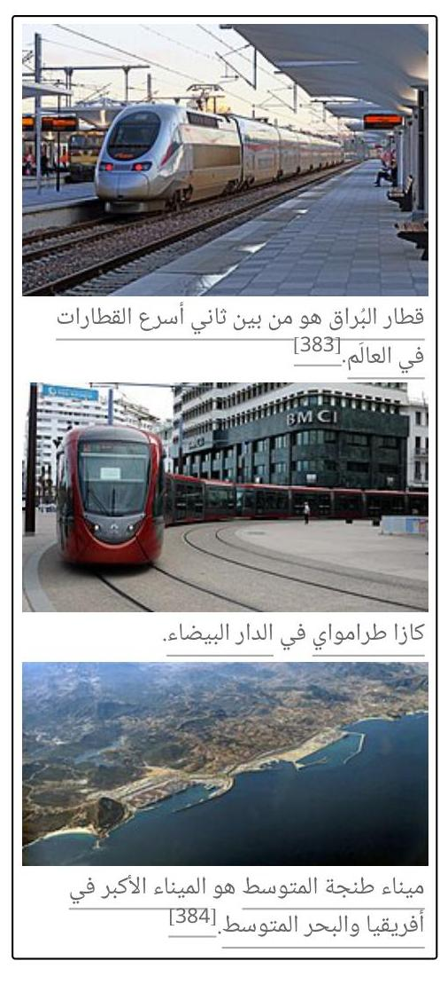)
![img-13.jpeg](data:image/png;base64,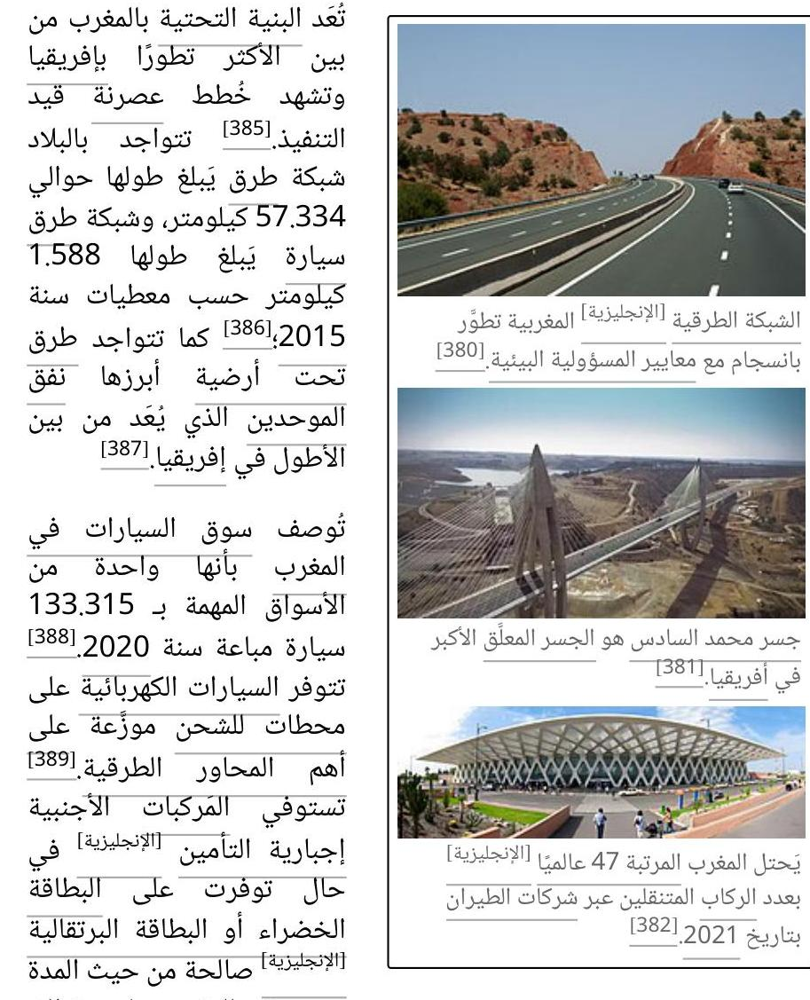)

[^0]
[^0]:    اعتمد المغرب استثمارات مالية ضخمة لإعادة تجديد وتطوير السكك الحديدية وبناء محطات قطار جديدة وعصرية واقتناء قطارات فائقة السرعة وتشييد خطوط سكك حديدية خاصة بها، وإلى غاية سنة 2018 وصَل طول السكك الحديدية بالمغرب إلى 3.815 كيلومتر منها 64% سكك مكهربة، و585 عربة لنقل المسافرين. فيما وَصَل عدد المسافرين إلى 35 مليون مسافر، وعدد محطات القطار إلى 137 محطة. [391] تتوفر البلاد على أنظمة للنقل السريع من خلال طرامواي الرباط الذي يَجمع الرباط وسَلا. [392] وكَزَا طرامواي في الدار البيضاء. [393]

    وقَّعت البلاد اتفاقية للأجواء المفتوحة مع الاتحاد الأوروبي [الإنجليزي] [394] يُسمح بموجبها لشركات النقل الجوي التابعة للطرفين بالعمل باتجاه وانطلاقًا من أي نقطة في المغرب والاتحاد الأوروبي بدون قيود على الأسعار أو السعة. [395] سَجلت المطارات المغربية حوالي 25 مليون مسافر سنة 2019 بزيادة 11,18% مقارنة مع السنة السابقة؛ تتواجد المطارات العشرة

Affichage de la page 24


الأكثر ازدحامًا بالمغرب في المدن التالية: مطار الدار البيضاء (10 مليون و306 ألف مسافر)، مطار مراكش (6 مليون و396 ألف مسافر)، مطار أكادير (2 مليون و8 ألف مسافر)، مطار فاس (1 مليون و417 ألف مسافر)، مطار طنجة (1 مليون و353 ألف مسافر)، مطار الرباط (1 مليون و100 ألف مسافر)، مطار الناظور (772 ألف مسافر)، مطار وجدة (701 ألف مسافر)، مطار الداخلة (256 ألف مسافر)، مطار العيون (255 ألف مسافر).^{(}^{396}^{)}

يُتوفر ميناء طنجة المتوسط على منطقة صناعية،^{(}^{397}^{)} بينما يُهدف مشروع ميناء الناظور غرب المتوسط ^{(}^{الفرنسية)} إلى دعم الصناعة البتروكيمياتية وتأمين إمدادات المغرب من منتجات الطاقة.^{(}^{398}^{)} بلغ النشاط المينائي المغربي قيمة 115 مليون طن سَنَةَ 2014 بزيَادَةً 14,3% مقارنة مع السنة السابقة، وهي موَرْعَة على ميناء طَنْجَة المتوسط (39 مليون طن)، ميناء الدار البيضاء (25 مليون طن)، ميناء الجديدة - الجرف الأصفر (22 مليون طن)، مَينَاء المَحْمَدِيَة (1,51 مليون طن)، مَينَاء أسَمِّي (6,2 مليون طن)، ميناء أكَادير (4,2 مليون طن)، مَينَاء العيون (3,2 مليون طن)، والموانَىْ الأخرى (0,5 مليون طن).^{(}^{399}^{)} يَحتل المغرب المرتبَةَ الأولى إفريقيًا في مؤشر ريطِ ألْسُحن البحري ^{(}^{الفرنسية)} حسب تقرير مؤتمر الأمم المتحدة للتجارة والتنمية لسنة 2021.^{(}^{400}^{)}

مصادر الطاقة

المقالة الرئيسة: الطاقة في المغرب

طالع أيضًا: الطاقة المتجددة في المغرب والنفط في المغرب
![img-14.jpeg](data:image/png;base64,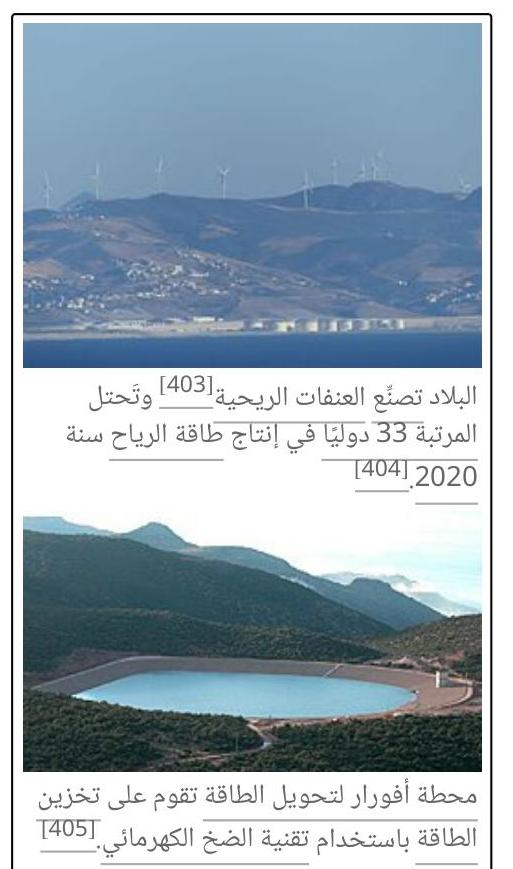)

محطة نور ورزازات تتوفر على حقل للطاقة الشمسية
| المركَّزة هو الأكبر في العالم.^{(}^{401}^{)}^{[402}^{)}

قطاع الطاقة في المغرب يهيمِن عليه الوقود الأحفوري وهو مستورَد بالكامل تقريبًا، حيث يغطي 88,5% من استهلاك الطاقة الأولية للبلاد حسب بيانات 2014 (النفط 61,9%، والفحم 21,3%، والغاز 5,3%)؛ تساهم الطاقات المتجددة بنسبة 8,8% وَواردات الكهرباء بنسبة 2,7%.^{(}^{403}^{)}^{[404}^{]} يُمتلك المَغرب احتياطيات كبيرة من النفط الصخري وكذلكَ ألغازَ الصخري التي لم تُستغَل بعدُ على نطاق صناعي، كما يُمتلك الوسائل الضرورية ليكون قادرًا على اعتماد خَيَار الطاقة النووية قبلَ سَنَة 2030.^{(}^{405}^{)}^{[406}^{]}

Affichage de la page 25


يمثِّل إنتاج الطاقة الأولية المحلية 8,8% فقط من احتياجات الدولة حسب بيانات 2014، وتتكون بنسبة 95% من الطاقات المتجددة (الكتلة الحيوية والنفايات 77,5%، والطاقة الريحية 9,4%، والطاقة الكهرمائية 8%). من ناحية أخرى، فإن توليد الكهرباء يهيمِن عليه الوقود الأحفوري بنسبة 86,4% (الفحم 54,3%، والغاز 19,2%، والنفط 12,9%) بينما تُمثل الطاقات المتجددة نسبة 13,6% (الطاقة المائية 7%، والطاقة الريحية 6,6%)،^{[406]}^{[407]} توجد خُطط لتطوير الطاقة البحرية وفي هذا الصدد أنجزت دراسات حول طاقة التيارات البحرية ^{[الإنجليزية]} بالإضافة إلى الطاقة الموجية والطاقة المدجزرية. ^{[408]}

يَبلغ استهلاك الطاقة 20,16 مليون طن نفط مكافئ، بمتوسط 0,56 طن نفط مكافئ للفرد؛ يَبلغ الطلب على الكهرباء ^{[الإنجليزية]} 1067 كيلوواط ساعة للفرد؛ تصل نسبة التبعية الطاقية إلى 90,57%؛ بينما تَبلغ الفاتورة الطاقية قيمة 49,97 مليار درهم مغربي (4,98 مليار دولار أمريكي)؛ حسب إحصاءات الطاقة لسنة 2020. ^{[409]} تتوفر البلاد على ربطٍ كهربائي ^{[الإنجليزية]} مع إسبانيا مما يَسمح باستيراد وتصدير الطاقة الكهربائية، وزيادة اتزان شبكة الكهرباء المغربية نتيجة لربطها مع الشبكة الأوروبية ^{[الإنجليزية]}. ^{[410]}

توجَد عمليات جارية للتنقيب عن الغاز الطبيعي في مناطق مختلفة بالبلاد، بما فيها حقل تندرارة وحقل الأنشوا البحري إلى جانب حقل الصويرة وحقل الغرب،^{[411]} وفي هذا الصدد ينتج المغرب 100 مليون متر مكعب سنوياً ويَستورد 900 مليون لتغطية الاستهلاك المحلي بتاريخ 2023. ^{[412]} أنبوب الغاز المغاربي الأوروبي يزوِّد العديد من محطات الطاقة العاملة بالغاز الطبيعي،^{[413]} مع وجود خُطط لربط هذا الأنبوب مع أنبوب الغاز الغرب إفريقي قادمًا من نيجيريا نحو المغرب. ^{[414]}

المغرب من بين أكثر بلدان العالم تعرضًا لأشعة الشمس حيث يتوفر على متوسط سطوع للشمس ^{[الإنجليزية]} يفوق 2960 ساعة في السنة بأغلب مناطق البلاد، بينما يَبلغ 3416 ساعة في السنة بورزازات. ^{[415]} يصل المتوسط السنوي لسرعة الرياح من 7,5 متر في الثانية إلى 9,5 متر في الثانية بمناطق الداخلة وطرفاية وِتَّارَةَ، بينما يصل من 9,5 متر في الثانية إلى 11 متر في الثانية بمناطق الصويرة الكبرى وطنجة وتطوان. ^{[416]} حسب تقرير لسنة 2020 فإن المغرب يَتصدر البلدان العربية في توليد الكهرباء من الطاقات المتجددة،^{[417]} كما تسعى البلاد إلى تسريع الانتقال الطاقي من خلال إنتاج الهيدروجين الأخضر. ^{[418]}

## الجغرافيا

المقالة الرئيسة: جغرافيا المغرب
طالع أيضًا: مناخ المغرب وتغير المناخ في المغرب

يَمتد المغرب من البحر المتوسط شمالًا والمحيط الأطلسي غربًا، عبر المناطق الجبلية الشاسعة في الداخل، إلى الصحراء في الجنوب. ^{[425]} تتحرك التيارات البحرية قُرب سواحل البلاد من تدفُّق المتوسط شمالًا،^{[426]} عبر مضيق جبل طارق، إلى تيار الكناري في دوامة شمالَ الأطلسي ^{[الإنجليزية]} غربًا. ^{[427]}

دراسة جيولوجيا المغرب مهمة لأغراض تطوير قطاع التعدين، وقطاع المياه، وقطاع الفلاحة، وقطاع الطاقة، وقطاع الهندسة المدنية، وقطاع الصناعة التقليدية، وقطاع السياحة. ^{[428]} تقع البلاد على حدود التقاء الصفيحة الإفريقية مع الصفيحة الأوراسية، هذا الالتقاء يَجعل المنطقة نشطة زلزاليًا. ^{[429]}

يَتوفر المغرب على أربعة سلاسل جبلية: الأطلس الكبير، والأطلس المتوسط، والأطلس الصغير، وجبال الريف. ^{[430]} تتواجد أعلى القمم الجبلية بالبلاد في الأطلس الكبير،^{[431]} وفي هذا الصدد تَعَد قمة جبل توبقال الأعلى في شمال إفريقيا بعلو يَبلغ 4167 متر. ^{[432]}

تُحمل رياح الغربي الرطوبة من المحيط الأطلسي لتكون سلسلة جبال الأطلس بمثابة حاجز الطقس بين الأراضي العشبية والرطبة من جهة، على نقيض الصحراء ما وراء الجبال الواقعة تحت تأثير ظل المطر من الجهة الأخرى. ^{[433]}

ينخفض معدل هطول الأمطار من الشمال إلى الجنوب، ويبقى مهمًا فقط في المرتفعات حيث يَبلغ 2000 مليمتر في جبال الريف، بينما يصل إلى أقل من 150 مليمتر في المناطق قبل الصحراوية وكذلك المناطق الصحراوية. ^{[434]}

Affichage de la page 26


![img-15.jpeg](data:image/png;base64,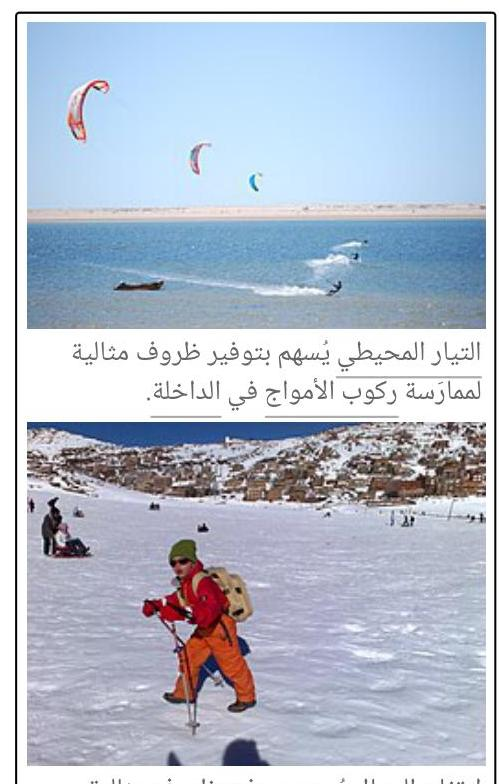)

ارتفاع الجبال يُسهم بتوفير ظروف مثالية لممارسة التزلج على الجليد في أوكايمدن.

التبراز المحيطي يُسهم بتوفير ظروف مثالية لممارسة ركوب الأمواج في الداخلة.

ارتفاع الجبال يُسهم بتوفير ظروف مثالية لممارسة التزلج على الجليد في أوكايمدن.

مصنع جبل طارق من أهم الممرات المائية، فمن خلاله تعبّر حوالي 20% من التجارة البحرية الدولية.[423]

تنتزع تصنيف المناخ بالبلاد حسب المناطق فهو متوسطي بالشمال، ومحيطي بالقرب، وقاري بالداخل، وصحراوي بالجنوب.[434] يتأثر مناخ البلاد بظاهرة تذبذب شمال الأطلسي،[435] وهي تقلبات غير منتظمة في الضغط الجوي فوق شمال المحيط الأطلسي بين مركزي مرتفع الاصور ومنخفض أيسلندا.[436] المديرية العامة للأرصاد الجوية (P200) تطلق تحذيرات الطقس (P200) من خلال أربعة مستويات لليفظة هي الأحمر والبرتقالي والأصفر والأخضر.[437]

تغيُّر المناخ من المتوقّع أن يكون له بالغ الأثر على البلاد خالقًا تحديات لا سيما في كل من القطاع الزراعي والقطاع

السَّمكي اللذان يوطِّفان أكثر من نصف السكان ويساهمان بـ 14% من الناتج المحلي الإجمالي؛[438] بالإضافة إلى ذلك ونظرًا لتمركز 60% من السكان ومعظم النشاط الصناعي على الساحل، فإن ارتفاع مستوى سطح البحر يمثّل تهديدًا كبيرًا للقوى الاقتصادية المهمة.[438] حسب مؤشر أداء التغير المناخي لسنة 2019 فقد احتل المغرب المرتبة الثانية دوليًا في مستوى التأهب بعد السويد.[439]

#### الغطاء النباتي

المقالة الرئيسة: نباتات المغرب
طالع أيضًا: قائمة المناطق الإيكولوجية في المغرب وقائمة المتنزهات الوطنية في المغرب
الغطاء النباتي بالبلاد تَغلب عليه الغابات المتوسطية، ويَتميز بالتنوع مع وجودِ الغطاء النباتي الجبلي (JCJ)،[440] المتكيّف مع الارتفاع، الغطاء العشبي في السهول والهضاب، الزراعة في الواحات، الغطاء النباتي الساحلي، بالإضافة إلى النباتات الصحراوية المتكيّفة مع الجفاف؛[441] ساعدَت الأنواع المستقدَمة على إغنائه خاصة في الساحل الجنوبي للمغرب، آين تأقلَمَت النباتات مع المناخ الصحراوي في ثلاث جهات صحراوية كبرى.[442][443] يُحتل المغرب المرتبة الأولى عالميًا في توريد طحالب الجلموم ويُستَخلَص منها الأغار الذي هو الكاشف المختبري (JCJ)،[444] الأكثر أهمية في علم الأحياء الدقيقة.[444]

Affichage de la page 27


![img-16.jpeg](data:image/png;base64,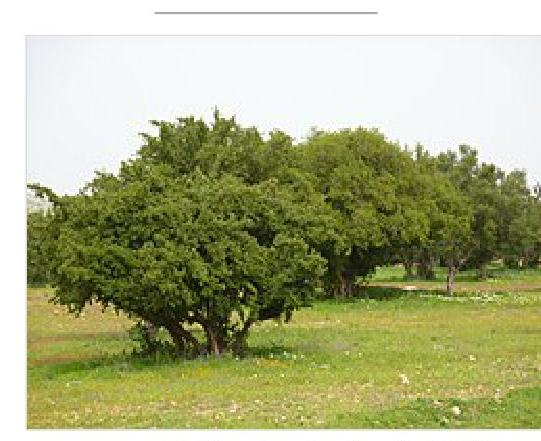)

شجرة الأركان التي يُستخرج زيت الأركان من ثمارها. [440]
تنتِج البَلاد سنويًّا حوالي 140 ألف طن من النباتات ذات الخصائص الطبية والعطرية؛ تُستعمل لأغراض الطب التقليدي، مستحضَرات الْتجميل، حِفْظ الأغذية، واستخراج الزيوت الأساسية. [445] كما يَحتل المَغْرب المَرْتبة 12 عالميًّا على مستوًى التصدير بـ 52 ألف طن من الأعشاب و5 ألف طن من الزيوت؛ الصادرات الرئيسية للبلاد هي الخروب، إكليل الجبل، الزعتر، زيت الآركان، الزيوت الأساسية، والورود. [449] في هذا الصدد تم تأسيس «الوكالة الوطنية للنباتات الطبية والعطرية» والتي مهمتها تطوير البحث العلمي والتنموي والابتكار في مجال النباتات الطبية والعطرية. [446]

يواجِه المَغرب مشكِل التصحر الذي يُطال حتى مناطقه الشمالية، ليهدِّد بالانقراض أنواعًا من النباتات ^{[الإنجليزية]} من بينها أصناف متواجدة في المَغرب حصرًا؛ وفي هذا الصدد فَقَدَ زَادت وتيرة التصحر لتصل 30 ألف هكتار سنويًّا أغلبها من أراضي الغابات لأسباب من أهمها تناقُص الموارد المائية بسبب التغيرات المناخية، الاستخراج العشوائي للمياه العذبة اللازمة لتطوُّر الغَطاء النباتي، الرعي الجائر، تعزية التربة الناجمة عن التقنيات الفَلاحية غير الملائمة لتربة المنحدرات، ازدياد ملوحة التربة، واستنزاف الغابات. [447] شُرعت البَلاد بمواجهة ذلك في تطبيق استراتيجية «غابات المَغرب 2020–2030» التي تقوم على زراعة الغابات بأصناف الأركان، البلوط الفليلي، البلوط الأخضر، العرعار، الأرز الأطلسي، الخروب، الأكالبتوس، والصنوبر؛ تهدف من خلالها إلى إعادة تشجير 600 ألف هكتار بحلول سنة 2030. [448]
تتواجد في المعمورة غابة للسنديان الفَلْيَني هي الأكبر في العالم. [449]

####  الموارد المائية

    *المقالة الرئيسة: الموارد المائية في المغرب*

    *طالع أيضًا: سياسة المغرب المائية وقائمة سدود المغرب وقائمة أنهار المغرب*

يُعرف المغرب وضعية مائية متوسطة إلى ضعيفة فهو يسجِّل 5,4 نقطة في مؤشر الموارد[451] مقابل 9,1 كمعدل عالمي، و46 في مؤشر الفقر المائي.[451] ويُمتلك ما بين 23[452] و20 مليار متر[453] من الموارد المائية في السنة، ويُحتل الرتبة 114 من أصل 174 دولة حسب مجموع الموارد المائية المتجددة[454][455] (تصل في بعض السنوات إلى 29 مليار متر^{3})،[456] وأكثر من 12,6 كلم^{3} في السنة من المياه العذبة يُحتل بها المرتبة 41 ^{[الإنجليزية]}،[457] تنقسم الموارد المائية إلى 75% سطحية (18 مليار متر^{3}) و25% باطنية (5 مليار متر^{3}).[458]

تتواجد طبقات المياه الجوفية الكارستية بشكل أساسي في جبال الريف والأطلس الكبير والمتوسط والصغير، ومنها تتدفق المياه لتشكِّل المنبع الرئيسي لجميع الأنهار الكبرى بالبلاد؛[459] أطول عشرة أنهار بالمغرب هي كالتالي: وادي درعة (1100 كلم)، أم الربيع (555 كلم)، ملوية (519 كلم)، سبع (495 كلم)، دادس (349 كلم)، زَيْز (281 كلم)، ثانْسيِفْت (270 كلم)، أبو رقراق (239 كلم)، وادي سوس (180 كلم)، نَهْرَ لوكوس (175 كلم)،[460] يَهدف مشروع الطريق السِّيار للماء إلى نقل المياه بين مختلف الأحواض باستخدام محطات الصَّحِّ عبر أنابيب فولاذية.[461]

هناك عدة مشاريع في طور الإنجاز من سدود، وقنوات، وشبكات صرف، ومحطات للتحلية والمعالجة، ومراكز أبحاث ستساعد المغرب على تدبير الموارد المائية التي هي في تناقض[462][463] بسبب عوامل طبيعية[464] وبشرية[465] تتوفر البلاد بتاريخ 2021 على 149 سدود كبيرة بسعة إجمالية تفوق 19 مليار متر^{3} بالإضافة إلى 133 سدود صغيرة في طور

Affichage de la page 28


الاستغلال!^{[}^{467}^{]} كما تتوفر على محطة لتحلية المياه في الحسيمة (بسعة 6 ملايين متر^{2})، مع خُطط لزيادة طاقة المحطات الحالية في العيون وطائطان وسيدي إفني، وبناء محطات جديدة في أكادير (144 مليون متر^{2}) والداخلة^{[}^{468}^{]} يتواجد في إقليم سيدي إفني نظام لحصاد مياه الضباب هو الأكبر في العالم.^{[}^{469}^{]}

### الحياة البرية

    *المقالة الرئيسة: الحياة البرية في المغرب*

*طالع أيضًا: قائمة طيور المغرب وقائمة تدريبات المغرب وقائمة زواحف المغرب وقائمة برمائيات المغرب*

تتواجد العديد من بقايا الأحياء القديمة التي كانت تعيش بالبلاد قبل ملايين السنين، وفي هذا الصدد توجد متاحف متخصصة في عرضِ هياكل عظمية لهذه الكائنات المنقرضة.^{[}^{471}^{]} يَشتهر المغرب بالتنوع الحيوي بفضلِ مَوقعِه وجغرافيته المميَّزة التي تَسمح لفصائل وأنواعٍ مَختلقة من العيش فيه؛ تمثِّل الطيور في البلاد الجزء الأهم من الثروة الحيوانية^{[}^{472}^{]} حيث تَضم 454 نوعًا، 5 منها تم إدخالها من طرف البشر و156 تُعَد نادرة.^{[}^{473}^{]} يَضم المغرب نقطة ساخنة للتنوع الحيوي والتي تشير إلى منطقة جغرافية حيوية تواجِه تحديثات بيئية.^{[}^{474}^{]}

تتواجد العديد من الثدييات البرية بالبلاد من بينها الأسد البربري الذي يسمى أحيانًا الأسد الأطلسي، وهو إحدى سلالات الأسُود المنقرضة في البرية ونفس السلالة التي استخدمها الرومان دَاخَل حلبات المجالدة في روما وبعض المدن الكبرى في تلك الإمبراطورية القديمة،^{[}^{475}^{]} وهو الحيوان الوطني للمغرب.^{[}^{476}^{]} كما يُعَد المكاك البربري واحدًا من أشهر الثدييات وهو القرد الوحيد في إفريقيا الذي يَتواجَد شمالَ الصحراء الكبرى، حيث يعيش في الغابات والأجزاء النائية من الريفَ والأطلس المتوسط والأطلس الكبير وكذلك على صخرة جبل طارق في جنوب إيبيريا، وأعداده آخذة في التناقص بالمغرب حيث يتقلص موطنه بسبب قطع الأشجار، وإفساح المجال للمحاصيل، والرعي الجائر.^{[}^{477}^{]}

تشمل الثدييات الكبيرة الأخرى حيوان الضأن، الغزال، الخنزير البري، لكن بأعداد ليست بالوفيرة.^{[}^{478}^{]} تشمل أكلات اللحوم حيوان الفنك، قط الرمال، ابن عرس الصغير، ابن عرس المخطط الصحراوي، النمس المصري، الضبع المخطط، وفقمة البحر المتوسط. تشمل الثدييات الأصغر حجمًا القواع الصحراوي، الأرنب الأوروبي، الشيهم المبذول، السنجاب الأرضي، العضَلان، الجرد، اليربوع، الجرد، والفأر. هناك أكثر من عشرين نوعًا من الخفافيش وعشرات الأنواع من الحيتان والدلافين.^{[}^{479}^{]} المغرب غني بالزواحف حيث تم تسجيل أكثر من تسعين نوعًا منهًا،^{[}^{480}^{]} تشمل الثعابين الصغيرة، أبراص الحائط المغاربية، وسحالي الجدار الإيبيرية ^{[الإنجليزية]}. أما البرمائيات بالبلاد فتشمل الضفادع البربرية، والضفادع المطلية المتوسطية.^{[}^{481}^{]}

## الجهات

### المدن الرئيسية

المقالة الرئيسة: قائمة مدن المغرب
![img-17.jpeg](data:image/png;base64,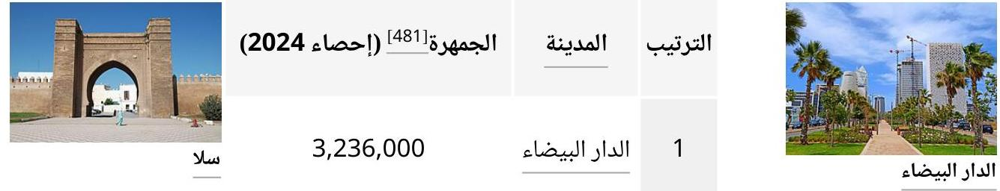)

Affichage de la page 29


![img-18.jpeg](data:image/png;base64,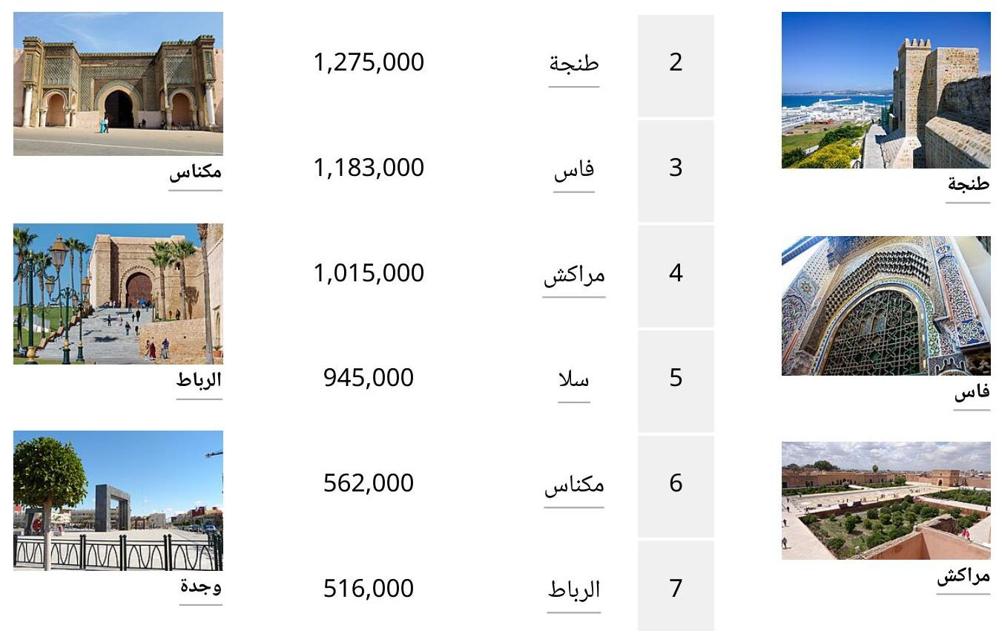)

# التقسيم الإداري 

المقالة الرئيسة: التقسيم الإداري في المغرب
طالع أيضًا: قائمة جهات المغرب
![img-19.jpeg](data:image/png;base64,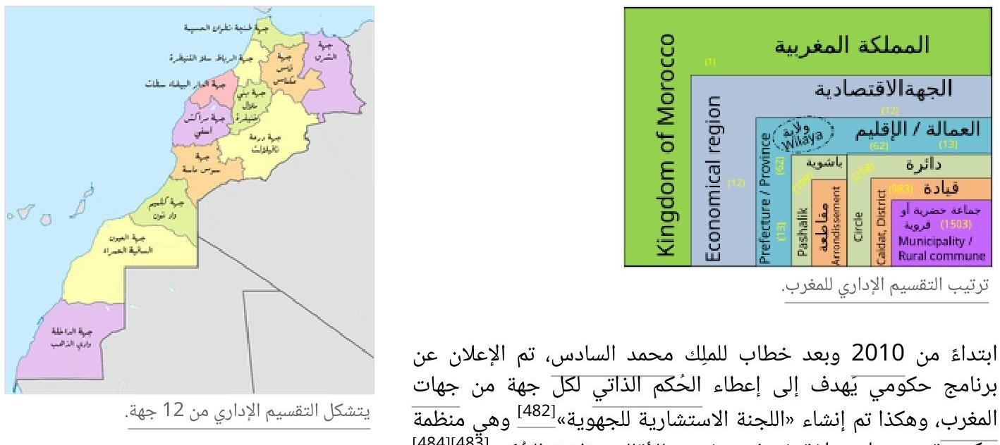)

ابتداءً من 2010 وبعد خطاب للمَلِك محمد السادس، تم الإعلان عن برنامج حكومي يُهدف إلى إعطاء الحُكم الذاتي لكل جهة من جهات المغرب، وهكذا تم إنشاء «اللجنة الاستشارية للجهوية»^{(}^{482}^{)} وهي منظمة حكومية مهمتها صياغة نموذج مغربي للأقاليم ذاتية الحُكم،^{(}^{483}^{)}^{[}^{484}^{()} وهكذا قامت اللجنة بإنشاء تقرير «أطلس التقطيع الجهوي المقترح» والذي يُتضمن 12 جهة.^{(}^{485}^{)}

تم تحديد التقسيم الجهوي الحالي سنة 2015 في إطار اللامركزية التي اعتمدتها المملكة المغربية، حيث صارت البلاد تتألف إداريًا من 12 جَهّة، وكل جهة تنقسم إلى 13 عمالة و62 إقليمًا؛ الفَرق بين العمالة والإقليم هو أن العمالة يكون أغلب سكانها حضريين وتسبتهم أكبر من السكان القرويين، وعلى العكس من ذلك فإن الإقليم تكون نسبة السكان القرويين فيه أكبر من

Affichage de la page 30


نسبة السكان الحضريين. [486]
تتوفر كل جهة على مَركز يمثّل أحد العمالات أو الأقاليم التابعة لها. [488] توجد في قاعدة التقسيم الإداري الجماعات الحضرية والجماعات القروية والتي يَبلغ مجموعها 1503 جماعة. [487] يُرأس كل مجلس جهوي رئيس منتخَب، بالتوازي مع والي جهة معيَّن؛ كما يُرأس كل مجلس عمالة/مجلس إقليمي رئيس منتخَب، بالتوازي مع عامَل عمالة/عامل إقليم معيَّن. [489]
تمارِس الجهة اختصاصات ذاتية (الإيجابية) (التنمية الجهوية، إعداد التراب)؛ واختصاصات مشتركة مع الدولة (الإيجابية) (التنمية الاقتصادية، التنمية القروية، التنمية الاجتماعية، البيئة، الثقافة، السياحة)؛ واختصاصات منقولة إليها من الدولة (التجهيزات والبنيات التحتية ذات البعد الجهوي، الصناعة، الصحة، التجارة، التعليم، الثقافة، الرياضة، الطاقة والماء والبيئة).[491]

# المؤسسات

### الإعلام والتواصل

المقالة الرئيسة: الإعلام في المغرب

طالع أيضًا: التلفاز في المغرب وقائمة جرائد المغرب وقائمة مجلات المغرب

تتوفر البلاد على الشركة الوطنية للإذاعة والتلفزة التي تهدف من خلال قنواتها إلى الحفاظ على التراث الثقافي وتنمية القطاع السمعي البصري المحلي،[492] كما تتوفر على وكالة المغرب العربي للأنباء وهي وكالة الأنباء الرسمية للمغرب.[493] تُنشَر المطبوعات الصحفية بالعربية بشكل رئيسي، بالإضافة إلى الفرنسية والإنجليزية والإسبانية والأمازيغية، وأكثر من 70% من الصحف في المغرب مملوكة مِلكية خاصة.[494] تشكّل منصات التواصل الاجتماعي أحد فضاءات النقاش العام بالبلاد ويَشمل المَجالات السياسية، والاجتماعية، والاقتصادية.[495]

تُدرَج وضعية حرية الإنترنت بالبلاد تحت تصنيف «حرة جزئيًا» حسب تقرير الحرية على البَنى (الإيجابية) لسنة 2018، والذي يغطي الإشراف والرقابة الرقمية في بلدان العالم.[496] ينظّم «القانون رقم 88.13 المتعلق بالصحافة والنشر» قطاع الصحافة بالبلاد،[497] ويَحتل المغرب المرتبة 136 عالميًا مع تصنيف «وضعية صعبة» في مؤشر حرية الصحافة حسب تقرير منظمة مراسلون بلا حدود لسنة 2021.[498]

أطلَق المغرب برنامج الحكومة الإلكترونية بهدف الاستفادة من تكنولوجيا المعلومات: حيث أن جعل الخدمات المقدمة من الإدارة على الخط سيجعلها أكثر كفاءة عبر تقليص الكلفة والأجالَ بالنسبة للمواطنين والمقاولات، كما سيجعلها أكثر فعالية عبر تحديث الإدارة والاستخدام المشترك لمواردها.[499] يَحتل المغرب المرتبة 106 عالميًا في مؤشر الحكومة الإلكترونية والمرتبة 106 عالميًا في مؤشر المشاركة الإلكترونية حسب بيانات الأمم المتحدة لسنة 2020.[500]

### الاتصالات والتكنولوجيا

المقالات الرئيسة: الاتصالات في المغرب والعلوم والتكنولوجيا في المغرب

طالع أيضًا: أرقام الهاتف في المغرب والإنترنت في المغرب

ساهَم تحرير قطاع الاتصالات السلكية واللاسلكية في إحداث ثورة اتصالات داخل المجتمع المغربي من خلال التطور الهائل في استخدام الهاتف والإنترنت.[4] عدد مستخدمي الإنترنت (الإيجابية) بلغ 27,62 مليون نسمة بنسبة 74,4% من السكان حسب الإحصائيات المنشورة بتاريخ 2021.[502] مع وجود خُطط لإطلاق شبكة الجيل الخامس بالبلاد.[503] تشير بعض الدراسات إلى أن الاستثمار في البنية التحتية الرقمية (الإيجابية) قد يساهِم في رفع أعداد المقاولات الناشئة.[504]

Affichage de la page 31


![img-20.jpeg](data:image/png;base64,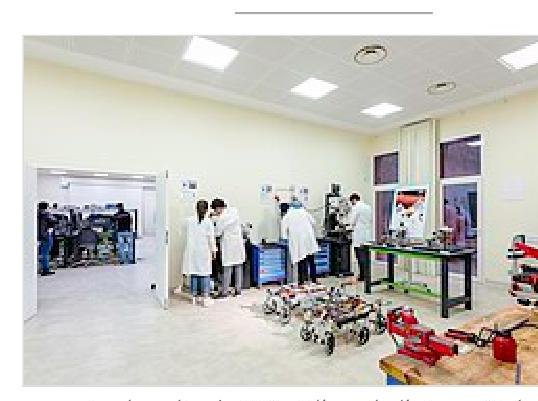)

متوافر البلاد على العديد من الأقطاب التكنولوجية [^{506}](^{506}) من بينها تكتوبوليس الرباط وتكتوبوليس وجدة [^{507}(^{508}) كما تتوفر على تجمعات للأعمال أبرزها تكتوبارك الدار البيضاء. ^{(}^{509}^{)} يُحتل المغرب المرتبة 52 عالميًا في صناعة ألعاب الفيديو بإيرادات بَلفت 129 مليون دولار أمريكي سنة 2019،^{(}^{510}^{)} كما تشارك فِرق مغربية في أولمبياد الروبوت العالَمي.^{(}^{511}^{)} يُحتل المغرب المرتبة الأولى إفريقيًا والمرتبة 22 عالميًا في مَوْسَر المِلكية الفكرية الدولي حسب تقرير غرفة التجارة للولايات المتحدة [^{512}(^{513})] لسنة 2024. ^{(}^{514)}

يتوفر المغرب على مراقبة فضائية للأرض من خلال القمر الصناعي محمد السادس-ب لأغراض رسم الخرائط ومسح الأراضي، التنمية الإقليمية، الرصد الزراعي، الوقاية من الكوارث الطبيعية وإدارتها، رصد التغيرات في البيئة والتصحر، وكذا مراقبة الحدود والسواحل،^{(}^{515}^{)} كما تتوفر البلاد على التقنية النووية من خلال مفاعل المعمورة لأغراض متعلقة بالمجالات العلمية والطبية والصناعية والزراعية.^{(}^{516}^{)} احتل المغرب المرتبة 77 في مؤشر الابتكار العالمي لسنة 2021،^{(}^{517}^{)} ثم صار في المرتبة 70 سنة 2023،^{(}^{518}^{)} وتقدَّم للمرتبة 66 سنة 2024.^{(}^{519)}

**الأجهزة الأمنية**

*طالع أيضًا: المديرية العامة للأمن الوطني (المغرب) والديستي ولادجيد*

المديرية العامة للأمن الوطني هي جهاز أمني تابع لوزارة الداخلية المغربية، وتهدف إلى إرساء الآمن والحرص على تطبيق القانون وحماية المواطنين وممتلكاتهم؛ كما تحرص على تأمين مختلف التجمعات الكبرى، والملتقيات الرياضية، والأنشطة العمومية، وتأمين مباريات كرة القدم، ومكافحة الشغب؛^{(}^{520}^{)}^{(}^{521}^{)}^{(}^{522})} يَبلغ عدد أفرادها 74.520 موظفًا حسب معطيات سنة 2020. ^{(}^{523)}

القوات المساعدة هي جهاز أمني في المغرب وجميع أفرادها خاضعون لنظام عَسَكري، تَنقسم المفتشية العامة للقوات المساعدة إلى شطرين: شطر الشمال وشطر الجنوب؛ وفي هذا الصدد يَعمل أفراد القوات المساعدة في الغالب إلى جانب السلطة المحلية كما يمكِنهم مسانَدة الأمن الوطني والدرك الملكي والقوات المسلحة الملكية والوقاية المدنية عند الحاجة.^{(}^{524}^{)}^{(}^{525)}

الدرك الملكي هي مؤسسة أمنية وعسكرية في المغرب يَتركز عملها في المجال غَيرَ الحَضَرِي خصوصًا المناطق القروية البعيدة عن المدن؛ ويتكون الدَركَ المَلكي من عدة وحدات مِنها ما يَختص في مراقبة حركة السير خارج المدن، ومنها وحدات خاصة للتدخل السريع ومكافحة الجرائم والمَخدرات والهجرة السرية، ووحدات أخرى لمراقبة الشواطئ والغابات والمطارات.^{(}^{526}^{)} تتوفر هذه الْمؤسسة على عدة فروع: سلاح الجو، المدرعات، المظليين، سلاح البحرية، والقوات الخاصة.^{(}^{525)}

المديرية العامة للوقاية المدنية هي الجهاز المكلف بالإنقاذ، الإسعاف، وإطفاء الحرائق؛ وتعمل بالأساس على حماية السكان والممتلكات من الأخطار، والسهر على مكافحة الحوادث والكوارث والتخفيف من آثارها.^{(}^{527}^{)} المغرب عضو في منظمة الدفاع المدني الدولية [^{528}(^{529})] ويُحتل المرتبة 51 عالميًا في خطر الكوارث الطبيعية حسب مؤشر المخاطر العَالَمي [^{530}(^{531})] لسنة 2022.^{(}^{528}^{)}

Affichage de la page 32


تقوم «اللجنة الاستراتيجية لأمن نظم المعلومات» على تحديد التوجهات الاستراتيجية، وضمان السيادة الرقمية ^{[الإنجليزية]}، بالإضافة إلى ضمان مرونة نظم المعلومات ^{[الإنجليزية]} في الحكومة والمؤسسات العامة وكذا البنية التحتية الحيوية.2020] يُحتَلُ المغرب المرتبة 50 عالميًا في مؤشر الأمن السيبراني حسب تقرير الاتحاد الدولي للاتصالات لسنة 2020.2020

توجَد أجهزة استخباراتية متعددة ذات اختصاصات مختلفة،2021] من بينها الديستي التي تُعَد وكالة الاستخبارات الداخلية،2021[516] وكذا لادجيد التي تُعَد وكالة الاستخبارات الخارجية؛2022] وفي هذا الصدد تُجمع المغرب اتفاقيات للتعاون الاستخباري ^{[الإنجليزية]} مع الْعَدَيد من الدول.2034]2035] يُحتَلُ الْمَعْرب المرتبة 79 في مؤشر السلام العالمي لسنة 2021.2021

### القوات المسلحة

المقالة الرئيسة: القوات المسلحة الملكية المغربية
طالع أيضًا: التجنيد في المغرب
القوات المسلحة الملكية المغربية هي المؤسسة العسكرية للمغرب،2036] من مَهامها الدفاع عن الوطن والحفاظ على الوحدة الترابية للبلاد،2037] كما ساهمت في عدة مشاريع تنموية بمختلف منَاطَقَ المَمْلَكَةَ برجالها ومعداتها، وساعدَت في عمليات الإنقاذ خَلال الكوارث الطبيعية.2038] يساهِم المغرب في مهمات حفظ السلام تحت غطاء الأمم المتحدة،2039] ويُحتل المرتبة 11 عالميًا ضِمنَ أكبر المساهمين بأكثر من 1700 جندي وشرطي منتشرين عبر العالَم بتاريخ 2023.2023

ملك المغرب هو رئيس الأركان وفق دستور البلاد؛2040] حَرص ملوك المغرب على تنمية الطاقات الدفاعية للقوات المَسْلَحة وتطوير ترسانتها وتكوين أطرها وضباطها وجنودها في مختلف صفوف وحداتها.2038] تتشكل القوات المسلحة الملكية المغربية من القوات البرية (تتضمن الحرس الملكي)، القَوَاتَ البحرية (تتضمن حَفر السواحل ومَسَّاةَ البحرية)، القوات الجوية، بالإضافة إلى الدرك الملكي الذي تَشْرِفُ عليه إدارة الدفاع الوطني.40

تُضم فروع القوات المسلحة 195.800 فرد عسكري في الخدمة الفعلية ^{[الإنجليزية]}، وفي حالة احتساب قوات الاحتياط والقوات شبه العسكرية يَصِلُ المجموع الكلي إلى 395.800 فرد عسكري ما يعادل نسبة 11,5 لكل ألف نسمة، حسب تقرير المعهد الدولي للدراسات الاستراتيجية لسنة 2021.2021] يُتبنى المغرب الخدمة العسكرية الإلزامية، ويَشمل التجنيد بالبلاد جميع المواطنين والمواطنات البالغين ما بين 19 و25 سنة، مع استثناء واسع وتأجيلات مؤقتة لحالات العجز البدني أو الإعالة الأسرية أو متابعة الدراسة بالإضافة إلى حالات أخرى، وتمتد فترة التجنيد 12 شهرًا.2043]2044]

الجدار الزمني هو سائر أرضي ^{[الإنجليزية]} يَضم مراكز تعالِج المعلومات الواردة من الرادار لتوجيه نيران المدفعية، ويتواجد خلف كل مَركَز رئيسي قوة لَرد الفعل السريع تتضمن دعمًا للوحدات المتحركة.2045] يتوفَر محيط هذا الحزام الأمني على مانع أرضي ^{[الإنجليزية]} من بين مَكَونَاته حقول الألغام، ويُعتمد على غطاء جوي تشارِك فيه المسيَّرات القتالية.2046

بَلَغ الإنفاق العسكري للمغرب 4,8 مليار دولار أمريكي، ما يعادل 4,3% من الناتج المحلي الإجمالي خلال 2020؛2046] تسعى البلاد إلى التخفِّيِفَ من فاتورة الإنفاق العسكري من خلال تصنيع بعض الأسلحة وقِطَع الغَيار محليًا.2047] قد يؤدي إدماج أنظمة الحرب الإلكترونية إلى توقيرَ في التكاليف المرتبطة بالدَّخَائِر التقليدية، ثم زيادة الكفاءة لأن الإشعاع الكهرومغناطيسي ينتقِل بسرعة الضوء حَارِمًا الأهداف المعادية من المناورة.2048]

Affichage de la page 33


مناورات الأسد الإفريقي هي مناورات عسكرية يستضيفها المغرب سنويًّا، وتُشمل تدريبات متنوعة من بينها مكافَحة المَنظَمَات الإرهابية وكذا التطهير البيولوجي والإشعاعي والنووي والكيميائي، وتمتد برًّا وجوًّا وبحرًا بمشاركة العديد من الَدوَل.^{)}^{549}^{(} يَتوفر المغرب على وضَع حليف رئيسي خارج الناتو،^{)}^{550}^{(} مما يَمنح البلاد مجموعة متنوعة من المزايا العسكرية والمالية.^{)}^{551}^{(} يَحتل المغرب المرتبة 18 ^{(}^{الإنجانيَّة}^{)} في مؤشر العَسَكرة العالمي ^{(}^{الإنجانية}^{)} لسنة 2022.ا^{)}^{551}

## الثقافة

المقالة الرئيسة: ثقافة المغرب
طالع أيضًا: الدين في المغرب وقائمة مواقع التراث العالمي في المغرب وقائمة التراث الثقافي اللامادي في المغرب

استُقر بالمغرب عبر تاريخه العديد من العناصر البشرية الوافدة: سواء من الشرق كالفينيقيين واليهود الشرقيين والعرب، أو من الجنوب كالأفارقة القادَمَيْن من جنوبَ الصَحراءَ الكُبَرَى، أو من الشمال كالرومان والوندال واليَهوَد الآوروبيين؛ كان لهذه المكونات البشرية جميعها أثر على مكوناته السُّكانية واللغوية التي صارت تَضَم تعددية ثقافية رسَّخها دستور البلاد.^{)}^{559}^{(}^{)} معظم السكان هم من العرب والأمازيغ.^{)}^{4}^{(} يَحتل المغربَ المَرتبة الثانية إفريقيًّا والمرتبة 14 عالميًا من حيث احتضان وغنى التراث حسب تقرير يو إس نَيوز آند وورد ريبورت.^{)}^{560}^{(}

فاطمة الفهرية أنشَأت جامعة القرويين سنة 859 لتصير واحدة من المراكز الروحية والتعليمية الرائدة خلال العصر الذهبي للعالَم الإسلامي،^{)}^{561}^{(} كمَا شَهِدَت البلاد تطوير الأرقام العربية والتي انتشرت بشكلها المبتكَر في جميع أنحاء العالَم.^{)}^{562}^{(} أقدم ما ذُكر عن صناعة الورق بالمغرب أنها تواجدت بمدينة فاس التي كانت تتوفر على مَصنع للورق ^{(}^{الإنجانية}^{)} سنة 1100،^{)}^{563}^{(} كما توفرت البلادَ على مستشفيات أشهرها مارستان سيديَ قرج الذي تأسَّس جامعًا التخصصات الطبية لعلاج الإنسان وأيضًا الحيوانات البرية والمستأنَسة سنة 1286.^{)}^{564}^{(}

يَضم المغرب عددًا من مواقع التراث العالمي تم اختيارها من طرف اليونسكو لأهميتها الثقافية: الموقع الأثري لوليلي، المدينة القديمة لمكناس، قصبة آيت بن حدو، المدينة القديمة للصويرة، المدينة القديمة لفاس، المدينة القديمة لمراكش، المدينة القديمة لتطوان، المدينة القديمة للجديدة، بالإضافة إلى العاصمة الحديثة والمدينة القديمة للرباط.^{)}^{565}^{(} تعمل أكاديمية الفنون التقليدية على تدريب الحرفيين بمنهج علَمي لغرض الحفاظ على المعالم التاريخية بالبلاد.^{)}^{566}^{(}

تقوم اليونسكو بتسجيل أشكال من التراث المحلي وذلك حسب اتفاقية بهذا الخصوص.^{)}^{567}^{(} هناك ممارسات مغربية على قائمة التراث الثقافي غير المادي تم إدراجها بعَرض الحفاظ عليها للأجيال القادمة: العادات والممارسات والدراية بشأن شجرة الأركان،^{)}^{568}^{(} الحمية المتوسطية،^{)}^{569}^{(} موسم طانطان،^{)}^{570}^{(} فضاء جامع الفنا الثقافي،^{(}^{571}^{)} الصقارة كتراث إنساني حي،^{)}^{572}^{(} مهرجان حب الملوك،^{)}^{573}^{(} العادات والممارسات والدراية بشأن نَخلة التمر،^{)}^{574}^{(} غَنَاوة،^{)}^{575}^{(} إنتاج واستهلاك الكسكس،^{)}^{576}^{(} التيوريدة،^{)}^{577}^{(} وفن الخط العربي.^{)}^{578}^{(}

تتواجد في البلاد العديد من المتاحف والمَعارض الفنية،^{)}^{579}^{(} بالإضافة إلى العديد من المهرجانات والمواسم الثقافية.^{)}^{580}^{(} تتنوع المتنزهات الوطنية بالبلاد بين الفَضَاءات التي تُمنَع فيها الأنشطة البشرية، وبين تلك التي يُسمح فيها بأنشطة مُتحكم بها لأغراض السياحة البيتية وكذا الاستغلال الغابوي والزراعي وفق منظور التنمية المستدامة.^{)}^{581}^{(}

سَجلت وزارة الثقافة المغربية تنظيم ما يزيد عن 556 عرضًا فنيًا في مختلف الجهات، وهي تشرِف على تنظيم 22 مهرجانًا بما يزيد عن 4500 فَنَان سنويًا وتحظى بمتابعة مليوني متفرج، حسب بيانات سنة 2018،^{)}^{580}^{(} يَحتل المغرب المرتبة الثالثة إفريقيًّا والمرتبة 46 عالميًا في مؤشر القوة الناعمة حسب تقرير براند فاينانس لسنة 2022.ا^{)}^{582}^{(}

### الأدب والنشر

المقالة الرئيسة: الأدب في المغرب
طالع أيضًا: خط مغربي

Affichage de la page 34


![img-21.jpeg](data:image/png;base64,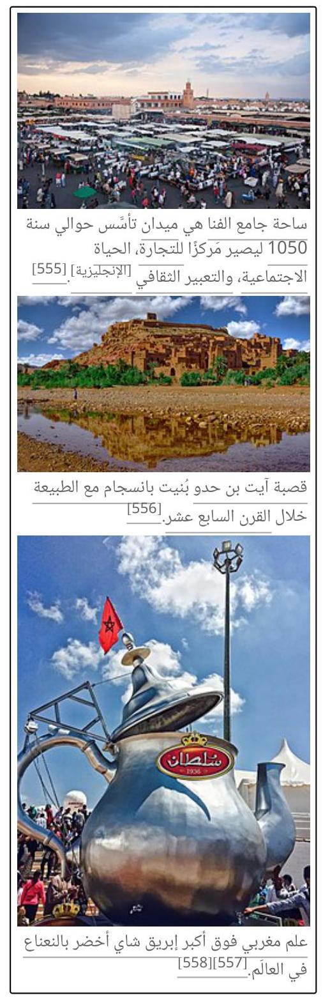)

أُعْد قصيدة «الملعبة» للشاعر الكفيف الزرهوني (توفي سنة 1348) أقدم نص معروف بالدارجة المغربية. 1584 كما تم تدوين رحلة ابن بطوطة في «تحفة النظار في غرائب الأمصار وعجائب الأسفار» سنة 1355، وهي من أشهر وأهم ما كُتب في أدب الرحلة. 1585 أُعظت روايات عبد الرحمان المجذوب (توفي سنة 1568) فكرة عن المعرفة الشائعة للمجتمع خلال تلك الفترة بغرض استخلاص الحكم منها. 1586

تُضم الخزانة الزيدانية العديد من المخطوطات العلمية والأدبية التي تم تجميعها إلى غاية 1612، وتوفرت المكتبة على مؤلفات بعدة لغات. 1587 جُلب محمد ابن الطيب الروداني آلة الطباعة الحجرية من مصر للمغرب سنة 1864 وسُميت «المطبعة السعيدة». 1588[1589] وبعد وفاته ظلت المطبعة تحت إشراف السلطات الحكومية حتى سنة 1871. 1589 ألّف أحمد بن خالد الناصري كتابه «الاستقصا لأخبار دول المغرب الأقصى» المنشور سنة 1895، وهو كتاب عن التاريخ الوطني المغربي يُعتمد على مصادر متعددة ويُدرج الاقتباسات في
![img-22.jpeg](data:image/png;base64,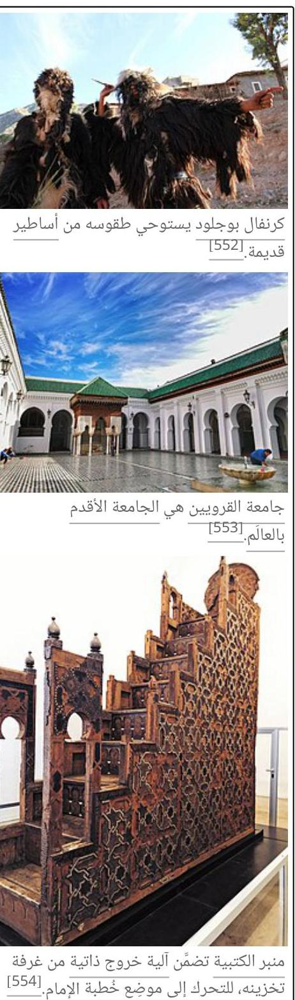)

كان الأدب خلال القرن العشرين يُتسم بالوطنية المتأججة، والحنين إلى مسقط الرأس ومرابع الصبا، حيث إن قصائد من تلك الفترة تكاد لا تخلو من هذه الظاهرة؛ 1591 وفي هذا الصدد عُرفت الرواية المغربية تطورات من خلال بروز تيارات متأثرة بالمدارس الأدبية العالمية، وأيضًا بالسياق السياسي والاجتماعي 1592. 1593 «داخليًا وخارجيًا» 1594 بَلَغت الكتب والمجلات المنشورة في الأدب والعلوم الإنسانية والاجتماعية، سواء الإصدارات الورقية أو الرقمية، ما مجموعه 3312 منشورًا بالعربية، 775 منشورًا بالفرنسية، 72 منشورًا بالإنجليزية، و45 منشورًا بالأمازيغية، حسب إحصائيات الموسم 2019-2018. 1593

البحث والتطوير

المقالة الرئيسة: قائمة مراكز البحث في المغرب

Affichage de la page 35


![img-23.jpeg](data:image/png;base64,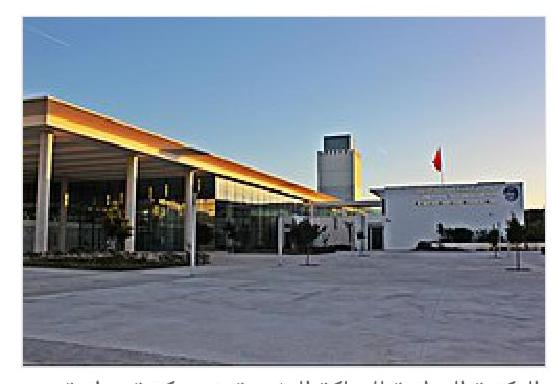)

المكتبة الوطنية للمملكة المغربية هي مكتبة وطنية تُعنى بجمع ومعالجة وحِفظ ونشر الرصيد الوثائقي المغربي [583]

يحدّد مخطط تسريع تحوُّل منظومة التعليم العالي والبحث العلمي والابتكار الإطار الاستراتيجي الأساسي الذي تسعى من خلاله الحكومة المغربية إلى تحقيق تحوُّل شامل في قطاع البحث والتطوير بحلول سنة 2030، يهدف المخطط إلى تعزيز قدرات البحث العلمي، تشجيع الابتكار، وزيادة التعاون الدولي مع شركاء أجانب مثل الاتحاد الأوروبي [597] 597
![img-24.jpeg](data:image/png;base64,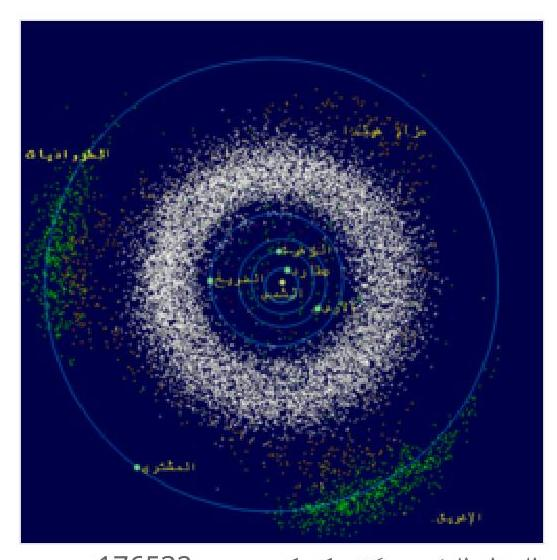)

الحزام الرئيسي يضم كويكب يسمى 176532 بسكري [598] 598 تيمنا بالباحث الفلكي عبد الكريم بسكو [595]

|  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |

Affichage de la page 36


#### الصناعة التقليدية

المقالة الرئيسة: الصناعة التقليدية في المغرب
طالع أيضًا: عمارة مغربية وزخرفة مغربية والألبسة التقليدية في المغرب
![img-25.jpeg](data:image/png;base64,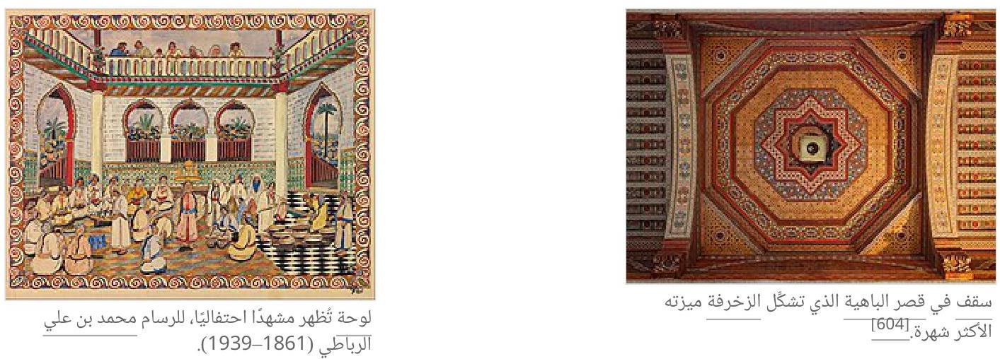)

لوحة تُظهر مشهدًا احتفاليًا، للرسام محمد بن علي الرّبَاطي (1861–1939).

يلاحَظ في خصائص الطراز المعماري الذي يَحمل اسم العمارة المغاربية (أو «العمارة المورية» نسبة إلى الموريين)ا^{605} أنها مَرَجت التأثيرات من الثقافة الأمازيغية، والثقافة الإيبيرية، والتيارات الفنية في الشرق الأوسط، لتطوير أسلوب فريد مع سمات مميَّزة مثل قوس حدوَة الحصان، وحدائق الرياض، وزخارف هندسية من الآرابيسك والخشب والجص والبلاط (خاصة الزليج)؛ من أهم المراكز التي اعتُمدَت هذا الطراز المعماري فاس ومَراكش وإشبيلية وغرناطة وقرطبة وتلمسان والفيروان،ا^{606}^{[607]} كما يَعرف بعض التواجد بمناطق أخرى في العالَم من خلال إحياء العمارة المورية.ا^{608} تتشكل الزخرفة المَغربية من عناصر تقليدية أبرزها الفوانيس، والزربية، والزليج، بالإضافة إلى المطبوعات الفنية المحلية.ا^{609}

تتميز الأزياء التقليدية المغربية بالتنوع حيث تُعرف كل مدينة بطرز معيّن يُنسب لها.ا^{610} من أشهر الألبسة للذكور هناك الجلابة الرجالية، القفطان الرجالي، الكندورة الرجالية، الجبادور الرجالي، القشابة، الدراعة، والبلغة؛ ومن أشهر الألبسة للإناث هناك الجلابة النسائية، القفطان النسائي، الكندورة النسائية، الجبادور النسائي، التكشيطة، المنصورية، المضمة، البرنوس، الحايك، اللبسة، السِّدة، اللباس الجبلي، الكسوة الكبيرة، الملحَفة، والشربيل.

أطلِق «برنامج المحافظة على جرف الصناعة التقليدية» والذي تم من خلاله توصيف وتوثيق 32 حرفة يدوية من بين لائحة أولية تَضم 42 حرفة مهددة بالانقراض بتاريخ 2019، كما وَضَع منظومة تكوينية تَعتمد التقنيات الحديثة في مجال التعليم السمعي البصري والمعلوماتي، وذلك بهدف الحفاظ على المهارات والمَعارف المرتبطة بفنون الصناعة التقليدية المحلية وضمان انتقالها عبر الأجيال.ا^{611}

#### المطبخ والتغذية

المقالة الرئيسة: مطبخ مغربي
طالع أيضًا: قائمة الأطباق المغربية وقائمة الحلويات المغربية

يُعَد المطبخ المغربي من أكثر المطابخ تنوعًا في العالَم،ا^{612} ويَرجع ذلك إلى تفاعل البلاد مع العالَم الخارجي منذ القِدم، فهو مزيج من المطبخ الأمازيغي والعربي والأندلسي والمتوسطي.ا^{613}^{[614]} يَحتل المغرب المرتبة 21 عالميًا في استهلاك الفرد للطاقة العَدّائية ٢١٠٠٠٠٠٠٠ حسب تقرير عالَمنا في البيانات لسنة 2018.ا^{615}

من أشهر الأطباق المغربية هناك الكسكس، البسطيلة، المروزية، الطاجين، الطنجية، الزعلوك، الببصارة، الحرشة، المسمن، البغرير، الرقيسة، والحريرة؛ ومع كونها شوربة فقط، فهي تُعد وجبة كاملة وتقدَّم عادة مع التمر خلال شهر رمضان بالبلاد.

Affichage de la page 37


![img-26.jpeg](data:image/png;base64,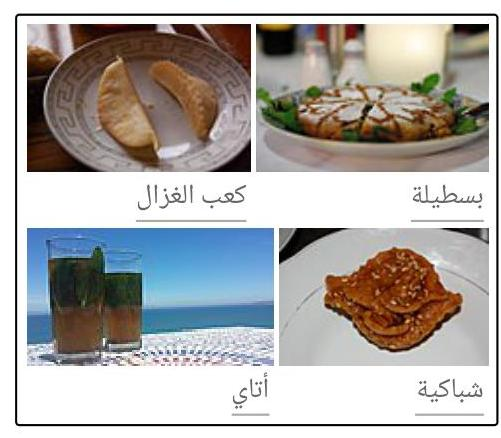)

|  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |

Affichage de la page 38


تحتضِن مدينة ورزازات مجموعة من الاستوديوهات الضخمة التي صُورت بها العديد من الأفلام العالمية، وهي مبنية على مساحات كبيرة بمدخل المدينة ومفتوحة على قضاء شاسع يَشمل مناظر جبلية، وتَضم ورشات للمهن السينمائية من خياطة، نجارة، صباغة، ماكياج، جبس، نقاشة، ومؤثرات فنية؛ إضافة إلى مواقع للمتفجرات، إسطبلات لمئات الخيول والجمال، مكاتب لإدارة الإنتاج، واستديوهات للتصوير؛ كما تَصَم وحدات فندقية مصنفة بكافة مرافقها الضرورية.^{(}^{624}^{)} يَختار العديد من المَخرجين العالميين تصوير أفلامهم بورزازات نظرًا لعدة عوامل أهمها المناظر الطبيعية المتنوعة التي تزخر بها المنطقة، والتسهيلات الإدارية والمالية التي تُقدِمَها السلطات، والخبرة التي توفرها المؤسسات المحلية المتخصصة في السينما.^{(}^{625}^{)}^{626)}

**الرياضة والملاعب**

*المقالات الرئيسة: الرياضة في المغرب وقائمة ملاعب كرة القدم في المغرب*

*طالع أيضًا: المغرب في الألعاب الأولمبية وكرة القدم في المغرب*

ملعب طنجة استضاف كأس العالم للأندية 2022.^{(}^{626}^{)}

المنتخب المغربي يحتل المرتبة 14 ▼ 2. (8) يونيو 2024.^{(}^{627}^{)} في تصنيف الفيفا العالمي.

اللجنة الأولمبية المغربية هي منظمة غير ربحية مهمتها تنمية وتطوير وحماية الحركة الأولمبية في البلاد.^{(}^{628}^{)} تُعَد مراكز التدريب من العناصر المهمة التي تسَاهِم في تطوير مستوى الرياضيين وتأهيلهم للمشاركة في الأحداث الرياضية الدولية من خلال منتخبات متخصصة في مختلف الألعاب، مع توفير العديد من القاعات المغطاة ^{(}^{الإنجليزية)} المجهَّزة بأحدث التقنيات.^{(}^{629}^{)} يَتوفر المغرب على إجمالي 24 ميدالية أولمبية (7 ذهبية، 5 فضية، 12 برونزية) يَحتل من خلالها المرتبة 65 عالميًا بتاريخ 20 فبراير 2022.^{(}^{630}^{)}

الرياضة الأكثر شعبية في البلاد هي كرة القدم تليها لعبة الكريكت، وكرة السلة، والرغبي، والهوكي.^{(}^{631}^{)} تُعَد الدرجة الأولى من البطولة الوطنية المغربية أعلى منافسة رياضية بين الأندية المغربية لكرة القدم؛ يَتكون الدوري من 16 ناد يَلعب كل فريق مع الآخر مرتين ذهابًا وإيابًا حيث يَهبط محتلًا المركز الخامس عشر والمركز السادس عشر إلى دوري الدرجة الثانية، بينما يَصعد حائرًا المركز الأول والمركز الثاني في دوري الدرجة الثانية؛^{(}^{632}^{)} يُعتبر نادي الوداد الرياضي الأكثر تتويجًا في هذه البطولة برصيد 20 لَقب حسب بيانات سنة 2020.^{(}^{633}^{)}

الجامعة الملكية المغربية لكرة القدم هي المسؤولة عن إدارة نشاط كرة القدم بالبلاد، كما تسهر على تنظيم المسابقات الوطنية والدولية.^{(}^{634}^{)} شارك المغرب في كأس العالم خلال بطولة 1970 في المكسيك، ثم 1986 في المكسيك، ثم 1994 في الولايات المتحدة، ثم 1998 في فرنسا، ثم 2018 في روسيا، ثم 2022 في قطر حين نجح في الوصول إلى نصف النهائي؛ كما تُوج بكأس الأمم الإفريقية مرة واحدة سنة 1976.^{(}^{635}^{)}^{636)} يَهدف المغرب إلى تنظيم كأس العالم 2030 من خلال ملف ترشيح مشترَك مع إسبانيا والبرتغال.^{(}^{637}^{)}

**العطل الرسمية**

*المقالة الرئيسة: قائمة العطل الرسمية في المغرب*

توجد في المغرب 13 عطلة رسمية في السنة:^{(}^{638}^{)}

Affichage de la page 39


| الوصف | الاسم المحلي | الاسم الرسمي | التاريخ | التاريخ |
| عطل تعتمد التقويم الهجري |  |  |  |  |
| أول أيام السنة حسب التقويم الهجري (أعياد دينية) |  |  | 1 | 1 محرم |
| عيد المولد النبوي (أعياد دينية) |  |  | 12 ربيع الأول | 12 ربيع الأول |
| عيد الفطر (أعياد دينية) |  |  | 1 شوال | 1 شوال |
| عيد الأضحى (أعياد دينية) |  |  | 10 ذو الحجة | 10 ذو الحجة |
| عطل تعتمد التقويم الميلادي |  |  |  |  |
| أول أيام السنة حسب التقويم الميلادي (أعياد عالمية) |  |  | 1 | 1 يناير |
| ذكرى تقديم الملك محمد الخامس طلب استقلال المغرب عن الحماية سنة 1944 (أعياد وطنية) |  |  | 11 يناير | تقديم وثيقة الاستقلال |
| يوم الاحتفال بالعمل والتضامن مع العمال (أعياد عالمية) |  |  | 1 مايو | 1 مايو |
| ذكرى تتويج ولي العهد محمد السادس ملكا على المغرب سنة 1999 (أعياد وطنية) |  |  | 30 يوليو | عيد العرش |
| 14 أغسطس |  |  | 14 أغسطس | استرجاع إقليم وادي الذهب |
| ثورة شعبية ضد الحماية بعد تنحية ونفي الملك محمد الخامس سنة 1953 (أعياد وطنية) |  |  | 20 أغسطس | ثورة الملك والشعب |
| 21 أغسطس |  |  | 21 أغسطس | عيد الشباب |
| 6 نوفمبر |  |  | 6 نوفمبر | ذكرى المسيرة الشعبية لتحرير الصحراء الغربية سنة 1975 (أعياد وطنية) |
| 18 نوفمبر |  |  | 18 نوفمبر | عيد الاستقلال |
| عطل تعتمد التقويم الأمازيغي |  |  |  |  |
| أول أيام السنة حسب التقويم الفلاحي الأمازيغي (أعياد ثقافية) |  |  | 14 يناير | رأس السنة الأمازيغية |

Affichage de la page 40


![img-27.jpeg](data:image/png;base64,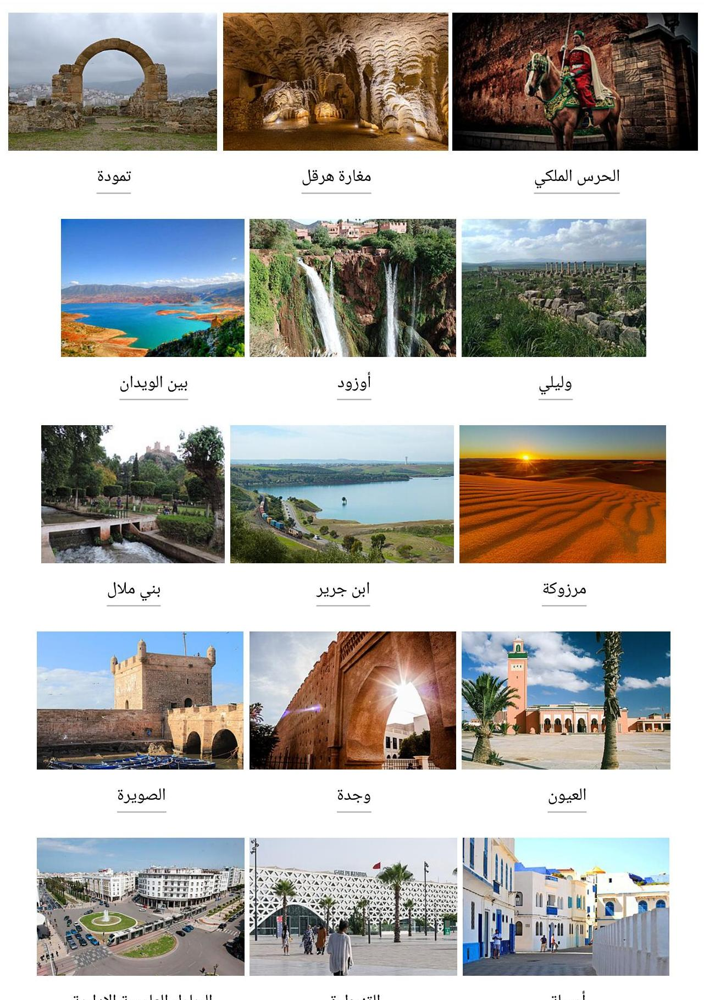)

Affichage de la page 41


![img-28.jpeg](data:image/png;base64,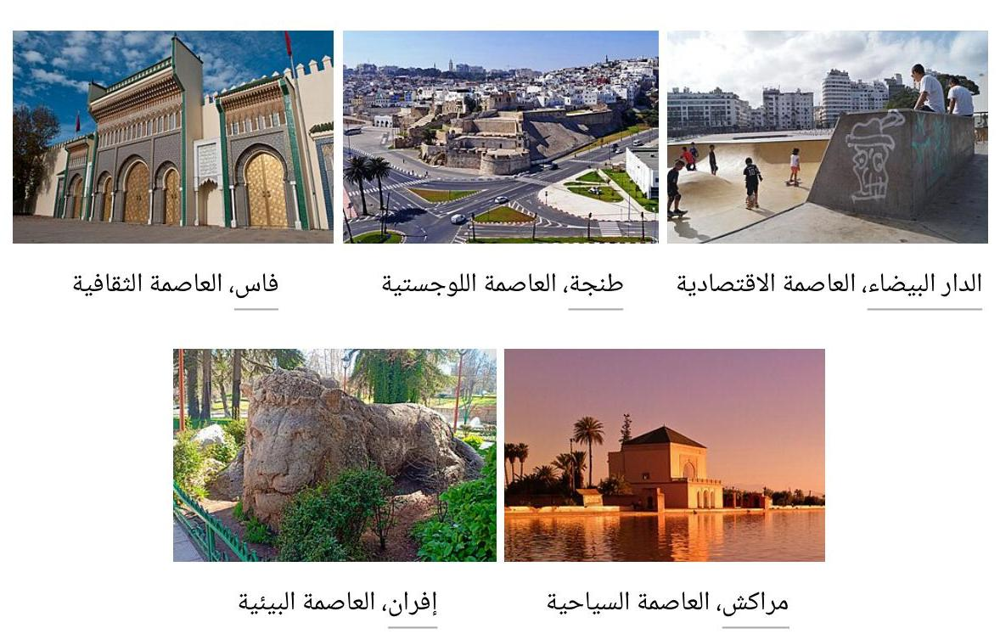)

# انظر أيضًا 

| الأحداث | الجغرافيا | الأماكن |
| - قائمة ملوك وسلاطين المغرب | - قائمة جبال المغرب | - قائمة الجامعات في المغرب |
| - قائمة رؤساء الحكومة السابقين للمغرب | - قائمة أنهار المغرب | - قائمة المتنزهات في المغرب |
| - قائمة السنوات في المغرب | - قائمة سدود المغرب | - قائمة المناطق الإيكولوجية في |
| - الأحداث الجارية في المغرب | الحياة البرية | - المغرب |
| - قائمة حروب المغرب | - قائمة طيور المغرب | - قائمة مواقع التراث العالمي في |
| الاقتصاد | - قائمة تدريبات المغرب | المغرب |
| - البطالة في المغرب | - قائمة زواحف المغرب | الخدمات |
| - بورصة الدار البيضاء | - قائمة برمائيات المغرب | - قائمة وزارات المغرب |
| - القطب المالي للدار البيضاء | الثقافة | - قائمة مطارات المغرب |
| - الشراكة بين المغرب والاتحاد الأوروبي | - قائمة المهرجانات في | - قائمة موانئ المغرب |
| المدن والجهات | المغرب | الأعلام |
| - قائمة مدن المغرب | - قائمة مناطق المغرب | - قائمة أعلام المغاربة |
| - قائمة التقسيمات الإدارية للمغرب حسب السكان [الإنجليزية] | - قائمة الأطباق المغربية | - قائمة العلماء المغاربة |
| - قائمة التقسيمات الإدارية للمغرب حسب المساحة [الإنجليزية] | - قائمة الحلويات المغربية | - قائمة الكتاب المغاربة |
|  | - قائمة ملاعب المغرب | - قائمة الشعراء المغاربة |

Affichage de la page 42


- قائمة جهات المغرب حسب الناتج المحلي الإجمالي
- قائمة جهات المغرب حسب مؤشر التنمية البشرية

## مراجع

1. "Africa Ultra-Prominences" Peaklist.org. Retrieved 2012-01-14. نسخة محفوظة 09 سبتمبر 2017 على موقع واي باك مشين.
2. (Map) *Toubkal Massif Map and Guide* (ط. 1st). 1:160,000 with mountaineering information. High־Atlas Mountains، رسم الخرائط من EWP، EWP and West Col Productions، 2008، ISBN: 98-5.
3. *The World Factbook* (بالإنجليزية). Central Intelligence Agency، 2004، p. 367، ISBN: 978-1-57488-837-9. Archived from the original on 2021-02-26.
4. "Morocco". *كتاب حقائق العالم*. وكالة المخابرات المركزية. مؤرشف من الأصل في 2021-06-22.
5. ويكي مصدر: دستور المغرب (2011). نسخة PDF، *الأمانة العامة للحكومة*. نسخة محفوظة 26 فبراير 2020 على موقع واي باك مشين.

# وصلات خارجية

|  | المغرب في المشاريع الشقيقة |
|  |  |  | وسائط من كومنز |
|  | أخبار من ويكي الأخبار |
|  | اقتباسات من ويكي الاقتباس |

## حكومة

- بوابة المغرب الرسمية
- برنامج الحكومة الإلكترونية
- البوابة الوطنية للمساطر والإجراءات الإدارية
- موقع البرلمان المغربي
- وكالة المغرب العربي للأنباء

## نقابات

## زيارات الواقع الافتراضي

- الاتحاد العام للشغالين بالمغرب

Affichage de la page 43


| - | الكنفدرالية الديمقراطية للشغل | - | الدار البيضاء على 363 AirPano (عرض بانوراما تفاعلية 360 درجة) |
| :--: | :--: | :--: | :--: |
| مقالات |  |  | - فاس على 360 AirPano (عرض بانوراما تفاعلية 360 درجة) |
|  | - المعهد الملكي للدراسات الاستراتيجية |  | - مكناس على 360 AirPano (عرض بانوراما تفاعلية 360 درجة) |
|  | - المغرب على The World Factbook |  | - الرباط على 360 AirPano (عرض بانوراما تفاعلية 360 درجة) |
|  | - المعهد المغربي لتحليل السياسات |  |  |
| خرائط |  |  |  |
|  | - المغرب على WikiMapia |  |  |
|  | - الخرائط التاريخية للمغرب منذ سنة 1 إلى 2000 ميلادية على Euratlas |  |  |

[^0]
[^0]:    مجلوبة من «978-6849-0468849»المغرب https://ar.wikipedia.org/w/index.php?title=

In [27]:
replace_images_in_markdown_for_all_pages(ocr_response)

In [25]:
import re
from IPython.display import display, Markdown

# Assuming ocr_response is the API response
def replace_images_in_markdown_for_all_pages(ocr_response):
    for i in range(len(ocr_response.pages)):
        markdown = ocr_response.pages[i].markdown
        images = ocr_response.pages[i].images

        # Create a dictionary mapping image ids to base64 data for the current page
        image_base64_dict = {image.id: image.image_base64 for image in images}

        # Function to replace image references with base64 data in Markdown
        def replace(match):
            img_id = match.group(1)
            base64_data = image_base64_dict.get(img_id)
            if base64_data:
                return f'![{img_id}]({base64_data})'
            return match.group(0)

        # Replace all image references in the current page's markdown
        updated_markdown = re.sub(r'!(.*?)', replace, markdown)

        # Display the updated Markdown for the current page
        display(Markdown(updated_markdown))

# Example usage:
replace_images_in_markdown_for_all_pages(ocr_response)

# (ا) $\cdot$ $\cdot$ 

![img-0.jpeg](img-0.jpeg)

| نسبة المياه (%) | 0,056 (250 كم^{2})^{[4]} |
| عاصمة | الرباط |
| اللغة الرسمية | اللغة العربية، اللغة الأمازيغية^{[5]} |
| المجموعات العرقية (2021) | عرب وأمازيغ 99%، آخرون 1%^{[4]} |
| تسمية السكان | مغاربة |
| التعداد السكاني (2024) | 36,828,33 ^{[6]} نسمة (39) |
| الذكور | 18281786 (2019)^{[7]} |
|  | 18474956 (2020)^{[7]} |
|  | 18665663 (2021)^{[7]} |
|  | 18852368 (2022)^{[7]} |
| الإناث | 18022621 (2019)^{[7]} |
|  | 18213816 (2020)^{[7]} |
|  | 18410922 (2021)^{[7]} |
|  | 18605603 (2022)^{[7]} |
| عدد الأسر | 9275038 (2024)^{[8]} |
| عدد سكان الحضر | 22869599 (2019)^{[7]} |
|  | 23309111 (2020)^{[7]} |
|  | 23753114 (2021)^{[7]} |
|  | 24196351 (2022)^{[7]} |
| عدد سكان الريف | 13434809 (2019)^{[7]} |
|  | 13379661 (2020)^{[7]} |
|  | 13323470 (2021)^{[7]} |
|  | 13261620 (2022)^{[7]} |
| متوسط العمر | 76.218 سنة (2017) ^{[9]} |
| الحكم |
| نظام الحكم | ملكية دستورية^{[10]} |
| الملك | محمد السادس |
| رئيس الحكومة | عزيز أخنوش |
| ولي العهد | الحسن بن محمد السادس |
| السلطة التشريعية | برلمان المغرب |
| السلطة القضائية | محكمة النقض |
| السلطة التنفيذية | حكومة المغرب |
| التأسيس والسيادة |
| التأسيس | سيادة |
| تاريخ التأسيس | 1789^{[11]} |
| السلالة الحاكمة | 1631 |
| إعلان الحماية | 30 مارس 1912 |

| إلغاء الحماية | 2 مارس 1956 |
| الناتج المحلي الإجمالي |
| سنة التقدير | 2022 |
| ← الإجمالي | 314.241 مليار$▲ (55) |
| ← الإجمالي عند تعادل القوة الشرائية | 298,504,406,107 دولار جيزي-خميس (2017)12) |
| ← للفرد | 59,808 (122) |
| الناتج المحلي الإجمالي الاسمي |
| سنة التقدير | 2022 |
| ← الإجمالي | 5142.874 مليار▲^{13)} (63) |
| ← للفرد | 53,896▲ |
| معدل نمو الناتج المحلي الإجمالي الحقيقي | 2.2 نسبة مئوية (2019)14) |
| إجمالي الاحتياطي | 26,413,000,000 دولار (2019)15) |
| معامل جيني |
| الرقم | 39.5 (2013)16) |
| مؤشر التنمية البشرية |
| السنة | 2019 |
| المؤشر | 17] 0.676 |
| التصنيف | متوسط (121) |
| معدل البطالة | 9% (2019)18) |
| اقتصاد |
| معدل الضريبة القيمة المضافة | 20 نسبة مئوية |
| سن التقاعد | 65 سنة |
| بيانات أخرى |
| العملة | درهم مغربي MAD |
| البنك المركزي | بنك المغرب |
| معدل التضخم | 0.3- نسبة مئوية (2019)19) |
| رقم هاتف
الطوارئ | 15 (خدمات طبية طارئة و الحماية العدنية)20)
19 (شرطة)21)
112 (شرطة)21)
177 (الدرك الملكي)21] |
| المنطقة الزمنية | ت ع م+01:00 (توقيت قياسي)
أفريقيا/الدار البيضاء122
ت ع م±00:00 (رمضان) |
| جهة السير | يعين |

| **اتجاه حركة القطار** | يسار |
| **رمز الإنترنت** | .ma |
| **أرقام التعريف البحرية** | 242 |
| **الموقع الرسمي** | الموقع الرسمي (العربية) |
| **أيزو 3166-1 حرفي-2** | MA |
| **رمز الهاتف الدولي** | +212 |
| تعديل مصدري - تعديل |  |

**المَغْرِبْ** (بالأمازيغية: **ИГ\ЧОIΘ**, لمغربيب) رسميًا **المَمْلَكَةْ المَغْرِبِيَةْ** (بالأمازيغية: **١ ИГ\ЧОIΘ**, تآكلديت ن لمغربيب)^{[}^{23}^{]} هي دولة ذات سيادة^{[}^{5}^{]} عاصمتها الرباط وأكبر مدنها الدار البيضاء،^{[}^{4}^{]} مَوقعها في أقصى غرب شمال إفريقيا فهي مُطلة على البحر المتوسط شمالًا والمحيط الأطلسي غربًا،^{[}^{4}^{]} تحدها الجزائر شرقًا^{[}^{24}^{]} وموريتانيا جنوبًا،^{[}^{25}^{]}^{[}^{4}^{]} يَعْصَلها مضيق جبل طارق عن إسبانيا وبَمَحادَاته مَكتنَفَات متنازَع عليها بين البلدين^{[}^{26}^{]}^{[}^{4}^{]} عدد سكانها يَبلغ حوالي 37 مليون نسمة، لَعْنَاهَا الرَسميتان هما العَربية والأمازيغية كما تَتَدَاول الدارجة المغربية على نطاق واسع؛ دستورها يَنص على أن الدين الرسمي هو الإسلامَ وأن البلادَ مَتَعددَة الثقافات: «المَمْلَكَة المَرْيَةَ دولة إسلامية ذات سيادة كاملة، مَلَكْتُهُ برِحْدَتها الوطنية والتربية، وبِصيَانة تَلَاحُّمٍ دمُرماتِ هَرِيبَّا الوَطَنَة، المُرَحَّدة بانصهار كل مَكْوِّنَاتِها، العَربيَة الإسلامية، والأَمَازِيمَية، والصحراوية الحسانية، والعُبَة بِرِوَافدِها الأفريقية والأندلسية والعبرية والمتوسطية».^{[}^{27}^{]}^{[}^{4}^{]}

استوطَن الإنسان بلاد المغرب الأقصى ابتداءًا من العصر الحجري القديم منذ أكثر من 300 ألف عام،^{[}^{28}^{]}^{[}^{29}^{]} تأسسَت الدولة المغربية الإسلامية الأولى سنة 788 في عهدِ السلالة الإدريسية؛ ثم وصلَت إلى ذروتها كقوة إقليمية في القرنين الحادي عشر والثاني عشر، حين سَيطرت على مَعظُم الأراضي الإيبيرية والمغاربية في عهدِ السلالتين المرابطية والموحدية.^{[}^{30}^{]} واجَهَ المَغْرَب تَهْدَيدَات خارجية لسيادته مع استيلاء البرتغال على أراضَ شَمَالًا وزحفِ الدولة العثمانيةَ شَرَقًا في القرنَين الخامس عشر والسادس عشر، ليقاوِم ويَصدُ الهيمنة الأجنبية في عهدِ السلالتين المرينية والسعدية.^{[}^{31}^{]} توسَّع المغرب في عَلَاقَاتَه الدَبلومَاسية والتجارية مع العالَم الغربي في القرنين الثامن عشر والتاسع عشر. في سياق تحولات مهمة كان قد شهدها في العهدِ الحالي للسلالة العلوية.^{[}^{32}^{]} قَسمَت البلاد إلى منطقة حماية فرنسية وأخرى إسبانية سنة 1912، مع حجزٍ لمنطقة طنجة الدولية؛ بعد أعمال مقاوَمة وثورات متقطعة استعاد المغرب استقلاله سنة 1956.^{[}^{33}^{]}^{[}^{34}^{]}

يَمتلك المغرب خامس أكبر اقتصاد بإفريقيا ويُعَد قوة وسطى في الشؤون العالمية،^{[}^{35}^{]} كما يَحمل عضوية جامعة الدول العربية والاتحاد الإفريقي.^{[}^{36}^{]} تجمّع البلاد شراكة استراتيجية مع مجلس التعاون الخَليجي،^{[}^{37}^{]} شراكة اقتصادية مع الاتحاد الأوروبي،^{[}^{38}^{]} شَراكة عسكرية مع حلف شمال الأطلسي،^{[}^{39}^{]} كما يوجَد لديها توجهات استثمارية نحو البلدان الإفريقية.^{[}^{40}^{]}^{[}^{41}^{]} يَتربع الملِك محمد السادس على رأس الدولة في مَلَكية دستورية مع نظام برلماني يَضَمِن التعددية الحزبية،^{[}^{42}^{]} وهو يَتمتع بسلطات تنفيذية وتشريعية واسعة في الشؤون الدينية والعسكرية والخَارجية. يمكِنه إصدار مراسيم لها قوة القانون تسمى الظهير. ويمكِنه أيضًا حلّ البرلمان بعد التشاور مع رئيس الحكومة ورئيس المحكمة الدستورية.^{[}^{43}^{]}

طالَب المغرب بالسيادة على منطقة الصحراء الغربية، التي يُشار إليها في الخطاب الرسمي المغربي بالأقاليم الجنوبية. وتُعَد إقليمًا غير متمتع بالحكم الذاتي منذ 1963.^{[}^{44}^{]} كانَت إسبانيا قد وافقَت على إنهاء استعمار الإقليم والتنازُل عن سَيطرتها للمَغرب وموريتانيا. قبل أن تَندلَع حرب الصحراء الغربية بين تلك القوى وبعض المتمردين المحليين سنة 1975.^{[}^{45}^{]} تخلت موريتانيا عن مَطالبها في المنطقة سنة 1979،^{[}^{46}^{]} ثم استمرت الحرب كنزاعٍ منخفض الحدة إلى غاية إبرام اتفاق لوقف إطلاق النار سنة 1991.^{[}^{47}^{]} حاليًا يَسيطِر المغرب على معظَم أراضي الإقليم لكن قضية السيادة ظلت دون إجماعٍ دولي. فيما لَاتزال الجهود الأممية لَحلّ النزاع عاجزة عن كسرِ حالة الجمود السياسي،^{[}^{48}^{]}

يَرأس الحكومة المغربية الحالية عزيز أخنوش عن حزب التجمع الوطني للأحرار بعدما تَصدُر الانتخابات لسنة 2021 بحصوله على 102 من أصل 395 مقعد برلماني. مع نسبة مشارَكة انتخابية بَلَغَت 50،18% على مستوى البلاد.^{[}^{49}^{]}^{[}^{49}^{]}^{[}^{50}^{]} أنجَزَ المغرب مشاريع بارزة خاصة على مستوى تحسين ظروف عيش الساكنة وتسهيل الولوج إلى الخدمات الأساسية وكذا

تطوير البنى التحتية؛ مع وجود لُجنة تتبُّع ومواكبة لأهداف التنمية المستدامة «أفْق 2030» التي تضم 19 مخططًا قطاعيًا.^{(}^{50}^{)} تتوفر البلاد على عوامل رئيسية تُطمح من خلالها إلى تنمية مستدامة؛ فالقطاعات المولَّدة لِسُروة في ازدياد، كما أن التحرير التدريجي لنظام الصرف ولأسواق الرأسمال يرافِق هذه الْمَخْطُطاتَ الْجَوهرية.^{(}^{51}^{)}

## التسمية

طالع أيضًا: المغرب الأقصى
![img-1.jpeg](img-1.jpeg)

بالموازاة مع ذلك وللإشارة إلى المنطقة المغاربية بشكل عام، كان العرب في العصور الوسطى يَستخدمون لفظ «بلاد المغرب»^{(}^{52}^{)} بينما الأوروبيون يَستخدمون لفظ «الْسَاحل البربري»^{(}^{53}^{)}^{64} للدلالة على ثلاثة أقاليم: الْمَغرب الأدنى (إفريقية أو تَوَنَس الحالية)، المِعْرَب الأَوْسَط (الجزائر الحالية)، الْمَعْرَب الأقْصَى (المملكة المغربية الحالية).

## التاريخ

المقالة الرئيسة: تاريخ المغرب

### ما قبل التاريخ

المقالة الرئيسة: ما قبل التاريخ بالمغرب

عَرف المغرب خلال عصر ما قبل التاريخ (الحقبة التي تَسبق اختراع الكتابة) تعاقُب عدة حضارات وهي كالتالي: الحضارة الأشولية (منذ 700.000 سنة قبل الميلاد)، الحضارة الموستيرية (منذ 120.000 سنة قبل الميلاد)، الحضارة العاتيرية (منذ 40.000 سنة قبل الميلاد)، الحضارة الإيبروموَريسية (منذ 21.000 سنة قبل الميلاد).^{(}^{^{57}}^{)}

خلال عصر ما قبل التاريخ، ضَم المغرب العديد من المواقع ^{(}^{الإنجلزية)} التي شهدت بدايات التاريخ الإنساني^{(}^{^{58}}^{)} عَبْر على العديد من البقايا البشرية في جبل إيغود سنة 1991، وبعد تأريخها باستخدام التقنيات الحديثة سنة 2017 وُجِد أن عمرها يعود لـ300.000 سنة على الأقل، مما يجعلها أقدم الآثار المكتشَفة للإنسان العاقل في العالَم.^{(}^{^{59}}^{)}^{[}^{^{60}}^{]}

|  | خلال العصر الحجري كانت جغرافيا المغرب تشبه السافانا أكثر مما تشبه الطبيعة القاحلة الحالية؛[^{69]}^{ }غيَّرت الرياح الموسمية الغرب إفريقية المشهد الطبيعي منذ 15.000 سنة قبل الحاضر وبدأت حقبة الصحراء الخضراء؛ حينها زاد هطول الأمطار خلال موسم الصيف مما أدى إلى نمو الظروف الرطبة (مثل البحيرات، الأراضي الرطبة) والسافانا (مثل الأراضي العشبية، الشجيرات) في شمال إفريقيا.[^{70]} |
|  | ```في حين لا يُعرف الكثير عن المستوطنات في المغرب خلال العصر الحجري الوسيط، فإن الحفريات في أماكن أخرى من المنطقة المغاربية تَشِيرَ إلى وَفرة من الغابات، مناسبة للصيادين وجامعي الثمار، مثل الثقافة القيصية.[^{71]}``` |
|  | تشترك المناطق الساحلية للمغرب خلال العصر الحجري الحديث في صناعة الفخار والتي كانت شائعة بجميع أنحاء البحر المتوسط في ذلك الوقت؛ تُشير الحفريات الأثرية إلى أن تدجين الأبقار والزراعة وكذلك الحصاد بدأ خلال هذه الحقبة.[^{72]}^{[73]}^{ }انتهت حقبة الصحراء الخضراء ما بين 5500 سنة قبل الحاضر و4000 سنة قبل الحاضر.[^{74}] |
|  | **التاريخ القديم** |
|  | ***المقالة الرئيسة: العصر الكلاسيكي بالمغرب***
***طالع أيضًا: مملكة موريطنية وموريطنية الطنجية*** |
|  | عُرف المغرب خلال حقبة التاريخ القديم (ابتداءً من الألفية الرابعة قبل الميلاد) تعاقُب حضارات العصر الكلاسيكي وهي على التوالي: الحضارة الفينيقية (منذ القرن الثاني عشر قبل الميلاد)، الحضارة البونيقية (منذ القرن الخامس قبل الميلاد)، الحضارة الموريطنية (منذ القرن الثاني قبل الميلاد)، الحضارة الرومانية (منذ القرن الأول بعد الميلاد).[^{75}] |
|  | خلال التاريخ القديم، فُتح المغرب أبوابه بشكل أوسع للدول المحيطة بالبحر المتوسط، حين ازدهرَت تجارة الفينيقيين وأقاموا مستعمَرات لهم في مختلف المناطق المتوسطية.[^{76]}^{ }ثَعَد كل من شالة، وليكسوس، والصويرة من أهم وأول المستعمَرات الفينيقية التي أُنشِئت في المغرب،[^{77]}^{ }وقد بقيَت الأخيرة مستعمَرة فينيقية حتى القرن السادس قبل الميلاد.[^{78]}^{ } |
|  | كانت قرطاج مستعمَرة فينيقية بالأساس، ثم تطورت بعد انحلال فينيقيا لتصير بونيقية سَيطرت على أجزاء كبيرة من جنوب غرب المتوسط خلال الألفية الأولى قبل الميلاد.[^{79]}^{ }أقامت قرطاج علاقات تجارية مع قبائل الأمازيغ بالمناطق الداخَلية، ودَفعَت لهم مَبالغ سنوية لضَمانِ تعاونهم في استغلال المواد الخام.[^{80]}^{ } |
|  | كانت موريطنية مملكة قِبَلية، أسَّسها السكان المحليون الذين عُرفوا بإسم الموريطنيين؛[^{81]}^{ }بعد وفاة بطليموس الموريطني سنة 40، ضَمَت الإمبراطورية الرومانية المملكة وقسَّمتها إلى مقاطعتين اثنتَين: موريطنية القيصرية في الشرق، وموريطنية الطنجية التي تتطابق تقريبًا مع الجزء الشمالي من المغرب الحالي.[^{82]}^{ } |
|  | كانت الديانة الأمازيغية التقليدية تهيمِن عليها آلهة الشمس والقمر، والتي تُشبه إلى حد بعيد تلك التي كان يعبدها المصريون.[^{83]}^{ }تَوَاجَدَت المسيحية في موريطنية الطَنجية منذ القرن الثالث،[^{84]}^{ }وانتشرَت بسرعة على الرغم من ظهورها الْمتأخر نسبيًا في المنطقة.[^{85]}^{ }كانت المدن الرئيسية هي بناصا، سبتيم، روسادير، ليكسوس، تمودة، بالإضافة إلى العاصمة طنجيس.[^{86]}^{ } |
|  | خلال أزمة القرن الثالث، انهار الحُكم الروماني في معظم أنحاء موريطنية الطنجية سنة 285 باستثناء الشريط الساحلي ما بين ليكسوس وطنجيس وسبتيم؛[^{87]}^{ }وعند سقوط الإمبراطورية الرومانية خضعت أجزاء من المغرب الحالي للفندال وهم من القبائل الجرمانية الشرقية، ثم إلى القوط الغربيين، فالروم البيزنطيين.[^{88]}^{[}^{89]}^{ } |

#### * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

![img-2.jpeg](img-2.jpeg)

صواريخها في جبايا مشروع غير مكتمل لبناء أطول مئذنة بالعالم، وقد توقف سنة 1991.192

طالع أيضًا: السلطنة الشريفة خلال التاريخ الحديث، شهد المغرب تحولات مهمة وضعت الأساس للدولة القومية الحديثة وذلك ما بين سنوات 1510 و1822.193 استُحدث في عهدِ السلطان أحمد المنصور الذهبي (الفترة 1578–1603) نظام حكومي أطلق عليه اسم المخزن،(^{114)} بلغ التقسيم الإداري في عهده 9 ولايات هي سوس، فاس، تافيلالت، مراكش، تادلة، درعة، الفحص، توات-تيكورارين، وبلاد السودان،(^{115}) وقدر إجمالي عدد السكان سنة 1600 (14) يحوالي 13 مليون نسمة.194)117)118) كما عرف المغرب خلال هذه الفترة تشييد المزيد من القصبات التي بُنيت في إطار استراتيجية أمنية خارجية وداخلية.118)

من الناحية التشريعية، رغم أن نظام البيعة يتضمن عادة تطبيق قوانين دينية إلا أنه كان يتم في الواقع الاتفاق على قوانين وضعية تُنظم العلاقات الاجتماعية والاقتصادية والقضائية والأمنية في المناطق التي تمتعت بقدر كبير من الحكم الذاتي،(^{119)}120) هذه الاتفاقيات يتم تدوينها في المدارس وتختلف نسبيًا من منطقة مغربية لأخرى.121) هذا التنظيم لعب دورًا هامًا في ضبط التوازنات العامة من داخل المجتمع، خصوصًا خلال ضُعف السلطة المركزية أو انعدامها في حال حدوث صراع على السلطة.122)

عُرفت البلاد وجود مؤسسات تنفيذية وقضائية متقدمة إلى حد ما، حسب ما وَرد في كتاب تاريخ الشعوب العربية للمؤرخ البريطاني من أصل لبناني ألبرت حوراني (1915–1993) والذي قضى سنوات طويلة أستاذًا في جامعة أوكسفورد: «في أُمَمى عَرب المغرب العربي وفيما وراء حدود الإمبراطورية العثمانية تقع دولة من نوع مختلف تمامًا ترجُّد مَلَذ زمنٍ طويل: إنها الإمبراطورية المغربية»، مضيفًا أن هذه الدولة تتوفر على جميع مقومات الدولة الحديثة: المحاكِم والوزارات والجيش، حتى وإن كانت قد عُرفت فترات من الفوضى وسوء التنظيم.123)

حاولت السلطة المركزية خلال القرن التاسع عشر القيام بالعديد من الإصلاحات: في المجالات العسكرية، أرسَلت الدولة المغربية بعثات طلابية إلى دول أوروبا الغربية لمتابعة التكوين العسكري وعَملت على شراء الأسلحة الحديثة وتشييد مَصنع للأسلحة في فاس،(^{124)} في المجالات الإدارية، أسَّست دار النيابة التي ضَمت السفراء والقناصلَ بطَنجة، وحَددت منصب الصدر الأعظم في الشؤون الداخلية، كما أحدثت وزارات الدفاع والعدل والمالية والشؤون الخارجية،(^{124)} في المجالات الجبائية، عَينت الدولة أمناء في المَراسي وفُرضت عليهم مراقبة شديدة لمحاربة الرشوة والاختلاس، كما أحدثت تغييرات في

![img-3.jpeg](img-3.jpeg)

محمد بن حدو أعطار، سفير المغرب لدى بريطانيا العظمى سنة 1682.[125][126]

النظام الضريبي،[124] في المجالات المالية، أنشأت دار السكة وحاولت ضبط العملة الوطنية بالرفع من قيمتها ومنع تزويرها وتهريبها إلى الخارج؛[124] في المجالات التعليمية، أسَّست الدولة المغربية بسلا مدرسة عصرية لتلقي العَلمِ الحديثة وخُصصت منحًا ومكافآت للطلبة المتفوقين، وأرسَلت بعثات طلابية إلى أوروبا.[124]

## المجالات السياسية

المقالة الرئيسة: المخزن (المغرب)

استمرت سلالة السعديين في الحكم حتى سنة 1659؛[127] صعُدت بعدها سلالة العَلَوَيين والتي كانت تَحكم منطقة تافيلالت منذ 1631 لتتولى السلطةَ المركزية في البلاد سنة 1666؛[128][129] نجح السلطان الرشيد بن الشريف في إعادة
![img-4.jpeg](img-4.jpeg)

1695

توحيد البلاد في
![img-5.jpeg](img-5.jpeg)

السلطان إسماعيل بن الشريف يَستقبل فرانسوا بيدو سفير لويس الرابع عشر، سنة 1693.[127]

|  | 1727 | تثبيت |
| :--: | :--: | :--: |
|  | سَلَطْتَه على إمارة |  |
|  | توات ونَظْم حِملة |  |
|  | عَسكَرية سَيطر فيها |  |
|  | على إمارة الترارزة |  |
|  | وإمارة البَرَاكَنَة لتصلَ |  |
|  | حَدود الدولة | حتى |

نهر السنغال؛[130] بعد نزاعات عسكرية عديدة مع الدولة العثمانية ثم إعادة إحلال السلام بعدما وافق العثمانيون على الاعتراف بالحدود الشرقية للمغرب بالقرب من وجدة.[131][130]

عند بداية الثورة الأمريكية، كانت السفن التجارية التابعة للولايات المتحدة كثيرًا ما تتعرض لهجمات القراصنة البربر في المحيط الأطلسي، فأعلنَ السلطان محمد الثالث أن جميع السفن التجارية الأمريكية تحظَى بحماية السلطنة وأنها ستحظى بالحماية عند إبحارها

بالمياه الإقليمية المغربية؛ تُعَد معاهدة الصداقة المغربية الأمريكية التي أبرمت سنة 1777 من أقدم معاهدات الصداقة المستمرة التي أبرمتها الولايات المتحدة [132]^{[}^{133}^{]} ونتيجة لها صار المغرب من أول الدول التي اعتُرفت بالولايات المتحدة كدولة مستقلة. [134] كانت طنجة ابتداءً من القرن الثامن عشر هي العاصمة الدبلوماسية للمغرب. [136]

من الناحية الدبلوماسية، كتب الجنرال هوبير ليوطي الذي شُغِل مَنصب المقيم العام الفرنسي بالمغرب (الفترة 1912–1925): «لقد وُجِدنا أنفسنا في المَعْرب أمام إمبراطورية عريقة تاريخيًّا ومستقلة، متمسكة إلى أقصى حد باستقلالنا وشرسة في مواجهة أي محاولة لإخضاعها، وهي تظهر حتى هذه السنوات الأخيرة كدولة قائمة الذات بترتيبها الإداري الوظيفي وتحليلها في الخارج» [123].

#### المجالات العسكرية

المقالة الرئيسة: تاريخ المغرب العسكري

باتجاه الشرق، بدأت أولى الاتصالات مع الدولة العثمانية في القرن السادس عشر، حيث أصبح العثمانيون أقوياء جدًا بعد سقوط تلمسان (1517) وسقوط الجزائر (1516) ثم الاستيلاء عليها مرة أخرى بصفة نهائية سنة 1529، مقتربين تدريجيًّا من المغرب الأقصى. بعد سقوط تلمسان سنة 1517، هرب سلطان تلمسان^{[}^{138}^{]} إلى فاس في المغرب لطلب اللجوء؛^{[}^{139}^{]} وقد كان العثمانيون يقاتلون في شمال إفريقيا بصفتهم أعداء إسبانيا الكاثوليكية، وفي الوقت نفسه كانت سلالة السعديين قد أحرزت انتصارات مهمة على البرتغاليين الذين اضطروا إلى الانسحاب من الجنوب المغربي خاصة في أكادير سنة 1541، لتنجح سلالة السعديين فيما بعد بالإطاحة بسلالة الوطنييين شمال البلاد وإعادة توحيد المغرب تحت سلطة واحدة. [140]

باتجاه الجنوب وتحديدًا في غرب إفريقيا، كانت معركة تونبيدي سنة 1591 المواجهة الحاسمة خلال غزو المغرب لإمبراطورية السونغاي في القرن السادس عشر (الحرب المغربية السونغية)، [141] [142] حين استطاعت القوات المغربية تحت قيادة جودر باشا هزيمة حاكم إمبراطورية سونغاي مما أدى إلى انهيارها؛ تم تأسيس باشوية تمبكتو (1591–1833) في بلاد السودان حيث استمرَّت كإحدى ولايات الإمبراطورية المغربية خلال فترة حكم السعديين ومن بعدهم العلويين. [144]^{[}^{145}^{]} قبل أن يستولي عليها الطوارق سنة 1787. [146] باتجاه الشمال، شهدت البلاد العديد من النزاعات العسكرية ضد البرتغال، وإسبانيا، وفرنسا، وإنجلترا، [147] كما شاركت بحربٍ ضد الولايات المتحدة والسويد وصقلية. [150]

#### المجالات الاقتصادية

المقالة الرئيسة: تاريخ المغرب الاقتصادي

عَرفت البلاد في بداية القرن السابع عشر أزمة اقتصادية لأسباب منها قلة الأمطار، وانتشار الوباء، وتقلُّص الإنتاج المحلي من السكر، وتدهوُّر تجارة الذهب مع بلاد السودان. [151] كانت للمغرب بعض الخصائص التي ميَّزته عن باقي المنطقة المغاربية وأعطته الأولوية في التجارة مع أوروبا؛ فالمغرب من الناحية الجغرافية هو الأقرب لأوروبا حيث لا يَفصل بَينَهما سوى مضيق جبل طارق الذي لا يتعدى عرضه في أضيق نقطة 15 كيلومتر. [153] ومن الناحية السكانية فالمغرب يَضم أقلية يهودية كانت تشكِّل حوالي 7% من إجمالي السكان خلال القرن التاسع عشر وكانت تعمل في التجارة ولها علاقة قوية مع التجار اليهود الأوروبيين مما أدى إلى ارتفاع التعاملات التجارية بين أوروبا والمغرب. [154]

خلال القرن الثامن عشر أخذت المصالح الأوروبية تنمو يومًا بعد آخر في البحر المتوسط، وأصبحت تلك المصالح تُحتم على الدول الأوروبية تأمين تجارتها في محاولة للحد من حركة القرصنة البحرية التي كانت تقوم بها الأساطيل المغربية في تلك الفترة، ونتيجة لذلك شرعت الكثير من الدول في عقد أو تجديد معاهداتها مع المغرب، ففي عهدِ السلطان محمد الثالث (الفترة 1757–1790) على سبيل المثال، عُقدت حوالي سبع دول أوروبية معاهدات صداقة ^{[الإنجليزية]} وتجارة ^{[الإنجليزية]} مع المغرب اشتُعِلَت على تأمين تجارتها في البحر المتوسط وإعطاء امتيازات لقناصلها وتجارها ومواطنيها، ومن خلال بنود تلك المعاهدات يلاحَظ أن هناك تركيزًا على سلامة السفن وتقديم الخدمات لها في الموانئ المغربية وأن هناك تشابهًا بين بنود تلك المعاهدات. [155]

### التاريخ المعاصر

المقالة الرئيسة: تاريخ المغرب المعاصر
طالع أيضًا: معاهدة فاس وحماية فرنسا (المغرب) وحماية إسبانيا (المغرب) وحماية دولية (المغرب) ووثيقة الاستقلال المغربية

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

رغم احتفاظ المغرب برموز السيادة كالعملة والعلم الوطني،^{[}^{163}^{]} إلا أن معاهدة الحماية سَمحت لبلدان أوروبية بالمشاركة في تسيير البلاد عبر سنِّ قوانين كان سلاطين المغرب يَرفضون المصادقة عليها في بعض الأحيان.^{[}^{164}^{]} قام أفراد الحركة الوطنية بتنسيق مع الملِك محمد الخامس بصَياغة وثيقة المطالبة بالاستقلال بتاريخ 11 يناير 1944،^{[}^{165}^{]} ألغيت الحماية الفرنسية والحماية الإسبانية في 7 أبريل 1956،^{[}^{166}^{]} كما عادت مدينة طنجة التي تم تدويلها إلى المغرب في 29 أكتوبر 1956.^{[}^{167}^{]} استعاد المغرب سيادته على رأس جوبي ومعظم مقاطعة إفني الخاضعة للحُكم الإسباني خلال حرب إفني والمعاهدة التي أعقبتها سنة 1958.^{[}^{168}^{]}^{[169]}

تربَّع الحسن الثاني على العرش كملك للمغرب في 3 مارس 1961، ظل المغرب غير منحاز رسميًا خلال الحرب الباردة ومع ذلك فقد أظهَر تعاطفًا مؤيدًا للغرب.^{[}^{170}^{]} صَودِق بواسطة الاستغناء على تحويل نظام الحُكم في المغرب إلى مَلَكية دستورية سنة 1962، وفي هذا الصدد رسَّخ الدستور الحق في المِلكية الفردية وأعلن صراحة أن نظام الحزب الواحد غير شرعي.^{[}^{171}^{]} أرفق المغرب مقاطعة إفني الإسبانية بالكامل سنة 1969،^{[}^{172}^{]}^{[173]} ثم أرفق إقليم الصحراء الغربية سنة 1975.^{[}^{174}^{]} يَعقد المغرب وإسبانيًا دراسَات تهدف إلى بِناء الربط القاري عبر مضيق جبل طارق منذ 1979، يحظَى المشروع المَقترَح باهتمام دولي لكنه يواجِه تحديات جيولوجية بالأساس.^{[}^{175}^{]}

المجتمع

التركيبة السكانية

*المقالة الرئيسة: التركيبة السكانية في المغرب*

*طالع أيضًا: الدراسات الوراثية على المغاربة والمغاربة المقيمون في الخارج*

يُبلغ عدد سكان البلاد 37،645،500 نسمة بتاريخ 1 مايو 2025 حسب التقدير الاستقرائي للبيانات الرسمية،^{[}^{177}^{]} مع نمو سكاني بَلَغ 1،26% سنويًا ما بين 2015 و2020،^{[}^{178}^{]} بينما معدل الخصوبة الكلي بَلَغ 2،29 طفل لكل امرأة سنة 2021.^{[}^{179}^{]} معظم السكان هم مغاربة مواطنون،^{[}^{4}^{]} وهم مسلمون على المذهب المالكي.^{[}^{180}^{]} هناك أقليات من العرق الأسوَد يُعرفون بِأسمِ الحراطين والغَناوة.^{[}^{181}^{]}^{[}^{182}^{]} المندوبية السامية للتخطيط هي مؤسسة الإحصاء الحكومية مهمتها تتبُّع المؤشرات الاقتصادية والاجتماعية.^{[}^{183}^{]}

أظهَرت الدراسات الوراثية على المغاربة أن العرب والأمازيغ (الذي يتم التمييز بينهما على أساس لغوي) لا يَختلفون كثيرًا من حيث تركيبتهم الوراثية، ولخَّصتَ هَذه الأبحاث إلى أن التعريب في المغرب تم بالأساس عبر عملية استيعاب ثقافي.^{[}^{184}^{]} تُنص النشرة الأوروبية للوراثة البشرية ^{[الإنجليزية]} على أن المغاربة في غرب شمال إفريقيا كانوا أقرب جينيًّا إلى سكان أيبيريا منهم إلى شعوب البانتو القاطنين جنوب الصحراء الكبرى.^{[}^{185}^{]}

الإسلام هو الدين الرسمي والأكثر انتشارًا في البلاد، مع وجود أقليات من اليهود والمسيحيين ومن المغاربة اللادينيين.^{[}^{186}^{]} أظهَر استطلاع على المغاربة بأن نسبة 67،8% يَعتبرون أنفسهم متدينين، نسبة 29،1% متدينين إلى حد ما، ونسبة 3،1% غير متدينين، حسب نتائج نشرها الباروميتر العربي سنة 2021.^{[}^{187}^{]} كان عدد اليهود في المغرب يصل إلى 265 ألف نسمة سنة 1948، إلا أنه انخفض إلى حوالي 2500 نسمة سنة 2018 بسبب هجرة الكثير منهم إلى إسرائيل وأوروبا.^{[}^{188}^{]} تشكَّل المسيحية في المغرب حوالي 1،1% أي ما يقارب 380 ألف نسمة وذلك طبقًا لتقديرات سنة 2009.^{[}^{189}^{]}

![img-6.jpeg](img-6.jpeg)

شخص يُتحدث بالدارجة المغربية.

يُعَد المغرب وجهة مفصّلة للعديد من الأجانب الذين يختارون الإقامة فيه لأسباب مختلفة منها العمل. الدراسة، أو التقاعد؛ يُشمل هؤلاء الأجانب جنسيات متنوعة من أوروبا، أفريقيا جنوب الصحراء، آسيا، وأمريكا الشمالية، وهم موزعون على مختلف المدن المغربية الكبرى مثل الدار البيضاء، مراكش، والرباط. ^{[189]} يساهم هؤلاء الأجانب المقيمون في الاقتصاد المحلي بعدة طرق حيث يعمل العديد منهم في قطاعات مثل التعليم، السياحة، التجارة، والصناعة؛ كما أن وجود جاليات أجنبية كبيرة يعزّز من التنوع الثقافي والاجتماعي ويُخلق فرصًا للتبادل الثقافي. ^{[190]}

هناك تعداد كبير للمغاربة خارج وطنهم الأم حيث يقال أن في فرنسا أكثر من مليون ونصف مغربي،^{[191]} تليها إسبانيا بحوالي 870 ألف نسمة،^{[192]} وبلجيكا بحوالي 700 ألف،^{[193]} وهولندا بحوالي 600 ألف،^{[194]} بالإضافة إلى جماعات مغربية كبيرة في كل من إيطاليا، وكندا، والولايات المتحدة، وإسرائيل التي يشكّل فيها اليهود المغاربة ثاني أكبر الجاليات هناك. ^{[195]}^{[}^{196]} يتم الحصول على الجنسية المغربية عادة بموجب حق الدم، أي بالولادة في المغرب أو في الخارج لوالدين يُحمل أحدهما الجنسية المغربية. ^{[197]}

**اللغات واللهجات**

*المقالة الرئيسة: لغات المغرب*

*طالع أيضًا: لهجة مغربية ولغة عربية ولغة أمازيغية*

الدارجة المغربية هي إحدى لهجات العربية، وتُصنَّف ضمن اللسان المغاربي (وهو لسان المغاربة، الجزائريين، والتونسيين)، يستعملها أغلب المغاربة كلغة التواصل كما أنها اللهجة الأم لـ 50% من المغاربة، ومحكية في بعض المناطق الناطقة باللغة الأمازيغية كلسان ثانوي. ^{[198]} تنتشر اللهجة المغربية في البلدان الأوروبية كفرنسا، وإسبانيا، وبلجيكا، وإيطاليا، وهولندا؛ كما أن للهجتين المغربية والجزائرية تأثير واضح على لهجة الشارع الفرنسية. ^{[199]}

اللغة العربية واللغة الأمازيغية هما اللغتان الرسميتان في المغرب. ^{[5]} يُتحدث قرآنة 13,5 مليون شخص من أصل 32 مليون أي حوالي 45% من السكان؛^{[200]}^{(}^{[201]} (لا توجَد إحصاءات رسمية) باللغة الأمازيغية بلهجاتها الثلاث: التاريفيت، والتاشلحيت، والأطلسية؛ يُقطن معظم هؤلاء في المناطق الريفية وتُعَد هذه اللغة بالنسبة لهم إما لغتهم الأولى أو يتكلمونها إلى جانب الدارجة المغربية. ^{[202]}

الفرنسية تُستخدم على نطاق واسع في مجالات العلوم والتكنولوجيا وَالطُبَ والأعمال التجارية والإدارة العامة والقانون فهي ضرورية للاندماج في المجتمع المهني؛^{[203]} أما الإنجليزية فيوجَد توجُّه متزايد نحو تعزيزها في النظام التعليمي والاقتصادي حيث يُنظر إليها على أنها لغة المستقبل والابتكار مع تزايد الطلب عليها في سوق العمل المغربي والدولي. ^{[204]} يُنص دستور البلاد على أن الدولة تعمل على «حماية اللهجات والتعبيرات الثقافية المستعمَلة في المغرب، وتُدير على انسجام السياسة اللغوية والثقافية الوطنية، وعلى تعلُّم وإتقان اللغات الأجنبية الأكثر تداولًا في العالم». ^{[5]}

**التعليم العمومي**

*المقالة الرئيسة: التعليم في المغرب*

*طالع أيضًا: الأمية في المغرب والتعليم العالي في المغرب*
![img-7.jpeg](img-7.jpeg)
مؤسسة محمد السادس تهدف إلى توفير دعم اجتماعي للعاملين في مجال التعليم.[205]
شهد التعليم في المغرب تحسنًا على مدار العقود الماضية إلا أن النظام التعليمي لا يزال يواجه عدة تحديات، من أبرزها التفاوت في جودة الْتعليم بين المناطق الحضرية والريفية أين تعاني المدارس في المناطق النائية من نقصٍ في الموارد والمعلمين المؤهلين، كما يواجه التعليم العالي تحديات تتعلق بتحديث المناهج الدراسية لتتوافق مع سوق العمل المتغيرة مما أدى إلى زيادة نسبة البطالة بين الخريجين.[206] بَلَغت نسبة استكمال الدراسة في السلك الابتدائي 91,4%، وفي السلك الإعدادي 61,4%، وفي السلك الثانوي 39%، حسب إحصائيات وزارة التعليم لموسم 2019-2020.[207]

التعليم في المغرب هو إلزامي ومجاني في المرحلتين الابتدائية والإعدادية، أي حتى سن 15 سنة؛[208] وهو اختياري مع دفع رسوم الْتسجيل في المرحلتين الثانوية والجامعية.[208] يُتميز التعليم العالي في المغرب بالتنوع في العرض إذ يُتوزع على مجموعة من الجامعات والمعاهد والمدارس والمؤسسات العليا والكليات ومؤسسات التكوين المهني والعسكري وشبه العسكري، ويغطي تقريبًا جل الميادين والمجالات الحيوية كالهندسة والطب والصناعة وإدارة الأعمال والفلاحة والتكنولوجيا والمعلومات.[209]

حسب نتائج البرنامج الدولي لتقييم الطلبة لسنة 2018 فإن تلاميذ المدارس المغربية يحتلون المرتبة 75 في الرياضيات، والمرتبة 75 في العلوم، والمرتبة 74 في القراءة.[210] أطلَقت الحكومة المغربية «الرؤية الاستراتيجية 2015-2030» التي تهدف إلى جعل التعليم أداة لتحقيق العدالة الاجتماعية وكذا التنمية المستدامة؛ تهدف هذه الاستراتيجية إلى تطوير النظام التعليمي بشكل شامل بدءًا من التعليم الابتدائي وصولًا إلى التعليم العالي والبحث العلمي.[211]

الرعاية الصحية

المقالة الرئيسة: الصحة في المغرب
![img-8.jpeg](img-8.jpeg)
![img-9.jpeg](img-9.jpeg)

المركز الاستشفائي الجامعي بطبجة أنتج مواد طبية لمكافحة جائحة كورونا بالبلاد.[212]
شكل الإنفاق على الرعاية الصحية نسبة 5,9% من الناتج المحلي الإجمالي للبلاد سنة 2014.[213] بينما بلغ متوسط الإنفاق الصحي على الْفَرد 70جُمل(6) قيمة 435,29 دولار أمريكي سنة 2015.[214] يَصل متوسط العمر المتوقَّع عند الولادة إلى 74,3 عامًا، أو 73,3 عامًا للرجال و75,4 عامًا للنساء، مع وجود 6,3 طبيب و8,9 ممرض وقابلة لكل 10 ألف نسمة، حسب بيانات سنة 2016.[217]

حسب إحصائيات وزارة الصحة المغربية فيما يخص القطاع الصحي العمومي لسنة 2019، فإن المراكز الصحية الأولية يَبلغ عددها 2112 مركزًا (موزعة بين المجال الحضري والمجال القروي بـ 838 و1274 مركزًا على التوالي)؛ المؤسسات الاستشفائية الكبرى منتشرة بالبلاد ويَبلغ عددها 149 مَركزًا؛ مراكز الطب النفسي محصورة فقط في المدن الكبرى ويَبلغ

عددها 10 مراكز؛ مراكز تصفية الدم وأمراض الكلي يَبلغ عددها 113 مركزًا.^{(}^{218}^{)} يَحتل المغرب المرتبة 108 في مؤشر الأمن الصحي العالمي لسنة 2021.^{(}^{219)}

## السياسة

المقالة الرئيسة: سياسة المغرب

طالع أيضًا: حكومة المغرب وبرلمان المغرب والقضاء في المغرب

تأسَّس النظام السياسي على أساس البيعة منذ سنة 788 باعتبارها عَقَدًا مبرّمًا بين الحاكم والرعية، يَتعهد فيه الحاكم بأن يَتولى شؤون الأمة ويَرمى مصالحها بينما تتعهد فيه الأمة بالسمع والطاعة؛ يُعتبر عقد البيعة مَصدر شرعية للحُكم وكان دائمًا بصيغة مكتوبة عَرفت تطورًا مع الزمن ولَازَالَت مستمرة حتى اليوم.^{(}^{220}^{)} يَنص الدستور المغربي على أن المَلِك هو «أمير المؤمنين والممثِل الأسمى للأمة ورمز وحدتها وضامن دوام الدولة واستمرارها، وهو حامي حى الدين والساهر على احترام الدستور، وله صيانة حقوق وحريات المواطنين وإجماعات وأهيئات وهو الضامن لاستقلال البلاد وحرزة المملكة في دائرة حدودها الحقة».^{(}^{5}^{)}

نظام الحُكم في المغرب هو مَلكي دستوري ذو طابع ديمقراطي اجتماعي،^{(}^{5}^{)} وفي هذا الصدد يَتمتع المَلِك ببعض الصلاحيات المحدودة،^{(}^{221}^{)} في نظام متعدد الأحزاب مع وجود أحزاب سياسية معارِضة.^{(}^{5}^{)} يعيّن المَلِك رئيس الحكومة من الحزب السياسي الذي تَصدُر انتخابات أعضاء مجلس النواب وعلى أساس نتائجها، ويعيّن أعضاء الحكومة باقتراح من رئيسها.^{(}^{222}^{)} يَمنح الدستور الحق للمَلِك في أن يُعفي الوزراء من مهامهم وحلّ مجلسَي البرلمان أو أحدهما بعد استشارة رئيس كل منهما ورئيس المَجلَس الدستوري وتوجيه خطاب للأمة،^{(}^{5}^{)} لكن هذا لم يَحصل إلا مرة واحدة سنة 1965.^{(}^{223)}

السلطة التنفيذية تمارسها الحكومة برئاسة رئيس الحكومة وتَضم 24 وزيرًا.^{(}^{223)}^{[}^{5}^{]} السلطة التشريعية يمارسها البرلمان من خلال مجلس النواب ومجلس المستشارين.^{(}^{224}^{)} تقع السلطة القضائية على عاتق المحكمة الدستورية التي يجوز لها مراجعة صحة القوانين والانتخابات والاستفتاءات.^{(}^{225}^{)} يَنص الدستور المغربي على استقلالية القضاء بمواجهة السلطتين التنفيذية والتشريعية.^{(}^{5}^{)} يَحتل المغرب المرتبة 90 في مؤشر الدول الهشة لسنة 2023.^{(}^{226}^{)}

يتكون البرلمان المغربي من مجلسين هما مجلس النواب ومجلس المستشارين؛^{(}^{224}^{)} يُنتخب أعضاء مجلس النواب لمدة 5 سنوات بالاقتراع العام المباشر، ليَتألف هذا المجلس من 395 عضوًا،^{(}^{224}^{)} بينما يَنتخب أعضاء مجلس المستشارين لمدة 6 سنوات باقتراع غير مباشر من طرف ممثّلي الجماعات المحلية، والمنتخَبين في الغرف المهنية، ومَمثّلي المأجورين، ليَتألف هذا المجلس من 120 عضوًا.^{(}^{5}^{)} يَحتل المغرب المرتبة 97 في مؤشر مدركات الفساد لسنة 2023.^{(}^{227)}

**الحقوق والحريات**

*المقالة الرئيسة: حقوق الإنسان في المغرب*

*طالع أيضًا: الجمعية المغربية لحقوق الإنسان*

خلال التاريخ الحديث، تَعَد «رسائل المولى إسماعيل» التي بعثها إلى المقامات الإدارية والقضائية خلال فترة حكمه (1672–1727)، وثائق تَنظُم العلاقة بين الحاكم والرعية بالمغرب، أسهَمت في بناء نظام حُكم يَعتمد على العدالة والمساواة.^{(}^{229}^{)} ركّز السلطان في رسائله على ضمان حقوق وحريات الرعايا الذين أمكنهم تقديم الشكاوى ضد التجاوزات التي قد يرتكبها

المسؤولون، مما يعكس التزامًا بحماية حقوق الأفراد ومحاسَبة كل من ينتهكها؛ كما أولى في الرسائل اهتمامًا خاصًّا بتفعيل الرقابة والمساءلة على الأداء الإداري والقضائي لضمان تطبيق القوانين بشكل عادل وشفاف. [229]

خلال التاريخ المعاصر، كانت توجَد فترات من التوتر السياسي بين المَلَكية وأحزاب المعارَضة في بداية عهد الحسن الثاني، تلك السنوات وصفتها المعارَضة بسنوات الرصاص، [230] إلا أنه خلال العقد الأخير من حُكم الملِك الحسن الثاني، وخاصّة في ظل عهد محمد السادس، سعى المغرب للتحقيق في التجاوزات التي ارتُكبت باسم الدولة عبرَ إطلاق هيئة الإنصاف والمصالحة التي تهدف لإعادة تأهيل الضحايا ودفع تعويضات عن انتهاكات الدولة في حقهم. [231] كما تأسسَت الجمعية المغربية لحقوق الإنسان كمنظمة مستقلة وغير حكومية تهدف للدفاع عن حقوق الإنسان والحريات الفردية. [232]

أجرى مَركز الدراسات الاستراتيجية والدولية دراسة نُشرت بعنوان «الإصلاحات العربية والمساعدات الخارجية: دروس من المغرب» سنة 2007، تُبرز أن المغرب يقدِّم درسًا قيمًا في الإصلاح السياسي والاقتصادي مشيرة إلى إمكانية الاعتماد على النموذج المغربي في دول أخرى من العالَم العربي، كما تؤكِّد الدراسة إمكانية تكييف الإصلاحات لكل بلد على حَدة. [233] رغم ذلك مازالت المنظمات المغربية والدولية توجِّه انتقادات لما تتعرض له حقوق الإنسان بالبلاد، لاسيما اعتقال الإسلاميين خلال عامي 2004 و2005 المشَتَبة بهم في تفجيرات الدار البيضاء أو الداعين للاستقلال في الصحراء الغربية. [234]

كانت الاحتجاجات المغربية لسنة 2011 حملة احتجاجات شعبية متأثرة بموجة الاحتجاجات في المنطقة، [235] تم على إثرها صياغة مقترحات لتعديل الدستور تضمَنَت مجموعة من الإصلاحات السياسية [236] التي تم قبولها بواسطة الاستفتاء [237] يُحتل المغرب المرتبة الأولى عربيًا والمرتبة 91 عالميًا في مؤشر الديمقراطية لسنة 2024، [238] كما تَحتل آليَلاد تصنيف «حرة جزئيًا» حسب تقرير الحرية في العالَم لسنة 2024. [239]

### التنمية البشرية

المقالة الرئيسة: المبادرة الوطنية للتنمية البشرية
طالع أيضًا: قائمة جهات المغرب حسب مؤشر التنمية البشرية وقائمة جهات المغرب حسب الدخل الفردي
تُعتبر السياسة الاجتماعية أحد الركائز الأساسية التي تعتمدها الدولة لتحقيق التنمية الشاملة وتحسين ظروف العيش للمواطنين، [241] أطلقت الحكومة برنامج «المبادرة الوطنية للتنمية البشرية» الذي يقوم على ثلاث محاور أساسية: التصدي للعجز الاجتماعي بالأحياء الحضرية الفقيرة والجماعات القروية الآشَد حَصَاصًا، تشجيع الأنشطة الخالقة لفرص الشغل والمتيحة للدخل القار، بالإضافة إلى الاستجابة للحاجيات الضرورية للأشخاص في وضعية صعبة. [242] يحتل المغرب المرتبة 121 عالميًا مع تصنيف «تنمية بشرية متوسطة» حسب تقرير الأمم المتحدة لسنة 2020. [243]

أم رفقة طفل في المنطقة الجبلية للأطلس، وهي من بين المناطق الأكثر فقرًا بالبلاد. [240]

شهدَت معدلات الفَقر انخفاضًا تدريجيًا منذ بداية الألفية الثالثة. ^{[244]} تتسم المناطق الريفية باعتماد جزء كبير من السكان على الزراعة التي تعاني من تأثيرات التغيرات المناخية مثل الجفاف مما يؤثر سلبًا على دخل الأسر ويزيد من حدة الفقر، أما في المناطق الحضرية تتفاقم مشكلة الفَقر بسبب البطالة وضعفِ القطاع غير الرسمي الذي لا يوفِّر الحماية الاجتماعية للعاملين فيه.ا^{[245]} يَبلغ متوسط الأجر الصافي الشهري 4107 درهم مغربي (459 دولار أمريكي) ويقع بذلك في المرتبة 72 دوليًا حسب مسح البيانات التي أجرته نامييو المنشور بتاريخ 2021.ا^{[246]}

يَحتل المغرب المرتبة 91 في مؤشر الازدهار لسنة 2021.ا^{[247]} تم الإعلان خلال جائحة فيروس كورونا عن حزمة اقتراحات تهدف لمعالجة آثارها الاقتصادية، من بينها تحويل مَبلغ 400 درهم مغربي (44 دولار أمريكي) شهريًا لفائدة من تفوق أعمارهم 65 سنة، على أن يصل هذا المَبلغ إلى 1000 درهم مغربي (110 دولار أمريكي) سنة 2026، مما قد يَجعل المغرب من بين دول العالم ٢٠١٧^{)}^{[248]}^{(} التي تَمنح شكلًا من أشكال الدخل الأساسي لمواطنيها.ا^{[249]}^{(}^{[249]}^{)} يَحتل المغرب المرتبة 100 عالميًا في تقرير السعادة العالمي لسنة 2023.ا^{[250]}

### النزاعات الحدودية

المقالة الرئيسة: حدود المغرب
طالع أيضًا: المغرب الكبير (مصطلح) والصحراء الغربية وسبتة ومليلية وبلاتاس دي سوبيرانيا
حسب الحكومة المغربية والجهات المساندة لها فإن إسبانيا تَحتل مدينتي سبتة ومَليلية بالإضافة إلى بعض الجُزر،ا^{[251]}^{(}^{[252]}^{)} ويسبِّب هذا النزاع أزمة في العلاقات بين البلدين من حين لآخر.ا^{[253]} كما كان المغرب قد طالَب بمنطقة تَندوف بعد استقلال الجزائر ودخل في مناوشات حدودية عُرفت بحرب الزمال سنة 1963 لاسترداد هذا الإقليم الذي بقي تحت السيطرة الجزائرية؛ هناك اتفاقية مَنعلقة برسم الحدود بين البلدين تم توقيعها بين الطرفين في 15 يونيو 1972.ا^{[254]}^{(}^{[254]}^{)} وصادَق عليها البرلمان المغربي سنة 1992.ا^{[24]}^{)}

تراوحت السيادة المغربية على منطقة الصحراء الغربية خلال القرن الثامن عشر ما بين الاستقرار والتراجع،ا^{[255]} وقد كانَت القبائل الصحراوية تَعترف بسلاطين المغرب كحكامٍ عليهم في نهايات القرن التاسع عشر،ا^{[256]} هذه الروابط السيادية أكدَتها محكمة العدل الدولية في رأيها الاستشاري،ا^{[257]}^{(}^{[258]}^{)} تُعَد المنطقة اليوم ضِمن قائمة الأمم المتحدة للأقاليم غير المحكومة ذاتيًا بعدما قدَّم المغرب طلبًا بَهْدًا الحُصوص سنة 1963،ا^{[43]} كما نظَّم المغرب المسيرة الخضراء بهدفِ الضغط على إسبانيا التي انسحبَت على إثرها من الإقليم سنة 1975.ا^{[259]} تمَردَت «البوليَساريو» على السيادة المغربية ودخلَت في حربَ لغرضِ إقامة «الجمهورية العربية الصحراوية الديمقراطية» وهي دولة أعلَنت نفسها في وقت لاحق من سنة 1976.ا^{[260]}

يَلتزم المغرب بالعملية السياسية الأممية لحلّ النزاع، وفي هذا الصدد كان قد وافَق على مقترحٍ لإجراء استفتاء لم يَتحقق بسبب الخلافات حول تحديدِ هوية الناخبين المؤهَّلين للمشاركة بالتصويت.ا^{[261]} يَقترح المغرب مَتح المنطقة حُكمًا ذاتيًا تحت سيادته لِكسَرِ حالة الجمود السياسي،ا^{[262]} بدوره يدعو مجلس الأمن الأطراف المعنية إلى استئنافِ المفاوضات بهدفِ التوصل إلى «حلٍّ سياسٍ وافٍي وعليٍّ ودائم ومُمِول للطرفين على أساس من أترافق» حسب قرار مجلس الأمن رقم 2602 الصادر سنة 2021.ا^{[48]}

صادَق المغرب على اتفاقية الأمم المتحدة لقانون البحار،ا^{[263]} كما صادَق مجلس النواب المغربي على مشروعي قانون ترسيم الحدود البحرية للبلاد سنة 2020، والذي حَدد المنطقة الاقتصادية الخالصة على مسافة 200 ميل بحري من السواحل الَمغربية، لَيَتضمن الترسيم جبلَ تروبيك على عمق 1000 متر تحت مستوى سطح البحر.ا^{[264]}^{(}^{[265]}

#### العلاقات الخارجية

المقالة الرئيسة: علاقات المغرب الخارجية
طالع أيضًا: قائمة البعثات الدبلوماسية المغربية

المغرب فعال على المستوى المغاربي، في العالَم العربي، وفي الشؤون الإفريقية.ا^{)}^{268}^{(} هناك قدر كبير من العلاقات المميِّزة مع بلدان غرب إفريقيا وفي هذا الصدد تقدمت المملكة المغربية بطلب الانضمام إلى المجموعة الاقتصادية لدول غرب إفريقيا سنة 2017.ا^{)}^{269}^{(} كما أن للمملكة المغربية أيضًا روابط وثيقة وطويلة الأمد مع الولايات المتحدة، إذ تُعَد المملكة أول دولة بالعالَم اعتُرفت باستقلال الولايات المتحدة،ا^{)}^{270}^{(}^{271}^{)} وتُعتبر المفوضية الأميركية في طنجة أول الممتلكات الأجنبية التي اشتُريت من قِبل حكومة الولايات المتحدة،ا^{)}^{272}^{(} كما تُعَد معاهدة الصداقة المغربية الأمريكية التي أبرمت في ديسمبر من سنة 1777 من أقدم المعاهدات المستمرة حتى اليوم.ا^{)}^{273}^{(}^{133}^{)}

المغرب عضو في الأمم المتحدة (منذ 1956)، وجامعة الدول العربية (منذ 1958)، واللجنة الدولية الأولمبية (منذ 1959)، ومنظمة التعاون الإسلامي (منذ 1969)، والمنظمة الدولية الفرانكوفونية (منذ 1981)، وهو عضو مؤسس في اتحاد المغرب العربي (منذ 1989)، ومنظمة التجارة العالمية (منذ 1995)، ومجموعة الحوار المتوسطي (منذ 1995)، ومجموعة سبعة وسبعون (منذ 2003)، ومنظمة حلف شمال الأطلسي كحليف رئيس خارجه (منذ 2004)، ثم الاتحاد من أجل المتوسط (منذ 2008)؛ وهو عضو في الاتحاد الإفريقي (منذ 2017) كما يستفيد من الخدمات التي يتيحها بنك التنمية الإفريقي.ا^{)}^{274}^{(}

مُنح الاتحاد الأوروبي للمغرب الوضع المتقدم في اتفاقيات الشراكة والجوار سنة 2008 والذي يمكِّن المغرب من المشاركة في بعض الوكالات الأوروبية،ا^{)}^{275}^{(} كما تلقى المغرب دعوة للانضمام تدريجيًا إلى مجلس التعاون الخليجي سنة 2011 قبل أن يتم استبدالها بشراكة استراتيجية بين المغرب والتكتل الخليجي.ا^{)}^{276}^{(}^{275}^{)}^{277}^{(} يَدفع المغرب باتجاه تأسيس التحالف الأفروأطلسي لعدة عوامل، يَطمح من خلال تلبيتها إلى تحقيق أهدافه الجيوسياسية.ا^{)}^{276}^{(}

تُولى المغرب رئاسة مجلس حقوق الإنسان التابع للأمم المتحدة، تقديرًا على احترام البلاد لاتفاقيات حقوق الإنسان، بعد تصويت للمجلس بهذا الخصوص سنة 2024.ا^{)}^{277}^{(} كما تُولى رئاسة مجلس السلام والأمن الإفريقي التابع للاتحاد الإفريقي للمرة الثالثة ولمدة ثلاث سنوات، في إطار تعزيز السلم والأمن والاستقرار الإقليمي في إفريقيا، سنة 2024.ا^{)}^{278}^{(}

## الاقتصاد

المقالة الرئيسة: اقتصاد المغرب
طالع أيضًا: الاستثمار في المغرب وبورصة الدار البيضاء

المغرب دولة نامية تنتمي إلى الأسواق الناشئة مع اقتصاد متنوع (أ)^{[284]} قائم على التحرير الاقتصادي.ا^{)}^{285}^{(}^{286}^{(} اتُّبعت الحكومة المغربية سياسة خصخصة لبعض القطاعات العامة منذ سنة 1993 لتزيد من فعاليتها وتزيل قسمًا من العيئ الذي تحمِله.ا^{)}^{286}^{(}

أبرَم المغرب اتفاقية مراكش سنة 1994 والتي تأسسَت بموجبها منظمة التجارة العالمية سنة 1995.ا^{)}^{285}^{(} يَحتل الاقتصاد المغربي المرتبة الثالثة إفريقيًا والمرتبة 75 عالميًا في تقرير التنافسية العالمي لسنة 2019.ا^{)}^{287}^{(}

تُجمع المغرب معاهدات ضريبية (أ)^{[288]} مع العديد من الدول.ا^{)}^{288}^{(} يَحتل المغرب المرتبة 54 عالميًا (أ)^{[289]} في القيمة التراكمية للاستثمار المباشر الوافد، بينما يَحتل المرتبة 73 عالميًا (أ)^{[290]} في القيمة التراكمية للاستثمار المباشر بالخارج، حسب تقرير كتاب حقائق العالَم لسنة 2017.ا^{)}^{290}^{(}^{291}^{(}^{292}^{)}

![img-10.jpeg](img-10.jpeg)
![img-11.jpeg](img-11.jpeg)

تتكلمُ دار السكة بإصدار احتياجات البلاد من النقد الإلزامي كما تُطبع الأوراق البنكية لُعَدَد من البلدان الأجنبية. [298] تُعَد السندات الحكومية [299] المقربية من الدرجة غير الاستثمارية حسب تصنيف ستاندرد أند بورز لسنة 2023. [299]

مشاركة القطاعات الاقتصادية في الناتج المحلي الإجمالي للبلاد سنة 2017 هي كالتالي: الخدمات 56,5% والصناعة 29,5% والفلاحة 14%. [300] بَلغَ الناتج المحلي الإجمالي للبلاد قيمة 138,78 مليار دولار أمريكي حسب تقديرات صندوق النقد الدولي لسنة 2023. [301] بمتوسّط 3,750 دولار أمريكي للفرد. [301]

يُهدف مشروع فاس سمارت فاكتوري بإشرافٍ من الجامعة الأورومتوسطية إلى تحسين الإنتاجية من خلال تفعيل مفاهيم الثورة الصناعية الرابعة بالبلاد. [302] يُحتَل المغرب المرتبة 107 في إنتاجية القوى العاملة حسب تقرير منظمة العمل الدولية لسنة 2023. [303]

### قطاع الخدمات

طالع أيضًا: المالية في المغرب والسياحة في المغرب

|  | يُشتغل في قطاع الخدمات ما يقارب 44,9% من السكان النشطين خلال 2019؛[306] موزَّعين بشكل رئيسي على فرع التجارة 34,1%, فرع الخدمة العمومية 12,7%, فرع النقل والتخزين والاتصال 11,6%؛[306] أطلقت البلاد علامة «موروكو تيك» التي تهدف إلى تعزيز إنتاج الخدمات الرقمية داخل البلاد بالإضافة إلى توطين الأفشورينغ، والتسويق الإلكتروني، والتجارة الإلكترونية، والبرمجيات، والألعاب، والنقود المشفرة؛[307] يَحتل المغرب المرتبة الثانية إفريقيًا والمرتبة 43 عالميًا [الإنكليزية] في صادرات الخدمات سنة 2022.[308] |
|  | سوق الأحد في أكادير يَضم 6 آلاف متجر، عبر 1,2 بوابة تُقود كل منها لصنف سلع معيَّن.[304] |
|  | المركز المالي للدار البيضاء يَحتل المرتبة 57 في مؤشر المراكز المالية العالمية لسنة 2023.[305] |

يُشتغل في قطاع الخدمات ما يقارب 44,9% من السكان النشطين خلال 2019؛[306] موزَّعين بشكل رئيسي على فرع التجارة 34,1%, فرع الخدمة العمومية 12,7%, فرع النقل والتخزين والاتصال 11,6%؛[306] أطلقت البلاد علامة «موروكو تيك» التي تهدف إلى تعزيز إنتاج الخدمات الرقمية داخل البلاد بالإضافة إلى توطين الأفشورينغ، والتسويق الإلكتروني، والتجارة الإلكترونية، والبرمجيات، والألعاب، والنقود المشفرة؛[307] يَحتل المغرب المرتبة الثانية إفريقيًا والمرتبة 43 عالميًا [الإنكليزية] في صادرات الخدمات سنة 2022.[308]

تنشط بالبلاد العديد من المؤسسات البنكية، ويَصل الشمول المالي بين السكان إلى نسبة 44% ممن لديهم حسابات بنكية [الإنجليزية] بينما يَستخدم 30% المدفوعات الرقمية حسب تقرير البنك الدولي لسنة 2023.[309] يَهدف القطب المالي للدار البيضاء إلى تعزيز الخدمات المالية في البلاد ويَتمحور حول مؤسسات الخدمات المالية، الخدمات المهنية، وأنشطة المَقر العام الإقليمية والدولية؛[41] مع توسيع تواجدها في مناطق شمال إفريقيا وغربها ووسطها خصوصًا؛[310][311] توجد خُطط لتنظيم وربما تقنين العملات الرقمية بما في ذلك البينكوين.[311]

حسب إحصائيات منظمة السياحة العالمية فقد احتلت البلاد المرتبة الثانية إفريقيًا والمرتبة 35 عالميًا خلال 2019 في عدد السياح الدوليين الوافدين [الإنجليزية] بـ 12,9 مليون سائح، بينما بلغت العائدات 8,17 مليار دولار أمريكي؛[312] المدن الأكثر جذبًا للسياح هي مراكش 30%، وأكادير 16%، والدار البيضاء 8%، وطنجة 5%، وفاس 4%؛[313] يَحتل المغرب المرتبة 47 عالميًا في جودة الحياة حسب تقرير يَوإس نيوز أند وورد ريبورت لسنة 2021.[314]

المغرب عضو بالمجلس التنفيذي للمنظمة العالمية للسياحة، وفي هذا الصدد تم ترشيح المغرب كطرف في لجنة الإحصائيات للحساب الفرعي للسياحة التابع للمجلس التنفيذي نظرًا لحُبرته في ميدان الدراسات والأبحاث المتعلقة بمساهمة السياحة في الناتج الداخلي الخام.[315] يهيمِن فرع السياحة الثقافية على الفروع السياحية الأخرى حيث يمثِّل 69% من إجمالي الطاقة الإيوائية [الإنجليزية] ويستهلكها 84% من السياح الدوليين الوافدين [الإنجليزية] على البلاد، مع وجود خُطط لتطوير السياحة البيئية.[316] يَحتل المغرب المرتبة 71 عالميًا في مؤشر تنمية السفر والسياحة [الإنجليزية] لسنة 2021.[317]

تهدف الاستراتيجية اللوجستية للبلاد إلى تقليص التكاليف اللوجستية مما سيؤدي إلى الرفع من نمو الناتج المحلي الإجمالي من خلال الزيادة في القيمة المضافة، فضلًا عن المسَاهَمة في التنمية المستدامة بالحد من انبعاثات غازات الاحتباس الحراري وتجنُّب اكتظاظ الطرقات والمدن.[318] توجد خُطط لتوفير مخزون إستراتيجي [الإنجليزية] من المواد الأساسية خاصة من الأغذية وكذا من المواد الطاقية.[319] يَحتل المغرب المرتبة 20 بين الأسواق الناشئة في الخدمات اللوجستية حسب مؤشر أجيليتي للأسواق الناشئة لسنة 2023.[320]

قطاع التصنيع

المقالة الرئيسة: التصنيع في المغرب

طالع أيضًا: صناعة السيارات في المغرب

تَحتل صناعة النسيج مكانة مهمة في قطاع التصنيع، حيث تساهِم بـ 27% من مناصب الشغل و7% من القيمة المضافة في القطاع الصناعي للبلاد،[322] يصل حجم المعاملات الموجَّهة نحو التصدير 39 مليار درهم مغربي (نحو 4 مليارات دولار أمريكي) بتاريخ 2019.[323] يَحتل المغرب المرتبة الثانية إفريقيًا والمرتبة 31 دوليًا في صادرات النسيج بتاريخ 2022.[324]

يوجَد حضور قوي لصناعة السيارات في البلاد، مسجَّلة رقم معاملات يصل إلى 64,3 مليار درهم مَعْربي (6,4 مليار دولار أمريكي) خلال 2023، بمعدل نمو 22% على أساس سنوي. [325] يَحتل المَغرب المرتبة الأولى إفريقيًا والمرتبة 25 دوليًا من حيث إنتاج المَركبات الذي بَلَغ 535,825 سيارة ومَركبة خلال 2023. [326]

تتشكل صناعة الطيران في البلاد من صناعة وتركيب أجزاء الطائرات، مسجَّلة رقم معاملات يصل إلى 21 مليار درهم مَعْربي (2,1 مليار دولار أمريكي) خلال 2022، بمعدل نمو 40% على أساس سنوي. [327] يَحتل المَغرب المرتبة الأولى إفريقيًا والمرتبة 15 دوليًا من حيث الاستثمارات في صناعة الطيران بتاريخ 2021. [328]

تشهد صناعة الطاقة الكهربائية في البلاد نشاطًا متزايدًا، حيث كان للبرامج الرامية إلى مَعالَجة العَجز في السكن أثر إيجابي على هذه الصناعة بعدما تمكنت المقاولات المَعْربية من تكييف منتجاتها لتَساير احتياجات شرائح اجتماعية مختلفة؛ كما تَفتح الاستراتيجية الوطنية في مجال الطاقات المتجددة آفاقًا جديدة لنموها من خلال الطاقة الشمسية، والطاقة الريحية، والكفاءة الكهربائية. [329]

الصناعة الإلكترونية في البلاد أصبحت تلعب دورًا هامًا كمزوِّد ضروري لكل من صَنَاعة السيارات، والطيران، والسكك الحديدية، والطاقات المتجددة، وصناعة الدفاع؛ [330] كما تستفيد من فرص نَقل جزء منها من أوروبا الغربية إلى المَغرب مَعًا بِعزْز تطوير منتجات ذات قيمة مضافة عالية وظهور مناولين أكثر اندماجًا. [331] توجَد خُطط لإنتاج البَطَّاريات وكذا الرقائق الإلكترونية محليًا. [332]

تَضم صناعة الصيدلة في البلاد ^{[الفرنسية]} منشآت صناعية للصيدلة بَلَغ عددها 51 ويَحتل المَغرب من خلالها المرتبة الثانية إفريقيًا، تَعْطي منتجات الأدوية المحلية غالبية الطلب الداخلي ويتم تصدير 17% من الإنتاج بتاريخ 2019. [333][334] كما تسعى البلاد إلى الريادة في مجال التكنولوجيا الحيوية عبر الشروع في إنتاج لقاح كوفيد-19 سنة 2021. [335]

يحدِّد مخطط التسريع الصناعي أهداف السياسة الصناعية ^{[الإنجليزية]} للبلاد. [336] وقَّعت البلاد اتفاقية «خطة التنفيذ المشترك لمبادرة الْحَزَام والطريق» تشجِّع الصين بموجبها شركاتها الكبرى ^{[الإنجليزية]} على الاستثمار بالمغرب خاصة في صناعة السيارات، وصناعة الطيران، والتكنولوجيا الفائقة، والتجارة الإلكترونية، والصناعة الزراعية، وصناعة النسيج. [337] يَحتل المَغرب المرتبة الثانية في مؤشر التصنيع في أفريقيا لسنة 2022. [338]

### قطاع الفلاحة

المقالة الرئيسة: الفلاحة في المغرب

طالع أيضًا: الزيتون في المغرب والتمور في المغرب والقنب الهندي في المغرب

تُقدر المساحة الصالحة للزراعة في المغرب بـ 12% فقط من المساحة الإجمالية للبلاد (71 مليون هكتار)، وتشهد ضغطًا متزايدًا بسبب التوسع العمراني. [340] المحاصيل الرئيسية للبلاد هي البطاطس والطماطم والبصل والبطيخ والدلاح والجزر واللفت، بالإضافة إلى الفلفل والنعناع والقرعة والجليانة؛ [341] ويُعَد المَغرب الثالث عالميًا في إنتاج التين؛ [342] والثالث عالميًا في إنتاج الزيتون خلال 2019. [343] تَستهدِف البلاد زيادة إنتاج الحبوب ومواجهة قلة الأمطار من خلال اعتماد تقنية الزرع المباشر؛ [344][345] بَلَغ إنتاج المَغرب من القمح حوالي 7,2 مليون طن خلال 2021. [346]

تم تمرير قرار في اجتماع لجنة الأمم المتحدة للمخدرات يوم 5 ديسمبر 2020 والذي صوَّت فيه المغرب لصالح قبول استعمال القنب الهندي في المَجالَ الطبي، مما سيَفتح آفاقًا كبيرة للتنمية الاقتصادية من خلال تَصديره بشكل قانوني خاصة وأن البلاد تنتِج حوالي 70% من سوق القنب الأوروبي.ا^{)}^{346}^{(} كما تتوفر البلاد على خبرة متراكمة من تجارب سابقة لإنتاج القنب الصناعي ^{(}^{الإنجليزية}^{)} في أكادير، صفرو، سيدي علال التازي، وبني ملال.ا^{)}^{347}^{(}

يحدِّد مخطط المغرب الأخضر أهداف السياسة الزراعية للبلاد.^{)}^{348}^{(} يُمنع قانونًا الاستهلاك البَشري للأغذية المعدَلة وَرائيًا وذلك كإجراء احترازي إلى حين معرفة تأثيرها على الصحة العامة،ا^{)}^{349}^{(} في المقابل تركِّز البلاد على تهجين سلالات البذور ^{(}^{الإنجليزية}^{)}^{350}^{(} ثم النقاء الأصناف الأكثر مقاومة للجفاف.ا^{)}^{351}^{(} يتشكل قطاع تربية المواشي بالبلاد من حوالي 21,6 مليون رأس من الأغنام، و6 ملايين رأس من الماعز، و3,3 مليون رأس من الأبقار، و192 ألفَ رأس من الإبل بتاريخ 2021.ا^{)}^{351}^{(} يَحتل المغرب المرتبة 57 في مؤشر الأمن الغذائي العالمي لسنة 2021.ا^{)}^{352}^{(}

## قطاع الأسماك

المقالة الرئيسة: قطاع الأسماك في المغرب

يساهِم قطاع الصيد البحري بشكل مهم في الاقتصاد المحلي، حيث بَلَغت صادرات المنتوجات البحرية 22 مليار درهم مغربي (حوالي 2,46 مليار دولار أمريكي) سنة 2017. يَتوفر المغرب على منطقة بحرية تمتد على حوالي 1,12 مليون كلَم مَربع، وتُعَد من أغنى المناطقَ عالميًا فيما يتعلق بالثروة السمكية.ا^{)}^{353}^{(}^{354}^{(} يَحتل المغرب المرتبة الأولى عالميًا في تصدير سَمَك السردين المعلَّب، بكمية تصل إلى 116 ألف و850 طنًا سنة 2020.ا^{)}^{355}^{(}

يَتوفر المغرب على 21 مزرعة لتربية الأحياء المائية بتاريخ 2016، بينما بَلَغ إنتاجها 537 طن خلال 2017،ا^{)}^{356}^{(}^{357}^{(} وفي هذا الصدد تم تأسيس «الوكالة الوطنية لتنمية تربية الأحياء البحرية» والتي مهمتها تنمية الأنشطة المرتبطة بالقطاع سواء في مجال التصدير أو استهلاك السوق الداخلي، وكذلك مساعدة المستثمرين من خلال تزويدهم بمساعدة تقنية ^{(}^{الإنجليزية}^{)} متطورة.ا^{)}^{358}^{(}^{359}^{(}^{360}^{(}^{361}^{)} يَهدف الشعاب الاصطناعي في مرتين إلى تحسين كميات الأسماك المصطادة، بالإنفاقة إلى حماية الموائل البحرية وحفظ التَنوَع البَيولوجي.ا^{)}^{361}^{(}

تَحتل صناعة صيد الأسماك مكانة متميزة في اقتصاد المغرب، حيث تشهد معالجة ما يقارب 70% من إفراغات الصيد الساحلي وتَصدير ما يناهز 85% من إنتاجها، كما تتميز بتنوع تخصصاتها. تتوفر البلاد على 397 وحدة صناعية خَاصَةَ بأالصيد البحري بتاريخ 2013، ويُعَد التجميد النشاط الأبرز يليه تصبير السمك ثم توضيب السمك الطري ^{(}^{الإنجليزية}^{)}.ا^{)}^{362}^{(}^{363}^{(}^{364}^{)} يَهدف مشروع ميناء الداخلة الأطلسي إلى دعم الصناعة السمكية بالبلاد من خلال إنشاء رصيف مخصص للتجارة، رصيف مخصص للصيد البحري، وأرصفة مخصصة لإصلاح السفن.ا^{)}^{365}^{(}

## قطاع التعدين

المقالة الرئيسة: التعدين في المغرب

طالع أيضًا: الفوسفاط في المغرب

يُلعب قطاع التعدين في المغرب دورًا أساسيًا في الاقتصاد نظرًا لمساهمته بنسبة 10% من الناتج المحلي الإجمالي و20% في قيمة الصادرات، فضلًا عن توفيره نحو 40 ألف فرصة عمل مباشرة وغير مباشرة ^{[الانحليقة]} حسب دراسات لسنة 2023. ^{[365]} تَحتل البلاد المرتبة الأولى إفريقيًا والثانية عالميًا في إنتاج الفوسفاط،^{[366]} والذي يُعد عنصرًا أساسيًا لاستقرار الأمن الغذائي نظرًا لأهميته في صناعة الأسمدة،^{[365]} مع احتياطيات تَبلغ 50 مليار طن. ^{[366]}

عُثِر على الفوسفاط، الرصاص، الفلور، والأنتيمون في ساحل المحيط الأطلسي على امتداد 60-120 كيلومتر، وكذلك في وسط المغرب. ^{[367]} يحتوي الأطلس الصغير على احتياطيات من النحاس، المنغنيز، الذهب، الفضة، الكوبالت، القصدير، التيتانيوم، والتنجستن. ^{[367]} يحتوي الأطلس الكبير على احتياطيات من الرصاص، الزنك، النحاس، المنغنيز، الحديد، والباريت؛ بينما يتم الحصول من الريف على الزنك، الأنتيمون، المعادن الاستراتيجية ^{[الانحليقة]}، وطين السميكتايت. ^{[367]} تشتهر جهة الشرق بالرصاص، الزنك، والفحم. ^{[367]}

المعادن الأخرى المستخرجة مع معدل إنتاج متسارع هي الباريت، الطين، الكوبالت، النحاس، الفلورسيار، خام الحديد، الرصاص، الملح، الفضة، التالك، والزنك؛ إنتاج الفضة والرصاص في المغرب هو الأعلى في إفريقيا. ^{[367]} تتوفر البلاد على المواد الأولية وبراءة ابتكار تؤهلها لإنتاج كاتود الكوبالت عالي النقاوة، تغطي من خلاله الطلب المتصاعد في صناعة البطاريات. ^{[368]}

### التجارة الخارجية

المقالة الرئيسة: التجارة في المغرب

وقّع المغرب 54 اتفاقية تبادل حر تتيح لمنتَجات البلاد الوصول إلى حوالي مليار مستهلِك حول العالَم. ^{[369]} من بينها اتفاقية تجارة حرة مع أيسلندا وليختنشتاين والنرويج وسويسرا،^{[370]} اتفاقية تجارة حرة مع الاتحاد الأوروبي،^{[371]} اتفاقية تجارة حرة مع مصر والأردن وتونس،^{[372]} اتفاقية تجارة حرة مع الإمارات،^{[373]} اتفاقية تجارة حرة مع تركيا،^{[374]} اتفاقية تجارة حرة مع الولايات المتحدة،^{[375]} اتفاقية تجارة حرة مع المملكة المتحدة؛^{[376]} كما وقّع على اتفاقية إنشاء منطقة التجارة الحرة القارية الإفريقية. ^{[376]}

تتكون صادرات البلاد سنة 2017 من السلع التالية: الملابس والمنسوجات، والسيارات، والمكونات الكهربائية، والمواد الكيميائية غير العضوية، والترانزستورات، والمعادن الخام، والأسمدة (بما في ذلك الفوسفاط)، والمنتجات البترولية، والحمضيات، والخضروات، والأسماك. ^{[}^{378}^{]} البلدان الرئيسية التي يتم التصدير إليها هي: إسبانيا 23,2%، وفرنسا 22,6%، وإيطاليا 4,5%، والولايات المتحدة 4,2%. ^{[379]}

تتكون واردات البلاد سنة 2017 من السلع التالية: البترول الخام، والنسيج، ومعدات الاتصالات، والقمح، والغاز والكهرباء، والترانزستورات، والبلاستيك. ^{[380]} البلدان الرئيسية التي يتم الاستيراد منها هي: إسبانيا 16,7%، وفرنسا 12,2%، والصين 9,2%، والولايات المتحدة 6,9%، وألمانيا 6%، وإيطاليا 5,9%، وتركيا 4,5%. ^{[380]}

بُلغت قيمة صادرات البلاد 24,5 مليار دولار أمريكي بينما بُلغت قيمة الواردات 44,13 مليار دولار أمريكي سنة 2017،^{[381]} يتم تخفيف العجز التجاري الهيكلي عن طريق عائدات السياحة، والتدفقات الكبيرة لتحويلات المغتربين، وتدفقات الاستثمار الأجنبي المباشر. ^{[382]} بُلغت التجارة الخارجية نسبة 74,9% إلى الناتج المحلي الإجمالي ^{[الانحليقة]} سنة 2021. ^{[379]}^{[383]}

# البنية التحتية 

النقل والمواصلات
المقالة الرئيسة: النقل في المغرب
طالع أيضًا: الطرق الوطنية في المغرب والطرق السيارة في المغرب والنقل السلكي في المغرب وقائمة مطارات
المغرب وقائمة موانئ المغرب
![img-12.jpeg](img-12.jpeg)
![img-13.jpeg](img-13.jpeg)

[^0]
[^0]:    اعتمد المغرب استثمارات مالية ضخمة لإعادة تجديد وتطوير السكك الحديدية وبناء محطات قطار جديدة وعصرية واقتناء قطارات فائقة السرعة وتشييد خطوط سكك حديدية خاصة بها، وإلى غاية سنة 2018 وصَل طول السكك الحديدية بالمغرب إلى 3.815 كيلومتر منها 64% سكك مكهربة، و585 عربة لنقل المسافرين. فيما وَصَل عدد المسافرين إلى 35 مليون مسافر، وعدد محطات القطار إلى 137 محطة. [391] تتوفر البلاد على أنظمة للنقل السريع من خلال طرامواي الرباط الذي يَجمع الرباط وسَلا. [392] وكَزَا طرامواي في الدار البيضاء. [393]

    وقَّعت البلاد اتفاقية للأجواء المفتوحة مع الاتحاد الأوروبي [الإنجليزي] [394] يُسمح بموجبها لشركات النقل الجوي التابعة للطرفين بالعمل باتجاه وانطلاقًا من أي نقطة في المغرب والاتحاد الأوروبي بدون قيود على الأسعار أو السعة. [395] سَجلت المطارات المغربية حوالي 25 مليون مسافر سنة 2019 بزيادة 11,18% مقارنة مع السنة السابقة؛ تتواجد المطارات العشرة

الأكثر ازدحامًا بالمغرب في المدن التالية: مطار الدار البيضاء (10 مليون و306 ألف مسافر)، مطار مراكش (6 مليون و396 ألف مسافر)، مطار أكادير (2 مليون و8 ألف مسافر)، مطار فاس (1 مليون و417 ألف مسافر)، مطار طنجة (1 مليون و353 ألف مسافر)، مطار الرباط (1 مليون و100 ألف مسافر)، مطار الناظور (772 ألف مسافر)، مطار وجدة (701 ألف مسافر)، مطار الداخلة (256 ألف مسافر)، مطار العيون (255 ألف مسافر).^{(}^{396}^{)}

يُتوفر ميناء طنجة المتوسط على منطقة صناعية،^{(}^{397}^{)} بينما يُهدف مشروع ميناء الناظور غرب المتوسط ^{(}^{الفرنسية)} إلى دعم الصناعة البتروكيمياتية وتأمين إمدادات المغرب من منتجات الطاقة.^{(}^{398}^{)} بلغ النشاط المينائي المغربي قيمة 115 مليون طن سَنَةَ 2014 بزيَادَةً 14,3% مقارنة مع السنة السابقة، وهي موَرْعَة على ميناء طَنْجَة المتوسط (39 مليون طن)، ميناء الدار البيضاء (25 مليون طن)، ميناء الجديدة - الجرف الأصفر (22 مليون طن)، مَينَاء المَحْمَدِيَة (1,51 مليون طن)، مَينَاء أسَمِّي (6,2 مليون طن)، ميناء أكَادير (4,2 مليون طن)، مَينَاء العيون (3,2 مليون طن)، والموانَىْ الأخرى (0,5 مليون طن).^{(}^{399}^{)} يَحتل المغرب المرتبَةَ الأولى إفريقيًا في مؤشر ريطِ ألْسُحن البحري ^{(}^{الفرنسية)} حسب تقرير مؤتمر الأمم المتحدة للتجارة والتنمية لسنة 2021.^{(}^{400}^{)}

مصادر الطاقة

المقالة الرئيسة: الطاقة في المغرب

طالع أيضًا: الطاقة المتجددة في المغرب والنفط في المغرب
![img-14.jpeg](img-14.jpeg)

محطة نور ورزازات تتوفر على حقل للطاقة الشمسية
| المركَّزة هو الأكبر في العالم.^{(}^{401}^{)}^{[402}^{)}

قطاع الطاقة في المغرب يهيمِن عليه الوقود الأحفوري وهو مستورَد بالكامل تقريبًا، حيث يغطي 88,5% من استهلاك الطاقة الأولية للبلاد حسب بيانات 2014 (النفط 61,9%، والفحم 21,3%، والغاز 5,3%)؛ تساهم الطاقات المتجددة بنسبة 8,8% وَواردات الكهرباء بنسبة 2,7%.^{(}^{403}^{)}^{[404}^{]} يُمتلك المَغرب احتياطيات كبيرة من النفط الصخري وكذلكَ ألغازَ الصخري التي لم تُستغَل بعدُ على نطاق صناعي، كما يُمتلك الوسائل الضرورية ليكون قادرًا على اعتماد خَيَار الطاقة النووية قبلَ سَنَة 2030.^{(}^{405}^{)}^{[406}^{]}

يمثِّل إنتاج الطاقة الأولية المحلية 8,8% فقط من احتياجات الدولة حسب بيانات 2014، وتتكون بنسبة 95% من الطاقات المتجددة (الكتلة الحيوية والنفايات 77,5%، والطاقة الريحية 9,4%، والطاقة الكهرمائية 8%). من ناحية أخرى، فإن توليد الكهرباء يهيمِن عليه الوقود الأحفوري بنسبة 86,4% (الفحم 54,3%، والغاز 19,2%، والنفط 12,9%) بينما تُمثل الطاقات المتجددة نسبة 13,6% (الطاقة المائية 7%، والطاقة الريحية 6,6%)،^{[406]}^{[407]} توجد خُطط لتطوير الطاقة البحرية وفي هذا الصدد أنجزت دراسات حول طاقة التيارات البحرية ^{[الإنجليزية]} بالإضافة إلى الطاقة الموجية والطاقة المدجزرية. ^{[408]}

يَبلغ استهلاك الطاقة 20,16 مليون طن نفط مكافئ، بمتوسط 0,56 طن نفط مكافئ للفرد؛ يَبلغ الطلب على الكهرباء ^{[الإنجليزية]} 1067 كيلوواط ساعة للفرد؛ تصل نسبة التبعية الطاقية إلى 90,57%؛ بينما تَبلغ الفاتورة الطاقية قيمة 49,97 مليار درهم مغربي (4,98 مليار دولار أمريكي)؛ حسب إحصاءات الطاقة لسنة 2020. ^{[409]} تتوفر البلاد على ربطٍ كهربائي ^{[الإنجليزية]} مع إسبانيا مما يَسمح باستيراد وتصدير الطاقة الكهربائية، وزيادة اتزان شبكة الكهرباء المغربية نتيجة لربطها مع الشبكة الأوروبية ^{[الإنجليزية]}. ^{[410]}

توجَد عمليات جارية للتنقيب عن الغاز الطبيعي في مناطق مختلفة بالبلاد، بما فيها حقل تندرارة وحقل الأنشوا البحري إلى جانب حقل الصويرة وحقل الغرب،^{[411]} وفي هذا الصدد ينتج المغرب 100 مليون متر مكعب سنوياً ويَستورد 900 مليون لتغطية الاستهلاك المحلي بتاريخ 2023. ^{[412]} أنبوب الغاز المغاربي الأوروبي يزوِّد العديد من محطات الطاقة العاملة بالغاز الطبيعي،^{[413]} مع وجود خُطط لربط هذا الأنبوب مع أنبوب الغاز الغرب إفريقي قادمًا من نيجيريا نحو المغرب. ^{[414]}

المغرب من بين أكثر بلدان العالم تعرضًا لأشعة الشمس حيث يتوفر على متوسط سطوع للشمس ^{[الإنجليزية]} يفوق 2960 ساعة في السنة بأغلب مناطق البلاد، بينما يَبلغ 3416 ساعة في السنة بورزازات. ^{[415]} يصل المتوسط السنوي لسرعة الرياح من 7,5 متر في الثانية إلى 9,5 متر في الثانية بمناطق الداخلة وطرفاية وِتَّارَةَ، بينما يصل من 9,5 متر في الثانية إلى 11 متر في الثانية بمناطق الصويرة الكبرى وطنجة وتطوان. ^{[416]} حسب تقرير لسنة 2020 فإن المغرب يَتصدر البلدان العربية في توليد الكهرباء من الطاقات المتجددة،^{[417]} كما تسعى البلاد إلى تسريع الانتقال الطاقي من خلال إنتاج الهيدروجين الأخضر. ^{[418]}

## الجغرافيا

المقالة الرئيسة: جغرافيا المغرب
طالع أيضًا: مناخ المغرب وتغير المناخ في المغرب

يَمتد المغرب من البحر المتوسط شمالًا والمحيط الأطلسي غربًا، عبر المناطق الجبلية الشاسعة في الداخل، إلى الصحراء في الجنوب. ^{[425]} تتحرك التيارات البحرية قُرب سواحل البلاد من تدفُّق المتوسط شمالًا،^{[426]} عبر مضيق جبل طارق، إلى تيار الكناري في دوامة شمالَ الأطلسي ^{[الإنجليزية]} غربًا. ^{[427]}

دراسة جيولوجيا المغرب مهمة لأغراض تطوير قطاع التعدين، وقطاع المياه، وقطاع الفلاحة، وقطاع الطاقة، وقطاع الهندسة المدنية، وقطاع الصناعة التقليدية، وقطاع السياحة. ^{[428]} تقع البلاد على حدود التقاء الصفيحة الإفريقية مع الصفيحة الأوراسية، هذا الالتقاء يَجعل المنطقة نشطة زلزاليًا. ^{[429]}

يَتوفر المغرب على أربعة سلاسل جبلية: الأطلس الكبير، والأطلس المتوسط، والأطلس الصغير، وجبال الريف. ^{[430]} تتواجد أعلى القمم الجبلية بالبلاد في الأطلس الكبير،^{[431]} وفي هذا الصدد تَعَد قمة جبل توبقال الأعلى في شمال إفريقيا بعلو يَبلغ 4167 متر. ^{[432]}

تُحمل رياح الغربي الرطوبة من المحيط الأطلسي لتكون سلسلة جبال الأطلس بمثابة حاجز الطقس بين الأراضي العشبية والرطبة من جهة، على نقيض الصحراء ما وراء الجبال الواقعة تحت تأثير ظل المطر من الجهة الأخرى. ^{[433]}

ينخفض معدل هطول الأمطار من الشمال إلى الجنوب، ويبقى مهمًا فقط في المرتفعات حيث يَبلغ 2000 مليمتر في جبال الريف، بينما يصل إلى أقل من 150 مليمتر في المناطق قبل الصحراوية وكذلك المناطق الصحراوية. ^{[434]}

![img-15.jpeg](img-15.jpeg)

ارتفاع الجبال يُسهم بتوفير ظروف مثالية لممارسة التزلج على الجليد في أوكايمدن.

التبراز المحيطي يُسهم بتوفير ظروف مثالية لممارسة ركوب الأمواج في الداخلة.

ارتفاع الجبال يُسهم بتوفير ظروف مثالية لممارسة التزلج على الجليد في أوكايمدن.

مصنع جبل طارق من أهم الممرات المائية، فمن خلاله تعبّر حوالي 20% من التجارة البحرية الدولية.[423]

تنتزع تصنيف المناخ بالبلاد حسب المناطق فهو متوسطي بالشمال، ومحيطي بالقرب، وقاري بالداخل، وصحراوي بالجنوب.[434] يتأثر مناخ البلاد بظاهرة تذبذب شمال الأطلسي،[435] وهي تقلبات غير منتظمة في الضغط الجوي فوق شمال المحيط الأطلسي بين مركزي مرتفع الاصور ومنخفض أيسلندا.[436] المديرية العامة للأرصاد الجوية (P200) تطلق تحذيرات الطقس (P200) من خلال أربعة مستويات لليفظة هي الأحمر والبرتقالي والأصفر والأخضر.[437]

تغيُّر المناخ من المتوقّع أن يكون له بالغ الأثر على البلاد خالقًا تحديات لا سيما في كل من القطاع الزراعي والقطاع

السَّمكي اللذان يوطِّفان أكثر من نصف السكان ويساهمان بـ 14% من الناتج المحلي الإجمالي؛[438] بالإضافة إلى ذلك ونظرًا لتمركز 60% من السكان ومعظم النشاط الصناعي على الساحل، فإن ارتفاع مستوى سطح البحر يمثّل تهديدًا كبيرًا للقوى الاقتصادية المهمة.[438] حسب مؤشر أداء التغير المناخي لسنة 2019 فقد احتل المغرب المرتبة الثانية دوليًا في مستوى التأهب بعد السويد.[439]

#### الغطاء النباتي

المقالة الرئيسة: نباتات المغرب
طالع أيضًا: قائمة المناطق الإيكولوجية في المغرب وقائمة المتنزهات الوطنية في المغرب
الغطاء النباتي بالبلاد تَغلب عليه الغابات المتوسطية، ويَتميز بالتنوع مع وجودِ الغطاء النباتي الجبلي (JCJ)،[440] المتكيّف مع الارتفاع، الغطاء العشبي في السهول والهضاب، الزراعة في الواحات، الغطاء النباتي الساحلي، بالإضافة إلى النباتات الصحراوية المتكيّفة مع الجفاف؛[441] ساعدَت الأنواع المستقدَمة على إغنائه خاصة في الساحل الجنوبي للمغرب، آين تأقلَمَت النباتات مع المناخ الصحراوي في ثلاث جهات صحراوية كبرى.[442][443] يُحتل المغرب المرتبة الأولى عالميًا في توريد طحالب الجلموم ويُستَخلَص منها الأغار الذي هو الكاشف المختبري (JCJ)،[444] الأكثر أهمية في علم الأحياء الدقيقة.[444]

![img-16.jpeg](img-16.jpeg)

شجرة الأركان التي يُستخرج زيت الأركان من ثمارها. [440]
تنتِج البَلاد سنويًّا حوالي 140 ألف طن من النباتات ذات الخصائص الطبية والعطرية؛ تُستعمل لأغراض الطب التقليدي، مستحضَرات الْتجميل، حِفْظ الأغذية، واستخراج الزيوت الأساسية. [445] كما يَحتل المَغْرب المَرْتبة 12 عالميًّا على مستوًى التصدير بـ 52 ألف طن من الأعشاب و5 ألف طن من الزيوت؛ الصادرات الرئيسية للبلاد هي الخروب، إكليل الجبل، الزعتر، زيت الآركان، الزيوت الأساسية، والورود. [449] في هذا الصدد تم تأسيس «الوكالة الوطنية للنباتات الطبية والعطرية» والتي مهمتها تطوير البحث العلمي والتنموي والابتكار في مجال النباتات الطبية والعطرية. [446]

يواجِه المَغرب مشكِل التصحر الذي يُطال حتى مناطقه الشمالية، ليهدِّد بالانقراض أنواعًا من النباتات ^{[الإنجليزية]} من بينها أصناف متواجدة في المَغرب حصرًا؛ وفي هذا الصدد فَقَدَ زَادت وتيرة التصحر لتصل 30 ألف هكتار سنويًّا أغلبها من أراضي الغابات لأسباب من أهمها تناقُص الموارد المائية بسبب التغيرات المناخية، الاستخراج العشوائي للمياه العذبة اللازمة لتطوُّر الغَطاء النباتي، الرعي الجائر، تعزية التربة الناجمة عن التقنيات الفَلاحية غير الملائمة لتربة المنحدرات، ازدياد ملوحة التربة، واستنزاف الغابات. [447] شُرعت البَلاد بمواجهة ذلك في تطبيق استراتيجية «غابات المَغرب 2020–2030» التي تقوم على زراعة الغابات بأصناف الأركان، البلوط الفليلي، البلوط الأخضر، العرعار، الأرز الأطلسي، الخروب، الأكالبتوس، والصنوبر؛ تهدف من خلالها إلى إعادة تشجير 600 ألف هكتار بحلول سنة 2030. [448]
تتواجد في المعمورة غابة للسنديان الفَلْيَني هي الأكبر في العالم. [449]

####  الموارد المائية

    *المقالة الرئيسة: الموارد المائية في المغرب*

    *طالع أيضًا: سياسة المغرب المائية وقائمة سدود المغرب وقائمة أنهار المغرب*

يُعرف المغرب وضعية مائية متوسطة إلى ضعيفة فهو يسجِّل 5,4 نقطة في مؤشر الموارد[451] مقابل 9,1 كمعدل عالمي، و46 في مؤشر الفقر المائي.[451] ويُمتلك ما بين 23[452] و20 مليار متر[453] من الموارد المائية في السنة، ويُحتل الرتبة 114 من أصل 174 دولة حسب مجموع الموارد المائية المتجددة[454][455] (تصل في بعض السنوات إلى 29 مليار متر^{3})،[456] وأكثر من 12,6 كلم^{3} في السنة من المياه العذبة يُحتل بها المرتبة 41 ^{[الإنجليزية]}،[457] تنقسم الموارد المائية إلى 75% سطحية (18 مليار متر^{3}) و25% باطنية (5 مليار متر^{3}).[458]

تتواجد طبقات المياه الجوفية الكارستية بشكل أساسي في جبال الريف والأطلس الكبير والمتوسط والصغير، ومنها تتدفق المياه لتشكِّل المنبع الرئيسي لجميع الأنهار الكبرى بالبلاد؛[459] أطول عشرة أنهار بالمغرب هي كالتالي: وادي درعة (1100 كلم)، أم الربيع (555 كلم)، ملوية (519 كلم)، سبع (495 كلم)، دادس (349 كلم)، زَيْز (281 كلم)، ثانْسيِفْت (270 كلم)، أبو رقراق (239 كلم)، وادي سوس (180 كلم)، نَهْرَ لوكوس (175 كلم)،[460] يَهدف مشروع الطريق السِّيار للماء إلى نقل المياه بين مختلف الأحواض باستخدام محطات الصَّحِّ عبر أنابيب فولاذية.[461]

هناك عدة مشاريع في طور الإنجاز من سدود، وقنوات، وشبكات صرف، ومحطات للتحلية والمعالجة، ومراكز أبحاث ستساعد المغرب على تدبير الموارد المائية التي هي في تناقض[462][463] بسبب عوامل طبيعية[464] وبشرية[465] تتوفر البلاد بتاريخ 2021 على 149 سدود كبيرة بسعة إجمالية تفوق 19 مليار متر^{3} بالإضافة إلى 133 سدود صغيرة في طور

الاستغلال!^{[}^{467}^{]} كما تتوفر على محطة لتحلية المياه في الحسيمة (بسعة 6 ملايين متر^{2})، مع خُطط لزيادة طاقة المحطات الحالية في العيون وطائطان وسيدي إفني، وبناء محطات جديدة في أكادير (144 مليون متر^{2}) والداخلة^{[}^{468}^{]} يتواجد في إقليم سيدي إفني نظام لحصاد مياه الضباب هو الأكبر في العالم.^{[}^{469}^{]}

### الحياة البرية

    *المقالة الرئيسة: الحياة البرية في المغرب*

*طالع أيضًا: قائمة طيور المغرب وقائمة تدريبات المغرب وقائمة زواحف المغرب وقائمة برمائيات المغرب*

تتواجد العديد من بقايا الأحياء القديمة التي كانت تعيش بالبلاد قبل ملايين السنين، وفي هذا الصدد توجد متاحف متخصصة في عرضِ هياكل عظمية لهذه الكائنات المنقرضة.^{[}^{471}^{]} يَشتهر المغرب بالتنوع الحيوي بفضلِ مَوقعِه وجغرافيته المميَّزة التي تَسمح لفصائل وأنواعٍ مَختلقة من العيش فيه؛ تمثِّل الطيور في البلاد الجزء الأهم من الثروة الحيوانية^{[}^{472}^{]} حيث تَضم 454 نوعًا، 5 منها تم إدخالها من طرف البشر و156 تُعَد نادرة.^{[}^{473}^{]} يَضم المغرب نقطة ساخنة للتنوع الحيوي والتي تشير إلى منطقة جغرافية حيوية تواجِه تحديثات بيئية.^{[}^{474}^{]}

تتواجد العديد من الثدييات البرية بالبلاد من بينها الأسد البربري الذي يسمى أحيانًا الأسد الأطلسي، وهو إحدى سلالات الأسُود المنقرضة في البرية ونفس السلالة التي استخدمها الرومان دَاخَل حلبات المجالدة في روما وبعض المدن الكبرى في تلك الإمبراطورية القديمة،^{[}^{475}^{]} وهو الحيوان الوطني للمغرب.^{[}^{476}^{]} كما يُعَد المكاك البربري واحدًا من أشهر الثدييات وهو القرد الوحيد في إفريقيا الذي يَتواجَد شمالَ الصحراء الكبرى، حيث يعيش في الغابات والأجزاء النائية من الريفَ والأطلس المتوسط والأطلس الكبير وكذلك على صخرة جبل طارق في جنوب إيبيريا، وأعداده آخذة في التناقص بالمغرب حيث يتقلص موطنه بسبب قطع الأشجار، وإفساح المجال للمحاصيل، والرعي الجائر.^{[}^{477}^{]}

تشمل الثدييات الكبيرة الأخرى حيوان الضأن، الغزال، الخنزير البري، لكن بأعداد ليست بالوفيرة.^{[}^{478}^{]} تشمل أكلات اللحوم حيوان الفنك، قط الرمال، ابن عرس الصغير، ابن عرس المخطط الصحراوي، النمس المصري، الضبع المخطط، وفقمة البحر المتوسط. تشمل الثدييات الأصغر حجمًا القواع الصحراوي، الأرنب الأوروبي، الشيهم المبذول، السنجاب الأرضي، العضَلان، الجرد، اليربوع، الجرد، والفأر. هناك أكثر من عشرين نوعًا من الخفافيش وعشرات الأنواع من الحيتان والدلافين.^{[}^{479}^{]} المغرب غني بالزواحف حيث تم تسجيل أكثر من تسعين نوعًا منهًا،^{[}^{480}^{]} تشمل الثعابين الصغيرة، أبراص الحائط المغاربية، وسحالي الجدار الإيبيرية ^{[الإنجليزية]}. أما البرمائيات بالبلاد فتشمل الضفادع البربرية، والضفادع المطلية المتوسطية.^{[}^{481}^{]}

## الجهات

### المدن الرئيسية

المقالة الرئيسة: قائمة مدن المغرب
![img-17.jpeg](img-17.jpeg)

![img-18.jpeg](img-18.jpeg)

# التقسيم الإداري 

المقالة الرئيسة: التقسيم الإداري في المغرب
طالع أيضًا: قائمة جهات المغرب
![img-19.jpeg](img-19.jpeg)

ابتداءً من 2010 وبعد خطاب للمَلِك محمد السادس، تم الإعلان عن برنامج حكومي يُهدف إلى إعطاء الحُكم الذاتي لكل جهة من جهات المغرب، وهكذا تم إنشاء «اللجنة الاستشارية للجهوية»^{(}^{482}^{)} وهي منظمة حكومية مهمتها صياغة نموذج مغربي للأقاليم ذاتية الحُكم،^{(}^{483}^{)}^{[}^{484}^{()} وهكذا قامت اللجنة بإنشاء تقرير «أطلس التقطيع الجهوي المقترح» والذي يُتضمن 12 جهة.^{(}^{485}^{)}

تم تحديد التقسيم الجهوي الحالي سنة 2015 في إطار اللامركزية التي اعتمدتها المملكة المغربية، حيث صارت البلاد تتألف إداريًا من 12 جَهّة، وكل جهة تنقسم إلى 13 عمالة و62 إقليمًا؛ الفَرق بين العمالة والإقليم هو أن العمالة يكون أغلب سكانها حضريين وتسبتهم أكبر من السكان القرويين، وعلى العكس من ذلك فإن الإقليم تكون نسبة السكان القرويين فيه أكبر من

نسبة السكان الحضريين. [486]
تتوفر كل جهة على مَركز يمثّل أحد العمالات أو الأقاليم التابعة لها. [488] توجد في قاعدة التقسيم الإداري الجماعات الحضرية والجماعات القروية والتي يَبلغ مجموعها 1503 جماعة. [487] يُرأس كل مجلس جهوي رئيس منتخَب، بالتوازي مع والي جهة معيَّن؛ كما يُرأس كل مجلس عمالة/مجلس إقليمي رئيس منتخَب، بالتوازي مع عامَل عمالة/عامل إقليم معيَّن. [489]
تمارِس الجهة اختصاصات ذاتية (الإيجابية) (التنمية الجهوية، إعداد التراب)؛ واختصاصات مشتركة مع الدولة (الإيجابية) (التنمية الاقتصادية، التنمية القروية، التنمية الاجتماعية، البيئة، الثقافة، السياحة)؛ واختصاصات منقولة إليها من الدولة (التجهيزات والبنيات التحتية ذات البعد الجهوي، الصناعة، الصحة، التجارة، التعليم، الثقافة، الرياضة، الطاقة والماء والبيئة).[491]

# المؤسسات

### الإعلام والتواصل

المقالة الرئيسة: الإعلام في المغرب

طالع أيضًا: التلفاز في المغرب وقائمة جرائد المغرب وقائمة مجلات المغرب

تتوفر البلاد على الشركة الوطنية للإذاعة والتلفزة التي تهدف من خلال قنواتها إلى الحفاظ على التراث الثقافي وتنمية القطاع السمعي البصري المحلي،[492] كما تتوفر على وكالة المغرب العربي للأنباء وهي وكالة الأنباء الرسمية للمغرب.[493] تُنشَر المطبوعات الصحفية بالعربية بشكل رئيسي، بالإضافة إلى الفرنسية والإنجليزية والإسبانية والأمازيغية، وأكثر من 70% من الصحف في المغرب مملوكة مِلكية خاصة.[494] تشكّل منصات التواصل الاجتماعي أحد فضاءات النقاش العام بالبلاد ويَشمل المَجالات السياسية، والاجتماعية، والاقتصادية.[495]

تُدرَج وضعية حرية الإنترنت بالبلاد تحت تصنيف «حرة جزئيًا» حسب تقرير الحرية على البَنى (الإيجابية) لسنة 2018، والذي يغطي الإشراف والرقابة الرقمية في بلدان العالم.[496] ينظّم «القانون رقم 88.13 المتعلق بالصحافة والنشر» قطاع الصحافة بالبلاد،[497] ويَحتل المغرب المرتبة 136 عالميًا مع تصنيف «وضعية صعبة» في مؤشر حرية الصحافة حسب تقرير منظمة مراسلون بلا حدود لسنة 2021.[498]

أطلَق المغرب برنامج الحكومة الإلكترونية بهدف الاستفادة من تكنولوجيا المعلومات: حيث أن جعل الخدمات المقدمة من الإدارة على الخط سيجعلها أكثر كفاءة عبر تقليص الكلفة والأجالَ بالنسبة للمواطنين والمقاولات، كما سيجعلها أكثر فعالية عبر تحديث الإدارة والاستخدام المشترك لمواردها.[499] يَحتل المغرب المرتبة 106 عالميًا في مؤشر الحكومة الإلكترونية والمرتبة 106 عالميًا في مؤشر المشاركة الإلكترونية حسب بيانات الأمم المتحدة لسنة 2020.[500]

### الاتصالات والتكنولوجيا

المقالات الرئيسة: الاتصالات في المغرب والعلوم والتكنولوجيا في المغرب

طالع أيضًا: أرقام الهاتف في المغرب والإنترنت في المغرب

ساهَم تحرير قطاع الاتصالات السلكية واللاسلكية في إحداث ثورة اتصالات داخل المجتمع المغربي من خلال التطور الهائل في استخدام الهاتف والإنترنت.[4] عدد مستخدمي الإنترنت (الإيجابية) بلغ 27,62 مليون نسمة بنسبة 74,4% من السكان حسب الإحصائيات المنشورة بتاريخ 2021.[502] مع وجود خُطط لإطلاق شبكة الجيل الخامس بالبلاد.[503] تشير بعض الدراسات إلى أن الاستثمار في البنية التحتية الرقمية (الإيجابية) قد يساهِم في رفع أعداد المقاولات الناشئة.[504]

![img-20.jpeg](img-20.jpeg)

متوافر البلاد على العديد من الأقطاب التكنولوجية [^{506}](^{506}) من بينها تكتوبوليس الرباط وتكتوبوليس وجدة [^{507}(^{508}) كما تتوفر على تجمعات للأعمال أبرزها تكتوبارك الدار البيضاء. ^{(}^{509}^{)} يُحتل المغرب المرتبة 52 عالميًا في صناعة ألعاب الفيديو بإيرادات بَلفت 129 مليون دولار أمريكي سنة 2019،^{(}^{510}^{)} كما تشارك فِرق مغربية في أولمبياد الروبوت العالَمي.^{(}^{511}^{)} يُحتل المغرب المرتبة الأولى إفريقيًا والمرتبة 22 عالميًا في مَوْسَر المِلكية الفكرية الدولي حسب تقرير غرفة التجارة للولايات المتحدة [^{512}(^{513})] لسنة 2024. ^{(}^{514)}

يتوفر المغرب على مراقبة فضائية للأرض من خلال القمر الصناعي محمد السادس-ب لأغراض رسم الخرائط ومسح الأراضي، التنمية الإقليمية، الرصد الزراعي، الوقاية من الكوارث الطبيعية وإدارتها، رصد التغيرات في البيئة والتصحر، وكذا مراقبة الحدود والسواحل،^{(}^{515}^{)} كما تتوفر البلاد على التقنية النووية من خلال مفاعل المعمورة لأغراض متعلقة بالمجالات العلمية والطبية والصناعية والزراعية.^{(}^{516}^{)} احتل المغرب المرتبة 77 في مؤشر الابتكار العالمي لسنة 2021،^{(}^{517}^{)} ثم صار في المرتبة 70 سنة 2023،^{(}^{518}^{)} وتقدَّم للمرتبة 66 سنة 2024.^{(}^{519)}

**الأجهزة الأمنية**

*طالع أيضًا: المديرية العامة للأمن الوطني (المغرب) والديستي ولادجيد*

المديرية العامة للأمن الوطني هي جهاز أمني تابع لوزارة الداخلية المغربية، وتهدف إلى إرساء الآمن والحرص على تطبيق القانون وحماية المواطنين وممتلكاتهم؛ كما تحرص على تأمين مختلف التجمعات الكبرى، والملتقيات الرياضية، والأنشطة العمومية، وتأمين مباريات كرة القدم، ومكافحة الشغب؛^{(}^{520}^{)}^{(}^{521}^{)}^{(}^{522})} يَبلغ عدد أفرادها 74.520 موظفًا حسب معطيات سنة 2020. ^{(}^{523)}

القوات المساعدة هي جهاز أمني في المغرب وجميع أفرادها خاضعون لنظام عَسَكري، تَنقسم المفتشية العامة للقوات المساعدة إلى شطرين: شطر الشمال وشطر الجنوب؛ وفي هذا الصدد يَعمل أفراد القوات المساعدة في الغالب إلى جانب السلطة المحلية كما يمكِنهم مسانَدة الأمن الوطني والدرك الملكي والقوات المسلحة الملكية والوقاية المدنية عند الحاجة.^{(}^{524}^{)}^{(}^{525)}

الدرك الملكي هي مؤسسة أمنية وعسكرية في المغرب يَتركز عملها في المجال غَيرَ الحَضَرِي خصوصًا المناطق القروية البعيدة عن المدن؛ ويتكون الدَركَ المَلكي من عدة وحدات مِنها ما يَختص في مراقبة حركة السير خارج المدن، ومنها وحدات خاصة للتدخل السريع ومكافحة الجرائم والمَخدرات والهجرة السرية، ووحدات أخرى لمراقبة الشواطئ والغابات والمطارات.^{(}^{526}^{)} تتوفر هذه الْمؤسسة على عدة فروع: سلاح الجو، المدرعات، المظليين، سلاح البحرية، والقوات الخاصة.^{(}^{525)}

المديرية العامة للوقاية المدنية هي الجهاز المكلف بالإنقاذ، الإسعاف، وإطفاء الحرائق؛ وتعمل بالأساس على حماية السكان والممتلكات من الأخطار، والسهر على مكافحة الحوادث والكوارث والتخفيف من آثارها.^{(}^{527}^{)} المغرب عضو في منظمة الدفاع المدني الدولية [^{528}(^{529})] ويُحتل المرتبة 51 عالميًا في خطر الكوارث الطبيعية حسب مؤشر المخاطر العَالَمي [^{530}(^{531})] لسنة 2022.^{(}^{528}^{)}

تقوم «اللجنة الاستراتيجية لأمن نظم المعلومات» على تحديد التوجهات الاستراتيجية، وضمان السيادة الرقمية ^{[الإنجليزية]}، بالإضافة إلى ضمان مرونة نظم المعلومات ^{[الإنجليزية]} في الحكومة والمؤسسات العامة وكذا البنية التحتية الحيوية.2020] يُحتَلُ المغرب المرتبة 50 عالميًا في مؤشر الأمن السيبراني حسب تقرير الاتحاد الدولي للاتصالات لسنة 2020.2020

توجَد أجهزة استخباراتية متعددة ذات اختصاصات مختلفة،2021] من بينها الديستي التي تُعَد وكالة الاستخبارات الداخلية،2021[516] وكذا لادجيد التي تُعَد وكالة الاستخبارات الخارجية؛2022] وفي هذا الصدد تُجمع المغرب اتفاقيات للتعاون الاستخباري ^{[الإنجليزية]} مع الْعَدَيد من الدول.2034]2035] يُحتَلُ الْمَعْرب المرتبة 79 في مؤشر السلام العالمي لسنة 2021.2021

### القوات المسلحة

المقالة الرئيسة: القوات المسلحة الملكية المغربية
طالع أيضًا: التجنيد في المغرب
القوات المسلحة الملكية المغربية هي المؤسسة العسكرية للمغرب،2036] من مَهامها الدفاع عن الوطن والحفاظ على الوحدة الترابية للبلاد،2037] كما ساهمت في عدة مشاريع تنموية بمختلف منَاطَقَ المَمْلَكَةَ برجالها ومعداتها، وساعدَت في عمليات الإنقاذ خَلال الكوارث الطبيعية.2038] يساهِم المغرب في مهمات حفظ السلام تحت غطاء الأمم المتحدة،2039] ويُحتل المرتبة 11 عالميًا ضِمنَ أكبر المساهمين بأكثر من 1700 جندي وشرطي منتشرين عبر العالَم بتاريخ 2023.2023

ملك المغرب هو رئيس الأركان وفق دستور البلاد؛2040] حَرص ملوك المغرب على تنمية الطاقات الدفاعية للقوات المَسْلَحة وتطوير ترسانتها وتكوين أطرها وضباطها وجنودها في مختلف صفوف وحداتها.2038] تتشكل القوات المسلحة الملكية المغربية من القوات البرية (تتضمن الحرس الملكي)، القَوَاتَ البحرية (تتضمن حَفر السواحل ومَسَّاةَ البحرية)، القوات الجوية، بالإضافة إلى الدرك الملكي الذي تَشْرِفُ عليه إدارة الدفاع الوطني.40

تُضم فروع القوات المسلحة 195.800 فرد عسكري في الخدمة الفعلية ^{[الإنجليزية]}، وفي حالة احتساب قوات الاحتياط والقوات شبه العسكرية يَصِلُ المجموع الكلي إلى 395.800 فرد عسكري ما يعادل نسبة 11,5 لكل ألف نسمة، حسب تقرير المعهد الدولي للدراسات الاستراتيجية لسنة 2021.2021] يُتبنى المغرب الخدمة العسكرية الإلزامية، ويَشمل التجنيد بالبلاد جميع المواطنين والمواطنات البالغين ما بين 19 و25 سنة، مع استثناء واسع وتأجيلات مؤقتة لحالات العجز البدني أو الإعالة الأسرية أو متابعة الدراسة بالإضافة إلى حالات أخرى، وتمتد فترة التجنيد 12 شهرًا.2043]2044]

الجدار الزمني هو سائر أرضي ^{[الإنجليزية]} يَضم مراكز تعالِج المعلومات الواردة من الرادار لتوجيه نيران المدفعية، ويتواجد خلف كل مَركَز رئيسي قوة لَرد الفعل السريع تتضمن دعمًا للوحدات المتحركة.2045] يتوفَر محيط هذا الحزام الأمني على مانع أرضي ^{[الإنجليزية]} من بين مَكَونَاته حقول الألغام، ويُعتمد على غطاء جوي تشارِك فيه المسيَّرات القتالية.2046

بَلَغ الإنفاق العسكري للمغرب 4,8 مليار دولار أمريكي، ما يعادل 4,3% من الناتج المحلي الإجمالي خلال 2020؛2046] تسعى البلاد إلى التخفِّيِفَ من فاتورة الإنفاق العسكري من خلال تصنيع بعض الأسلحة وقِطَع الغَيار محليًا.2047] قد يؤدي إدماج أنظمة الحرب الإلكترونية إلى توقيرَ في التكاليف المرتبطة بالدَّخَائِر التقليدية، ثم زيادة الكفاءة لأن الإشعاع الكهرومغناطيسي ينتقِل بسرعة الضوء حَارِمًا الأهداف المعادية من المناورة.2048]

مناورات الأسد الإفريقي هي مناورات عسكرية يستضيفها المغرب سنويًّا، وتُشمل تدريبات متنوعة من بينها مكافَحة المَنظَمَات الإرهابية وكذا التطهير البيولوجي والإشعاعي والنووي والكيميائي، وتمتد برًّا وجوًّا وبحرًا بمشاركة العديد من الَدوَل.^{)}^{549}^{(} يَتوفر المغرب على وضَع حليف رئيسي خارج الناتو،^{)}^{550}^{(} مما يَمنح البلاد مجموعة متنوعة من المزايا العسكرية والمالية.^{)}^{551}^{(} يَحتل المغرب المرتبة 18 ^{(}^{الإنجانيَّة}^{)} في مؤشر العَسَكرة العالمي ^{(}^{الإنجانية}^{)} لسنة 2022.ا^{)}^{551}

## الثقافة

المقالة الرئيسة: ثقافة المغرب
طالع أيضًا: الدين في المغرب وقائمة مواقع التراث العالمي في المغرب وقائمة التراث الثقافي اللامادي في المغرب

استُقر بالمغرب عبر تاريخه العديد من العناصر البشرية الوافدة: سواء من الشرق كالفينيقيين واليهود الشرقيين والعرب، أو من الجنوب كالأفارقة القادَمَيْن من جنوبَ الصَحراءَ الكُبَرَى، أو من الشمال كالرومان والوندال واليَهوَد الآوروبيين؛ كان لهذه المكونات البشرية جميعها أثر على مكوناته السُّكانية واللغوية التي صارت تَضَم تعددية ثقافية رسَّخها دستور البلاد.^{)}^{559}^{(}^{)} معظم السكان هم من العرب والأمازيغ.^{)}^{4}^{(} يَحتل المغربَ المَرتبة الثانية إفريقيًّا والمرتبة 14 عالميًا من حيث احتضان وغنى التراث حسب تقرير يو إس نَيوز آند وورد ريبورت.^{)}^{560}^{(}

فاطمة الفهرية أنشَأت جامعة القرويين سنة 859 لتصير واحدة من المراكز الروحية والتعليمية الرائدة خلال العصر الذهبي للعالَم الإسلامي،^{)}^{561}^{(} كمَا شَهِدَت البلاد تطوير الأرقام العربية والتي انتشرت بشكلها المبتكَر في جميع أنحاء العالَم.^{)}^{562}^{(} أقدم ما ذُكر عن صناعة الورق بالمغرب أنها تواجدت بمدينة فاس التي كانت تتوفر على مَصنع للورق ^{(}^{الإنجانية}^{)} سنة 1100،^{)}^{563}^{(} كما توفرت البلادَ على مستشفيات أشهرها مارستان سيديَ قرج الذي تأسَّس جامعًا التخصصات الطبية لعلاج الإنسان وأيضًا الحيوانات البرية والمستأنَسة سنة 1286.^{)}^{564}^{(}

يَضم المغرب عددًا من مواقع التراث العالمي تم اختيارها من طرف اليونسكو لأهميتها الثقافية: الموقع الأثري لوليلي، المدينة القديمة لمكناس، قصبة آيت بن حدو، المدينة القديمة للصويرة، المدينة القديمة لفاس، المدينة القديمة لمراكش، المدينة القديمة لتطوان، المدينة القديمة للجديدة، بالإضافة إلى العاصمة الحديثة والمدينة القديمة للرباط.^{)}^{565}^{(} تعمل أكاديمية الفنون التقليدية على تدريب الحرفيين بمنهج علَمي لغرض الحفاظ على المعالم التاريخية بالبلاد.^{)}^{566}^{(}

تقوم اليونسكو بتسجيل أشكال من التراث المحلي وذلك حسب اتفاقية بهذا الخصوص.^{)}^{567}^{(} هناك ممارسات مغربية على قائمة التراث الثقافي غير المادي تم إدراجها بعَرض الحفاظ عليها للأجيال القادمة: العادات والممارسات والدراية بشأن شجرة الأركان،^{)}^{568}^{(} الحمية المتوسطية،^{)}^{569}^{(} موسم طانطان،^{)}^{570}^{(} فضاء جامع الفنا الثقافي،^{(}^{571}^{)} الصقارة كتراث إنساني حي،^{)}^{572}^{(} مهرجان حب الملوك،^{)}^{573}^{(} العادات والممارسات والدراية بشأن نَخلة التمر،^{)}^{574}^{(} غَنَاوة،^{)}^{575}^{(} إنتاج واستهلاك الكسكس،^{)}^{576}^{(} التيوريدة،^{)}^{577}^{(} وفن الخط العربي.^{)}^{578}^{(}

تتواجد في البلاد العديد من المتاحف والمَعارض الفنية،^{)}^{579}^{(} بالإضافة إلى العديد من المهرجانات والمواسم الثقافية.^{)}^{580}^{(} تتنوع المتنزهات الوطنية بالبلاد بين الفَضَاءات التي تُمنَع فيها الأنشطة البشرية، وبين تلك التي يُسمح فيها بأنشطة مُتحكم بها لأغراض السياحة البيتية وكذا الاستغلال الغابوي والزراعي وفق منظور التنمية المستدامة.^{)}^{581}^{(}

سَجلت وزارة الثقافة المغربية تنظيم ما يزيد عن 556 عرضًا فنيًا في مختلف الجهات، وهي تشرِف على تنظيم 22 مهرجانًا بما يزيد عن 4500 فَنَان سنويًا وتحظى بمتابعة مليوني متفرج، حسب بيانات سنة 2018،^{)}^{580}^{(} يَحتل المغرب المرتبة الثالثة إفريقيًّا والمرتبة 46 عالميًا في مؤشر القوة الناعمة حسب تقرير براند فاينانس لسنة 2022.ا^{)}^{582}^{(}

### الأدب والنشر

المقالة الرئيسة: الأدب في المغرب
طالع أيضًا: خط مغربي

![img-21.jpeg](img-21.jpeg)

أُعْد قصيدة «الملعبة» للشاعر الكفيف الزرهوني (توفي سنة 1348) أقدم نص معروف بالدارجة المغربية. 1584 كما تم تدوين رحلة ابن بطوطة في «تحفة النظار في غرائب الأمصار وعجائب الأسفار» سنة 1355، وهي من أشهر وأهم ما كُتب في أدب الرحلة. 1585 أُعظت روايات عبد الرحمان المجذوب (توفي سنة 1568) فكرة عن المعرفة الشائعة للمجتمع خلال تلك الفترة بغرض استخلاص الحكم منها. 1586

تُضم الخزانة الزيدانية العديد من المخطوطات العلمية والأدبية التي تم تجميعها إلى غاية 1612، وتوفرت المكتبة على مؤلفات بعدة لغات. 1587 جُلب محمد ابن الطيب الروداني آلة الطباعة الحجرية من مصر للمغرب سنة 1864 وسُميت «المطبعة السعيدة». 1588[1589] وبعد وفاته ظلت المطبعة تحت إشراف السلطات الحكومية حتى سنة 1871. 1589 ألّف أحمد بن خالد الناصري كتابه «الاستقصا لأخبار دول المغرب الأقصى» المنشور سنة 1895، وهو كتاب عن التاريخ الوطني المغربي يُعتمد على مصادر متعددة ويُدرج الاقتباسات في
![img-22.jpeg](img-22.jpeg)

كان الأدب خلال القرن العشرين يُتسم بالوطنية المتأججة، والحنين إلى مسقط الرأس ومرابع الصبا، حيث إن قصائد من تلك الفترة تكاد لا تخلو من هذه الظاهرة؛ 1591 وفي هذا الصدد عُرفت الرواية المغربية تطورات من خلال بروز تيارات متأثرة بالمدارس الأدبية العالمية، وأيضًا بالسياق السياسي والاجتماعي 1592. 1593 «داخليًا وخارجيًا» 1594 بَلَغت الكتب والمجلات المنشورة في الأدب والعلوم الإنسانية والاجتماعية، سواء الإصدارات الورقية أو الرقمية، ما مجموعه 3312 منشورًا بالعربية، 775 منشورًا بالفرنسية، 72 منشورًا بالإنجليزية، و45 منشورًا بالأمازيغية، حسب إحصائيات الموسم 2019-2018. 1593

البحث والتطوير

المقالة الرئيسة: قائمة مراكز البحث في المغرب

![img-23.jpeg](img-23.jpeg)

المكتبة الوطنية للمملكة المغربية هي مكتبة وطنية تُعنى بجمع ومعالجة وحِفظ ونشر الرصيد الوثائقي المغربي [583]

يحدّد مخطط تسريع تحوُّل منظومة التعليم العالي والبحث العلمي والابتكار الإطار الاستراتيجي الأساسي الذي تسعى من خلاله الحكومة المغربية إلى تحقيق تحوُّل شامل في قطاع البحث والتطوير بحلول سنة 2030، يهدف المخطط إلى تعزيز قدرات البحث العلمي، تشجيع الابتكار، وزيادة التعاون الدولي مع شركاء أجانب مثل الاتحاد الأوروبي [597] 597
![img-24.jpeg](img-24.jpeg)

الحزام الرئيسي يضم كويكب يسمى 176532 بسكري [598] 598 تيمنا بالباحث الفلكي عبد الكريم بسكو [595]

|  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |

#### الصناعة التقليدية

المقالة الرئيسة: الصناعة التقليدية في المغرب
طالع أيضًا: عمارة مغربية وزخرفة مغربية والألبسة التقليدية في المغرب
![img-25.jpeg](img-25.jpeg)

لوحة تُظهر مشهدًا احتفاليًا، للرسام محمد بن علي الرّبَاطي (1861–1939).

يلاحَظ في خصائص الطراز المعماري الذي يَحمل اسم العمارة المغاربية (أو «العمارة المورية» نسبة إلى الموريين)ا^{605} أنها مَرَجت التأثيرات من الثقافة الأمازيغية، والثقافة الإيبيرية، والتيارات الفنية في الشرق الأوسط، لتطوير أسلوب فريد مع سمات مميَّزة مثل قوس حدوَة الحصان، وحدائق الرياض، وزخارف هندسية من الآرابيسك والخشب والجص والبلاط (خاصة الزليج)؛ من أهم المراكز التي اعتُمدَت هذا الطراز المعماري فاس ومَراكش وإشبيلية وغرناطة وقرطبة وتلمسان والفيروان،ا^{606}^{[607]} كما يَعرف بعض التواجد بمناطق أخرى في العالَم من خلال إحياء العمارة المورية.ا^{608} تتشكل الزخرفة المَغربية من عناصر تقليدية أبرزها الفوانيس، والزربية، والزليج، بالإضافة إلى المطبوعات الفنية المحلية.ا^{609}

تتميز الأزياء التقليدية المغربية بالتنوع حيث تُعرف كل مدينة بطرز معيّن يُنسب لها.ا^{610} من أشهر الألبسة للذكور هناك الجلابة الرجالية، القفطان الرجالي، الكندورة الرجالية، الجبادور الرجالي، القشابة، الدراعة، والبلغة؛ ومن أشهر الألبسة للإناث هناك الجلابة النسائية، القفطان النسائي، الكندورة النسائية، الجبادور النسائي، التكشيطة، المنصورية، المضمة، البرنوس، الحايك، اللبسة، السِّدة، اللباس الجبلي، الكسوة الكبيرة، الملحَفة، والشربيل.

أطلِق «برنامج المحافظة على جرف الصناعة التقليدية» والذي تم من خلاله توصيف وتوثيق 32 حرفة يدوية من بين لائحة أولية تَضم 42 حرفة مهددة بالانقراض بتاريخ 2019، كما وَضَع منظومة تكوينية تَعتمد التقنيات الحديثة في مجال التعليم السمعي البصري والمعلوماتي، وذلك بهدف الحفاظ على المهارات والمَعارف المرتبطة بفنون الصناعة التقليدية المحلية وضمان انتقالها عبر الأجيال.ا^{611}

#### المطبخ والتغذية

المقالة الرئيسة: مطبخ مغربي
طالع أيضًا: قائمة الأطباق المغربية وقائمة الحلويات المغربية

يُعَد المطبخ المغربي من أكثر المطابخ تنوعًا في العالَم،ا^{612} ويَرجع ذلك إلى تفاعل البلاد مع العالَم الخارجي منذ القِدم، فهو مزيج من المطبخ الأمازيغي والعربي والأندلسي والمتوسطي.ا^{613}^{[614]} يَحتل المغرب المرتبة 21 عالميًا في استهلاك الفرد للطاقة العَدّائية ٢١٠٠٠٠٠٠٠ حسب تقرير عالَمنا في البيانات لسنة 2018.ا^{615}

من أشهر الأطباق المغربية هناك الكسكس، البسطيلة، المروزية، الطاجين، الطنجية، الزعلوك، الببصارة، الحرشة، المسمن، البغرير، الرقيسة، والحريرة؛ ومع كونها شوربة فقط، فهي تُعد وجبة كاملة وتقدَّم عادة مع التمر خلال شهر رمضان بالبلاد.

![img-26.jpeg](img-26.jpeg)

|  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |

تحتضِن مدينة ورزازات مجموعة من الاستوديوهات الضخمة التي صُورت بها العديد من الأفلام العالمية، وهي مبنية على مساحات كبيرة بمدخل المدينة ومفتوحة على قضاء شاسع يَشمل مناظر جبلية، وتَضم ورشات للمهن السينمائية من خياطة، نجارة، صباغة، ماكياج، جبس، نقاشة، ومؤثرات فنية؛ إضافة إلى مواقع للمتفجرات، إسطبلات لمئات الخيول والجمال، مكاتب لإدارة الإنتاج، واستديوهات للتصوير؛ كما تَصَم وحدات فندقية مصنفة بكافة مرافقها الضرورية.^{(}^{624}^{)} يَختار العديد من المَخرجين العالميين تصوير أفلامهم بورزازات نظرًا لعدة عوامل أهمها المناظر الطبيعية المتنوعة التي تزخر بها المنطقة، والتسهيلات الإدارية والمالية التي تُقدِمَها السلطات، والخبرة التي توفرها المؤسسات المحلية المتخصصة في السينما.^{(}^{625}^{)}^{626)}

**الرياضة والملاعب**

*المقالات الرئيسة: الرياضة في المغرب وقائمة ملاعب كرة القدم في المغرب*

*طالع أيضًا: المغرب في الألعاب الأولمبية وكرة القدم في المغرب*

ملعب طنجة استضاف كأس العالم للأندية 2022.^{(}^{626}^{)}

المنتخب المغربي يحتل المرتبة 14 ▼ 2. (8) يونيو 2024.^{(}^{627}^{)} في تصنيف الفيفا العالمي.

اللجنة الأولمبية المغربية هي منظمة غير ربحية مهمتها تنمية وتطوير وحماية الحركة الأولمبية في البلاد.^{(}^{628}^{)} تُعَد مراكز التدريب من العناصر المهمة التي تسَاهِم في تطوير مستوى الرياضيين وتأهيلهم للمشاركة في الأحداث الرياضية الدولية من خلال منتخبات متخصصة في مختلف الألعاب، مع توفير العديد من القاعات المغطاة ^{(}^{الإنجليزية)} المجهَّزة بأحدث التقنيات.^{(}^{629}^{)} يَتوفر المغرب على إجمالي 24 ميدالية أولمبية (7 ذهبية، 5 فضية، 12 برونزية) يَحتل من خلالها المرتبة 65 عالميًا بتاريخ 20 فبراير 2022.^{(}^{630}^{)}

الرياضة الأكثر شعبية في البلاد هي كرة القدم تليها لعبة الكريكت، وكرة السلة، والرغبي، والهوكي.^{(}^{631}^{)} تُعَد الدرجة الأولى من البطولة الوطنية المغربية أعلى منافسة رياضية بين الأندية المغربية لكرة القدم؛ يَتكون الدوري من 16 ناد يَلعب كل فريق مع الآخر مرتين ذهابًا وإيابًا حيث يَهبط محتلًا المركز الخامس عشر والمركز السادس عشر إلى دوري الدرجة الثانية، بينما يَصعد حائرًا المركز الأول والمركز الثاني في دوري الدرجة الثانية؛^{(}^{632}^{)} يُعتبر نادي الوداد الرياضي الأكثر تتويجًا في هذه البطولة برصيد 20 لَقب حسب بيانات سنة 2020.^{(}^{633}^{)}

الجامعة الملكية المغربية لكرة القدم هي المسؤولة عن إدارة نشاط كرة القدم بالبلاد، كما تسهر على تنظيم المسابقات الوطنية والدولية.^{(}^{634}^{)} شارك المغرب في كأس العالم خلال بطولة 1970 في المكسيك، ثم 1986 في المكسيك، ثم 1994 في الولايات المتحدة، ثم 1998 في فرنسا، ثم 2018 في روسيا، ثم 2022 في قطر حين نجح في الوصول إلى نصف النهائي؛ كما تُوج بكأس الأمم الإفريقية مرة واحدة سنة 1976.^{(}^{635}^{)}^{636)} يَهدف المغرب إلى تنظيم كأس العالم 2030 من خلال ملف ترشيح مشترَك مع إسبانيا والبرتغال.^{(}^{637}^{)}

**العطل الرسمية**

*المقالة الرئيسة: قائمة العطل الرسمية في المغرب*

توجد في المغرب 13 عطلة رسمية في السنة:^{(}^{638}^{)}

| الوصف | الاسم المحلي | الاسم الرسمي | التاريخ | التاريخ |
| عطل تعتمد التقويم الهجري |  |  |  |  |
| أول أيام السنة حسب التقويم الهجري (أعياد دينية) |  |  | 1 | 1 محرم |
| عيد المولد النبوي (أعياد دينية) |  |  | 12 ربيع الأول | 12 ربيع الأول |
| عيد الفطر (أعياد دينية) |  |  | 1 شوال | 1 شوال |
| عيد الأضحى (أعياد دينية) |  |  | 10 ذو الحجة | 10 ذو الحجة |
| عطل تعتمد التقويم الميلادي |  |  |  |  |
| أول أيام السنة حسب التقويم الميلادي (أعياد عالمية) |  |  | 1 | 1 يناير |
| ذكرى تقديم الملك محمد الخامس طلب استقلال المغرب عن الحماية سنة 1944 (أعياد وطنية) |  |  | 11 يناير | تقديم وثيقة الاستقلال |
| يوم الاحتفال بالعمل والتضامن مع العمال (أعياد عالمية) |  |  | 1 مايو | 1 مايو |
| ذكرى تتويج ولي العهد محمد السادس ملكا على المغرب سنة 1999 (أعياد وطنية) |  |  | 30 يوليو | عيد العرش |
| 14 أغسطس |  |  | 14 أغسطس | استرجاع إقليم وادي الذهب |
| ثورة شعبية ضد الحماية بعد تنحية ونفي الملك محمد الخامس سنة 1953 (أعياد وطنية) |  |  | 20 أغسطس | ثورة الملك والشعب |
| 21 أغسطس |  |  | 21 أغسطس | عيد الشباب |
| 6 نوفمبر |  |  | 6 نوفمبر | ذكرى المسيرة الشعبية لتحرير الصحراء الغربية سنة 1975 (أعياد وطنية) |
| 18 نوفمبر |  |  | 18 نوفمبر | عيد الاستقلال |
| عطل تعتمد التقويم الأمازيغي |  |  |  |  |
| أول أيام السنة حسب التقويم الفلاحي الأمازيغي (أعياد ثقافية) |  |  | 14 يناير | رأس السنة الأمازيغية |

![img-27.jpeg](img-27.jpeg)

![img-28.jpeg](img-28.jpeg)

# انظر أيضًا 

| الأحداث | الجغرافيا | الأماكن |
| - قائمة ملوك وسلاطين المغرب | - قائمة جبال المغرب | - قائمة الجامعات في المغرب |
| - قائمة رؤساء الحكومة السابقين للمغرب | - قائمة أنهار المغرب | - قائمة المتنزهات في المغرب |
| - قائمة السنوات في المغرب | - قائمة سدود المغرب | - قائمة المناطق الإيكولوجية في |
| - الأحداث الجارية في المغرب | الحياة البرية | - المغرب |
| - قائمة حروب المغرب | - قائمة طيور المغرب | - قائمة مواقع التراث العالمي في |
| الاقتصاد | - قائمة تدريبات المغرب | المغرب |
| - البطالة في المغرب | - قائمة زواحف المغرب | الخدمات |
| - بورصة الدار البيضاء | - قائمة برمائيات المغرب | - قائمة وزارات المغرب |
| - القطب المالي للدار البيضاء | الثقافة | - قائمة مطارات المغرب |
| - الشراكة بين المغرب والاتحاد الأوروبي | - قائمة المهرجانات في | - قائمة موانئ المغرب |
| المدن والجهات | المغرب | الأعلام |
| - قائمة مدن المغرب | - قائمة مناطق المغرب | - قائمة أعلام المغاربة |
| - قائمة التقسيمات الإدارية للمغرب حسب السكان [الإنجليزية] | - قائمة الأطباق المغربية | - قائمة العلماء المغاربة |
| - قائمة التقسيمات الإدارية للمغرب حسب المساحة [الإنجليزية] | - قائمة الحلويات المغربية | - قائمة الكتاب المغاربة |
|  | - قائمة ملاعب المغرب | - قائمة الشعراء المغاربة |

- قائمة جهات المغرب حسب الناتج المحلي الإجمالي
- قائمة جهات المغرب حسب مؤشر التنمية البشرية

## مراجع

1. "Africa Ultra-Prominences" Peaklist.org. Retrieved 2012-01-14. نسخة محفوظة 09 سبتمبر 2017 على موقع واي باك مشين.
2. (Map) *Toubkal Massif Map and Guide* (ط. 1st). 1:160,000 with mountaineering information. High־Atlas Mountains، رسم الخرائط من EWP، EWP and West Col Productions، 2008، ISBN: 98-5.
3. *The World Factbook* (بالإنجليزية). Central Intelligence Agency، 2004، p. 367، ISBN: 978-1-57488-837-9. Archived from the original on 2021-02-26.
4. "Morocco". *كتاب حقائق العالم*. وكالة المخابرات المركزية. مؤرشف من الأصل في 2021-06-22.
5. ويكي مصدر: دستور المغرب (2011). نسخة PDF، *الأمانة العامة للحكومة*. نسخة محفوظة 26 فبراير 2020 على موقع واي باك مشين.

# وصلات خارجية

|  | المغرب في المشاريع الشقيقة |
|  |  |  | وسائط من كومنز |
|  | أخبار من ويكي الأخبار |
|  | اقتباسات من ويكي الاقتباس |

## حكومة

- بوابة المغرب الرسمية
- برنامج الحكومة الإلكترونية
- البوابة الوطنية للمساطر والإجراءات الإدارية
- موقع البرلمان المغربي
- وكالة المغرب العربي للأنباء

## نقابات

## زيارات الواقع الافتراضي

- الاتحاد العام للشغالين بالمغرب

| - | الكنفدرالية الديمقراطية للشغل | - | الدار البيضاء على 363 AirPano (عرض بانوراما تفاعلية 360 درجة) |
| :--: | :--: | :--: | :--: |
| مقالات |  |  | - فاس على 360 AirPano (عرض بانوراما تفاعلية 360 درجة) |
|  | - المعهد الملكي للدراسات الاستراتيجية |  | - مكناس على 360 AirPano (عرض بانوراما تفاعلية 360 درجة) |
|  | - المغرب على The World Factbook |  | - الرباط على 360 AirPano (عرض بانوراما تفاعلية 360 درجة) |
|  | - المعهد المغربي لتحليل السياسات |  |  |
| خرائط |  |  |  |
|  | - المغرب على WikiMapia |  |  |
|  | - الخرائط التاريخية للمغرب منذ سنة 1 إلى 2000 ميلادية على Euratlas |  |  |

[^0]
[^0]:    مجلوبة من «978-6849-0468849»المغرب https://ar.wikipedia.org/w/index.php?title=

In [28]:
def image_summarization(client, base64_image):
  # Specify model
  model = "pixtral-12b-2409"
  # Initialize the Mistral client
  client = Mistral(api_key=api_key)
  prompt = """Analyze the content of the image and provide a detailed summary. Include descriptions of any visible text, objects, diagrams, graphs, or charts.
              the summary should be in the same langage as the original image.
              the sammary should be a text.
  """
  # Define the messages for the chat
  messages = [
      {
          "role": "user",
          "content": [
              {
                  "type": "text",
                  "text": prompt
              },
              {
                  "type": "image_url",
                  "image_url": f"data:image/jpeg;base64,{base64_image}"
              }
          ]
      }
  ]
  # Get the chat response
  chat_response = client.chat.complete(
      model=model,
      messages=messages,
      max_tokens=1000,
      temperature=0.2
  )

  return("image summary: ", chat_response.choices[0].message.content)

In [32]:
def clean_base64(base64_str):
    # Check if the base64 string contains the prefix and remove it if it does
    if base64_str.startswith('data:image/jpeg;base64,'):
        return base64_str.replace('data:image/jpeg;base64,', '')
    return base64_str

# Function to replace image references with the summary of the image in Markdown
def replace_images_with_summary_in_markdown(ocr_response, client):
    updated_markdown_list = []

    for i in range(len(ocr_response.pages)):
        markdown = ocr_response.pages[i].markdown
        images = ocr_response.pages[i].images

        # Create a dictionary mapping image ids to base64 data for the current page
        image_base64_dict = {image.id: image.image_base64 for image in images}

        # Function to replace image references with the summary of the image in Markdown
        def replace(match):
            img_id = match.group(1)
            base64_data = image_base64_dict.get(img_id)

            if base64_data:
                # Clean the base64 string by removing the repeated prefix
                cleaned_base64 = clean_base64(base64_data)
                image_summary = image_summarization(client, cleaned_base64)
                return f'[Image Summary: {img_id}] - {image_summary}'

            return match.group(0)
             # Replace all image references in the current page's markdown with summaries
        updated_markdown = re.sub(r'!(.*?)', replace, markdown)

        # Store the updated Markdown
        updated_markdown_list.append(updated_markdown)

        # Display the updated Markdown for the current page
        display(Markdown(updated_markdown))

    # Combine all pages into a single Markdown string
    final_markdown = "\n\n".join(updated_markdown_list)
    return final_markdown

In [33]:
final_markdown = replace_images_with_summary_in_markdown(ocr_response, client)

# (ا) $\cdot$ $\cdot$ 

![img-0.jpeg](img-0.jpeg)

| نسبة المياه (%) | 0,056 (250 كم^{2})^{[4]} |
| عاصمة | الرباط |
| اللغة الرسمية | اللغة العربية، اللغة الأمازيغية^{[5]} |
| المجموعات العرقية (2021) | عرب وأمازيغ 99%، آخرون 1%^{[4]} |
| تسمية السكان | مغاربة |
| التعداد السكاني (2024) | 36,828,33 ^{[6]} نسمة (39) |
| الذكور | 18281786 (2019)^{[7]} |
|  | 18474956 (2020)^{[7]} |
|  | 18665663 (2021)^{[7]} |
|  | 18852368 (2022)^{[7]} |
| الإناث | 18022621 (2019)^{[7]} |
|  | 18213816 (2020)^{[7]} |
|  | 18410922 (2021)^{[7]} |
|  | 18605603 (2022)^{[7]} |
| عدد الأسر | 9275038 (2024)^{[8]} |
| عدد سكان الحضر | 22869599 (2019)^{[7]} |
|  | 23309111 (2020)^{[7]} |
|  | 23753114 (2021)^{[7]} |
|  | 24196351 (2022)^{[7]} |
| عدد سكان الريف | 13434809 (2019)^{[7]} |
|  | 13379661 (2020)^{[7]} |
|  | 13323470 (2021)^{[7]} |
|  | 13261620 (2022)^{[7]} |
| متوسط العمر | 76.218 سنة (2017) ^{[9]} |
| الحكم |
| نظام الحكم | ملكية دستورية^{[10]} |
| الملك | محمد السادس |
| رئيس الحكومة | عزيز أخنوش |
| ولي العهد | الحسن بن محمد السادس |
| السلطة التشريعية | برلمان المغرب |
| السلطة القضائية | محكمة النقض |
| السلطة التنفيذية | حكومة المغرب |
| التأسيس والسيادة |
| التأسيس | سيادة |
| تاريخ التأسيس | 1789^{[11]} |
| السلالة الحاكمة | 1631 |
| إعلان الحماية | 30 مارس 1912 |

| إلغاء الحماية | 2 مارس 1956 |
| الناتج المحلي الإجمالي |
| سنة التقدير | 2022 |
| ← الإجمالي | 314.241 مليار$▲ (55) |
| ← الإجمالي عند تعادل القوة الشرائية | 298,504,406,107 دولار جيزي-خميس (2017)12) |
| ← للفرد | 59,808 (122) |
| الناتج المحلي الإجمالي الاسمي |
| سنة التقدير | 2022 |
| ← الإجمالي | 5142.874 مليار▲^{13)} (63) |
| ← للفرد | 53,896▲ |
| معدل نمو الناتج المحلي الإجمالي الحقيقي | 2.2 نسبة مئوية (2019)14) |
| إجمالي الاحتياطي | 26,413,000,000 دولار (2019)15) |
| معامل جيني |
| الرقم | 39.5 (2013)16) |
| مؤشر التنمية البشرية |
| السنة | 2019 |
| المؤشر | 17] 0.676 |
| التصنيف | متوسط (121) |
| معدل البطالة | 9% (2019)18) |
| اقتصاد |
| معدل الضريبة القيمة المضافة | 20 نسبة مئوية |
| سن التقاعد | 65 سنة |
| بيانات أخرى |
| العملة | درهم مغربي MAD |
| البنك المركزي | بنك المغرب |
| معدل التضخم | 0.3- نسبة مئوية (2019)19) |
| رقم هاتف
الطوارئ | 15 (خدمات طبية طارئة و الحماية العدنية)20)
19 (شرطة)21)
112 (شرطة)21)
177 (الدرك الملكي)21] |
| المنطقة الزمنية | ت ع م+01:00 (توقيت قياسي)
أفريقيا/الدار البيضاء122
ت ع م±00:00 (رمضان) |
| جهة السير | يعين |

| **اتجاه حركة القطار** | يسار |
| **رمز الإنترنت** | .ma |
| **أرقام التعريف البحرية** | 242 |
| **الموقع الرسمي** | الموقع الرسمي (العربية) |
| **أيزو 3166-1 حرفي-2** | MA |
| **رمز الهاتف الدولي** | +212 |
| تعديل مصدري - تعديل |  |

**المَغْرِبْ** (بالأمازيغية: **ИГ\ЧОIΘ**, لمغربيب) رسميًا **المَمْلَكَةْ المَغْرِبِيَةْ** (بالأمازيغية: **١ ИГ\ЧОIΘ**, تآكلديت ن لمغربيب)^{[}^{23}^{]} هي دولة ذات سيادة^{[}^{5}^{]} عاصمتها الرباط وأكبر مدنها الدار البيضاء،^{[}^{4}^{]} مَوقعها في أقصى غرب شمال إفريقيا فهي مُطلة على البحر المتوسط شمالًا والمحيط الأطلسي غربًا،^{[}^{4}^{]} تحدها الجزائر شرقًا^{[}^{24}^{]} وموريتانيا جنوبًا،^{[}^{25}^{]}^{[}^{4}^{]} يَعْصَلها مضيق جبل طارق عن إسبانيا وبَمَحادَاته مَكتنَفَات متنازَع عليها بين البلدين^{[}^{26}^{]}^{[}^{4}^{]} عدد سكانها يَبلغ حوالي 37 مليون نسمة، لَعْنَاهَا الرَسميتان هما العَربية والأمازيغية كما تَتَدَاول الدارجة المغربية على نطاق واسع؛ دستورها يَنص على أن الدين الرسمي هو الإسلامَ وأن البلادَ مَتَعددَة الثقافات: «المَمْلَكَة المَرْيَةَ دولة إسلامية ذات سيادة كاملة، مَلَكْتُهُ برِحْدَتها الوطنية والتربية، وبِصيَانة تَلَاحُّمٍ دمُرماتِ هَرِيبَّا الوَطَنَة، المُرَحَّدة بانصهار كل مَكْوِّنَاتِها، العَربيَة الإسلامية، والأَمَازِيمَية، والصحراوية الحسانية، والعُبَة بِرِوَافدِها الأفريقية والأندلسية والعبرية والمتوسطية».^{[}^{27}^{]}^{[}^{4}^{]}

استوطَن الإنسان بلاد المغرب الأقصى ابتداءًا من العصر الحجري القديم منذ أكثر من 300 ألف عام،^{[}^{28}^{]}^{[}^{29}^{]} تأسسَت الدولة المغربية الإسلامية الأولى سنة 788 في عهدِ السلالة الإدريسية؛ ثم وصلَت إلى ذروتها كقوة إقليمية في القرنين الحادي عشر والثاني عشر، حين سَيطرت على مَعظُم الأراضي الإيبيرية والمغاربية في عهدِ السلالتين المرابطية والموحدية.^{[}^{30}^{]} واجَهَ المَغْرَب تَهْدَيدَات خارجية لسيادته مع استيلاء البرتغال على أراضَ شَمَالًا وزحفِ الدولة العثمانيةَ شَرَقًا في القرنَين الخامس عشر والسادس عشر، ليقاوِم ويَصدُ الهيمنة الأجنبية في عهدِ السلالتين المرينية والسعدية.^{[}^{31}^{]} توسَّع المغرب في عَلَاقَاتَه الدَبلومَاسية والتجارية مع العالَم الغربي في القرنين الثامن عشر والتاسع عشر. في سياق تحولات مهمة كان قد شهدها في العهدِ الحالي للسلالة العلوية.^{[}^{32}^{]} قَسمَت البلاد إلى منطقة حماية فرنسية وأخرى إسبانية سنة 1912، مع حجزٍ لمنطقة طنجة الدولية؛ بعد أعمال مقاوَمة وثورات متقطعة استعاد المغرب استقلاله سنة 1956.^{[}^{33}^{]}^{[}^{34}^{]}

يَمتلك المغرب خامس أكبر اقتصاد بإفريقيا ويُعَد قوة وسطى في الشؤون العالمية،^{[}^{35}^{]} كما يَحمل عضوية جامعة الدول العربية والاتحاد الإفريقي.^{[}^{36}^{]} تجمّع البلاد شراكة استراتيجية مع مجلس التعاون الخَليجي،^{[}^{37}^{]} شراكة اقتصادية مع الاتحاد الأوروبي،^{[}^{38}^{]} شَراكة عسكرية مع حلف شمال الأطلسي،^{[}^{39}^{]} كما يوجَد لديها توجهات استثمارية نحو البلدان الإفريقية.^{[}^{40}^{]}^{[}^{41}^{]} يَتربع الملِك محمد السادس على رأس الدولة في مَلَكية دستورية مع نظام برلماني يَضَمِن التعددية الحزبية،^{[}^{42}^{]} وهو يَتمتع بسلطات تنفيذية وتشريعية واسعة في الشؤون الدينية والعسكرية والخَارجية. يمكِنه إصدار مراسيم لها قوة القانون تسمى الظهير. ويمكِنه أيضًا حلّ البرلمان بعد التشاور مع رئيس الحكومة ورئيس المحكمة الدستورية.^{[}^{43}^{]}

طالَب المغرب بالسيادة على منطقة الصحراء الغربية، التي يُشار إليها في الخطاب الرسمي المغربي بالأقاليم الجنوبية. وتُعَد إقليمًا غير متمتع بالحكم الذاتي منذ 1963.^{[}^{44}^{]} كانَت إسبانيا قد وافقَت على إنهاء استعمار الإقليم والتنازُل عن سَيطرتها للمَغرب وموريتانيا. قبل أن تَندلَع حرب الصحراء الغربية بين تلك القوى وبعض المتمردين المحليين سنة 1975.^{[}^{45}^{]} تخلت موريتانيا عن مَطالبها في المنطقة سنة 1979،^{[}^{46}^{]} ثم استمرت الحرب كنزاعٍ منخفض الحدة إلى غاية إبرام اتفاق لوقف إطلاق النار سنة 1991.^{[}^{47}^{]} حاليًا يَسيطِر المغرب على معظَم أراضي الإقليم لكن قضية السيادة ظلت دون إجماعٍ دولي. فيما لَاتزال الجهود الأممية لَحلّ النزاع عاجزة عن كسرِ حالة الجمود السياسي،^{[}^{48}^{]}

يَرأس الحكومة المغربية الحالية عزيز أخنوش عن حزب التجمع الوطني للأحرار بعدما تَصدُر الانتخابات لسنة 2021 بحصوله على 102 من أصل 395 مقعد برلماني. مع نسبة مشارَكة انتخابية بَلَغَت 50،18% على مستوى البلاد.^{[}^{49}^{]}^{[}^{49}^{]}^{[}^{50}^{]} أنجَزَ المغرب مشاريع بارزة خاصة على مستوى تحسين ظروف عيش الساكنة وتسهيل الولوج إلى الخدمات الأساسية وكذا

تطوير البنى التحتية؛ مع وجود لُجنة تتبُّع ومواكبة لأهداف التنمية المستدامة «أفْق 2030» التي تضم 19 مخططًا قطاعيًا.^{(}^{50}^{)} تتوفر البلاد على عوامل رئيسية تُطمح من خلالها إلى تنمية مستدامة؛ فالقطاعات المولَّدة لِسُروة في ازدياد، كما أن التحرير التدريجي لنظام الصرف ولأسواق الرأسمال يرافِق هذه الْمَخْطُطاتَ الْجَوهرية.^{(}^{51}^{)}

## التسمية

طالع أيضًا: المغرب الأقصى
![img-1.jpeg](img-1.jpeg)

بالموازاة مع ذلك وللإشارة إلى المنطقة المغاربية بشكل عام، كان العرب في العصور الوسطى يَستخدمون لفظ «بلاد المغرب»^{(}^{52}^{)} بينما الأوروبيون يَستخدمون لفظ «الْسَاحل البربري»^{(}^{53}^{)}^{64} للدلالة على ثلاثة أقاليم: الْمَغرب الأدنى (إفريقية أو تَوَنَس الحالية)، المِعْرَب الأَوْسَط (الجزائر الحالية)، الْمَعْرَب الأقْصَى (المملكة المغربية الحالية).

## التاريخ

المقالة الرئيسة: تاريخ المغرب

### ما قبل التاريخ

المقالة الرئيسة: ما قبل التاريخ بالمغرب

عَرف المغرب خلال عصر ما قبل التاريخ (الحقبة التي تَسبق اختراع الكتابة) تعاقُب عدة حضارات وهي كالتالي: الحضارة الأشولية (منذ 700.000 سنة قبل الميلاد)، الحضارة الموستيرية (منذ 120.000 سنة قبل الميلاد)، الحضارة العاتيرية (منذ 40.000 سنة قبل الميلاد)، الحضارة الإيبروموَريسية (منذ 21.000 سنة قبل الميلاد).^{(}^{^{57}}^{)}

خلال عصر ما قبل التاريخ، ضَم المغرب العديد من المواقع ^{(}^{الإنجلزية)} التي شهدت بدايات التاريخ الإنساني^{(}^{^{58}}^{)} عَبْر على العديد من البقايا البشرية في جبل إيغود سنة 1991، وبعد تأريخها باستخدام التقنيات الحديثة سنة 2017 وُجِد أن عمرها يعود لـ300.000 سنة على الأقل، مما يجعلها أقدم الآثار المكتشَفة للإنسان العاقل في العالَم.^{(}^{^{59}}^{)}^{[}^{^{60}}^{]}

|  | خلال العصر الحجري كانت جغرافيا المغرب تشبه السافانا أكثر مما تشبه الطبيعة القاحلة الحالية؛[^{69]}^{ }غيَّرت الرياح الموسمية الغرب إفريقية المشهد الطبيعي منذ 15.000 سنة قبل الحاضر وبدأت حقبة الصحراء الخضراء؛ حينها زاد هطول الأمطار خلال موسم الصيف مما أدى إلى نمو الظروف الرطبة (مثل البحيرات، الأراضي الرطبة) والسافانا (مثل الأراضي العشبية، الشجيرات) في شمال إفريقيا.[^{70]} |
|  | ```في حين لا يُعرف الكثير عن المستوطنات في المغرب خلال العصر الحجري الوسيط، فإن الحفريات في أماكن أخرى من المنطقة المغاربية تَشِيرَ إلى وَفرة من الغابات، مناسبة للصيادين وجامعي الثمار، مثل الثقافة القيصية.[^{71]}``` |
|  | تشترك المناطق الساحلية للمغرب خلال العصر الحجري الحديث في صناعة الفخار والتي كانت شائعة بجميع أنحاء البحر المتوسط في ذلك الوقت؛ تُشير الحفريات الأثرية إلى أن تدجين الأبقار والزراعة وكذلك الحصاد بدأ خلال هذه الحقبة.[^{72]}^{[73]}^{ }انتهت حقبة الصحراء الخضراء ما بين 5500 سنة قبل الحاضر و4000 سنة قبل الحاضر.[^{74}] |
|  | **التاريخ القديم** |
|  | ***المقالة الرئيسة: العصر الكلاسيكي بالمغرب***
***طالع أيضًا: مملكة موريطنية وموريطنية الطنجية*** |
|  | عُرف المغرب خلال حقبة التاريخ القديم (ابتداءً من الألفية الرابعة قبل الميلاد) تعاقُب حضارات العصر الكلاسيكي وهي على التوالي: الحضارة الفينيقية (منذ القرن الثاني عشر قبل الميلاد)، الحضارة البونيقية (منذ القرن الخامس قبل الميلاد)، الحضارة الموريطنية (منذ القرن الثاني قبل الميلاد)، الحضارة الرومانية (منذ القرن الأول بعد الميلاد).[^{75}] |
|  | خلال التاريخ القديم، فُتح المغرب أبوابه بشكل أوسع للدول المحيطة بالبحر المتوسط، حين ازدهرَت تجارة الفينيقيين وأقاموا مستعمَرات لهم في مختلف المناطق المتوسطية.[^{76]}^{ }ثَعَد كل من شالة، وليكسوس، والصويرة من أهم وأول المستعمَرات الفينيقية التي أُنشِئت في المغرب،[^{77]}^{ }وقد بقيَت الأخيرة مستعمَرة فينيقية حتى القرن السادس قبل الميلاد.[^{78]}^{ } |
|  | كانت قرطاج مستعمَرة فينيقية بالأساس، ثم تطورت بعد انحلال فينيقيا لتصير بونيقية سَيطرت على أجزاء كبيرة من جنوب غرب المتوسط خلال الألفية الأولى قبل الميلاد.[^{79]}^{ }أقامت قرطاج علاقات تجارية مع قبائل الأمازيغ بالمناطق الداخَلية، ودَفعَت لهم مَبالغ سنوية لضَمانِ تعاونهم في استغلال المواد الخام.[^{80]}^{ } |
|  | كانت موريطنية مملكة قِبَلية، أسَّسها السكان المحليون الذين عُرفوا بإسم الموريطنيين؛[^{81]}^{ }بعد وفاة بطليموس الموريطني سنة 40، ضَمَت الإمبراطورية الرومانية المملكة وقسَّمتها إلى مقاطعتين اثنتَين: موريطنية القيصرية في الشرق، وموريطنية الطنجية التي تتطابق تقريبًا مع الجزء الشمالي من المغرب الحالي.[^{82]}^{ } |
|  | كانت الديانة الأمازيغية التقليدية تهيمِن عليها آلهة الشمس والقمر، والتي تُشبه إلى حد بعيد تلك التي كان يعبدها المصريون.[^{83]}^{ }تَوَاجَدَت المسيحية في موريطنية الطَنجية منذ القرن الثالث،[^{84]}^{ }وانتشرَت بسرعة على الرغم من ظهورها الْمتأخر نسبيًا في المنطقة.[^{85]}^{ }كانت المدن الرئيسية هي بناصا، سبتيم، روسادير، ليكسوس، تمودة، بالإضافة إلى العاصمة طنجيس.[^{86]}^{ } |
|  | خلال أزمة القرن الثالث، انهار الحُكم الروماني في معظم أنحاء موريطنية الطنجية سنة 285 باستثناء الشريط الساحلي ما بين ليكسوس وطنجيس وسبتيم؛[^{87]}^{ }وعند سقوط الإمبراطورية الرومانية خضعت أجزاء من المغرب الحالي للفندال وهم من القبائل الجرمانية الشرقية، ثم إلى القوط الغربيين، فالروم البيزنطيين.[^{88]}^{[}^{89]}^{ } |

#### * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

![img-2.jpeg](img-2.jpeg)

صواريخها في جبايا مشروع غير مكتمل لبناء أطول مئذنة بالعالم، وقد توقف سنة 1991.192

طالع أيضًا: السلطنة الشريفة خلال التاريخ الحديث، شهد المغرب تحولات مهمة وضعت الأساس للدولة القومية الحديثة وذلك ما بين سنوات 1510 و1822.193 استُحدث في عهدِ السلطان أحمد المنصور الذهبي (الفترة 1578–1603) نظام حكومي أطلق عليه اسم المخزن،(^{114)} بلغ التقسيم الإداري في عهده 9 ولايات هي سوس، فاس، تافيلالت، مراكش، تادلة، درعة، الفحص، توات-تيكورارين، وبلاد السودان،(^{115}) وقدر إجمالي عدد السكان سنة 1600 (14) يحوالي 13 مليون نسمة.194)117)118) كما عرف المغرب خلال هذه الفترة تشييد المزيد من القصبات التي بُنيت في إطار استراتيجية أمنية خارجية وداخلية.118)

من الناحية التشريعية، رغم أن نظام البيعة يتضمن عادة تطبيق قوانين دينية إلا أنه كان يتم في الواقع الاتفاق على قوانين وضعية تُنظم العلاقات الاجتماعية والاقتصادية والقضائية والأمنية في المناطق التي تمتعت بقدر كبير من الحكم الذاتي،(^{119)}120) هذه الاتفاقيات يتم تدوينها في المدارس وتختلف نسبيًا من منطقة مغربية لأخرى.121) هذا التنظيم لعب دورًا هامًا في ضبط التوازنات العامة من داخل المجتمع، خصوصًا خلال ضُعف السلطة المركزية أو انعدامها في حال حدوث صراع على السلطة.122)

عُرفت البلاد وجود مؤسسات تنفيذية وقضائية متقدمة إلى حد ما، حسب ما وَرد في كتاب تاريخ الشعوب العربية للمؤرخ البريطاني من أصل لبناني ألبرت حوراني (1915–1993) والذي قضى سنوات طويلة أستاذًا في جامعة أوكسفورد: «في أُمَمى عَرب المغرب العربي وفيما وراء حدود الإمبراطورية العثمانية تقع دولة من نوع مختلف تمامًا ترجُّد مَلَذ زمنٍ طويل: إنها الإمبراطورية المغربية»، مضيفًا أن هذه الدولة تتوفر على جميع مقومات الدولة الحديثة: المحاكِم والوزارات والجيش، حتى وإن كانت قد عُرفت فترات من الفوضى وسوء التنظيم.123)

حاولت السلطة المركزية خلال القرن التاسع عشر القيام بالعديد من الإصلاحات: في المجالات العسكرية، أرسَلت الدولة المغربية بعثات طلابية إلى دول أوروبا الغربية لمتابعة التكوين العسكري وعَملت على شراء الأسلحة الحديثة وتشييد مَصنع للأسلحة في فاس،(^{124)} في المجالات الإدارية، أسَّست دار النيابة التي ضَمت السفراء والقناصلَ بطَنجة، وحَددت منصب الصدر الأعظم في الشؤون الداخلية، كما أحدثت وزارات الدفاع والعدل والمالية والشؤون الخارجية،(^{124)} في المجالات الجبائية، عَينت الدولة أمناء في المَراسي وفُرضت عليهم مراقبة شديدة لمحاربة الرشوة والاختلاس، كما أحدثت تغييرات في

![img-3.jpeg](img-3.jpeg)

محمد بن حدو أعطار، سفير المغرب لدى بريطانيا العظمى سنة 1682.[125][126]

النظام الضريبي،[124] في المجالات المالية، أنشأت دار السكة وحاولت ضبط العملة الوطنية بالرفع من قيمتها ومنع تزويرها وتهريبها إلى الخارج؛[124] في المجالات التعليمية، أسَّست الدولة المغربية بسلا مدرسة عصرية لتلقي العَلمِ الحديثة وخُصصت منحًا ومكافآت للطلبة المتفوقين، وأرسَلت بعثات طلابية إلى أوروبا.[124]

## المجالات السياسية

المقالة الرئيسة: المخزن (المغرب)

استمرت سلالة السعديين في الحكم حتى سنة 1659؛[127] صعُدت بعدها سلالة العَلَوَيين والتي كانت تَحكم منطقة تافيلالت منذ 1631 لتتولى السلطةَ المركزية في البلاد سنة 1666؛[128][129] نجح السلطان الرشيد بن الشريف في إعادة
![img-4.jpeg](img-4.jpeg)

1695

توحيد البلاد في
![img-5.jpeg](img-5.jpeg)

السلطان إسماعيل بن الشريف يَستقبل فرانسوا بيدو سفير لويس الرابع عشر، سنة 1693.[127]

|  | 1727 | تثبيت |
| :--: | :--: | :--: |
|  | سَلَطْتَه على إمارة |  |
|  | توات ونَظْم حِملة |  |
|  | عَسكَرية سَيطر فيها |  |
|  | على إمارة الترارزة |  |
|  | وإمارة البَرَاكَنَة لتصلَ |  |
|  | حَدود الدولة | حتى |

نهر السنغال؛[130] بعد نزاعات عسكرية عديدة مع الدولة العثمانية ثم إعادة إحلال السلام بعدما وافق العثمانيون على الاعتراف بالحدود الشرقية للمغرب بالقرب من وجدة.[131][130]

عند بداية الثورة الأمريكية، كانت السفن التجارية التابعة للولايات المتحدة كثيرًا ما تتعرض لهجمات القراصنة البربر في المحيط الأطلسي، فأعلنَ السلطان محمد الثالث أن جميع السفن التجارية الأمريكية تحظَى بحماية السلطنة وأنها ستحظى بالحماية عند إبحارها

بالمياه الإقليمية المغربية؛ تُعَد معاهدة الصداقة المغربية الأمريكية التي أبرمت سنة 1777 من أقدم معاهدات الصداقة المستمرة التي أبرمتها الولايات المتحدة [132]^{[}^{133}^{]} ونتيجة لها صار المغرب من أول الدول التي اعتُرفت بالولايات المتحدة كدولة مستقلة. [134] كانت طنجة ابتداءً من القرن الثامن عشر هي العاصمة الدبلوماسية للمغرب. [136]

من الناحية الدبلوماسية، كتب الجنرال هوبير ليوطي الذي شُغِل مَنصب المقيم العام الفرنسي بالمغرب (الفترة 1912–1925): «لقد وُجِدنا أنفسنا في المَعْرب أمام إمبراطورية عريقة تاريخيًّا ومستقلة، متمسكة إلى أقصى حد باستقلالنا وشرسة في مواجهة أي محاولة لإخضاعها، وهي تظهر حتى هذه السنوات الأخيرة كدولة قائمة الذات بترتيبها الإداري الوظيفي وتحليلها في الخارج» [123].

#### المجالات العسكرية

المقالة الرئيسة: تاريخ المغرب العسكري

باتجاه الشرق، بدأت أولى الاتصالات مع الدولة العثمانية في القرن السادس عشر، حيث أصبح العثمانيون أقوياء جدًا بعد سقوط تلمسان (1517) وسقوط الجزائر (1516) ثم الاستيلاء عليها مرة أخرى بصفة نهائية سنة 1529، مقتربين تدريجيًّا من المغرب الأقصى. بعد سقوط تلمسان سنة 1517، هرب سلطان تلمسان^{[}^{138}^{]} إلى فاس في المغرب لطلب اللجوء؛^{[}^{139}^{]} وقد كان العثمانيون يقاتلون في شمال إفريقيا بصفتهم أعداء إسبانيا الكاثوليكية، وفي الوقت نفسه كانت سلالة السعديين قد أحرزت انتصارات مهمة على البرتغاليين الذين اضطروا إلى الانسحاب من الجنوب المغربي خاصة في أكادير سنة 1541، لتنجح سلالة السعديين فيما بعد بالإطاحة بسلالة الوطنييين شمال البلاد وإعادة توحيد المغرب تحت سلطة واحدة. [140]

باتجاه الجنوب وتحديدًا في غرب إفريقيا، كانت معركة تونبيدي سنة 1591 المواجهة الحاسمة خلال غزو المغرب لإمبراطورية السونغاي في القرن السادس عشر (الحرب المغربية السونغية)، [141] [142] حين استطاعت القوات المغربية تحت قيادة جودر باشا هزيمة حاكم إمبراطورية سونغاي مما أدى إلى انهيارها؛ تم تأسيس باشوية تمبكتو (1591–1833) في بلاد السودان حيث استمرَّت كإحدى ولايات الإمبراطورية المغربية خلال فترة حكم السعديين ومن بعدهم العلويين. [144]^{[}^{145}^{]} قبل أن يستولي عليها الطوارق سنة 1787. [146] باتجاه الشمال، شهدت البلاد العديد من النزاعات العسكرية ضد البرتغال، وإسبانيا، وفرنسا، وإنجلترا، [147] كما شاركت بحربٍ ضد الولايات المتحدة والسويد وصقلية. [150]

#### المجالات الاقتصادية

المقالة الرئيسة: تاريخ المغرب الاقتصادي

عَرفت البلاد في بداية القرن السابع عشر أزمة اقتصادية لأسباب منها قلة الأمطار، وانتشار الوباء، وتقلُّص الإنتاج المحلي من السكر، وتدهوُّر تجارة الذهب مع بلاد السودان. [151] كانت للمغرب بعض الخصائص التي ميَّزته عن باقي المنطقة المغاربية وأعطته الأولوية في التجارة مع أوروبا؛ فالمغرب من الناحية الجغرافية هو الأقرب لأوروبا حيث لا يَفصل بَينَهما سوى مضيق جبل طارق الذي لا يتعدى عرضه في أضيق نقطة 15 كيلومتر. [153] ومن الناحية السكانية فالمغرب يَضم أقلية يهودية كانت تشكِّل حوالي 7% من إجمالي السكان خلال القرن التاسع عشر وكانت تعمل في التجارة ولها علاقة قوية مع التجار اليهود الأوروبيين مما أدى إلى ارتفاع التعاملات التجارية بين أوروبا والمغرب. [154]

خلال القرن الثامن عشر أخذت المصالح الأوروبية تنمو يومًا بعد آخر في البحر المتوسط، وأصبحت تلك المصالح تُحتم على الدول الأوروبية تأمين تجارتها في محاولة للحد من حركة القرصنة البحرية التي كانت تقوم بها الأساطيل المغربية في تلك الفترة، ونتيجة لذلك شرعت الكثير من الدول في عقد أو تجديد معاهداتها مع المغرب، ففي عهدِ السلطان محمد الثالث (الفترة 1757–1790) على سبيل المثال، عُقدت حوالي سبع دول أوروبية معاهدات صداقة ^{[الإنجليزية]} وتجارة ^{[الإنجليزية]} مع المغرب اشتُعِلَت على تأمين تجارتها في البحر المتوسط وإعطاء امتيازات لقناصلها وتجارها ومواطنيها، ومن خلال بنود تلك المعاهدات يلاحَظ أن هناك تركيزًا على سلامة السفن وتقديم الخدمات لها في الموانئ المغربية وأن هناك تشابهًا بين بنود تلك المعاهدات. [155]

### التاريخ المعاصر

المقالة الرئيسة: تاريخ المغرب المعاصر
طالع أيضًا: معاهدة فاس وحماية فرنسا (المغرب) وحماية إسبانيا (المغرب) وحماية دولية (المغرب) ووثيقة الاستقلال المغربية

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

  * * 

رغم احتفاظ المغرب برموز السيادة كالعملة والعلم الوطني،^{[}^{163}^{]} إلا أن معاهدة الحماية سَمحت لبلدان أوروبية بالمشاركة في تسيير البلاد عبر سنِّ قوانين كان سلاطين المغرب يَرفضون المصادقة عليها في بعض الأحيان.^{[}^{164}^{]} قام أفراد الحركة الوطنية بتنسيق مع الملِك محمد الخامس بصَياغة وثيقة المطالبة بالاستقلال بتاريخ 11 يناير 1944،^{[}^{165}^{]} ألغيت الحماية الفرنسية والحماية الإسبانية في 7 أبريل 1956،^{[}^{166}^{]} كما عادت مدينة طنجة التي تم تدويلها إلى المغرب في 29 أكتوبر 1956.^{[}^{167}^{]} استعاد المغرب سيادته على رأس جوبي ومعظم مقاطعة إفني الخاضعة للحُكم الإسباني خلال حرب إفني والمعاهدة التي أعقبتها سنة 1958.^{[}^{168}^{]}^{[169]}

تربَّع الحسن الثاني على العرش كملك للمغرب في 3 مارس 1961، ظل المغرب غير منحاز رسميًا خلال الحرب الباردة ومع ذلك فقد أظهَر تعاطفًا مؤيدًا للغرب.^{[}^{170}^{]} صَودِق بواسطة الاستغناء على تحويل نظام الحُكم في المغرب إلى مَلَكية دستورية سنة 1962، وفي هذا الصدد رسَّخ الدستور الحق في المِلكية الفردية وأعلن صراحة أن نظام الحزب الواحد غير شرعي.^{[}^{171}^{]} أرفق المغرب مقاطعة إفني الإسبانية بالكامل سنة 1969،^{[}^{172}^{]}^{[173]} ثم أرفق إقليم الصحراء الغربية سنة 1975.^{[}^{174}^{]} يَعقد المغرب وإسبانيًا دراسَات تهدف إلى بِناء الربط القاري عبر مضيق جبل طارق منذ 1979، يحظَى المشروع المَقترَح باهتمام دولي لكنه يواجِه تحديات جيولوجية بالأساس.^{[}^{175}^{]}

المجتمع

التركيبة السكانية

*المقالة الرئيسة: التركيبة السكانية في المغرب*

*طالع أيضًا: الدراسات الوراثية على المغاربة والمغاربة المقيمون في الخارج*

يُبلغ عدد سكان البلاد 37،645،500 نسمة بتاريخ 1 مايو 2025 حسب التقدير الاستقرائي للبيانات الرسمية،^{[}^{177}^{]} مع نمو سكاني بَلَغ 1،26% سنويًا ما بين 2015 و2020،^{[}^{178}^{]} بينما معدل الخصوبة الكلي بَلَغ 2،29 طفل لكل امرأة سنة 2021.^{[}^{179}^{]} معظم السكان هم مغاربة مواطنون،^{[}^{4}^{]} وهم مسلمون على المذهب المالكي.^{[}^{180}^{]} هناك أقليات من العرق الأسوَد يُعرفون بِأسمِ الحراطين والغَناوة.^{[}^{181}^{]}^{[}^{182}^{]} المندوبية السامية للتخطيط هي مؤسسة الإحصاء الحكومية مهمتها تتبُّع المؤشرات الاقتصادية والاجتماعية.^{[}^{183}^{]}

أظهَرت الدراسات الوراثية على المغاربة أن العرب والأمازيغ (الذي يتم التمييز بينهما على أساس لغوي) لا يَختلفون كثيرًا من حيث تركيبتهم الوراثية، ولخَّصتَ هَذه الأبحاث إلى أن التعريب في المغرب تم بالأساس عبر عملية استيعاب ثقافي.^{[}^{184}^{]} تُنص النشرة الأوروبية للوراثة البشرية ^{[الإنجليزية]} على أن المغاربة في غرب شمال إفريقيا كانوا أقرب جينيًّا إلى سكان أيبيريا منهم إلى شعوب البانتو القاطنين جنوب الصحراء الكبرى.^{[}^{185}^{]}

الإسلام هو الدين الرسمي والأكثر انتشارًا في البلاد، مع وجود أقليات من اليهود والمسيحيين ومن المغاربة اللادينيين.^{[}^{186}^{]} أظهَر استطلاع على المغاربة بأن نسبة 67،8% يَعتبرون أنفسهم متدينين، نسبة 29،1% متدينين إلى حد ما، ونسبة 3،1% غير متدينين، حسب نتائج نشرها الباروميتر العربي سنة 2021.^{[}^{187}^{]} كان عدد اليهود في المغرب يصل إلى 265 ألف نسمة سنة 1948، إلا أنه انخفض إلى حوالي 2500 نسمة سنة 2018 بسبب هجرة الكثير منهم إلى إسرائيل وأوروبا.^{[}^{188}^{]} تشكَّل المسيحية في المغرب حوالي 1،1% أي ما يقارب 380 ألف نسمة وذلك طبقًا لتقديرات سنة 2009.^{[}^{189}^{]}

![img-6.jpeg](img-6.jpeg)

شخص يُتحدث بالدارجة المغربية.

يُعَد المغرب وجهة مفصّلة للعديد من الأجانب الذين يختارون الإقامة فيه لأسباب مختلفة منها العمل. الدراسة، أو التقاعد؛ يُشمل هؤلاء الأجانب جنسيات متنوعة من أوروبا، أفريقيا جنوب الصحراء، آسيا، وأمريكا الشمالية، وهم موزعون على مختلف المدن المغربية الكبرى مثل الدار البيضاء، مراكش، والرباط. ^{[189]} يساهم هؤلاء الأجانب المقيمون في الاقتصاد المحلي بعدة طرق حيث يعمل العديد منهم في قطاعات مثل التعليم، السياحة، التجارة، والصناعة؛ كما أن وجود جاليات أجنبية كبيرة يعزّز من التنوع الثقافي والاجتماعي ويُخلق فرصًا للتبادل الثقافي. ^{[190]}

هناك تعداد كبير للمغاربة خارج وطنهم الأم حيث يقال أن في فرنسا أكثر من مليون ونصف مغربي،^{[191]} تليها إسبانيا بحوالي 870 ألف نسمة،^{[192]} وبلجيكا بحوالي 700 ألف،^{[193]} وهولندا بحوالي 600 ألف،^{[194]} بالإضافة إلى جماعات مغربية كبيرة في كل من إيطاليا، وكندا، والولايات المتحدة، وإسرائيل التي يشكّل فيها اليهود المغاربة ثاني أكبر الجاليات هناك. ^{[195]}^{[}^{196]} يتم الحصول على الجنسية المغربية عادة بموجب حق الدم، أي بالولادة في المغرب أو في الخارج لوالدين يُحمل أحدهما الجنسية المغربية. ^{[197]}

**اللغات واللهجات**

*المقالة الرئيسة: لغات المغرب*

*طالع أيضًا: لهجة مغربية ولغة عربية ولغة أمازيغية*

الدارجة المغربية هي إحدى لهجات العربية، وتُصنَّف ضمن اللسان المغاربي (وهو لسان المغاربة، الجزائريين، والتونسيين)، يستعملها أغلب المغاربة كلغة التواصل كما أنها اللهجة الأم لـ 50% من المغاربة، ومحكية في بعض المناطق الناطقة باللغة الأمازيغية كلسان ثانوي. ^{[198]} تنتشر اللهجة المغربية في البلدان الأوروبية كفرنسا، وإسبانيا، وبلجيكا، وإيطاليا، وهولندا؛ كما أن للهجتين المغربية والجزائرية تأثير واضح على لهجة الشارع الفرنسية. ^{[199]}

اللغة العربية واللغة الأمازيغية هما اللغتان الرسميتان في المغرب. ^{[5]} يُتحدث قرآنة 13,5 مليون شخص من أصل 32 مليون أي حوالي 45% من السكان؛^{[200]}^{(}^{[201]} (لا توجَد إحصاءات رسمية) باللغة الأمازيغية بلهجاتها الثلاث: التاريفيت، والتاشلحيت، والأطلسية؛ يُقطن معظم هؤلاء في المناطق الريفية وتُعَد هذه اللغة بالنسبة لهم إما لغتهم الأولى أو يتكلمونها إلى جانب الدارجة المغربية. ^{[202]}

الفرنسية تُستخدم على نطاق واسع في مجالات العلوم والتكنولوجيا وَالطُبَ والأعمال التجارية والإدارة العامة والقانون فهي ضرورية للاندماج في المجتمع المهني؛^{[203]} أما الإنجليزية فيوجَد توجُّه متزايد نحو تعزيزها في النظام التعليمي والاقتصادي حيث يُنظر إليها على أنها لغة المستقبل والابتكار مع تزايد الطلب عليها في سوق العمل المغربي والدولي. ^{[204]} يُنص دستور البلاد على أن الدولة تعمل على «حماية اللهجات والتعبيرات الثقافية المستعمَلة في المغرب، وتُدير على انسجام السياسة اللغوية والثقافية الوطنية، وعلى تعلُّم وإتقان اللغات الأجنبية الأكثر تداولًا في العالم». ^{[5]}

**التعليم العمومي**

*المقالة الرئيسة: التعليم في المغرب*

*طالع أيضًا: الأمية في المغرب والتعليم العالي في المغرب*
![img-7.jpeg](img-7.jpeg)
مؤسسة محمد السادس تهدف إلى توفير دعم اجتماعي للعاملين في مجال التعليم.[205]
شهد التعليم في المغرب تحسنًا على مدار العقود الماضية إلا أن النظام التعليمي لا يزال يواجه عدة تحديات، من أبرزها التفاوت في جودة الْتعليم بين المناطق الحضرية والريفية أين تعاني المدارس في المناطق النائية من نقصٍ في الموارد والمعلمين المؤهلين، كما يواجه التعليم العالي تحديات تتعلق بتحديث المناهج الدراسية لتتوافق مع سوق العمل المتغيرة مما أدى إلى زيادة نسبة البطالة بين الخريجين.[206] بَلَغت نسبة استكمال الدراسة في السلك الابتدائي 91,4%، وفي السلك الإعدادي 61,4%، وفي السلك الثانوي 39%، حسب إحصائيات وزارة التعليم لموسم 2019-2020.[207]

التعليم في المغرب هو إلزامي ومجاني في المرحلتين الابتدائية والإعدادية، أي حتى سن 15 سنة؛[208] وهو اختياري مع دفع رسوم الْتسجيل في المرحلتين الثانوية والجامعية.[208] يُتميز التعليم العالي في المغرب بالتنوع في العرض إذ يُتوزع على مجموعة من الجامعات والمعاهد والمدارس والمؤسسات العليا والكليات ومؤسسات التكوين المهني والعسكري وشبه العسكري، ويغطي تقريبًا جل الميادين والمجالات الحيوية كالهندسة والطب والصناعة وإدارة الأعمال والفلاحة والتكنولوجيا والمعلومات.[209]

حسب نتائج البرنامج الدولي لتقييم الطلبة لسنة 2018 فإن تلاميذ المدارس المغربية يحتلون المرتبة 75 في الرياضيات، والمرتبة 75 في العلوم، والمرتبة 74 في القراءة.[210] أطلَقت الحكومة المغربية «الرؤية الاستراتيجية 2015-2030» التي تهدف إلى جعل التعليم أداة لتحقيق العدالة الاجتماعية وكذا التنمية المستدامة؛ تهدف هذه الاستراتيجية إلى تطوير النظام التعليمي بشكل شامل بدءًا من التعليم الابتدائي وصولًا إلى التعليم العالي والبحث العلمي.[211]

الرعاية الصحية

المقالة الرئيسة: الصحة في المغرب
![img-8.jpeg](img-8.jpeg)
![img-9.jpeg](img-9.jpeg)

المركز الاستشفائي الجامعي بطبجة أنتج مواد طبية لمكافحة جائحة كورونا بالبلاد.[212]
شكل الإنفاق على الرعاية الصحية نسبة 5,9% من الناتج المحلي الإجمالي للبلاد سنة 2014.[213] بينما بلغ متوسط الإنفاق الصحي على الْفَرد 70جُمل(6) قيمة 435,29 دولار أمريكي سنة 2015.[214] يَصل متوسط العمر المتوقَّع عند الولادة إلى 74,3 عامًا، أو 73,3 عامًا للرجال و75,4 عامًا للنساء، مع وجود 6,3 طبيب و8,9 ممرض وقابلة لكل 10 ألف نسمة، حسب بيانات سنة 2016.[217]

حسب إحصائيات وزارة الصحة المغربية فيما يخص القطاع الصحي العمومي لسنة 2019، فإن المراكز الصحية الأولية يَبلغ عددها 2112 مركزًا (موزعة بين المجال الحضري والمجال القروي بـ 838 و1274 مركزًا على التوالي)؛ المؤسسات الاستشفائية الكبرى منتشرة بالبلاد ويَبلغ عددها 149 مَركزًا؛ مراكز الطب النفسي محصورة فقط في المدن الكبرى ويَبلغ

عددها 10 مراكز؛ مراكز تصفية الدم وأمراض الكلي يَبلغ عددها 113 مركزًا.^{(}^{218}^{)} يَحتل المغرب المرتبة 108 في مؤشر الأمن الصحي العالمي لسنة 2021.^{(}^{219)}

## السياسة

المقالة الرئيسة: سياسة المغرب

طالع أيضًا: حكومة المغرب وبرلمان المغرب والقضاء في المغرب

تأسَّس النظام السياسي على أساس البيعة منذ سنة 788 باعتبارها عَقَدًا مبرّمًا بين الحاكم والرعية، يَتعهد فيه الحاكم بأن يَتولى شؤون الأمة ويَرمى مصالحها بينما تتعهد فيه الأمة بالسمع والطاعة؛ يُعتبر عقد البيعة مَصدر شرعية للحُكم وكان دائمًا بصيغة مكتوبة عَرفت تطورًا مع الزمن ولَازَالَت مستمرة حتى اليوم.^{(}^{220}^{)} يَنص الدستور المغربي على أن المَلِك هو «أمير المؤمنين والممثِل الأسمى للأمة ورمز وحدتها وضامن دوام الدولة واستمرارها، وهو حامي حى الدين والساهر على احترام الدستور، وله صيانة حقوق وحريات المواطنين وإجماعات وأهيئات وهو الضامن لاستقلال البلاد وحرزة المملكة في دائرة حدودها الحقة».^{(}^{5}^{)}

نظام الحُكم في المغرب هو مَلكي دستوري ذو طابع ديمقراطي اجتماعي،^{(}^{5}^{)} وفي هذا الصدد يَتمتع المَلِك ببعض الصلاحيات المحدودة،^{(}^{221}^{)} في نظام متعدد الأحزاب مع وجود أحزاب سياسية معارِضة.^{(}^{5}^{)} يعيّن المَلِك رئيس الحكومة من الحزب السياسي الذي تَصدُر انتخابات أعضاء مجلس النواب وعلى أساس نتائجها، ويعيّن أعضاء الحكومة باقتراح من رئيسها.^{(}^{222}^{)} يَمنح الدستور الحق للمَلِك في أن يُعفي الوزراء من مهامهم وحلّ مجلسَي البرلمان أو أحدهما بعد استشارة رئيس كل منهما ورئيس المَجلَس الدستوري وتوجيه خطاب للأمة،^{(}^{5}^{)} لكن هذا لم يَحصل إلا مرة واحدة سنة 1965.^{(}^{223)}

السلطة التنفيذية تمارسها الحكومة برئاسة رئيس الحكومة وتَضم 24 وزيرًا.^{(}^{223)}^{[}^{5}^{]} السلطة التشريعية يمارسها البرلمان من خلال مجلس النواب ومجلس المستشارين.^{(}^{224}^{)} تقع السلطة القضائية على عاتق المحكمة الدستورية التي يجوز لها مراجعة صحة القوانين والانتخابات والاستفتاءات.^{(}^{225}^{)} يَنص الدستور المغربي على استقلالية القضاء بمواجهة السلطتين التنفيذية والتشريعية.^{(}^{5}^{)} يَحتل المغرب المرتبة 90 في مؤشر الدول الهشة لسنة 2023.^{(}^{226}^{)}

يتكون البرلمان المغربي من مجلسين هما مجلس النواب ومجلس المستشارين؛^{(}^{224}^{)} يُنتخب أعضاء مجلس النواب لمدة 5 سنوات بالاقتراع العام المباشر، ليَتألف هذا المجلس من 395 عضوًا،^{(}^{224}^{)} بينما يَنتخب أعضاء مجلس المستشارين لمدة 6 سنوات باقتراع غير مباشر من طرف ممثّلي الجماعات المحلية، والمنتخَبين في الغرف المهنية، ومَمثّلي المأجورين، ليَتألف هذا المجلس من 120 عضوًا.^{(}^{5}^{)} يَحتل المغرب المرتبة 97 في مؤشر مدركات الفساد لسنة 2023.^{(}^{227)}

**الحقوق والحريات**

*المقالة الرئيسة: حقوق الإنسان في المغرب*

*طالع أيضًا: الجمعية المغربية لحقوق الإنسان*

خلال التاريخ الحديث، تَعَد «رسائل المولى إسماعيل» التي بعثها إلى المقامات الإدارية والقضائية خلال فترة حكمه (1672–1727)، وثائق تَنظُم العلاقة بين الحاكم والرعية بالمغرب، أسهَمت في بناء نظام حُكم يَعتمد على العدالة والمساواة.^{(}^{229}^{)} ركّز السلطان في رسائله على ضمان حقوق وحريات الرعايا الذين أمكنهم تقديم الشكاوى ضد التجاوزات التي قد يرتكبها

المسؤولون، مما يعكس التزامًا بحماية حقوق الأفراد ومحاسَبة كل من ينتهكها؛ كما أولى في الرسائل اهتمامًا خاصًّا بتفعيل الرقابة والمساءلة على الأداء الإداري والقضائي لضمان تطبيق القوانين بشكل عادل وشفاف. [229]

خلال التاريخ المعاصر، كانت توجَد فترات من التوتر السياسي بين المَلَكية وأحزاب المعارَضة في بداية عهد الحسن الثاني، تلك السنوات وصفتها المعارَضة بسنوات الرصاص، [230] إلا أنه خلال العقد الأخير من حُكم الملِك الحسن الثاني، وخاصّة في ظل عهد محمد السادس، سعى المغرب للتحقيق في التجاوزات التي ارتُكبت باسم الدولة عبرَ إطلاق هيئة الإنصاف والمصالحة التي تهدف لإعادة تأهيل الضحايا ودفع تعويضات عن انتهاكات الدولة في حقهم. [231] كما تأسسَت الجمعية المغربية لحقوق الإنسان كمنظمة مستقلة وغير حكومية تهدف للدفاع عن حقوق الإنسان والحريات الفردية. [232]

أجرى مَركز الدراسات الاستراتيجية والدولية دراسة نُشرت بعنوان «الإصلاحات العربية والمساعدات الخارجية: دروس من المغرب» سنة 2007، تُبرز أن المغرب يقدِّم درسًا قيمًا في الإصلاح السياسي والاقتصادي مشيرة إلى إمكانية الاعتماد على النموذج المغربي في دول أخرى من العالَم العربي، كما تؤكِّد الدراسة إمكانية تكييف الإصلاحات لكل بلد على حَدة. [233] رغم ذلك مازالت المنظمات المغربية والدولية توجِّه انتقادات لما تتعرض له حقوق الإنسان بالبلاد، لاسيما اعتقال الإسلاميين خلال عامي 2004 و2005 المشَتَبة بهم في تفجيرات الدار البيضاء أو الداعين للاستقلال في الصحراء الغربية. [234]

كانت الاحتجاجات المغربية لسنة 2011 حملة احتجاجات شعبية متأثرة بموجة الاحتجاجات في المنطقة، [235] تم على إثرها صياغة مقترحات لتعديل الدستور تضمَنَت مجموعة من الإصلاحات السياسية [236] التي تم قبولها بواسطة الاستفتاء [237] يُحتل المغرب المرتبة الأولى عربيًا والمرتبة 91 عالميًا في مؤشر الديمقراطية لسنة 2024، [238] كما تَحتل آليَلاد تصنيف «حرة جزئيًا» حسب تقرير الحرية في العالَم لسنة 2024. [239]

### التنمية البشرية

المقالة الرئيسة: المبادرة الوطنية للتنمية البشرية
طالع أيضًا: قائمة جهات المغرب حسب مؤشر التنمية البشرية وقائمة جهات المغرب حسب الدخل الفردي
تُعتبر السياسة الاجتماعية أحد الركائز الأساسية التي تعتمدها الدولة لتحقيق التنمية الشاملة وتحسين ظروف العيش للمواطنين، [241] أطلقت الحكومة برنامج «المبادرة الوطنية للتنمية البشرية» الذي يقوم على ثلاث محاور أساسية: التصدي للعجز الاجتماعي بالأحياء الحضرية الفقيرة والجماعات القروية الآشَد حَصَاصًا، تشجيع الأنشطة الخالقة لفرص الشغل والمتيحة للدخل القار، بالإضافة إلى الاستجابة للحاجيات الضرورية للأشخاص في وضعية صعبة. [242] يحتل المغرب المرتبة 121 عالميًا مع تصنيف «تنمية بشرية متوسطة» حسب تقرير الأمم المتحدة لسنة 2020. [243]

أم رفقة طفل في المنطقة الجبلية للأطلس، وهي من بين المناطق الأكثر فقرًا بالبلاد. [240]

شهدَت معدلات الفَقر انخفاضًا تدريجيًا منذ بداية الألفية الثالثة. ^{[244]} تتسم المناطق الريفية باعتماد جزء كبير من السكان على الزراعة التي تعاني من تأثيرات التغيرات المناخية مثل الجفاف مما يؤثر سلبًا على دخل الأسر ويزيد من حدة الفقر، أما في المناطق الحضرية تتفاقم مشكلة الفَقر بسبب البطالة وضعفِ القطاع غير الرسمي الذي لا يوفِّر الحماية الاجتماعية للعاملين فيه.ا^{[245]} يَبلغ متوسط الأجر الصافي الشهري 4107 درهم مغربي (459 دولار أمريكي) ويقع بذلك في المرتبة 72 دوليًا حسب مسح البيانات التي أجرته نامييو المنشور بتاريخ 2021.ا^{[246]}

يَحتل المغرب المرتبة 91 في مؤشر الازدهار لسنة 2021.ا^{[247]} تم الإعلان خلال جائحة فيروس كورونا عن حزمة اقتراحات تهدف لمعالجة آثارها الاقتصادية، من بينها تحويل مَبلغ 400 درهم مغربي (44 دولار أمريكي) شهريًا لفائدة من تفوق أعمارهم 65 سنة، على أن يصل هذا المَبلغ إلى 1000 درهم مغربي (110 دولار أمريكي) سنة 2026، مما قد يَجعل المغرب من بين دول العالم ٢٠١٧^{)}^{[248]}^{(} التي تَمنح شكلًا من أشكال الدخل الأساسي لمواطنيها.ا^{[249]}^{(}^{[249]}^{)} يَحتل المغرب المرتبة 100 عالميًا في تقرير السعادة العالمي لسنة 2023.ا^{[250]}

### النزاعات الحدودية

المقالة الرئيسة: حدود المغرب
طالع أيضًا: المغرب الكبير (مصطلح) والصحراء الغربية وسبتة ومليلية وبلاتاس دي سوبيرانيا
حسب الحكومة المغربية والجهات المساندة لها فإن إسبانيا تَحتل مدينتي سبتة ومَليلية بالإضافة إلى بعض الجُزر،ا^{[251]}^{(}^{[252]}^{)} ويسبِّب هذا النزاع أزمة في العلاقات بين البلدين من حين لآخر.ا^{[253]} كما كان المغرب قد طالَب بمنطقة تَندوف بعد استقلال الجزائر ودخل في مناوشات حدودية عُرفت بحرب الزمال سنة 1963 لاسترداد هذا الإقليم الذي بقي تحت السيطرة الجزائرية؛ هناك اتفاقية مَنعلقة برسم الحدود بين البلدين تم توقيعها بين الطرفين في 15 يونيو 1972.ا^{[254]}^{(}^{[254]}^{)} وصادَق عليها البرلمان المغربي سنة 1992.ا^{[24]}^{)}

تراوحت السيادة المغربية على منطقة الصحراء الغربية خلال القرن الثامن عشر ما بين الاستقرار والتراجع،ا^{[255]} وقد كانَت القبائل الصحراوية تَعترف بسلاطين المغرب كحكامٍ عليهم في نهايات القرن التاسع عشر،ا^{[256]} هذه الروابط السيادية أكدَتها محكمة العدل الدولية في رأيها الاستشاري،ا^{[257]}^{(}^{[258]}^{)} تُعَد المنطقة اليوم ضِمن قائمة الأمم المتحدة للأقاليم غير المحكومة ذاتيًا بعدما قدَّم المغرب طلبًا بَهْدًا الحُصوص سنة 1963،ا^{[43]} كما نظَّم المغرب المسيرة الخضراء بهدفِ الضغط على إسبانيا التي انسحبَت على إثرها من الإقليم سنة 1975.ا^{[259]} تمَردَت «البوليَساريو» على السيادة المغربية ودخلَت في حربَ لغرضِ إقامة «الجمهورية العربية الصحراوية الديمقراطية» وهي دولة أعلَنت نفسها في وقت لاحق من سنة 1976.ا^{[260]}

يَلتزم المغرب بالعملية السياسية الأممية لحلّ النزاع، وفي هذا الصدد كان قد وافَق على مقترحٍ لإجراء استفتاء لم يَتحقق بسبب الخلافات حول تحديدِ هوية الناخبين المؤهَّلين للمشاركة بالتصويت.ا^{[261]} يَقترح المغرب مَتح المنطقة حُكمًا ذاتيًا تحت سيادته لِكسَرِ حالة الجمود السياسي،ا^{[262]} بدوره يدعو مجلس الأمن الأطراف المعنية إلى استئنافِ المفاوضات بهدفِ التوصل إلى «حلٍّ سياسٍ وافٍي وعليٍّ ودائم ومُمِول للطرفين على أساس من أترافق» حسب قرار مجلس الأمن رقم 2602 الصادر سنة 2021.ا^{[48]}

صادَق المغرب على اتفاقية الأمم المتحدة لقانون البحار،ا^{[263]} كما صادَق مجلس النواب المغربي على مشروعي قانون ترسيم الحدود البحرية للبلاد سنة 2020، والذي حَدد المنطقة الاقتصادية الخالصة على مسافة 200 ميل بحري من السواحل الَمغربية، لَيَتضمن الترسيم جبلَ تروبيك على عمق 1000 متر تحت مستوى سطح البحر.ا^{[264]}^{(}^{[265]}

#### العلاقات الخارجية

المقالة الرئيسة: علاقات المغرب الخارجية
طالع أيضًا: قائمة البعثات الدبلوماسية المغربية

المغرب فعال على المستوى المغاربي، في العالَم العربي، وفي الشؤون الإفريقية.ا^{)}^{268}^{(} هناك قدر كبير من العلاقات المميِّزة مع بلدان غرب إفريقيا وفي هذا الصدد تقدمت المملكة المغربية بطلب الانضمام إلى المجموعة الاقتصادية لدول غرب إفريقيا سنة 2017.ا^{)}^{269}^{(} كما أن للمملكة المغربية أيضًا روابط وثيقة وطويلة الأمد مع الولايات المتحدة، إذ تُعَد المملكة أول دولة بالعالَم اعتُرفت باستقلال الولايات المتحدة،ا^{)}^{270}^{(}^{271}^{)} وتُعتبر المفوضية الأميركية في طنجة أول الممتلكات الأجنبية التي اشتُريت من قِبل حكومة الولايات المتحدة،ا^{)}^{272}^{(} كما تُعَد معاهدة الصداقة المغربية الأمريكية التي أبرمت في ديسمبر من سنة 1777 من أقدم المعاهدات المستمرة حتى اليوم.ا^{)}^{273}^{(}^{133}^{)}

المغرب عضو في الأمم المتحدة (منذ 1956)، وجامعة الدول العربية (منذ 1958)، واللجنة الدولية الأولمبية (منذ 1959)، ومنظمة التعاون الإسلامي (منذ 1969)، والمنظمة الدولية الفرانكوفونية (منذ 1981)، وهو عضو مؤسس في اتحاد المغرب العربي (منذ 1989)، ومنظمة التجارة العالمية (منذ 1995)، ومجموعة الحوار المتوسطي (منذ 1995)، ومجموعة سبعة وسبعون (منذ 2003)، ومنظمة حلف شمال الأطلسي كحليف رئيس خارجه (منذ 2004)، ثم الاتحاد من أجل المتوسط (منذ 2008)؛ وهو عضو في الاتحاد الإفريقي (منذ 2017) كما يستفيد من الخدمات التي يتيحها بنك التنمية الإفريقي.ا^{)}^{274}^{(}

مُنح الاتحاد الأوروبي للمغرب الوضع المتقدم في اتفاقيات الشراكة والجوار سنة 2008 والذي يمكِّن المغرب من المشاركة في بعض الوكالات الأوروبية،ا^{)}^{275}^{(} كما تلقى المغرب دعوة للانضمام تدريجيًا إلى مجلس التعاون الخليجي سنة 2011 قبل أن يتم استبدالها بشراكة استراتيجية بين المغرب والتكتل الخليجي.ا^{)}^{276}^{(}^{275}^{)}^{277}^{(} يَدفع المغرب باتجاه تأسيس التحالف الأفروأطلسي لعدة عوامل، يَطمح من خلال تلبيتها إلى تحقيق أهدافه الجيوسياسية.ا^{)}^{276}^{(}

تُولى المغرب رئاسة مجلس حقوق الإنسان التابع للأمم المتحدة، تقديرًا على احترام البلاد لاتفاقيات حقوق الإنسان، بعد تصويت للمجلس بهذا الخصوص سنة 2024.ا^{)}^{277}^{(} كما تُولى رئاسة مجلس السلام والأمن الإفريقي التابع للاتحاد الإفريقي للمرة الثالثة ولمدة ثلاث سنوات، في إطار تعزيز السلم والأمن والاستقرار الإقليمي في إفريقيا، سنة 2024.ا^{)}^{278}^{(}

## الاقتصاد

المقالة الرئيسة: اقتصاد المغرب
طالع أيضًا: الاستثمار في المغرب وبورصة الدار البيضاء

المغرب دولة نامية تنتمي إلى الأسواق الناشئة مع اقتصاد متنوع (أ)^{[284]} قائم على التحرير الاقتصادي.ا^{)}^{285}^{(}^{286}^{(} اتُّبعت الحكومة المغربية سياسة خصخصة لبعض القطاعات العامة منذ سنة 1993 لتزيد من فعاليتها وتزيل قسمًا من العيئ الذي تحمِله.ا^{)}^{286}^{(}

أبرَم المغرب اتفاقية مراكش سنة 1994 والتي تأسسَت بموجبها منظمة التجارة العالمية سنة 1995.ا^{)}^{285}^{(} يَحتل الاقتصاد المغربي المرتبة الثالثة إفريقيًا والمرتبة 75 عالميًا في تقرير التنافسية العالمي لسنة 2019.ا^{)}^{287}^{(}

تُجمع المغرب معاهدات ضريبية (أ)^{[288]} مع العديد من الدول.ا^{)}^{288}^{(} يَحتل المغرب المرتبة 54 عالميًا (أ)^{[289]} في القيمة التراكمية للاستثمار المباشر الوافد، بينما يَحتل المرتبة 73 عالميًا (أ)^{[290]} في القيمة التراكمية للاستثمار المباشر بالخارج، حسب تقرير كتاب حقائق العالَم لسنة 2017.ا^{)}^{290}^{(}^{291}^{(}^{292}^{)}

![img-10.jpeg](img-10.jpeg)
![img-11.jpeg](img-11.jpeg)

تتكلمُ دار السكة بإصدار احتياجات البلاد من النقد الإلزامي كما تُطبع الأوراق البنكية لُعَدَد من البلدان الأجنبية. [298] تُعَد السندات الحكومية [299] المقربية من الدرجة غير الاستثمارية حسب تصنيف ستاندرد أند بورز لسنة 2023. [299]

مشاركة القطاعات الاقتصادية في الناتج المحلي الإجمالي للبلاد سنة 2017 هي كالتالي: الخدمات 56,5% والصناعة 29,5% والفلاحة 14%. [300] بَلغَ الناتج المحلي الإجمالي للبلاد قيمة 138,78 مليار دولار أمريكي حسب تقديرات صندوق النقد الدولي لسنة 2023. [301] بمتوسّط 3,750 دولار أمريكي للفرد. [301]

يُهدف مشروع فاس سمارت فاكتوري بإشرافٍ من الجامعة الأورومتوسطية إلى تحسين الإنتاجية من خلال تفعيل مفاهيم الثورة الصناعية الرابعة بالبلاد. [302] يُحتَل المغرب المرتبة 107 في إنتاجية القوى العاملة حسب تقرير منظمة العمل الدولية لسنة 2023. [303]

### قطاع الخدمات

طالع أيضًا: المالية في المغرب والسياحة في المغرب

|  | يُشتغل في قطاع الخدمات ما يقارب 44,9% من السكان النشطين خلال 2019؛[306] موزَّعين بشكل رئيسي على فرع التجارة 34,1%, فرع الخدمة العمومية 12,7%, فرع النقل والتخزين والاتصال 11,6%؛[306] أطلقت البلاد علامة «موروكو تيك» التي تهدف إلى تعزيز إنتاج الخدمات الرقمية داخل البلاد بالإضافة إلى توطين الأفشورينغ، والتسويق الإلكتروني، والتجارة الإلكترونية، والبرمجيات، والألعاب، والنقود المشفرة؛[307] يَحتل المغرب المرتبة الثانية إفريقيًا والمرتبة 43 عالميًا [الإنكليزية] في صادرات الخدمات سنة 2022.[308] |
|  | سوق الأحد في أكادير يَضم 6 آلاف متجر، عبر 1,2 بوابة تُقود كل منها لصنف سلع معيَّن.[304] |
|  | المركز المالي للدار البيضاء يَحتل المرتبة 57 في مؤشر المراكز المالية العالمية لسنة 2023.[305] |

يُشتغل في قطاع الخدمات ما يقارب 44,9% من السكان النشطين خلال 2019؛[306] موزَّعين بشكل رئيسي على فرع التجارة 34,1%, فرع الخدمة العمومية 12,7%, فرع النقل والتخزين والاتصال 11,6%؛[306] أطلقت البلاد علامة «موروكو تيك» التي تهدف إلى تعزيز إنتاج الخدمات الرقمية داخل البلاد بالإضافة إلى توطين الأفشورينغ، والتسويق الإلكتروني، والتجارة الإلكترونية، والبرمجيات، والألعاب، والنقود المشفرة؛[307] يَحتل المغرب المرتبة الثانية إفريقيًا والمرتبة 43 عالميًا [الإنكليزية] في صادرات الخدمات سنة 2022.[308]

تنشط بالبلاد العديد من المؤسسات البنكية، ويَصل الشمول المالي بين السكان إلى نسبة 44% ممن لديهم حسابات بنكية [الإنجليزية] بينما يَستخدم 30% المدفوعات الرقمية حسب تقرير البنك الدولي لسنة 2023.[309] يَهدف القطب المالي للدار البيضاء إلى تعزيز الخدمات المالية في البلاد ويَتمحور حول مؤسسات الخدمات المالية، الخدمات المهنية، وأنشطة المَقر العام الإقليمية والدولية؛[41] مع توسيع تواجدها في مناطق شمال إفريقيا وغربها ووسطها خصوصًا؛[310][311] توجد خُطط لتنظيم وربما تقنين العملات الرقمية بما في ذلك البينكوين.[311]

حسب إحصائيات منظمة السياحة العالمية فقد احتلت البلاد المرتبة الثانية إفريقيًا والمرتبة 35 عالميًا خلال 2019 في عدد السياح الدوليين الوافدين [الإنجليزية] بـ 12,9 مليون سائح، بينما بلغت العائدات 8,17 مليار دولار أمريكي؛[312] المدن الأكثر جذبًا للسياح هي مراكش 30%، وأكادير 16%، والدار البيضاء 8%، وطنجة 5%، وفاس 4%؛[313] يَحتل المغرب المرتبة 47 عالميًا في جودة الحياة حسب تقرير يَوإس نيوز أند وورد ريبورت لسنة 2021.[314]

المغرب عضو بالمجلس التنفيذي للمنظمة العالمية للسياحة، وفي هذا الصدد تم ترشيح المغرب كطرف في لجنة الإحصائيات للحساب الفرعي للسياحة التابع للمجلس التنفيذي نظرًا لحُبرته في ميدان الدراسات والأبحاث المتعلقة بمساهمة السياحة في الناتج الداخلي الخام.[315] يهيمِن فرع السياحة الثقافية على الفروع السياحية الأخرى حيث يمثِّل 69% من إجمالي الطاقة الإيوائية [الإنجليزية] ويستهلكها 84% من السياح الدوليين الوافدين [الإنجليزية] على البلاد، مع وجود خُطط لتطوير السياحة البيئية.[316] يَحتل المغرب المرتبة 71 عالميًا في مؤشر تنمية السفر والسياحة [الإنجليزية] لسنة 2021.[317]

تهدف الاستراتيجية اللوجستية للبلاد إلى تقليص التكاليف اللوجستية مما سيؤدي إلى الرفع من نمو الناتج المحلي الإجمالي من خلال الزيادة في القيمة المضافة، فضلًا عن المسَاهَمة في التنمية المستدامة بالحد من انبعاثات غازات الاحتباس الحراري وتجنُّب اكتظاظ الطرقات والمدن.[318] توجد خُطط لتوفير مخزون إستراتيجي [الإنجليزية] من المواد الأساسية خاصة من الأغذية وكذا من المواد الطاقية.[319] يَحتل المغرب المرتبة 20 بين الأسواق الناشئة في الخدمات اللوجستية حسب مؤشر أجيليتي للأسواق الناشئة لسنة 2023.[320]

قطاع التصنيع

المقالة الرئيسة: التصنيع في المغرب

طالع أيضًا: صناعة السيارات في المغرب

تَحتل صناعة النسيج مكانة مهمة في قطاع التصنيع، حيث تساهِم بـ 27% من مناصب الشغل و7% من القيمة المضافة في القطاع الصناعي للبلاد،[322] يصل حجم المعاملات الموجَّهة نحو التصدير 39 مليار درهم مغربي (نحو 4 مليارات دولار أمريكي) بتاريخ 2019.[323] يَحتل المغرب المرتبة الثانية إفريقيًا والمرتبة 31 دوليًا في صادرات النسيج بتاريخ 2022.[324]

يوجَد حضور قوي لصناعة السيارات في البلاد، مسجَّلة رقم معاملات يصل إلى 64,3 مليار درهم مَعْربي (6,4 مليار دولار أمريكي) خلال 2023، بمعدل نمو 22% على أساس سنوي. [325] يَحتل المَغرب المرتبة الأولى إفريقيًا والمرتبة 25 دوليًا من حيث إنتاج المَركبات الذي بَلَغ 535,825 سيارة ومَركبة خلال 2023. [326]

تتشكل صناعة الطيران في البلاد من صناعة وتركيب أجزاء الطائرات، مسجَّلة رقم معاملات يصل إلى 21 مليار درهم مَعْربي (2,1 مليار دولار أمريكي) خلال 2022، بمعدل نمو 40% على أساس سنوي. [327] يَحتل المَغرب المرتبة الأولى إفريقيًا والمرتبة 15 دوليًا من حيث الاستثمارات في صناعة الطيران بتاريخ 2021. [328]

تشهد صناعة الطاقة الكهربائية في البلاد نشاطًا متزايدًا، حيث كان للبرامج الرامية إلى مَعالَجة العَجز في السكن أثر إيجابي على هذه الصناعة بعدما تمكنت المقاولات المَعْربية من تكييف منتجاتها لتَساير احتياجات شرائح اجتماعية مختلفة؛ كما تَفتح الاستراتيجية الوطنية في مجال الطاقات المتجددة آفاقًا جديدة لنموها من خلال الطاقة الشمسية، والطاقة الريحية، والكفاءة الكهربائية. [329]

الصناعة الإلكترونية في البلاد أصبحت تلعب دورًا هامًا كمزوِّد ضروري لكل من صَنَاعة السيارات، والطيران، والسكك الحديدية، والطاقات المتجددة، وصناعة الدفاع؛ [330] كما تستفيد من فرص نَقل جزء منها من أوروبا الغربية إلى المَغرب مَعًا بِعزْز تطوير منتجات ذات قيمة مضافة عالية وظهور مناولين أكثر اندماجًا. [331] توجَد خُطط لإنتاج البَطَّاريات وكذا الرقائق الإلكترونية محليًا. [332]

تَضم صناعة الصيدلة في البلاد ^{[الفرنسية]} منشآت صناعية للصيدلة بَلَغ عددها 51 ويَحتل المَغرب من خلالها المرتبة الثانية إفريقيًا، تَعْطي منتجات الأدوية المحلية غالبية الطلب الداخلي ويتم تصدير 17% من الإنتاج بتاريخ 2019. [333][334] كما تسعى البلاد إلى الريادة في مجال التكنولوجيا الحيوية عبر الشروع في إنتاج لقاح كوفيد-19 سنة 2021. [335]

يحدِّد مخطط التسريع الصناعي أهداف السياسة الصناعية ^{[الإنجليزية]} للبلاد. [336] وقَّعت البلاد اتفاقية «خطة التنفيذ المشترك لمبادرة الْحَزَام والطريق» تشجِّع الصين بموجبها شركاتها الكبرى ^{[الإنجليزية]} على الاستثمار بالمغرب خاصة في صناعة السيارات، وصناعة الطيران، والتكنولوجيا الفائقة، والتجارة الإلكترونية، والصناعة الزراعية، وصناعة النسيج. [337] يَحتل المَغرب المرتبة الثانية في مؤشر التصنيع في أفريقيا لسنة 2022. [338]

### قطاع الفلاحة

المقالة الرئيسة: الفلاحة في المغرب

طالع أيضًا: الزيتون في المغرب والتمور في المغرب والقنب الهندي في المغرب

تُقدر المساحة الصالحة للزراعة في المغرب بـ 12% فقط من المساحة الإجمالية للبلاد (71 مليون هكتار)، وتشهد ضغطًا متزايدًا بسبب التوسع العمراني. [340] المحاصيل الرئيسية للبلاد هي البطاطس والطماطم والبصل والبطيخ والدلاح والجزر واللفت، بالإضافة إلى الفلفل والنعناع والقرعة والجليانة؛ [341] ويُعَد المَغرب الثالث عالميًا في إنتاج التين؛ [342] والثالث عالميًا في إنتاج الزيتون خلال 2019. [343] تَستهدِف البلاد زيادة إنتاج الحبوب ومواجهة قلة الأمطار من خلال اعتماد تقنية الزرع المباشر؛ [344][345] بَلَغ إنتاج المَغرب من القمح حوالي 7,2 مليون طن خلال 2021. [346]

تم تمرير قرار في اجتماع لجنة الأمم المتحدة للمخدرات يوم 5 ديسمبر 2020 والذي صوَّت فيه المغرب لصالح قبول استعمال القنب الهندي في المَجالَ الطبي، مما سيَفتح آفاقًا كبيرة للتنمية الاقتصادية من خلال تَصديره بشكل قانوني خاصة وأن البلاد تنتِج حوالي 70% من سوق القنب الأوروبي.ا^{)}^{346}^{(} كما تتوفر البلاد على خبرة متراكمة من تجارب سابقة لإنتاج القنب الصناعي ^{(}^{الإنجليزية}^{)} في أكادير، صفرو، سيدي علال التازي، وبني ملال.ا^{)}^{347}^{(}

يحدِّد مخطط المغرب الأخضر أهداف السياسة الزراعية للبلاد.^{)}^{348}^{(} يُمنع قانونًا الاستهلاك البَشري للأغذية المعدَلة وَرائيًا وذلك كإجراء احترازي إلى حين معرفة تأثيرها على الصحة العامة،ا^{)}^{349}^{(} في المقابل تركِّز البلاد على تهجين سلالات البذور ^{(}^{الإنجليزية}^{)}^{350}^{(} ثم النقاء الأصناف الأكثر مقاومة للجفاف.ا^{)}^{351}^{(} يتشكل قطاع تربية المواشي بالبلاد من حوالي 21,6 مليون رأس من الأغنام، و6 ملايين رأس من الماعز، و3,3 مليون رأس من الأبقار، و192 ألفَ رأس من الإبل بتاريخ 2021.ا^{)}^{351}^{(} يَحتل المغرب المرتبة 57 في مؤشر الأمن الغذائي العالمي لسنة 2021.ا^{)}^{352}^{(}

## قطاع الأسماك

المقالة الرئيسة: قطاع الأسماك في المغرب

يساهِم قطاع الصيد البحري بشكل مهم في الاقتصاد المحلي، حيث بَلَغت صادرات المنتوجات البحرية 22 مليار درهم مغربي (حوالي 2,46 مليار دولار أمريكي) سنة 2017. يَتوفر المغرب على منطقة بحرية تمتد على حوالي 1,12 مليون كلَم مَربع، وتُعَد من أغنى المناطقَ عالميًا فيما يتعلق بالثروة السمكية.ا^{)}^{353}^{(}^{354}^{(} يَحتل المغرب المرتبة الأولى عالميًا في تصدير سَمَك السردين المعلَّب، بكمية تصل إلى 116 ألف و850 طنًا سنة 2020.ا^{)}^{355}^{(}

يَتوفر المغرب على 21 مزرعة لتربية الأحياء المائية بتاريخ 2016، بينما بَلَغ إنتاجها 537 طن خلال 2017،ا^{)}^{356}^{(}^{357}^{(} وفي هذا الصدد تم تأسيس «الوكالة الوطنية لتنمية تربية الأحياء البحرية» والتي مهمتها تنمية الأنشطة المرتبطة بالقطاع سواء في مجال التصدير أو استهلاك السوق الداخلي، وكذلك مساعدة المستثمرين من خلال تزويدهم بمساعدة تقنية ^{(}^{الإنجليزية}^{)} متطورة.ا^{)}^{358}^{(}^{359}^{(}^{360}^{(}^{361}^{)} يَهدف الشعاب الاصطناعي في مرتين إلى تحسين كميات الأسماك المصطادة، بالإنفاقة إلى حماية الموائل البحرية وحفظ التَنوَع البَيولوجي.ا^{)}^{361}^{(}

تَحتل صناعة صيد الأسماك مكانة متميزة في اقتصاد المغرب، حيث تشهد معالجة ما يقارب 70% من إفراغات الصيد الساحلي وتَصدير ما يناهز 85% من إنتاجها، كما تتميز بتنوع تخصصاتها. تتوفر البلاد على 397 وحدة صناعية خَاصَةَ بأالصيد البحري بتاريخ 2013، ويُعَد التجميد النشاط الأبرز يليه تصبير السمك ثم توضيب السمك الطري ^{(}^{الإنجليزية}^{)}.ا^{)}^{362}^{(}^{363}^{(}^{364}^{)} يَهدف مشروع ميناء الداخلة الأطلسي إلى دعم الصناعة السمكية بالبلاد من خلال إنشاء رصيف مخصص للتجارة، رصيف مخصص للصيد البحري، وأرصفة مخصصة لإصلاح السفن.ا^{)}^{365}^{(}

## قطاع التعدين

المقالة الرئيسة: التعدين في المغرب

طالع أيضًا: الفوسفاط في المغرب

يُلعب قطاع التعدين في المغرب دورًا أساسيًا في الاقتصاد نظرًا لمساهمته بنسبة 10% من الناتج المحلي الإجمالي و20% في قيمة الصادرات، فضلًا عن توفيره نحو 40 ألف فرصة عمل مباشرة وغير مباشرة ^{[الانحليقة]} حسب دراسات لسنة 2023. ^{[365]} تَحتل البلاد المرتبة الأولى إفريقيًا والثانية عالميًا في إنتاج الفوسفاط،^{[366]} والذي يُعد عنصرًا أساسيًا لاستقرار الأمن الغذائي نظرًا لأهميته في صناعة الأسمدة،^{[365]} مع احتياطيات تَبلغ 50 مليار طن. ^{[366]}

عُثِر على الفوسفاط، الرصاص، الفلور، والأنتيمون في ساحل المحيط الأطلسي على امتداد 60-120 كيلومتر، وكذلك في وسط المغرب. ^{[367]} يحتوي الأطلس الصغير على احتياطيات من النحاس، المنغنيز، الذهب، الفضة، الكوبالت، القصدير، التيتانيوم، والتنجستن. ^{[367]} يحتوي الأطلس الكبير على احتياطيات من الرصاص، الزنك، النحاس، المنغنيز، الحديد، والباريت؛ بينما يتم الحصول من الريف على الزنك، الأنتيمون، المعادن الاستراتيجية ^{[الانحليقة]}، وطين السميكتايت. ^{[367]} تشتهر جهة الشرق بالرصاص، الزنك، والفحم. ^{[367]}

المعادن الأخرى المستخرجة مع معدل إنتاج متسارع هي الباريت، الطين، الكوبالت، النحاس، الفلورسيار، خام الحديد، الرصاص، الملح، الفضة، التالك، والزنك؛ إنتاج الفضة والرصاص في المغرب هو الأعلى في إفريقيا. ^{[367]} تتوفر البلاد على المواد الأولية وبراءة ابتكار تؤهلها لإنتاج كاتود الكوبالت عالي النقاوة، تغطي من خلاله الطلب المتصاعد في صناعة البطاريات. ^{[368]}

### التجارة الخارجية

المقالة الرئيسة: التجارة في المغرب

وقّع المغرب 54 اتفاقية تبادل حر تتيح لمنتَجات البلاد الوصول إلى حوالي مليار مستهلِك حول العالَم. ^{[369]} من بينها اتفاقية تجارة حرة مع أيسلندا وليختنشتاين والنرويج وسويسرا،^{[370]} اتفاقية تجارة حرة مع الاتحاد الأوروبي،^{[371]} اتفاقية تجارة حرة مع مصر والأردن وتونس،^{[372]} اتفاقية تجارة حرة مع الإمارات،^{[373]} اتفاقية تجارة حرة مع تركيا،^{[374]} اتفاقية تجارة حرة مع الولايات المتحدة،^{[375]} اتفاقية تجارة حرة مع المملكة المتحدة؛^{[376]} كما وقّع على اتفاقية إنشاء منطقة التجارة الحرة القارية الإفريقية. ^{[376]}

تتكون صادرات البلاد سنة 2017 من السلع التالية: الملابس والمنسوجات، والسيارات، والمكونات الكهربائية، والمواد الكيميائية غير العضوية، والترانزستورات، والمعادن الخام، والأسمدة (بما في ذلك الفوسفاط)، والمنتجات البترولية، والحمضيات، والخضروات، والأسماك. ^{[}^{378}^{]} البلدان الرئيسية التي يتم التصدير إليها هي: إسبانيا 23,2%، وفرنسا 22,6%، وإيطاليا 4,5%، والولايات المتحدة 4,2%. ^{[379]}

تتكون واردات البلاد سنة 2017 من السلع التالية: البترول الخام، والنسيج، ومعدات الاتصالات، والقمح، والغاز والكهرباء، والترانزستورات، والبلاستيك. ^{[380]} البلدان الرئيسية التي يتم الاستيراد منها هي: إسبانيا 16,7%، وفرنسا 12,2%، والصين 9,2%، والولايات المتحدة 6,9%، وألمانيا 6%، وإيطاليا 5,9%، وتركيا 4,5%. ^{[380]}

بُلغت قيمة صادرات البلاد 24,5 مليار دولار أمريكي بينما بُلغت قيمة الواردات 44,13 مليار دولار أمريكي سنة 2017،^{[381]} يتم تخفيف العجز التجاري الهيكلي عن طريق عائدات السياحة، والتدفقات الكبيرة لتحويلات المغتربين، وتدفقات الاستثمار الأجنبي المباشر. ^{[382]} بُلغت التجارة الخارجية نسبة 74,9% إلى الناتج المحلي الإجمالي ^{[الانحليقة]} سنة 2021. ^{[379]}^{[383]}

# البنية التحتية 

النقل والمواصلات
المقالة الرئيسة: النقل في المغرب
طالع أيضًا: الطرق الوطنية في المغرب والطرق السيارة في المغرب والنقل السلكي في المغرب وقائمة مطارات
المغرب وقائمة موانئ المغرب
![img-12.jpeg](img-12.jpeg)
![img-13.jpeg](img-13.jpeg)

[^0]
[^0]:    اعتمد المغرب استثمارات مالية ضخمة لإعادة تجديد وتطوير السكك الحديدية وبناء محطات قطار جديدة وعصرية واقتناء قطارات فائقة السرعة وتشييد خطوط سكك حديدية خاصة بها، وإلى غاية سنة 2018 وصَل طول السكك الحديدية بالمغرب إلى 3.815 كيلومتر منها 64% سكك مكهربة، و585 عربة لنقل المسافرين. فيما وَصَل عدد المسافرين إلى 35 مليون مسافر، وعدد محطات القطار إلى 137 محطة. [391] تتوفر البلاد على أنظمة للنقل السريع من خلال طرامواي الرباط الذي يَجمع الرباط وسَلا. [392] وكَزَا طرامواي في الدار البيضاء. [393]

    وقَّعت البلاد اتفاقية للأجواء المفتوحة مع الاتحاد الأوروبي [الإنجليزي] [394] يُسمح بموجبها لشركات النقل الجوي التابعة للطرفين بالعمل باتجاه وانطلاقًا من أي نقطة في المغرب والاتحاد الأوروبي بدون قيود على الأسعار أو السعة. [395] سَجلت المطارات المغربية حوالي 25 مليون مسافر سنة 2019 بزيادة 11,18% مقارنة مع السنة السابقة؛ تتواجد المطارات العشرة

الأكثر ازدحامًا بالمغرب في المدن التالية: مطار الدار البيضاء (10 مليون و306 ألف مسافر)، مطار مراكش (6 مليون و396 ألف مسافر)، مطار أكادير (2 مليون و8 ألف مسافر)، مطار فاس (1 مليون و417 ألف مسافر)، مطار طنجة (1 مليون و353 ألف مسافر)، مطار الرباط (1 مليون و100 ألف مسافر)، مطار الناظور (772 ألف مسافر)، مطار وجدة (701 ألف مسافر)، مطار الداخلة (256 ألف مسافر)، مطار العيون (255 ألف مسافر).^{(}^{396}^{)}

يُتوفر ميناء طنجة المتوسط على منطقة صناعية،^{(}^{397}^{)} بينما يُهدف مشروع ميناء الناظور غرب المتوسط ^{(}^{الفرنسية)} إلى دعم الصناعة البتروكيمياتية وتأمين إمدادات المغرب من منتجات الطاقة.^{(}^{398}^{)} بلغ النشاط المينائي المغربي قيمة 115 مليون طن سَنَةَ 2014 بزيَادَةً 14,3% مقارنة مع السنة السابقة، وهي موَرْعَة على ميناء طَنْجَة المتوسط (39 مليون طن)، ميناء الدار البيضاء (25 مليون طن)، ميناء الجديدة - الجرف الأصفر (22 مليون طن)، مَينَاء المَحْمَدِيَة (1,51 مليون طن)، مَينَاء أسَمِّي (6,2 مليون طن)، ميناء أكَادير (4,2 مليون طن)، مَينَاء العيون (3,2 مليون طن)، والموانَىْ الأخرى (0,5 مليون طن).^{(}^{399}^{)} يَحتل المغرب المرتبَةَ الأولى إفريقيًا في مؤشر ريطِ ألْسُحن البحري ^{(}^{الفرنسية)} حسب تقرير مؤتمر الأمم المتحدة للتجارة والتنمية لسنة 2021.^{(}^{400}^{)}

مصادر الطاقة

المقالة الرئيسة: الطاقة في المغرب

طالع أيضًا: الطاقة المتجددة في المغرب والنفط في المغرب
![img-14.jpeg](img-14.jpeg)

محطة نور ورزازات تتوفر على حقل للطاقة الشمسية
| المركَّزة هو الأكبر في العالم.^{(}^{401}^{)}^{[402}^{)}

قطاع الطاقة في المغرب يهيمِن عليه الوقود الأحفوري وهو مستورَد بالكامل تقريبًا، حيث يغطي 88,5% من استهلاك الطاقة الأولية للبلاد حسب بيانات 2014 (النفط 61,9%، والفحم 21,3%، والغاز 5,3%)؛ تساهم الطاقات المتجددة بنسبة 8,8% وَواردات الكهرباء بنسبة 2,7%.^{(}^{403}^{)}^{[404}^{]} يُمتلك المَغرب احتياطيات كبيرة من النفط الصخري وكذلكَ ألغازَ الصخري التي لم تُستغَل بعدُ على نطاق صناعي، كما يُمتلك الوسائل الضرورية ليكون قادرًا على اعتماد خَيَار الطاقة النووية قبلَ سَنَة 2030.^{(}^{405}^{)}^{[406}^{]}

يمثِّل إنتاج الطاقة الأولية المحلية 8,8% فقط من احتياجات الدولة حسب بيانات 2014، وتتكون بنسبة 95% من الطاقات المتجددة (الكتلة الحيوية والنفايات 77,5%، والطاقة الريحية 9,4%، والطاقة الكهرمائية 8%). من ناحية أخرى، فإن توليد الكهرباء يهيمِن عليه الوقود الأحفوري بنسبة 86,4% (الفحم 54,3%، والغاز 19,2%، والنفط 12,9%) بينما تُمثل الطاقات المتجددة نسبة 13,6% (الطاقة المائية 7%، والطاقة الريحية 6,6%)،^{[406]}^{[407]} توجد خُطط لتطوير الطاقة البحرية وفي هذا الصدد أنجزت دراسات حول طاقة التيارات البحرية ^{[الإنجليزية]} بالإضافة إلى الطاقة الموجية والطاقة المدجزرية. ^{[408]}

يَبلغ استهلاك الطاقة 20,16 مليون طن نفط مكافئ، بمتوسط 0,56 طن نفط مكافئ للفرد؛ يَبلغ الطلب على الكهرباء ^{[الإنجليزية]} 1067 كيلوواط ساعة للفرد؛ تصل نسبة التبعية الطاقية إلى 90,57%؛ بينما تَبلغ الفاتورة الطاقية قيمة 49,97 مليار درهم مغربي (4,98 مليار دولار أمريكي)؛ حسب إحصاءات الطاقة لسنة 2020. ^{[409]} تتوفر البلاد على ربطٍ كهربائي ^{[الإنجليزية]} مع إسبانيا مما يَسمح باستيراد وتصدير الطاقة الكهربائية، وزيادة اتزان شبكة الكهرباء المغربية نتيجة لربطها مع الشبكة الأوروبية ^{[الإنجليزية]}. ^{[410]}

توجَد عمليات جارية للتنقيب عن الغاز الطبيعي في مناطق مختلفة بالبلاد، بما فيها حقل تندرارة وحقل الأنشوا البحري إلى جانب حقل الصويرة وحقل الغرب،^{[411]} وفي هذا الصدد ينتج المغرب 100 مليون متر مكعب سنوياً ويَستورد 900 مليون لتغطية الاستهلاك المحلي بتاريخ 2023. ^{[412]} أنبوب الغاز المغاربي الأوروبي يزوِّد العديد من محطات الطاقة العاملة بالغاز الطبيعي،^{[413]} مع وجود خُطط لربط هذا الأنبوب مع أنبوب الغاز الغرب إفريقي قادمًا من نيجيريا نحو المغرب. ^{[414]}

المغرب من بين أكثر بلدان العالم تعرضًا لأشعة الشمس حيث يتوفر على متوسط سطوع للشمس ^{[الإنجليزية]} يفوق 2960 ساعة في السنة بأغلب مناطق البلاد، بينما يَبلغ 3416 ساعة في السنة بورزازات. ^{[415]} يصل المتوسط السنوي لسرعة الرياح من 7,5 متر في الثانية إلى 9,5 متر في الثانية بمناطق الداخلة وطرفاية وِتَّارَةَ، بينما يصل من 9,5 متر في الثانية إلى 11 متر في الثانية بمناطق الصويرة الكبرى وطنجة وتطوان. ^{[416]} حسب تقرير لسنة 2020 فإن المغرب يَتصدر البلدان العربية في توليد الكهرباء من الطاقات المتجددة،^{[417]} كما تسعى البلاد إلى تسريع الانتقال الطاقي من خلال إنتاج الهيدروجين الأخضر. ^{[418]}

## الجغرافيا

المقالة الرئيسة: جغرافيا المغرب
طالع أيضًا: مناخ المغرب وتغير المناخ في المغرب

يَمتد المغرب من البحر المتوسط شمالًا والمحيط الأطلسي غربًا، عبر المناطق الجبلية الشاسعة في الداخل، إلى الصحراء في الجنوب. ^{[425]} تتحرك التيارات البحرية قُرب سواحل البلاد من تدفُّق المتوسط شمالًا،^{[426]} عبر مضيق جبل طارق، إلى تيار الكناري في دوامة شمالَ الأطلسي ^{[الإنجليزية]} غربًا. ^{[427]}

دراسة جيولوجيا المغرب مهمة لأغراض تطوير قطاع التعدين، وقطاع المياه، وقطاع الفلاحة، وقطاع الطاقة، وقطاع الهندسة المدنية، وقطاع الصناعة التقليدية، وقطاع السياحة. ^{[428]} تقع البلاد على حدود التقاء الصفيحة الإفريقية مع الصفيحة الأوراسية، هذا الالتقاء يَجعل المنطقة نشطة زلزاليًا. ^{[429]}

يَتوفر المغرب على أربعة سلاسل جبلية: الأطلس الكبير، والأطلس المتوسط، والأطلس الصغير، وجبال الريف. ^{[430]} تتواجد أعلى القمم الجبلية بالبلاد في الأطلس الكبير،^{[431]} وفي هذا الصدد تَعَد قمة جبل توبقال الأعلى في شمال إفريقيا بعلو يَبلغ 4167 متر. ^{[432]}

تُحمل رياح الغربي الرطوبة من المحيط الأطلسي لتكون سلسلة جبال الأطلس بمثابة حاجز الطقس بين الأراضي العشبية والرطبة من جهة، على نقيض الصحراء ما وراء الجبال الواقعة تحت تأثير ظل المطر من الجهة الأخرى. ^{[433]}

ينخفض معدل هطول الأمطار من الشمال إلى الجنوب، ويبقى مهمًا فقط في المرتفعات حيث يَبلغ 2000 مليمتر في جبال الريف، بينما يصل إلى أقل من 150 مليمتر في المناطق قبل الصحراوية وكذلك المناطق الصحراوية. ^{[434]}

![img-15.jpeg](img-15.jpeg)

ارتفاع الجبال يُسهم بتوفير ظروف مثالية لممارسة التزلج على الجليد في أوكايمدن.

التبراز المحيطي يُسهم بتوفير ظروف مثالية لممارسة ركوب الأمواج في الداخلة.

ارتفاع الجبال يُسهم بتوفير ظروف مثالية لممارسة التزلج على الجليد في أوكايمدن.

مصنع جبل طارق من أهم الممرات المائية، فمن خلاله تعبّر حوالي 20% من التجارة البحرية الدولية.[423]

تنتزع تصنيف المناخ بالبلاد حسب المناطق فهو متوسطي بالشمال، ومحيطي بالقرب، وقاري بالداخل، وصحراوي بالجنوب.[434] يتأثر مناخ البلاد بظاهرة تذبذب شمال الأطلسي،[435] وهي تقلبات غير منتظمة في الضغط الجوي فوق شمال المحيط الأطلسي بين مركزي مرتفع الاصور ومنخفض أيسلندا.[436] المديرية العامة للأرصاد الجوية (P200) تطلق تحذيرات الطقس (P200) من خلال أربعة مستويات لليفظة هي الأحمر والبرتقالي والأصفر والأخضر.[437]

تغيُّر المناخ من المتوقّع أن يكون له بالغ الأثر على البلاد خالقًا تحديات لا سيما في كل من القطاع الزراعي والقطاع

السَّمكي اللذان يوطِّفان أكثر من نصف السكان ويساهمان بـ 14% من الناتج المحلي الإجمالي؛[438] بالإضافة إلى ذلك ونظرًا لتمركز 60% من السكان ومعظم النشاط الصناعي على الساحل، فإن ارتفاع مستوى سطح البحر يمثّل تهديدًا كبيرًا للقوى الاقتصادية المهمة.[438] حسب مؤشر أداء التغير المناخي لسنة 2019 فقد احتل المغرب المرتبة الثانية دوليًا في مستوى التأهب بعد السويد.[439]

#### الغطاء النباتي

المقالة الرئيسة: نباتات المغرب
طالع أيضًا: قائمة المناطق الإيكولوجية في المغرب وقائمة المتنزهات الوطنية في المغرب
الغطاء النباتي بالبلاد تَغلب عليه الغابات المتوسطية، ويَتميز بالتنوع مع وجودِ الغطاء النباتي الجبلي (JCJ)،[440] المتكيّف مع الارتفاع، الغطاء العشبي في السهول والهضاب، الزراعة في الواحات، الغطاء النباتي الساحلي، بالإضافة إلى النباتات الصحراوية المتكيّفة مع الجفاف؛[441] ساعدَت الأنواع المستقدَمة على إغنائه خاصة في الساحل الجنوبي للمغرب، آين تأقلَمَت النباتات مع المناخ الصحراوي في ثلاث جهات صحراوية كبرى.[442][443] يُحتل المغرب المرتبة الأولى عالميًا في توريد طحالب الجلموم ويُستَخلَص منها الأغار الذي هو الكاشف المختبري (JCJ)،[444] الأكثر أهمية في علم الأحياء الدقيقة.[444]

![img-16.jpeg](img-16.jpeg)

شجرة الأركان التي يُستخرج زيت الأركان من ثمارها. [440]
تنتِج البَلاد سنويًّا حوالي 140 ألف طن من النباتات ذات الخصائص الطبية والعطرية؛ تُستعمل لأغراض الطب التقليدي، مستحضَرات الْتجميل، حِفْظ الأغذية، واستخراج الزيوت الأساسية. [445] كما يَحتل المَغْرب المَرْتبة 12 عالميًّا على مستوًى التصدير بـ 52 ألف طن من الأعشاب و5 ألف طن من الزيوت؛ الصادرات الرئيسية للبلاد هي الخروب، إكليل الجبل، الزعتر، زيت الآركان، الزيوت الأساسية، والورود. [449] في هذا الصدد تم تأسيس «الوكالة الوطنية للنباتات الطبية والعطرية» والتي مهمتها تطوير البحث العلمي والتنموي والابتكار في مجال النباتات الطبية والعطرية. [446]

يواجِه المَغرب مشكِل التصحر الذي يُطال حتى مناطقه الشمالية، ليهدِّد بالانقراض أنواعًا من النباتات ^{[الإنجليزية]} من بينها أصناف متواجدة في المَغرب حصرًا؛ وفي هذا الصدد فَقَدَ زَادت وتيرة التصحر لتصل 30 ألف هكتار سنويًّا أغلبها من أراضي الغابات لأسباب من أهمها تناقُص الموارد المائية بسبب التغيرات المناخية، الاستخراج العشوائي للمياه العذبة اللازمة لتطوُّر الغَطاء النباتي، الرعي الجائر، تعزية التربة الناجمة عن التقنيات الفَلاحية غير الملائمة لتربة المنحدرات، ازدياد ملوحة التربة، واستنزاف الغابات. [447] شُرعت البَلاد بمواجهة ذلك في تطبيق استراتيجية «غابات المَغرب 2020–2030» التي تقوم على زراعة الغابات بأصناف الأركان، البلوط الفليلي، البلوط الأخضر، العرعار، الأرز الأطلسي، الخروب، الأكالبتوس، والصنوبر؛ تهدف من خلالها إلى إعادة تشجير 600 ألف هكتار بحلول سنة 2030. [448]
تتواجد في المعمورة غابة للسنديان الفَلْيَني هي الأكبر في العالم. [449]

####  الموارد المائية

    *المقالة الرئيسة: الموارد المائية في المغرب*

    *طالع أيضًا: سياسة المغرب المائية وقائمة سدود المغرب وقائمة أنهار المغرب*

يُعرف المغرب وضعية مائية متوسطة إلى ضعيفة فهو يسجِّل 5,4 نقطة في مؤشر الموارد[451] مقابل 9,1 كمعدل عالمي، و46 في مؤشر الفقر المائي.[451] ويُمتلك ما بين 23[452] و20 مليار متر[453] من الموارد المائية في السنة، ويُحتل الرتبة 114 من أصل 174 دولة حسب مجموع الموارد المائية المتجددة[454][455] (تصل في بعض السنوات إلى 29 مليار متر^{3})،[456] وأكثر من 12,6 كلم^{3} في السنة من المياه العذبة يُحتل بها المرتبة 41 ^{[الإنجليزية]}،[457] تنقسم الموارد المائية إلى 75% سطحية (18 مليار متر^{3}) و25% باطنية (5 مليار متر^{3}).[458]

تتواجد طبقات المياه الجوفية الكارستية بشكل أساسي في جبال الريف والأطلس الكبير والمتوسط والصغير، ومنها تتدفق المياه لتشكِّل المنبع الرئيسي لجميع الأنهار الكبرى بالبلاد؛[459] أطول عشرة أنهار بالمغرب هي كالتالي: وادي درعة (1100 كلم)، أم الربيع (555 كلم)، ملوية (519 كلم)، سبع (495 كلم)، دادس (349 كلم)، زَيْز (281 كلم)، ثانْسيِفْت (270 كلم)، أبو رقراق (239 كلم)، وادي سوس (180 كلم)، نَهْرَ لوكوس (175 كلم)،[460] يَهدف مشروع الطريق السِّيار للماء إلى نقل المياه بين مختلف الأحواض باستخدام محطات الصَّحِّ عبر أنابيب فولاذية.[461]

هناك عدة مشاريع في طور الإنجاز من سدود، وقنوات، وشبكات صرف، ومحطات للتحلية والمعالجة، ومراكز أبحاث ستساعد المغرب على تدبير الموارد المائية التي هي في تناقض[462][463] بسبب عوامل طبيعية[464] وبشرية[465] تتوفر البلاد بتاريخ 2021 على 149 سدود كبيرة بسعة إجمالية تفوق 19 مليار متر^{3} بالإضافة إلى 133 سدود صغيرة في طور

الاستغلال!^{[}^{467}^{]} كما تتوفر على محطة لتحلية المياه في الحسيمة (بسعة 6 ملايين متر^{2})، مع خُطط لزيادة طاقة المحطات الحالية في العيون وطائطان وسيدي إفني، وبناء محطات جديدة في أكادير (144 مليون متر^{2}) والداخلة^{[}^{468}^{]} يتواجد في إقليم سيدي إفني نظام لحصاد مياه الضباب هو الأكبر في العالم.^{[}^{469}^{]}

### الحياة البرية

    *المقالة الرئيسة: الحياة البرية في المغرب*

*طالع أيضًا: قائمة طيور المغرب وقائمة تدريبات المغرب وقائمة زواحف المغرب وقائمة برمائيات المغرب*

تتواجد العديد من بقايا الأحياء القديمة التي كانت تعيش بالبلاد قبل ملايين السنين، وفي هذا الصدد توجد متاحف متخصصة في عرضِ هياكل عظمية لهذه الكائنات المنقرضة.^{[}^{471}^{]} يَشتهر المغرب بالتنوع الحيوي بفضلِ مَوقعِه وجغرافيته المميَّزة التي تَسمح لفصائل وأنواعٍ مَختلقة من العيش فيه؛ تمثِّل الطيور في البلاد الجزء الأهم من الثروة الحيوانية^{[}^{472}^{]} حيث تَضم 454 نوعًا، 5 منها تم إدخالها من طرف البشر و156 تُعَد نادرة.^{[}^{473}^{]} يَضم المغرب نقطة ساخنة للتنوع الحيوي والتي تشير إلى منطقة جغرافية حيوية تواجِه تحديثات بيئية.^{[}^{474}^{]}

تتواجد العديد من الثدييات البرية بالبلاد من بينها الأسد البربري الذي يسمى أحيانًا الأسد الأطلسي، وهو إحدى سلالات الأسُود المنقرضة في البرية ونفس السلالة التي استخدمها الرومان دَاخَل حلبات المجالدة في روما وبعض المدن الكبرى في تلك الإمبراطورية القديمة،^{[}^{475}^{]} وهو الحيوان الوطني للمغرب.^{[}^{476}^{]} كما يُعَد المكاك البربري واحدًا من أشهر الثدييات وهو القرد الوحيد في إفريقيا الذي يَتواجَد شمالَ الصحراء الكبرى، حيث يعيش في الغابات والأجزاء النائية من الريفَ والأطلس المتوسط والأطلس الكبير وكذلك على صخرة جبل طارق في جنوب إيبيريا، وأعداده آخذة في التناقص بالمغرب حيث يتقلص موطنه بسبب قطع الأشجار، وإفساح المجال للمحاصيل، والرعي الجائر.^{[}^{477}^{]}

تشمل الثدييات الكبيرة الأخرى حيوان الضأن، الغزال، الخنزير البري، لكن بأعداد ليست بالوفيرة.^{[}^{478}^{]} تشمل أكلات اللحوم حيوان الفنك، قط الرمال، ابن عرس الصغير، ابن عرس المخطط الصحراوي، النمس المصري، الضبع المخطط، وفقمة البحر المتوسط. تشمل الثدييات الأصغر حجمًا القواع الصحراوي، الأرنب الأوروبي، الشيهم المبذول، السنجاب الأرضي، العضَلان، الجرد، اليربوع، الجرد، والفأر. هناك أكثر من عشرين نوعًا من الخفافيش وعشرات الأنواع من الحيتان والدلافين.^{[}^{479}^{]} المغرب غني بالزواحف حيث تم تسجيل أكثر من تسعين نوعًا منهًا،^{[}^{480}^{]} تشمل الثعابين الصغيرة، أبراص الحائط المغاربية، وسحالي الجدار الإيبيرية ^{[الإنجليزية]}. أما البرمائيات بالبلاد فتشمل الضفادع البربرية، والضفادع المطلية المتوسطية.^{[}^{481}^{]}

## الجهات

### المدن الرئيسية

المقالة الرئيسة: قائمة مدن المغرب
![img-17.jpeg](img-17.jpeg)

![img-18.jpeg](img-18.jpeg)

# التقسيم الإداري 

المقالة الرئيسة: التقسيم الإداري في المغرب
طالع أيضًا: قائمة جهات المغرب
![img-19.jpeg](img-19.jpeg)

ابتداءً من 2010 وبعد خطاب للمَلِك محمد السادس، تم الإعلان عن برنامج حكومي يُهدف إلى إعطاء الحُكم الذاتي لكل جهة من جهات المغرب، وهكذا تم إنشاء «اللجنة الاستشارية للجهوية»^{(}^{482}^{)} وهي منظمة حكومية مهمتها صياغة نموذج مغربي للأقاليم ذاتية الحُكم،^{(}^{483}^{)}^{[}^{484}^{()} وهكذا قامت اللجنة بإنشاء تقرير «أطلس التقطيع الجهوي المقترح» والذي يُتضمن 12 جهة.^{(}^{485}^{)}

تم تحديد التقسيم الجهوي الحالي سنة 2015 في إطار اللامركزية التي اعتمدتها المملكة المغربية، حيث صارت البلاد تتألف إداريًا من 12 جَهّة، وكل جهة تنقسم إلى 13 عمالة و62 إقليمًا؛ الفَرق بين العمالة والإقليم هو أن العمالة يكون أغلب سكانها حضريين وتسبتهم أكبر من السكان القرويين، وعلى العكس من ذلك فإن الإقليم تكون نسبة السكان القرويين فيه أكبر من

نسبة السكان الحضريين. [486]
تتوفر كل جهة على مَركز يمثّل أحد العمالات أو الأقاليم التابعة لها. [488] توجد في قاعدة التقسيم الإداري الجماعات الحضرية والجماعات القروية والتي يَبلغ مجموعها 1503 جماعة. [487] يُرأس كل مجلس جهوي رئيس منتخَب، بالتوازي مع والي جهة معيَّن؛ كما يُرأس كل مجلس عمالة/مجلس إقليمي رئيس منتخَب، بالتوازي مع عامَل عمالة/عامل إقليم معيَّن. [489]
تمارِس الجهة اختصاصات ذاتية (الإيجابية) (التنمية الجهوية، إعداد التراب)؛ واختصاصات مشتركة مع الدولة (الإيجابية) (التنمية الاقتصادية، التنمية القروية، التنمية الاجتماعية، البيئة، الثقافة، السياحة)؛ واختصاصات منقولة إليها من الدولة (التجهيزات والبنيات التحتية ذات البعد الجهوي، الصناعة، الصحة، التجارة، التعليم، الثقافة، الرياضة، الطاقة والماء والبيئة).[491]

# المؤسسات

### الإعلام والتواصل

المقالة الرئيسة: الإعلام في المغرب

طالع أيضًا: التلفاز في المغرب وقائمة جرائد المغرب وقائمة مجلات المغرب

تتوفر البلاد على الشركة الوطنية للإذاعة والتلفزة التي تهدف من خلال قنواتها إلى الحفاظ على التراث الثقافي وتنمية القطاع السمعي البصري المحلي،[492] كما تتوفر على وكالة المغرب العربي للأنباء وهي وكالة الأنباء الرسمية للمغرب.[493] تُنشَر المطبوعات الصحفية بالعربية بشكل رئيسي، بالإضافة إلى الفرنسية والإنجليزية والإسبانية والأمازيغية، وأكثر من 70% من الصحف في المغرب مملوكة مِلكية خاصة.[494] تشكّل منصات التواصل الاجتماعي أحد فضاءات النقاش العام بالبلاد ويَشمل المَجالات السياسية، والاجتماعية، والاقتصادية.[495]

تُدرَج وضعية حرية الإنترنت بالبلاد تحت تصنيف «حرة جزئيًا» حسب تقرير الحرية على البَنى (الإيجابية) لسنة 2018، والذي يغطي الإشراف والرقابة الرقمية في بلدان العالم.[496] ينظّم «القانون رقم 88.13 المتعلق بالصحافة والنشر» قطاع الصحافة بالبلاد،[497] ويَحتل المغرب المرتبة 136 عالميًا مع تصنيف «وضعية صعبة» في مؤشر حرية الصحافة حسب تقرير منظمة مراسلون بلا حدود لسنة 2021.[498]

أطلَق المغرب برنامج الحكومة الإلكترونية بهدف الاستفادة من تكنولوجيا المعلومات: حيث أن جعل الخدمات المقدمة من الإدارة على الخط سيجعلها أكثر كفاءة عبر تقليص الكلفة والأجالَ بالنسبة للمواطنين والمقاولات، كما سيجعلها أكثر فعالية عبر تحديث الإدارة والاستخدام المشترك لمواردها.[499] يَحتل المغرب المرتبة 106 عالميًا في مؤشر الحكومة الإلكترونية والمرتبة 106 عالميًا في مؤشر المشاركة الإلكترونية حسب بيانات الأمم المتحدة لسنة 2020.[500]

### الاتصالات والتكنولوجيا

المقالات الرئيسة: الاتصالات في المغرب والعلوم والتكنولوجيا في المغرب

طالع أيضًا: أرقام الهاتف في المغرب والإنترنت في المغرب

ساهَم تحرير قطاع الاتصالات السلكية واللاسلكية في إحداث ثورة اتصالات داخل المجتمع المغربي من خلال التطور الهائل في استخدام الهاتف والإنترنت.[4] عدد مستخدمي الإنترنت (الإيجابية) بلغ 27,62 مليون نسمة بنسبة 74,4% من السكان حسب الإحصائيات المنشورة بتاريخ 2021.[502] مع وجود خُطط لإطلاق شبكة الجيل الخامس بالبلاد.[503] تشير بعض الدراسات إلى أن الاستثمار في البنية التحتية الرقمية (الإيجابية) قد يساهِم في رفع أعداد المقاولات الناشئة.[504]

![img-20.jpeg](img-20.jpeg)

متوافر البلاد على العديد من الأقطاب التكنولوجية [^{506}](^{506}) من بينها تكتوبوليس الرباط وتكتوبوليس وجدة [^{507}(^{508}) كما تتوفر على تجمعات للأعمال أبرزها تكتوبارك الدار البيضاء. ^{(}^{509}^{)} يُحتل المغرب المرتبة 52 عالميًا في صناعة ألعاب الفيديو بإيرادات بَلفت 129 مليون دولار أمريكي سنة 2019،^{(}^{510}^{)} كما تشارك فِرق مغربية في أولمبياد الروبوت العالَمي.^{(}^{511}^{)} يُحتل المغرب المرتبة الأولى إفريقيًا والمرتبة 22 عالميًا في مَوْسَر المِلكية الفكرية الدولي حسب تقرير غرفة التجارة للولايات المتحدة [^{512}(^{513})] لسنة 2024. ^{(}^{514)}

يتوفر المغرب على مراقبة فضائية للأرض من خلال القمر الصناعي محمد السادس-ب لأغراض رسم الخرائط ومسح الأراضي، التنمية الإقليمية، الرصد الزراعي، الوقاية من الكوارث الطبيعية وإدارتها، رصد التغيرات في البيئة والتصحر، وكذا مراقبة الحدود والسواحل،^{(}^{515}^{)} كما تتوفر البلاد على التقنية النووية من خلال مفاعل المعمورة لأغراض متعلقة بالمجالات العلمية والطبية والصناعية والزراعية.^{(}^{516}^{)} احتل المغرب المرتبة 77 في مؤشر الابتكار العالمي لسنة 2021،^{(}^{517}^{)} ثم صار في المرتبة 70 سنة 2023،^{(}^{518}^{)} وتقدَّم للمرتبة 66 سنة 2024.^{(}^{519)}

**الأجهزة الأمنية**

*طالع أيضًا: المديرية العامة للأمن الوطني (المغرب) والديستي ولادجيد*

المديرية العامة للأمن الوطني هي جهاز أمني تابع لوزارة الداخلية المغربية، وتهدف إلى إرساء الآمن والحرص على تطبيق القانون وحماية المواطنين وممتلكاتهم؛ كما تحرص على تأمين مختلف التجمعات الكبرى، والملتقيات الرياضية، والأنشطة العمومية، وتأمين مباريات كرة القدم، ومكافحة الشغب؛^{(}^{520}^{)}^{(}^{521}^{)}^{(}^{522})} يَبلغ عدد أفرادها 74.520 موظفًا حسب معطيات سنة 2020. ^{(}^{523)}

القوات المساعدة هي جهاز أمني في المغرب وجميع أفرادها خاضعون لنظام عَسَكري، تَنقسم المفتشية العامة للقوات المساعدة إلى شطرين: شطر الشمال وشطر الجنوب؛ وفي هذا الصدد يَعمل أفراد القوات المساعدة في الغالب إلى جانب السلطة المحلية كما يمكِنهم مسانَدة الأمن الوطني والدرك الملكي والقوات المسلحة الملكية والوقاية المدنية عند الحاجة.^{(}^{524}^{)}^{(}^{525)}

الدرك الملكي هي مؤسسة أمنية وعسكرية في المغرب يَتركز عملها في المجال غَيرَ الحَضَرِي خصوصًا المناطق القروية البعيدة عن المدن؛ ويتكون الدَركَ المَلكي من عدة وحدات مِنها ما يَختص في مراقبة حركة السير خارج المدن، ومنها وحدات خاصة للتدخل السريع ومكافحة الجرائم والمَخدرات والهجرة السرية، ووحدات أخرى لمراقبة الشواطئ والغابات والمطارات.^{(}^{526}^{)} تتوفر هذه الْمؤسسة على عدة فروع: سلاح الجو، المدرعات، المظليين، سلاح البحرية، والقوات الخاصة.^{(}^{525)}

المديرية العامة للوقاية المدنية هي الجهاز المكلف بالإنقاذ، الإسعاف، وإطفاء الحرائق؛ وتعمل بالأساس على حماية السكان والممتلكات من الأخطار، والسهر على مكافحة الحوادث والكوارث والتخفيف من آثارها.^{(}^{527}^{)} المغرب عضو في منظمة الدفاع المدني الدولية [^{528}(^{529})] ويُحتل المرتبة 51 عالميًا في خطر الكوارث الطبيعية حسب مؤشر المخاطر العَالَمي [^{530}(^{531})] لسنة 2022.^{(}^{528}^{)}

تقوم «اللجنة الاستراتيجية لأمن نظم المعلومات» على تحديد التوجهات الاستراتيجية، وضمان السيادة الرقمية ^{[الإنجليزية]}، بالإضافة إلى ضمان مرونة نظم المعلومات ^{[الإنجليزية]} في الحكومة والمؤسسات العامة وكذا البنية التحتية الحيوية.2020] يُحتَلُ المغرب المرتبة 50 عالميًا في مؤشر الأمن السيبراني حسب تقرير الاتحاد الدولي للاتصالات لسنة 2020.2020

توجَد أجهزة استخباراتية متعددة ذات اختصاصات مختلفة،2021] من بينها الديستي التي تُعَد وكالة الاستخبارات الداخلية،2021[516] وكذا لادجيد التي تُعَد وكالة الاستخبارات الخارجية؛2022] وفي هذا الصدد تُجمع المغرب اتفاقيات للتعاون الاستخباري ^{[الإنجليزية]} مع الْعَدَيد من الدول.2034]2035] يُحتَلُ الْمَعْرب المرتبة 79 في مؤشر السلام العالمي لسنة 2021.2021

### القوات المسلحة

المقالة الرئيسة: القوات المسلحة الملكية المغربية
طالع أيضًا: التجنيد في المغرب
القوات المسلحة الملكية المغربية هي المؤسسة العسكرية للمغرب،2036] من مَهامها الدفاع عن الوطن والحفاظ على الوحدة الترابية للبلاد،2037] كما ساهمت في عدة مشاريع تنموية بمختلف منَاطَقَ المَمْلَكَةَ برجالها ومعداتها، وساعدَت في عمليات الإنقاذ خَلال الكوارث الطبيعية.2038] يساهِم المغرب في مهمات حفظ السلام تحت غطاء الأمم المتحدة،2039] ويُحتل المرتبة 11 عالميًا ضِمنَ أكبر المساهمين بأكثر من 1700 جندي وشرطي منتشرين عبر العالَم بتاريخ 2023.2023

ملك المغرب هو رئيس الأركان وفق دستور البلاد؛2040] حَرص ملوك المغرب على تنمية الطاقات الدفاعية للقوات المَسْلَحة وتطوير ترسانتها وتكوين أطرها وضباطها وجنودها في مختلف صفوف وحداتها.2038] تتشكل القوات المسلحة الملكية المغربية من القوات البرية (تتضمن الحرس الملكي)، القَوَاتَ البحرية (تتضمن حَفر السواحل ومَسَّاةَ البحرية)، القوات الجوية، بالإضافة إلى الدرك الملكي الذي تَشْرِفُ عليه إدارة الدفاع الوطني.40

تُضم فروع القوات المسلحة 195.800 فرد عسكري في الخدمة الفعلية ^{[الإنجليزية]}، وفي حالة احتساب قوات الاحتياط والقوات شبه العسكرية يَصِلُ المجموع الكلي إلى 395.800 فرد عسكري ما يعادل نسبة 11,5 لكل ألف نسمة، حسب تقرير المعهد الدولي للدراسات الاستراتيجية لسنة 2021.2021] يُتبنى المغرب الخدمة العسكرية الإلزامية، ويَشمل التجنيد بالبلاد جميع المواطنين والمواطنات البالغين ما بين 19 و25 سنة، مع استثناء واسع وتأجيلات مؤقتة لحالات العجز البدني أو الإعالة الأسرية أو متابعة الدراسة بالإضافة إلى حالات أخرى، وتمتد فترة التجنيد 12 شهرًا.2043]2044]

الجدار الزمني هو سائر أرضي ^{[الإنجليزية]} يَضم مراكز تعالِج المعلومات الواردة من الرادار لتوجيه نيران المدفعية، ويتواجد خلف كل مَركَز رئيسي قوة لَرد الفعل السريع تتضمن دعمًا للوحدات المتحركة.2045] يتوفَر محيط هذا الحزام الأمني على مانع أرضي ^{[الإنجليزية]} من بين مَكَونَاته حقول الألغام، ويُعتمد على غطاء جوي تشارِك فيه المسيَّرات القتالية.2046

بَلَغ الإنفاق العسكري للمغرب 4,8 مليار دولار أمريكي، ما يعادل 4,3% من الناتج المحلي الإجمالي خلال 2020؛2046] تسعى البلاد إلى التخفِّيِفَ من فاتورة الإنفاق العسكري من خلال تصنيع بعض الأسلحة وقِطَع الغَيار محليًا.2047] قد يؤدي إدماج أنظمة الحرب الإلكترونية إلى توقيرَ في التكاليف المرتبطة بالدَّخَائِر التقليدية، ثم زيادة الكفاءة لأن الإشعاع الكهرومغناطيسي ينتقِل بسرعة الضوء حَارِمًا الأهداف المعادية من المناورة.2048]

مناورات الأسد الإفريقي هي مناورات عسكرية يستضيفها المغرب سنويًّا، وتُشمل تدريبات متنوعة من بينها مكافَحة المَنظَمَات الإرهابية وكذا التطهير البيولوجي والإشعاعي والنووي والكيميائي، وتمتد برًّا وجوًّا وبحرًا بمشاركة العديد من الَدوَل.^{)}^{549}^{(} يَتوفر المغرب على وضَع حليف رئيسي خارج الناتو،^{)}^{550}^{(} مما يَمنح البلاد مجموعة متنوعة من المزايا العسكرية والمالية.^{)}^{551}^{(} يَحتل المغرب المرتبة 18 ^{(}^{الإنجانيَّة}^{)} في مؤشر العَسَكرة العالمي ^{(}^{الإنجانية}^{)} لسنة 2022.ا^{)}^{551}

## الثقافة

المقالة الرئيسة: ثقافة المغرب
طالع أيضًا: الدين في المغرب وقائمة مواقع التراث العالمي في المغرب وقائمة التراث الثقافي اللامادي في المغرب

استُقر بالمغرب عبر تاريخه العديد من العناصر البشرية الوافدة: سواء من الشرق كالفينيقيين واليهود الشرقيين والعرب، أو من الجنوب كالأفارقة القادَمَيْن من جنوبَ الصَحراءَ الكُبَرَى، أو من الشمال كالرومان والوندال واليَهوَد الآوروبيين؛ كان لهذه المكونات البشرية جميعها أثر على مكوناته السُّكانية واللغوية التي صارت تَضَم تعددية ثقافية رسَّخها دستور البلاد.^{)}^{559}^{(}^{)} معظم السكان هم من العرب والأمازيغ.^{)}^{4}^{(} يَحتل المغربَ المَرتبة الثانية إفريقيًّا والمرتبة 14 عالميًا من حيث احتضان وغنى التراث حسب تقرير يو إس نَيوز آند وورد ريبورت.^{)}^{560}^{(}

فاطمة الفهرية أنشَأت جامعة القرويين سنة 859 لتصير واحدة من المراكز الروحية والتعليمية الرائدة خلال العصر الذهبي للعالَم الإسلامي،^{)}^{561}^{(} كمَا شَهِدَت البلاد تطوير الأرقام العربية والتي انتشرت بشكلها المبتكَر في جميع أنحاء العالَم.^{)}^{562}^{(} أقدم ما ذُكر عن صناعة الورق بالمغرب أنها تواجدت بمدينة فاس التي كانت تتوفر على مَصنع للورق ^{(}^{الإنجانية}^{)} سنة 1100،^{)}^{563}^{(} كما توفرت البلادَ على مستشفيات أشهرها مارستان سيديَ قرج الذي تأسَّس جامعًا التخصصات الطبية لعلاج الإنسان وأيضًا الحيوانات البرية والمستأنَسة سنة 1286.^{)}^{564}^{(}

يَضم المغرب عددًا من مواقع التراث العالمي تم اختيارها من طرف اليونسكو لأهميتها الثقافية: الموقع الأثري لوليلي، المدينة القديمة لمكناس، قصبة آيت بن حدو، المدينة القديمة للصويرة، المدينة القديمة لفاس، المدينة القديمة لمراكش، المدينة القديمة لتطوان، المدينة القديمة للجديدة، بالإضافة إلى العاصمة الحديثة والمدينة القديمة للرباط.^{)}^{565}^{(} تعمل أكاديمية الفنون التقليدية على تدريب الحرفيين بمنهج علَمي لغرض الحفاظ على المعالم التاريخية بالبلاد.^{)}^{566}^{(}

تقوم اليونسكو بتسجيل أشكال من التراث المحلي وذلك حسب اتفاقية بهذا الخصوص.^{)}^{567}^{(} هناك ممارسات مغربية على قائمة التراث الثقافي غير المادي تم إدراجها بعَرض الحفاظ عليها للأجيال القادمة: العادات والممارسات والدراية بشأن شجرة الأركان،^{)}^{568}^{(} الحمية المتوسطية،^{)}^{569}^{(} موسم طانطان،^{)}^{570}^{(} فضاء جامع الفنا الثقافي،^{(}^{571}^{)} الصقارة كتراث إنساني حي،^{)}^{572}^{(} مهرجان حب الملوك،^{)}^{573}^{(} العادات والممارسات والدراية بشأن نَخلة التمر،^{)}^{574}^{(} غَنَاوة،^{)}^{575}^{(} إنتاج واستهلاك الكسكس،^{)}^{576}^{(} التيوريدة،^{)}^{577}^{(} وفن الخط العربي.^{)}^{578}^{(}

تتواجد في البلاد العديد من المتاحف والمَعارض الفنية،^{)}^{579}^{(} بالإضافة إلى العديد من المهرجانات والمواسم الثقافية.^{)}^{580}^{(} تتنوع المتنزهات الوطنية بالبلاد بين الفَضَاءات التي تُمنَع فيها الأنشطة البشرية، وبين تلك التي يُسمح فيها بأنشطة مُتحكم بها لأغراض السياحة البيتية وكذا الاستغلال الغابوي والزراعي وفق منظور التنمية المستدامة.^{)}^{581}^{(}

سَجلت وزارة الثقافة المغربية تنظيم ما يزيد عن 556 عرضًا فنيًا في مختلف الجهات، وهي تشرِف على تنظيم 22 مهرجانًا بما يزيد عن 4500 فَنَان سنويًا وتحظى بمتابعة مليوني متفرج، حسب بيانات سنة 2018،^{)}^{580}^{(} يَحتل المغرب المرتبة الثالثة إفريقيًّا والمرتبة 46 عالميًا في مؤشر القوة الناعمة حسب تقرير براند فاينانس لسنة 2022.ا^{)}^{582}^{(}

### الأدب والنشر

المقالة الرئيسة: الأدب في المغرب
طالع أيضًا: خط مغربي

![img-21.jpeg](img-21.jpeg)

أُعْد قصيدة «الملعبة» للشاعر الكفيف الزرهوني (توفي سنة 1348) أقدم نص معروف بالدارجة المغربية. 1584 كما تم تدوين رحلة ابن بطوطة في «تحفة النظار في غرائب الأمصار وعجائب الأسفار» سنة 1355، وهي من أشهر وأهم ما كُتب في أدب الرحلة. 1585 أُعظت روايات عبد الرحمان المجذوب (توفي سنة 1568) فكرة عن المعرفة الشائعة للمجتمع خلال تلك الفترة بغرض استخلاص الحكم منها. 1586

تُضم الخزانة الزيدانية العديد من المخطوطات العلمية والأدبية التي تم تجميعها إلى غاية 1612، وتوفرت المكتبة على مؤلفات بعدة لغات. 1587 جُلب محمد ابن الطيب الروداني آلة الطباعة الحجرية من مصر للمغرب سنة 1864 وسُميت «المطبعة السعيدة». 1588[1589] وبعد وفاته ظلت المطبعة تحت إشراف السلطات الحكومية حتى سنة 1871. 1589 ألّف أحمد بن خالد الناصري كتابه «الاستقصا لأخبار دول المغرب الأقصى» المنشور سنة 1895، وهو كتاب عن التاريخ الوطني المغربي يُعتمد على مصادر متعددة ويُدرج الاقتباسات في
![img-22.jpeg](img-22.jpeg)

كان الأدب خلال القرن العشرين يُتسم بالوطنية المتأججة، والحنين إلى مسقط الرأس ومرابع الصبا، حيث إن قصائد من تلك الفترة تكاد لا تخلو من هذه الظاهرة؛ 1591 وفي هذا الصدد عُرفت الرواية المغربية تطورات من خلال بروز تيارات متأثرة بالمدارس الأدبية العالمية، وأيضًا بالسياق السياسي والاجتماعي 1592. 1593 «داخليًا وخارجيًا» 1594 بَلَغت الكتب والمجلات المنشورة في الأدب والعلوم الإنسانية والاجتماعية، سواء الإصدارات الورقية أو الرقمية، ما مجموعه 3312 منشورًا بالعربية، 775 منشورًا بالفرنسية، 72 منشورًا بالإنجليزية، و45 منشورًا بالأمازيغية، حسب إحصائيات الموسم 2019-2018. 1593

البحث والتطوير

المقالة الرئيسة: قائمة مراكز البحث في المغرب

![img-23.jpeg](img-23.jpeg)

المكتبة الوطنية للمملكة المغربية هي مكتبة وطنية تُعنى بجمع ومعالجة وحِفظ ونشر الرصيد الوثائقي المغربي [583]

يحدّد مخطط تسريع تحوُّل منظومة التعليم العالي والبحث العلمي والابتكار الإطار الاستراتيجي الأساسي الذي تسعى من خلاله الحكومة المغربية إلى تحقيق تحوُّل شامل في قطاع البحث والتطوير بحلول سنة 2030، يهدف المخطط إلى تعزيز قدرات البحث العلمي، تشجيع الابتكار، وزيادة التعاون الدولي مع شركاء أجانب مثل الاتحاد الأوروبي [597] 597
![img-24.jpeg](img-24.jpeg)

الحزام الرئيسي يضم كويكب يسمى 176532 بسكري [598] 598 تيمنا بالباحث الفلكي عبد الكريم بسكو [595]

|  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |

#### الصناعة التقليدية

المقالة الرئيسة: الصناعة التقليدية في المغرب
طالع أيضًا: عمارة مغربية وزخرفة مغربية والألبسة التقليدية في المغرب
![img-25.jpeg](img-25.jpeg)

لوحة تُظهر مشهدًا احتفاليًا، للرسام محمد بن علي الرّبَاطي (1861–1939).

يلاحَظ في خصائص الطراز المعماري الذي يَحمل اسم العمارة المغاربية (أو «العمارة المورية» نسبة إلى الموريين)ا^{605} أنها مَرَجت التأثيرات من الثقافة الأمازيغية، والثقافة الإيبيرية، والتيارات الفنية في الشرق الأوسط، لتطوير أسلوب فريد مع سمات مميَّزة مثل قوس حدوَة الحصان، وحدائق الرياض، وزخارف هندسية من الآرابيسك والخشب والجص والبلاط (خاصة الزليج)؛ من أهم المراكز التي اعتُمدَت هذا الطراز المعماري فاس ومَراكش وإشبيلية وغرناطة وقرطبة وتلمسان والفيروان،ا^{606}^{[607]} كما يَعرف بعض التواجد بمناطق أخرى في العالَم من خلال إحياء العمارة المورية.ا^{608} تتشكل الزخرفة المَغربية من عناصر تقليدية أبرزها الفوانيس، والزربية، والزليج، بالإضافة إلى المطبوعات الفنية المحلية.ا^{609}

تتميز الأزياء التقليدية المغربية بالتنوع حيث تُعرف كل مدينة بطرز معيّن يُنسب لها.ا^{610} من أشهر الألبسة للذكور هناك الجلابة الرجالية، القفطان الرجالي، الكندورة الرجالية، الجبادور الرجالي، القشابة، الدراعة، والبلغة؛ ومن أشهر الألبسة للإناث هناك الجلابة النسائية، القفطان النسائي، الكندورة النسائية، الجبادور النسائي، التكشيطة، المنصورية، المضمة، البرنوس، الحايك، اللبسة، السِّدة، اللباس الجبلي، الكسوة الكبيرة، الملحَفة، والشربيل.

أطلِق «برنامج المحافظة على جرف الصناعة التقليدية» والذي تم من خلاله توصيف وتوثيق 32 حرفة يدوية من بين لائحة أولية تَضم 42 حرفة مهددة بالانقراض بتاريخ 2019، كما وَضَع منظومة تكوينية تَعتمد التقنيات الحديثة في مجال التعليم السمعي البصري والمعلوماتي، وذلك بهدف الحفاظ على المهارات والمَعارف المرتبطة بفنون الصناعة التقليدية المحلية وضمان انتقالها عبر الأجيال.ا^{611}

#### المطبخ والتغذية

المقالة الرئيسة: مطبخ مغربي
طالع أيضًا: قائمة الأطباق المغربية وقائمة الحلويات المغربية

يُعَد المطبخ المغربي من أكثر المطابخ تنوعًا في العالَم،ا^{612} ويَرجع ذلك إلى تفاعل البلاد مع العالَم الخارجي منذ القِدم، فهو مزيج من المطبخ الأمازيغي والعربي والأندلسي والمتوسطي.ا^{613}^{[614]} يَحتل المغرب المرتبة 21 عالميًا في استهلاك الفرد للطاقة العَدّائية ٢١٠٠٠٠٠٠٠ حسب تقرير عالَمنا في البيانات لسنة 2018.ا^{615}

من أشهر الأطباق المغربية هناك الكسكس، البسطيلة، المروزية، الطاجين، الطنجية، الزعلوك، الببصارة، الحرشة، المسمن، البغرير، الرقيسة، والحريرة؛ ومع كونها شوربة فقط، فهي تُعد وجبة كاملة وتقدَّم عادة مع التمر خلال شهر رمضان بالبلاد.

![img-26.jpeg](img-26.jpeg)

|  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |  |

تحتضِن مدينة ورزازات مجموعة من الاستوديوهات الضخمة التي صُورت بها العديد من الأفلام العالمية، وهي مبنية على مساحات كبيرة بمدخل المدينة ومفتوحة على قضاء شاسع يَشمل مناظر جبلية، وتَضم ورشات للمهن السينمائية من خياطة، نجارة، صباغة، ماكياج، جبس، نقاشة، ومؤثرات فنية؛ إضافة إلى مواقع للمتفجرات، إسطبلات لمئات الخيول والجمال، مكاتب لإدارة الإنتاج، واستديوهات للتصوير؛ كما تَصَم وحدات فندقية مصنفة بكافة مرافقها الضرورية.^{(}^{624}^{)} يَختار العديد من المَخرجين العالميين تصوير أفلامهم بورزازات نظرًا لعدة عوامل أهمها المناظر الطبيعية المتنوعة التي تزخر بها المنطقة، والتسهيلات الإدارية والمالية التي تُقدِمَها السلطات، والخبرة التي توفرها المؤسسات المحلية المتخصصة في السينما.^{(}^{625}^{)}^{626)}

**الرياضة والملاعب**

*المقالات الرئيسة: الرياضة في المغرب وقائمة ملاعب كرة القدم في المغرب*

*طالع أيضًا: المغرب في الألعاب الأولمبية وكرة القدم في المغرب*

ملعب طنجة استضاف كأس العالم للأندية 2022.^{(}^{626}^{)}

المنتخب المغربي يحتل المرتبة 14 ▼ 2. (8) يونيو 2024.^{(}^{627}^{)} في تصنيف الفيفا العالمي.

اللجنة الأولمبية المغربية هي منظمة غير ربحية مهمتها تنمية وتطوير وحماية الحركة الأولمبية في البلاد.^{(}^{628}^{)} تُعَد مراكز التدريب من العناصر المهمة التي تسَاهِم في تطوير مستوى الرياضيين وتأهيلهم للمشاركة في الأحداث الرياضية الدولية من خلال منتخبات متخصصة في مختلف الألعاب، مع توفير العديد من القاعات المغطاة ^{(}^{الإنجليزية)} المجهَّزة بأحدث التقنيات.^{(}^{629}^{)} يَتوفر المغرب على إجمالي 24 ميدالية أولمبية (7 ذهبية، 5 فضية، 12 برونزية) يَحتل من خلالها المرتبة 65 عالميًا بتاريخ 20 فبراير 2022.^{(}^{630}^{)}

الرياضة الأكثر شعبية في البلاد هي كرة القدم تليها لعبة الكريكت، وكرة السلة، والرغبي، والهوكي.^{(}^{631}^{)} تُعَد الدرجة الأولى من البطولة الوطنية المغربية أعلى منافسة رياضية بين الأندية المغربية لكرة القدم؛ يَتكون الدوري من 16 ناد يَلعب كل فريق مع الآخر مرتين ذهابًا وإيابًا حيث يَهبط محتلًا المركز الخامس عشر والمركز السادس عشر إلى دوري الدرجة الثانية، بينما يَصعد حائرًا المركز الأول والمركز الثاني في دوري الدرجة الثانية؛^{(}^{632}^{)} يُعتبر نادي الوداد الرياضي الأكثر تتويجًا في هذه البطولة برصيد 20 لَقب حسب بيانات سنة 2020.^{(}^{633}^{)}

الجامعة الملكية المغربية لكرة القدم هي المسؤولة عن إدارة نشاط كرة القدم بالبلاد، كما تسهر على تنظيم المسابقات الوطنية والدولية.^{(}^{634}^{)} شارك المغرب في كأس العالم خلال بطولة 1970 في المكسيك، ثم 1986 في المكسيك، ثم 1994 في الولايات المتحدة، ثم 1998 في فرنسا، ثم 2018 في روسيا، ثم 2022 في قطر حين نجح في الوصول إلى نصف النهائي؛ كما تُوج بكأس الأمم الإفريقية مرة واحدة سنة 1976.^{(}^{635}^{)}^{636)} يَهدف المغرب إلى تنظيم كأس العالم 2030 من خلال ملف ترشيح مشترَك مع إسبانيا والبرتغال.^{(}^{637}^{)}

**العطل الرسمية**

*المقالة الرئيسة: قائمة العطل الرسمية في المغرب*

توجد في المغرب 13 عطلة رسمية في السنة:^{(}^{638}^{)}

| الوصف | الاسم المحلي | الاسم الرسمي | التاريخ | التاريخ |
| عطل تعتمد التقويم الهجري |  |  |  |  |
| أول أيام السنة حسب التقويم الهجري (أعياد دينية) |  |  | 1 | 1 محرم |
| عيد المولد النبوي (أعياد دينية) |  |  | 12 ربيع الأول | 12 ربيع الأول |
| عيد الفطر (أعياد دينية) |  |  | 1 شوال | 1 شوال |
| عيد الأضحى (أعياد دينية) |  |  | 10 ذو الحجة | 10 ذو الحجة |
| عطل تعتمد التقويم الميلادي |  |  |  |  |
| أول أيام السنة حسب التقويم الميلادي (أعياد عالمية) |  |  | 1 | 1 يناير |
| ذكرى تقديم الملك محمد الخامس طلب استقلال المغرب عن الحماية سنة 1944 (أعياد وطنية) |  |  | 11 يناير | تقديم وثيقة الاستقلال |
| يوم الاحتفال بالعمل والتضامن مع العمال (أعياد عالمية) |  |  | 1 مايو | 1 مايو |
| ذكرى تتويج ولي العهد محمد السادس ملكا على المغرب سنة 1999 (أعياد وطنية) |  |  | 30 يوليو | عيد العرش |
| 14 أغسطس |  |  | 14 أغسطس | استرجاع إقليم وادي الذهب |
| ثورة شعبية ضد الحماية بعد تنحية ونفي الملك محمد الخامس سنة 1953 (أعياد وطنية) |  |  | 20 أغسطس | ثورة الملك والشعب |
| 21 أغسطس |  |  | 21 أغسطس | عيد الشباب |
| 6 نوفمبر |  |  | 6 نوفمبر | ذكرى المسيرة الشعبية لتحرير الصحراء الغربية سنة 1975 (أعياد وطنية) |
| 18 نوفمبر |  |  | 18 نوفمبر | عيد الاستقلال |
| عطل تعتمد التقويم الأمازيغي |  |  |  |  |
| أول أيام السنة حسب التقويم الفلاحي الأمازيغي (أعياد ثقافية) |  |  | 14 يناير | رأس السنة الأمازيغية |

![img-27.jpeg](img-27.jpeg)

![img-28.jpeg](img-28.jpeg)

# انظر أيضًا 

| الأحداث | الجغرافيا | الأماكن |
| - قائمة ملوك وسلاطين المغرب | - قائمة جبال المغرب | - قائمة الجامعات في المغرب |
| - قائمة رؤساء الحكومة السابقين للمغرب | - قائمة أنهار المغرب | - قائمة المتنزهات في المغرب |
| - قائمة السنوات في المغرب | - قائمة سدود المغرب | - قائمة المناطق الإيكولوجية في |
| - الأحداث الجارية في المغرب | الحياة البرية | - المغرب |
| - قائمة حروب المغرب | - قائمة طيور المغرب | - قائمة مواقع التراث العالمي في |
| الاقتصاد | - قائمة تدريبات المغرب | المغرب |
| - البطالة في المغرب | - قائمة زواحف المغرب | الخدمات |
| - بورصة الدار البيضاء | - قائمة برمائيات المغرب | - قائمة وزارات المغرب |
| - القطب المالي للدار البيضاء | الثقافة | - قائمة مطارات المغرب |
| - الشراكة بين المغرب والاتحاد الأوروبي | - قائمة المهرجانات في | - قائمة موانئ المغرب |
| المدن والجهات | المغرب | الأعلام |
| - قائمة مدن المغرب | - قائمة مناطق المغرب | - قائمة أعلام المغاربة |
| - قائمة التقسيمات الإدارية للمغرب حسب السكان [الإنجليزية] | - قائمة الأطباق المغربية | - قائمة العلماء المغاربة |
| - قائمة التقسيمات الإدارية للمغرب حسب المساحة [الإنجليزية] | - قائمة الحلويات المغربية | - قائمة الكتاب المغاربة |
|  | - قائمة ملاعب المغرب | - قائمة الشعراء المغاربة |

- قائمة جهات المغرب حسب الناتج المحلي الإجمالي
- قائمة جهات المغرب حسب مؤشر التنمية البشرية

## مراجع

1. "Africa Ultra-Prominences" Peaklist.org. Retrieved 2012-01-14. نسخة محفوظة 09 سبتمبر 2017 على موقع واي باك مشين.
2. (Map) *Toubkal Massif Map and Guide* (ط. 1st). 1:160,000 with mountaineering information. High־Atlas Mountains، رسم الخرائط من EWP، EWP and West Col Productions، 2008، ISBN: 98-5.
3. *The World Factbook* (بالإنجليزية). Central Intelligence Agency، 2004، p. 367، ISBN: 978-1-57488-837-9. Archived from the original on 2021-02-26.
4. "Morocco". *كتاب حقائق العالم*. وكالة المخابرات المركزية. مؤرشف من الأصل في 2021-06-22.
5. ويكي مصدر: دستور المغرب (2011). نسخة PDF، *الأمانة العامة للحكومة*. نسخة محفوظة 26 فبراير 2020 على موقع واي باك مشين.

# وصلات خارجية

|  | المغرب في المشاريع الشقيقة |
|  |  |  | وسائط من كومنز |
|  | أخبار من ويكي الأخبار |
|  | اقتباسات من ويكي الاقتباس |

## حكومة

- بوابة المغرب الرسمية
- برنامج الحكومة الإلكترونية
- البوابة الوطنية للمساطر والإجراءات الإدارية
- موقع البرلمان المغربي
- وكالة المغرب العربي للأنباء

## نقابات

## زيارات الواقع الافتراضي

- الاتحاد العام للشغالين بالمغرب

| - | الكنفدرالية الديمقراطية للشغل | - | الدار البيضاء على 363 AirPano (عرض بانوراما تفاعلية 360 درجة) |
| :--: | :--: | :--: | :--: |
| مقالات |  |  | - فاس على 360 AirPano (عرض بانوراما تفاعلية 360 درجة) |
|  | - المعهد الملكي للدراسات الاستراتيجية |  | - مكناس على 360 AirPano (عرض بانوراما تفاعلية 360 درجة) |
|  | - المغرب على The World Factbook |  | - الرباط على 360 AirPano (عرض بانوراما تفاعلية 360 درجة) |
|  | - المعهد المغربي لتحليل السياسات |  |  |
| خرائط |  |  |  |
|  | - المغرب على WikiMapia |  |  |
|  | - الخرائط التاريخية للمغرب منذ سنة 1 إلى 2000 ميلادية على Euratlas |  |  |

[^0]
[^0]:    مجلوبة من «978-6849-0468849»المغرب https://ar.wikipedia.org/w/index.php?title=

In [34]:
%pip install -qU pypdf langchain_community
%pip install -qU langchain-mistralai
%pip install langchain_chroma langchain_openai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 4.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.4/62.4 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.1/611.1 kB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 80.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 64.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.2/284.2 kB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 87.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 75.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.9/55.9 kB 5.8 MB/s eta 0:00:0

In [49]:
from langchain_community.document_loaders import PyPDFLoader

file_path = "/content/المغرب.pdf"
loader = PyPDFLoader(file_path)

docs = loader.load()

print(len(docs))

44


In [50]:
from langchain_mistralai import ChatMistralAI
import getpass
import os

os.environ["MISTRAL_API_KEY"] = getpass.getpass("Entrez votre clé API Mistral : ")

llm = ChatMistralAI(model="mistral-large-latest")

Entrez votre clé API Mistral : ··········


In [51]:
from langchain_chroma import Chroma
from langchain.embeddings import HuggingFaceEmbeddings
from langchain_text_splitters import RecursiveCharacterTextSplitter
from sentence_transformers import SentenceTransformer

# Initialize text splitter
text_splitter = RecursiveCharacterTextSplitter(chunk_size=200, chunk_overlap=20)

# Split the documents
splits = text_splitter.split_documents(docs)

# Initialize embedding model from Hugging Face
embedding_model = SentenceTransformer("sentence-transformers/all-MiniLM-L6-v2")

# Use HuggingFaceEmbeddings to embed documents
pdf_vectorstore = Chroma.from_documents(
    documents=splits,
    embedding=HuggingFaceEmbeddings(model_name="sentence-transformers/all-MiniLM-L6-v2")
)

# Create retriever
retriever = pdf_vectorstore.as_retriever()


In [53]:
from langchain.chains import create_retrieval_chain
from langchain.chains.combine_documents import create_stuff_documents_chain
from langchain_core.prompts import ChatPromptTemplate

system_prompt = (
    "You are an assistant for question-answering tasks. "
    "Use the following pieces of retrieved context to answer "
    "the question. If you don't know the answer, say that you "
    "don't know."
    "\n\n"
    "{context}"
)

prompt = ChatPromptTemplate.from_messages(
    [
        ("system", system_prompt),
        ("human", "{input}"),
    ]
)


question_answer_chain = create_stuff_documents_chain(llm, prompt)
rag_chain = create_retrieval_chain(retriever, question_answer_chain)

results = rag_chain.invoke({"input": "ما هي مساحة المغرب؟"})

results

{'input': 'ما هي مساحة المغرب؟',
 'context': [Document(id='1fdff47a-bd51-4569-bda8-c3dbfc9b7747', metadata={'creationdate': '2025-05-01T12:25:34+00:00', 'creator': 'Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) HeadlessChrome/135.0.0.0 Safari/537.36', 'moddate': '2025-05-01T12:25:34+00:00', 'page': 33, 'page_label': '34', 'producer': 'Skia/PDF m135', 'source': '/content/المغرب.pdf', 'title': 'المغرب - ويكيبيديا', 'total_pages': 44}, page_content='الأدب ﻓﻲ اﻟﻤﻐﺮباﻟﻤﻘﺎﻟﺔ اﻟﺮﺋﻴﺴﺔ: \nﺧﻂ ﻣﻐﺮﺑﻲﻃﺎﻟﻊ أﻳﻀًﺎ: \nاﻟﺜﻘﺎﻓﺔ\nالأدب واﻟﻨﺸﺮ'),
  Document(id='4a253f11-d848-46b0-87d8-fd0323b2bbe1', metadata={'creationdate': '2025-05-01T12:25:34+00:00', 'creator': 'Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) HeadlessChrome/135.0.0.0 Safari/537.36', 'moddate': '2025-05-01T12:25:34+00:00', 'page': 33, 'page_label': '34', 'producer': 'Skia/PDF m135', 'source': '/content/المغرب.pdf', 'title': 'المغرب - ويكيبيديا', 'total_pages': 44}, page_content='الأدب ﻓﻲ اﻟ